# data source

original data source: https://wwwn.cdc.gov/nchs/nhanes/continuousnhanes/default.aspx?BeginYear=2015

### notes about sample weights
1. A sample weight is assigned to each record (identified by unique 'SEQN' variable). It is a measure of the number of people in the population represented by that sample person in NHANES, reflecting the unequal probability of selection, nonresponse adjustment, and adjustment to independent population controls.
2. Each component subsample has its own designated weight, which accounts for the additional probability of selection into the subsample component, as well as the additional nonresponse. 
3. It is important to check all of the variables in your analysis and select the weight of the smallest analysis subpopulation that includes all the variables you want to include in your analysis. 


#### List of sample weight variables included in files:
**demog_df:**   
'WTINT2YR' = full sample 2 year interview weight;
'WTMEC2YR' = full sample 2 year MEC exam weight.

**tot_intake1_df, tot_intake2_df:**
'WTDRD1' = Dietary day one sample weight
'WTDR2D' = Dietary two-day sample weight

**tot_diet_supp_1_df, tot_diet_supp_2_df:**
'WTDRD1' = Dietary day one sample weight
'WTDR2D' = Dietary two-day sample weight

# outstanding items 

## check sample weights

## fix features graphs 

## make pairplots bigger?

## add random state/stratify to all train/test split

## remove seqn & weights 




In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
import math
import scipy.stats as stats
from matplotlib.mlab import PCA as mlabPCA
from scipy.stats import zscore
from scipy.stats.mstats import winsorize
from scipy.stats import jarque_bera
from scipy.stats import normaltest
from scipy.stats import boxcox
from scipy.stats.stats import ttest_ind
from sklearn.preprocessing import normalize
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [3]:
pd.set_option('display.max_columns', 1700)
pd.set_option('display.max_rows', 500)

# import data files from source

In [4]:
import os
import glob

path = r'C:\Users\katec\Thinkful\data_collections\NHANES_data\2015_2016_data' # use your path
file_names = glob.glob(path + '/*.csv')

In [5]:
file_names

['C:\\Users\\katec\\Thinkful\\data_collections\\NHANES_data\\2015_2016_data\\body_measures_15_16.csv',
 'C:\\Users\\katec\\Thinkful\\data_collections\\NHANES_data\\2015_2016_data\\bpq.csv',
 'C:\\Users\\katec\\Thinkful\\data_collections\\NHANES_data\\2015_2016_data\\bp_15_16.csv',
 'C:\\Users\\katec\\Thinkful\\data_collections\\NHANES_data\\2015_2016_data\\cbc_15_16.csv',
 'C:\\Users\\katec\\Thinkful\\data_collections\\NHANES_data\\2015_2016_data\\demo_15_16.csv',
 'C:\\Users\\katec\\Thinkful\\data_collections\\NHANES_data\\2015_2016_data\\hdl_15_16.csv',
 'C:\\Users\\katec\\Thinkful\\data_collections\\NHANES_data\\2015_2016_data\\HSCRP_I.csv',
 'C:\\Users\\katec\\Thinkful\\data_collections\\NHANES_data\\2015_2016_data\\medical_cond.csv',
 'C:\\Users\\katec\\Thinkful\\data_collections\\NHANES_data\\2015_2016_data\\std_chem.csv',
 'C:\\Users\\katec\\Thinkful\\data_collections\\NHANES_data\\2015_2016_data\\total_dietary_intake_1.csv',
 'C:\\Users\\katec\\Thinkful\\data_collections\\NHANE

# read files into pandas and create dataframes

#### comment: attempts to use for loops, ordered dictionary, function, and concat were not successful;

each df has individual needs & requires unique name; not common problem; unable to find solution/alternative to individually reading files into pandas df despite google, slack & mentor

see attempts:
https://github.com/kathieking/Thinkful/blob/master/check42_initial_read_concat-Copy2.ipynb

In [6]:
body_measures_df = pd.read_csv(r'C:\\Users\\katec\\Thinkful\\data_collections\\NHANES_data\\2015_2016_data\\body_measures_15_16.csv')

In [7]:
bp_quest_df = pd.read_csv(r'C:\\Users\\katec\\Thinkful\\data_collections\\NHANES_data\\2015_2016_data\\bpq.csv')

In [8]:
bp_measure_df = pd.read_csv(r'C:\\Users\\katec\\Thinkful\\data_collections\\NHANES_data\\2015_2016_data\\bp_15_16.csv')

In [9]:
cbc_df = pd.read_csv(r'C:\\Users\\katec\\Thinkful\\data_collections\\NHANES_data\\2015_2016_data\\cbc_15_16.csv')

In [10]:
demog_df = pd.read_csv(r'C:\\Users\\katec\\Thinkful\\data_collections\\NHANES_data\\2015_2016_data\\demo_15_16.csv')

In [11]:
hdl_df = pd.read_csv(r'C:\\Users\\katec\\Thinkful\\data_collections\\NHANES_data\\2015_2016_data\\hdl_15_16.csv')

In [12]:
hscrp_df = pd.read_csv(r'C:\\Users\\katec\\Thinkful\\data_collections\\NHANES_data\\2015_2016_data\\HSCRP_I.csv')

In [13]:
med_cond_df = pd.read_csv(r'C:\\Users\\katec\\Thinkful\\data_collections\\NHANES_data\\2015_2016_data\\medical_cond.csv')

In [14]:
std_chem_df = pd.read_csv(r'C:\\Users\\katec\\Thinkful\\data_collections\\NHANES_data\\2015_2016_data\\std_chem.csv')

In [15]:
tot_intake1_df = pd.read_csv(r'C:\\Users\\katec\\Thinkful\\data_collections\\NHANES_data\\2015_2016_data\\total_dietary_intake_1.csv')

In [16]:
tot_intake2_df = pd.read_csv(r'C:\\Users\\katec\\Thinkful\\data_collections\\NHANES_data\\2015_2016_data\\total_dietary_intake_2.csv')

In [17]:
tot_chol_df = pd.read_csv(r'C:\\Users\\katec\\Thinkful\\data_collections\\NHANES_data\\2015_2016_data\\tot_chol_15_16.csv')

In [18]:
tot_diet_supp_1_df = pd.read_csv(r'C:\\Users\\katec\\Thinkful\\data_collections\\NHANES_data\\2015_2016_data\\tot_diet_supplement_1.csv')

In [19]:
tot_diet_supp_2_df = pd.read_csv(r'C:\\Users\\katec\\Thinkful\\data_collections\\NHANES_data\\2015_2016_data\\tot_diet_supplement_2.csv')

## reduce each df to useful variables

### body measurements

In [20]:
body_measures_df.head()

,SEQN,BMDSTATS,BMXWT,BMIWT,BMXRECUM,BMIRECUM,BMXHEAD,BMIHEAD,BMXHT,BMIHT,BMXBMI,BMDBMIC,BMXLEG,BMILEG,BMXARML,BMIARML,BMXARMC,BMIARMC,BMXWAIST,BMIWAIST,BMXSAD1,BMXSAD2,BMXSAD3,BMXSAD4,BMDAVSAD,BMDSADCM
0,83732.0,1.0,94.8,0.0,0.0,0.0,0.0,0,184.5,0,27.8,0,43.3,0,43.6,0,35.9,0,101.1,0,22.9,22.7,0.0,0.0,22.8,0
1,83733.0,1.0,90.4,0.0,0.0,0.0,0.0,0,171.4,0,30.8,0,38.0,0,40.0,0,33.2,0,107.9,0,27.5,27.1,0.0,0.0,27.3,0
2,83734.0,1.0,83.4,0.0,0.0,0.0,0.0,0,170.1,0,28.8,0,35.6,0,37.0,0,31.0,0,116.5,0,26.7,26.5,0.0,0.0,26.6,0
3,83735.0,1.0,109.8,0.0,0.0,0.0,0.0,0,160.9,0,42.4,0,38.5,0,37.7,0,38.3,0,110.1,0,25.2,25.0,0.0,0.0,25.1,0
4,83736.0,3.0,55.2,0.0,0.0,0.0,0.0,0,164.9,0,20.3,0,37.4,0,36.0,0,27.2,0,80.4,0,0.0,0.0,0.0,0.0,0.0,0


In [21]:
body_measures_df.tail()

,SEQN,BMDSTATS,BMXWT,BMIWT,BMXRECUM,BMIRECUM,BMXHEAD,BMIHEAD,BMXHT,BMIHT,BMXBMI,BMDBMIC,BMXLEG,BMILEG,BMXARML,BMIARML,BMXARMC,BMIARMC,BMXWAIST,BMIWAIST,BMXSAD1,BMXSAD2,BMXSAD3,BMXSAD4,BMDAVSAD,BMDSADCM
9595,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.0,0,165.0,0,21.4,0,38.2,0,33.5,0,26.2,0,72.5,0,16.9,16.9,0.0,0.0,16.9,0
9596,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.0,0,165.0,0,21.4,0,38.2,0,33.5,0,26.2,0,72.5,0,16.9,16.9,0.0,0.0,16.9,0
9597,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.0,0,165.0,0,21.4,0,38.2,0,33.5,0,26.2,0,72.5,0,16.9,16.9,0.0,0.0,16.9,0
9598,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.0,0,165.0,0,21.4,0,38.2,0,33.5,0,26.2,0,72.5,0,16.9,16.9,0.0,0.0,16.9,0
9599,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.0,0,165.0,0,21.4,0,38.2,0,33.5,0,26.2,0,72.5,0,16.9,16.9,0.0,0.0,16.9,0


In [22]:
body_measures_df['SEQN'].nunique()

9545

In [23]:
#eliminatimg columns not using
body_measures_df = body_measures_df.drop(
    ['BMDSTATS', 'BMIWT', 'BMXRECUM', 'BMIRECUM', 'BMXHEAD',
     'BMIHEAD', 'BMIHT', 'BMDBMIC', 'BMXLEG', 'BMILEG', 
     'BMXARML', 'BMIARML', 'BMXARMC', 'BMIARMC', 'BMIWAIST', 
     'BMXSAD1', 'BMXSAD2', 'BMXSAD3', 'BMXSAD4', 'BMDSADCM'], axis=1)
body_measures_df.head()

,SEQN,BMXWT,BMXHT,BMXBMI,BMXWAIST,BMDAVSAD
0,83732.0,94.8,184.5,27.8,101.1,22.8
1,83733.0,90.4,171.4,30.8,107.9,27.3
2,83734.0,83.4,170.1,28.8,116.5,26.6
3,83735.0,109.8,160.9,42.4,110.1,25.1
4,83736.0,55.2,164.9,20.3,80.4,0.0


In [24]:
# no measure = 0, change 0 to NaN
body_measures_df = body_measures_df.replace(0, np.nan)

In [25]:
body_measures_df.isnull().sum()

SEQN           0
BMXWT         99
BMXHT        775
BMXBMI       788
BMXWAIST    1231
BMDAVSAD    2561
dtype: int64

In [26]:
body_measures_df.head()

,SEQN,BMXWT,BMXHT,BMXBMI,BMXWAIST,BMDAVSAD
0,83732.0,94.8,184.5,27.8,101.1,22.8
1,83733.0,90.4,171.4,30.8,107.9,27.3
2,83734.0,83.4,170.1,28.8,116.5,26.6
3,83735.0,109.8,160.9,42.4,110.1,25.1
4,83736.0,55.2,164.9,20.3,80.4,NaN


In [27]:
body_measures_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9600 entries, 0 to 9599
Data columns (total 6 columns):
SEQN        9600 non-null float64
BMXWT       9501 non-null float64
BMXHT       8825 non-null float64
BMXBMI      8812 non-null float64
BMXWAIST    8369 non-null float64
BMDAVSAD    7039 non-null float64
dtypes: float64(6)
memory usage: 450.1 KB


### blood pressure questions

In [28]:
bp_quest_df.head()

,SEQN,BPQ020,BPQ030,BPD035,BPQ040A,BPQ050A,BPQ080,BPQ060,BPQ070,BPQ090D,BPQ100D
0,83732.0,2.0,0.0,0,0,0,2,1,1,2,0
1,83733.0,2.0,0.0,0,0,0,2,2,0,0,0
2,83734.0,1.0,1.0,55,1,1,1,0,1,1,2
3,83735.0,2.0,0.0,0,0,0,2,1,2,2,0
4,83736.0,2.0,0.0,0,0,0,2,1,1,2,0


In [29]:
bp_quest_df.tail()

,SEQN,BPQ020,BPQ030,BPD035,BPQ040A,BPQ050A,BPQ080,BPQ060,BPQ070,BPQ090D,BPQ100D
6395,3.687825e-40,3.687825e-40,3.687825e-40,0,0,0,2,1,1,2,0
6396,3.687825e-40,3.687825e-40,3.687825e-40,0,0,0,2,1,1,2,0
6397,3.687825e-40,3.687825e-40,3.687825e-40,0,0,0,2,1,1,2,0
6398,3.687825e-40,3.687825e-40,3.687825e-40,0,0,0,2,1,1,2,0
6399,3.687825e-40,3.687825e-40,3.687825e-40,0,0,0,2,1,1,2,0


In [30]:
bp_quest_df['SEQN'].nunique()

6328

In [31]:
# no measure = 0, change 0 to NaN
bp_quest_df = bp_quest_df.replace(0, np.nan)

In [32]:
bp_quest_df.isnull().sum()

SEQN          0
BPQ020        0
BPQ030     4237
BPD035     4311
BPQ040A    4310
BPQ050A    4549
BPQ080        0
BPQ060     1960
BPQ070     1689
BPQ090D    1689
BPQ100D    4876
dtype: int64

In [33]:
# drop question "age told have high bp"
bp_quest_df = bp_quest_df.drop(['BPD035'], axis=1)

In [34]:
bp_quest_df.head()

,SEQN,BPQ020,BPQ030,BPQ040A,BPQ050A,BPQ080,BPQ060,BPQ070,BPQ090D,BPQ100D
0,83732.0,2.0,NaN,NaN,NaN,2,1.0,1.0,2.0,NaN
1,83733.0,2.0,NaN,NaN,NaN,2,2.0,NaN,NaN,NaN
2,83734.0,1.0,1.0,1.0,1.0,1,NaN,1.0,1.0,2.0
3,83735.0,2.0,NaN,NaN,NaN,2,1.0,2.0,2.0,NaN
4,83736.0,2.0,NaN,NaN,NaN,2,1.0,1.0,2.0,NaN


In [35]:
bp_quest_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6400 entries, 0 to 6399
Data columns (total 10 columns):
SEQN       6400 non-null float64
BPQ020     6400 non-null float64
BPQ030     2163 non-null float64
BPQ040A    2090 non-null float64
BPQ050A    1851 non-null float64
BPQ080     6400 non-null int64
BPQ060     4440 non-null float64
BPQ070     4711 non-null float64
BPQ090D    4711 non-null float64
BPQ100D    1524 non-null float64
dtypes: float64(9), int64(1)
memory usage: 500.1 KB


### blood pressure measurements

In [36]:
bp_measure_df.head()

,SEQN,PEASCCT1,BPXCHR,BPAARM,BPACSZ,BPXPLS,BPXPULS,BPXPTY,BPXML1,BPXSY1,BPXDI1,BPAEN1,BPXSY2,BPXDI2,BPAEN2,BPXSY3,BPXDI3,BPAEN3,BPXSY4,BPXDI4,BPAEN4
0,83732.0,0.0,0.0,1.0,4.0,76.0,1,1,150,128,70,2,124,64,2,116,62,2,0,0,0
1,83733.0,0.0,0.0,1.0,4.0,72.0,1,1,170,146,88,2,140,88,2,134,82,2,0,0,0
2,83734.0,0.0,0.0,1.0,4.0,56.0,1,1,160,138,46,2,132,44,2,136,46,2,0,0,0
3,83735.0,0.0,0.0,1.0,5.0,78.0,1,1,150,132,72,2,134,68,2,136,70,2,0,0,0
4,83736.0,0.0,0.0,1.0,3.0,76.0,1,1,130,100,70,2,114,54,2,98,56,2,0,0,0


In [37]:
bp_measure_df.tail()

,SEQN,PEASCCT1,BPXCHR,BPAARM,BPACSZ,BPXPLS,BPXPULS,BPXPTY,BPXML1,BPXSY1,BPXDI1,BPAEN1,BPXSY2,BPXDI2,BPAEN2,BPXSY3,BPXDI3,BPAEN3,BPXSY4,BPXDI4,BPAEN4
9595,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,1,1,150,118,66,2,114,68,2,124,64,2,0,0,0
9596,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,1,1,150,118,66,2,114,68,2,124,64,2,0,0,0
9597,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,1,1,150,118,66,2,114,68,2,124,64,2,0,0,0
9598,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,1,1,150,118,66,2,114,68,2,124,64,2,0,0,0
9599,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,1,1,150,118,66,2,114,68,2,124,64,2,0,0,0


In [38]:
bp_measure_df['SEQN'].nunique()

9545

In [39]:
bp_measure_df = bp_measure_df.drop(['PEASCCT1', 'BPXCHR', 'BPAARM', 
                                    'BPACSZ', 'BPXPLS', 'BPXPULS', 
                                    'BPXPTY', 'BPXML1', 'BPAEN1',
                                    'BPAEN2', 'BPAEN3', 'BPAEN4'], axis=1)
bp_measure_df.head()

,SEQN,BPXSY1,BPXDI1,BPXSY2,BPXDI2,BPXSY3,BPXDI3,BPXSY4,BPXDI4
0,83732.0,128,70,124,64,116,62,0,0
1,83733.0,146,88,140,88,134,82,0,0
2,83734.0,138,46,132,44,136,46,0,0
3,83735.0,132,72,134,68,136,70,0,0
4,83736.0,100,70,114,54,98,56,0,0


In [40]:
# no measure = 0, change 0 to NaN
bp_measure_df = bp_measure_df.replace(0, np.nan)

In [41]:
bp_measure_df.isnull().sum()

SEQN         0
BPXSY1    2399
BPXDI1    2457
BPXSY2    2231
BPXDI2    2297
BPXSY3    2268
BPXDI3    2345
BPXSY4    9276
BPXDI4    9284
dtype: int64

#### create average from 4 bp readings, delete individual readings

In [42]:
bp_measure_df['bp_sys_avg'] = bp_measure_df[['BPXSY1','BPXSY2','BPXSY3','BPXSY4']].mean(axis=1)

In [43]:
bp_measure_df['bp_dis_avg'] = bp_measure_df[['BPXDI1', 'BPXDI2', 'BPXDI3', 'BPXDI4']].mean(axis=1)

In [44]:
bp_measure_df.head()

,SEQN,BPXSY1,BPXDI1,BPXSY2,BPXDI2,BPXSY3,BPXDI3,BPXSY4,BPXDI4,bp_sys_avg,bp_dis_avg
0,83732.0,128.0,70.0,124.0,64.0,116.0,62.0,NaN,NaN,122.666667,65.333333
1,83733.0,146.0,88.0,140.0,88.0,134.0,82.0,NaN,NaN,140.000000,86.000000
2,83734.0,138.0,46.0,132.0,44.0,136.0,46.0,NaN,NaN,135.333333,45.333333
3,83735.0,132.0,72.0,134.0,68.0,136.0,70.0,NaN,NaN,134.000000,70.000000
4,83736.0,100.0,70.0,114.0,54.0,98.0,56.0,NaN,NaN,104.000000,60.000000


In [45]:
bp_measure_df = bp_measure_df.drop(['BPXSY1','BPXSY2','BPXSY3','BPXSY4',
                                 'BPXDI1', 'BPXDI2', 'BPXDI3', 'BPXDI4'], axis=1)

In [46]:
bp_measure_df.isnull().sum()

SEQN             0
bp_sys_avg    2181
bp_dis_avg    2209
dtype: int64

In [47]:
bp_measure_df.head()

,SEQN,bp_sys_avg,bp_dis_avg
0,83732.0,122.666667,65.333333
1,83733.0,140.000000,86.000000
2,83734.0,135.333333,45.333333
3,83735.0,134.000000,70.000000
4,83736.0,104.000000,60.000000


In [48]:
bp_measure_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9600 entries, 0 to 9599
Data columns (total 3 columns):
SEQN          9600 non-null float64
bp_sys_avg    7419 non-null float64
bp_dis_avg    7391 non-null float64
dtypes: float64(3)
memory usage: 225.1 KB


### complete blood count

In [49]:
cbc_df.head()

,SEQN,LBXWBCSI,LBXLYPCT,LBXMOPCT,LBXNEPCT,LBXEOPCT,LBXBAPCT,LBDLYMNO,LBDMONO,LBDNENO,LBDEONO,LBDBANO,LBXRBCSI,LBXHGB,LBXHCT,LBXMCVSI,LBXMCHSI,LBXMCH,LBXRDW,LBXPLTSI,LBXMPSI
0,83732.0,9.8,23.9,8.2,63.5,4.0,0.5,2.3,0.8,6.2,0.4,0.0,4.93,15.2,44.7,90.8,30.8,0,13.9,181,8.3
1,83733.0,7.3,31.3,9.7,54.8,2.6,1.8,2.3,0.7,4.0,0.2,0.1,4.89,17.5,49.7,101.8,35.8,0,13.4,170,9.6
2,83734.0,4.4,29.9,9.6,55.8,3.9,0.9,1.3,0.4,2.5,0.2,0.0,4.18,12.4,37.9,90.8,29.6,0,14.7,223,9.0
3,83735.0,6.1,17.1,10.3,68.7,3.1,0.9,1.0,0.6,4.2,0.2,0.1,4.54,12.8,40.1,88.3,28.2,0,13.1,280,9.1
4,83736.0,4.2,47.1,7.8,44.8,0.2,0.2,2.0,0.3,1.9,0.0,0.0,4.16,12.1,36.5,87.8,29.1,0,12.3,275,7.7


In [50]:
cbc_df.tail()

,SEQN,LBXWBCSI,LBXLYPCT,LBXMOPCT,LBXNEPCT,LBXEOPCT,LBXBAPCT,LBDLYMNO,LBDMONO,LBDNENO,LBDEONO,LBDBANO,LBXRBCSI,LBXHGB,LBXHCT,LBXMCVSI,LBXMCHSI,LBXMCH,LBXRDW,LBXPLTSI,LBXMPSI
9195,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,0.0,0.0,4.58,12.8,39.4,86.3,28.0,0,13.8,257,8.7
9196,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,0.0,0.0,4.58,12.8,39.4,86.3,28.0,0,13.8,257,8.7
9197,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,0.0,0.0,4.58,12.8,39.4,86.3,28.0,0,13.8,257,8.7
9198,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,0.0,0.0,4.58,12.8,39.4,86.3,28.0,0,13.8,257,8.7
9199,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,0.0,0.0,4.58,12.8,39.4,86.3,28.0,0,13.8,257,8.7


In [51]:
cbc_df['SEQN'].nunique()

9166

In [52]:
cbc_df = cbc_df.replace(0, np.nan)

In [53]:
cbc_df.isnull().sum()

SEQN           0
LBXWBCSI    1048
LBXLYPCT    1049
LBXMOPCT    1049
LBXNEPCT    1049
LBXEOPCT    1066
LBXBAPCT    1049
LBDLYMNO    1049
LBDMONO     1049
LBDNENO     1049
LBDEONO     1495
LBDBANO     4940
LBXRBCSI    1048
LBXHGB      1048
LBXHCT      1048
LBXMCVSI    1048
LBXMCHSI    1048
LBXMCH      9200
LBXRDW      1048
LBXPLTSI    1048
LBXMPSI     1048
dtype: int64

In [54]:
cbc_df = cbc_df.drop(['LBXMCH', 'LBDBANO'], axis=1)

In [55]:
cbc_df.head()

,SEQN,LBXWBCSI,LBXLYPCT,LBXMOPCT,LBXNEPCT,LBXEOPCT,LBXBAPCT,LBDLYMNO,LBDMONO,LBDNENO,LBDEONO,LBXRBCSI,LBXHGB,LBXHCT,LBXMCVSI,LBXMCHSI,LBXRDW,LBXPLTSI,LBXMPSI
0,83732.0,9.8,23.9,8.2,63.5,4.0,0.5,2.3,0.8,6.2,0.4,4.93,15.2,44.7,90.8,30.8,13.9,181.0,8.3
1,83733.0,7.3,31.3,9.7,54.8,2.6,1.8,2.3,0.7,4.0,0.2,4.89,17.5,49.7,101.8,35.8,13.4,170.0,9.6
2,83734.0,4.4,29.9,9.6,55.8,3.9,0.9,1.3,0.4,2.5,0.2,4.18,12.4,37.9,90.8,29.6,14.7,223.0,9.0
3,83735.0,6.1,17.1,10.3,68.7,3.1,0.9,1.0,0.6,4.2,0.2,4.54,12.8,40.1,88.3,28.2,13.1,280.0,9.1
4,83736.0,4.2,47.1,7.8,44.8,0.2,0.2,2.0,0.3,1.9,NaN,4.16,12.1,36.5,87.8,29.1,12.3,275.0,7.7


In [56]:
cbc_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9200 entries, 0 to 9199
Data columns (total 19 columns):
SEQN        9200 non-null float64
LBXWBCSI    8152 non-null float64
LBXLYPCT    8151 non-null float64
LBXMOPCT    8151 non-null float64
LBXNEPCT    8151 non-null float64
LBXEOPCT    8134 non-null float64
LBXBAPCT    8151 non-null float64
LBDLYMNO    8151 non-null float64
LBDMONO     8151 non-null float64
LBDNENO     8151 non-null float64
LBDEONO     7705 non-null float64
LBXRBCSI    8152 non-null float64
LBXHGB      8152 non-null float64
LBXHCT      8152 non-null float64
LBXMCVSI    8152 non-null float64
LBXMCHSI    8152 non-null float64
LBXRDW      8152 non-null float64
LBXPLTSI    8152 non-null float64
LBXMPSI     8152 non-null float64
dtypes: float64(19)
memory usage: 1.3 MB


### demographics

In [57]:
demog_df.head()

,SEQN,SDDSRVYR,RIDSTATR,RIAGENDR,RIDAGEYR,RIDAGEMN,RIDRETH1,RIDRETH3,RIDEXMON,RIDEXAGM,DMQMILIZ,DMQADFC,DMDBORN4,DMDCITZN,DMDYRSUS,DMDEDUC3,DMDEDUC2,DMDMARTL,RIDEXPRG,SIALANG,SIAPROXY,SIAINTRP,FIALANG,FIAPROXY,FIAINTRP,MIALANG,MIAPROXY,MIAINTRP,AIALANGA,DMDHHSIZ,DMDFMSIZ,DMDHHSZA,DMDHHSZB,DMDHHSZE,DMDHRGND,DMDHRAGE,DMDHRBR4,DMDHREDU,DMDHRMAR,DMDHSEDU,WTINT2YR,WTMEC2YR,SDMVPSU,SDMVSTRA,INDHHIN2,INDFMIN2,INDFMPIR
0,83732.0,9.0,2.0,1,62,0,3,3,1,0,2,0,1,1,0,0,5,1,0,1,2,2,1,2,2,1,2,2,1,2,2,0,0,1,1,62,1,5,1,3,134671.370419,135629.507405,1,125,10,10,4.39
1,83733.0,9.0,2.0,1,53,0,3,3,1,0,2,0,2,2,7,0,3,3,0,1,2,2,1,2,2,1,2,2,1,1,1,0,0,0,1,53,2,3,3,0,24328.560239,25282.425927,1,125,4,4,1.32
2,83734.0,9.0,2.0,1,78,0,3,3,2,0,1,2,1,1,0,0,3,1,0,1,2,2,1,2,2,1,2,2,0,2,2,0,0,2,2,79,1,3,1,3,12400.008522,12575.838818,1,131,5,5,1.51
3,83735.0,9.0,2.0,2,56,0,3,3,2,0,2,0,1,1,0,0,5,6,0,1,2,2,1,2,2,1,2,2,1,1,1,0,0,0,2,56,1,5,6,0,102717.995647,102078.634508,1,131,10,10,5.00
4,83736.0,9.0,2.0,2,42,0,4,4,2,0,2,0,1,1,0,0,4,3,1,1,2,2,1,2,2,1,2,2,1,5,5,0,2,0,2,42,1,4,3,0,17627.674984,18234.736219,2,126,7,7,1.23


In [58]:
demog_df.tail()

,SEQN,SDDSRVYR,RIDSTATR,RIAGENDR,RIDAGEYR,RIDAGEMN,RIDRETH1,RIDRETH3,RIDEXMON,RIDEXAGM,DMQMILIZ,DMQADFC,DMDBORN4,DMDCITZN,DMDYRSUS,DMDEDUC3,DMDEDUC2,DMDMARTL,RIDEXPRG,SIALANG,SIAPROXY,SIAINTRP,FIALANG,FIAPROXY,FIAINTRP,MIALANG,MIAPROXY,MIAINTRP,AIALANGA,DMDHHSIZ,DMDFMSIZ,DMDHHSZA,DMDHHSZB,DMDHHSZE,DMDHRGND,DMDHRAGE,DMDHRBR4,DMDHREDU,DMDHRMAR,DMDHSEDU,WTINT2YR,WTMEC2YR,SDMVPSU,SDMVSTRA,INDHHIN2,INDFMIN2,INDFMPIR
9995,3.687825e-40,3.687825e-40,3.687825e-40,2,24,0,3,3,2,0,2,0,1,1,0,0,5,5,2,1,2,2,1,2,2,1,2,2,1,3,1,0,0,0,2,22,1,5,5,0,107361.906644,105080.445194,2,119,10,7,3.54
9996,3.687825e-40,3.687825e-40,3.687825e-40,2,24,0,3,3,2,0,2,0,1,1,0,0,5,5,2,1,2,2,1,2,2,1,2,2,1,3,1,0,0,0,2,22,1,5,5,0,107361.906644,105080.445194,2,119,10,7,3.54
9997,3.687825e-40,3.687825e-40,3.687825e-40,2,24,0,3,3,2,0,2,0,1,1,0,0,5,5,2,1,2,2,1,2,2,1,2,2,1,3,1,0,0,0,2,22,1,5,5,0,107361.906644,105080.445194,2,119,10,7,3.54
9998,3.687825e-40,3.687825e-40,3.687825e-40,2,24,0,3,3,2,0,2,0,1,1,0,0,5,5,2,1,2,2,1,2,2,1,2,2,1,3,1,0,0,0,2,22,1,5,5,0,107361.906644,105080.445194,2,119,10,7,3.54
9999,3.687825e-40,3.687825e-40,3.687825e-40,2,24,0,3,3,2,0,2,0,1,1,0,0,5,5,2,1,2,2,1,2,2,1,2,2,1,3,1,0,0,0,2,22,1,5,5,0,107361.906644,105080.445194,2,119,10,7,3.54


In [59]:
demog_df['SEQN'].nunique()

9972

In [60]:
demog_df = demog_df.drop(
    ['SDDSRVYR', 'RIDSTATR', 'RIDAGEMN', 'RIDEXAGM', 'RIDRETH1',
     'RIDRETH3', 'RIDEXMON', 'DMQMILIZ', 'DMQADFC', 'DMDBORN4', 
     'DMDCITZN', 'DMDYRSUS', 'DMDEDUC3', 'DMDEDUC2', 'DMDMARTL', 
     'RIDEXPRG', 'SIALANG', 'SIAPROXY', 'SIAINTRP', 'FIALANG', 
     'FIAPROXY', 'FIAINTRP', 'MIALANG', 'MIAPROXY', 'MIAINTRP',
     'AIALANGA', 'DMDFMSIZ', 'DMDHHSIZ', 'DMDHHSZA', 'DMDHHSZB', 
     'DMDHHSZE', 'DMDHRGND', 'DMDHRAGE', 'DMDHRBR4', 'DMDHREDU',
     'DMDHRMAR', 'DMDHSEDU', 'SDMVPSU', 'SDMVSTRA', 
     'INDHHIN2', 'INDFMIN2'], axis=1)
demog_df.head()

,SEQN,RIAGENDR,RIDAGEYR,WTINT2YR,WTMEC2YR,INDFMPIR
0,83732.0,1,62,134671.370419,135629.507405,4.39
1,83733.0,1,53,24328.560239,25282.425927,1.32
2,83734.0,1,78,12400.008522,12575.838818,1.51
3,83735.0,2,56,102717.995647,102078.634508,5.00
4,83736.0,2,42,17627.674984,18234.736219,1.23


In [61]:
demog_df = demog_df.replace(0, np.nan)

In [62]:
demog_df.isnull().sum()

SEQN           0
RIAGENDR       0
RIDAGEYR     396
WTINT2YR       0
WTMEC2YR     427
INDFMPIR    1144
dtype: int64

In [63]:
demog_df.head()

,SEQN,RIAGENDR,RIDAGEYR,WTINT2YR,WTMEC2YR,INDFMPIR
0,83732.0,1,62.0,134671.370419,135629.507405,4.39
1,83733.0,1,53.0,24328.560239,25282.425927,1.32
2,83734.0,1,78.0,12400.008522,12575.838818,1.51
3,83735.0,2,56.0,102717.995647,102078.634508,5.00
4,83736.0,2,42.0,17627.674984,18234.736219,1.23


In [64]:
demog_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 6 columns):
SEQN        10000 non-null float64
RIAGENDR    10000 non-null int64
RIDAGEYR    9604 non-null float64
WTINT2YR    10000 non-null float64
WTMEC2YR    9573 non-null float64
INDFMPIR    8856 non-null float64
dtypes: float64(5), int64(1)
memory usage: 468.8 KB


### hdl cholesterol

In [65]:
hdl_df.head()

,SEQN,LBDHDD,LBDHDDSI
0,83732.0,46.0,1.19
1,83733.0,63.0,1.63
2,83734.0,30.0,0.78
3,83735.0,61.0,1.58
4,83736.0,53.0,1.37


In [66]:
hdl_df.tail()

,SEQN,LBDHDD,LBDHDDSI
8095,3.687825e-40,3.687825e-40,3.687825e-40
8096,3.687825e-40,3.687825e-40,3.687825e-40
8097,3.687825e-40,3.687825e-40,3.687825e-40
8098,3.687825e-40,3.687825e-40,3.687825e-40
8099,3.687825e-40,3.687825e-40,3.687825e-40


In [67]:
hdl_df['SEQN'].nunique()

8022

In [68]:
hdl_df = hdl_df.drop(['LBDHDDSI'], axis=1)
hdl_df.head()

,SEQN,LBDHDD
0,83732.0,46.0
1,83733.0,63.0
2,83734.0,30.0
3,83735.0,61.0
4,83736.0,53.0


In [69]:
# no measure = 0, change 0 to NaN
hdl_df = hdl_df.replace(0, np.nan)

In [70]:
hdl_df.isnull().sum()

SEQN        0
LBDHDD    765
dtype: int64

In [71]:
hdl_df.head()

,SEQN,LBDHDD
0,83732.0,46.0
1,83733.0,63.0
2,83734.0,30.0
3,83735.0,61.0
4,83736.0,53.0


In [72]:
hdl_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8100 entries, 0 to 8099
Data columns (total 2 columns):
SEQN      8100 non-null float64
LBDHDD    7335 non-null float64
dtypes: float64(2)
memory usage: 126.6 KB


### high sensitivity C-reactive protein

In [73]:
hscrp_df.head()

,SEQN,LBXHSCRP,LBDHRPLC
0,83732.0,0.6,0.0
1,83733.0,1.4,0.0
2,83734.0,0.6,0.0
3,83735.0,9.0,0.0
4,83736.0,0.5,0.0


In [74]:
hscrp_df.tail()

,SEQN,LBXHSCRP,LBDHRPLC
9195,3.687825e-40,3.687825e-40,3.687825e-40
9196,3.687825e-40,3.687825e-40,3.687825e-40
9197,3.687825e-40,3.687825e-40,3.687825e-40
9198,3.687825e-40,3.687825e-40,3.687825e-40
9199,3.687825e-40,3.687825e-40,3.687825e-40


In [75]:
hscrp_df['SEQN'].nunique()

9166

In [76]:
hscrp_df = hscrp_df.drop(['LBDHRPLC'], axis=1)
hscrp_df.head()

,SEQN,LBXHSCRP
0,83732.0,0.6
1,83733.0,1.4
2,83734.0,0.6
3,83735.0,9.0
4,83736.0,0.5


In [77]:
# no measure = 0, change 0 to NaN
hscrp_df = hscrp_df.replace(0, np.nan)

In [78]:
hscrp_df.isnull().sum()

SEQN           0
LBXHSCRP    1298
dtype: int64

In [79]:
hscrp_df.head()

,SEQN,LBXHSCRP
0,83732.0,0.6
1,83733.0,1.4
2,83734.0,0.6
3,83735.0,9.0
4,83736.0,0.5


In [80]:
hscrp_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9200 entries, 0 to 9199
Data columns (total 2 columns):
SEQN        9200 non-null float64
LBXHSCRP    7902 non-null float64
dtypes: float64(2)
memory usage: 143.8 KB


### standard chemistry

In [81]:
std_chem_df.head()

,SEQN,LBXSAL,LBDSALSI,LBXSAPSI,LBXSASSI,LBXSATSI,LBXSBU,LBDSBUSI,LBXSC3SI,LBXSCA,LBDSCASI,LBXSCH,LBDSCHSI,LBXSCK,LBXSCLSI,LBXSCR,LBDSCRSI,LBXSGB,LBDSGBSI,LBXSGL,LBDSGLSI,LBXSGTSI,LBXSIR,LBDSIRSI,LBXSKSI,LBXSLDSI,LBXSNASI,LBXSOSSI,LBXSPH,LBDSPHSI,LBXSTB,LBDSTBSI,LBXSTP,LBDSTPSI,LBXSTR,LBDSTRSI,LBXSUA,LBDSUASI
0,83732.0,4.6,46.0,52.0,21.0,25.0,13.0,4.64,25,9.8,2.450,172,4.448,203,100,0.90,79.56,2.9,29,94,5.22,22,70,12.5,4.30,110,136,272,4.7,1.518,0.5,8.55,7.5,75,158,1.784,4.2,249.8
1,83733.0,4.5,45.0,47.0,31.0,35.0,10.0,3.57,27,9.8,2.450,267,6.905,91,103,1.05,92.82,2.9,29,94,5.22,75,161,28.8,4.55,108,140,278,4.4,1.421,0.6,10.26,7.4,74,170,1.919,7.0,416.4
2,83734.0,4.5,45.0,46.0,30.0,29.0,26.0,9.28,24,9.7,2.425,236,6.103,160,106,1.12,99.01,2.8,28,103,5.72,11,72,12.9,4.70,151,140,284,3.6,1.162,0.5,8.55,7.3,73,299,3.376,7.3,434.2
3,83735.0,3.8,38.0,65.0,23.0,26.0,13.0,4.64,24,8.9,2.225,179,4.629,66,106,0.96,84.86,2.3,23,63,3.50,19,43,7.7,4.08,172,141,279,3.8,1.227,0.3,5.13,6.1,61,93,1.050,5.4,321.2
4,83736.0,4.3,43.0,46.0,20.0,13.0,12.0,4.28,24,9.3,2.325,202,5.224,67,99,0.64,56.58,3.4,34,83,4.61,23,44,7.9,3.50,93,136,270,3.2,1.033,0.3,5.13,7.7,77,52,0.587,3.3,196.3


In [82]:
std_chem_df.tail()

,SEQN,LBXSAL,LBDSALSI,LBXSAPSI,LBXSASSI,LBXSATSI,LBXSBU,LBDSBUSI,LBXSC3SI,LBXSCA,LBDSCASI,LBXSCH,LBDSCHSI,LBXSCK,LBXSCLSI,LBXSCR,LBDSCRSI,LBXSGB,LBDSGBSI,LBXSGL,LBDSGLSI,LBXSGTSI,LBXSIR,LBDSIRSI,LBXSKSI,LBXSLDSI,LBXSNASI,LBXSOSSI,LBXSPH,LBDSPHSI,LBXSTB,LBDSTBSI,LBXSTP,LBDSTPSI,LBXSTR,LBDSTRSI,LBXSUA,LBDSUASI
6795,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25,9.0,2.25,163,4.215,78,102,0.66,58.34,2.9,29,101,5.61,11,156,27.9,3.84,93,138,275,2.8,0.904,0.5,8.55,6.8,68,79,0.892,4.2,249.8
6796,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25,9.0,2.25,163,4.215,78,102,0.66,58.34,2.9,29,101,5.61,11,156,27.9,3.84,93,138,275,2.8,0.904,0.5,8.55,6.8,68,79,0.892,4.2,249.8
6797,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25,9.0,2.25,163,4.215,78,102,0.66,58.34,2.9,29,101,5.61,11,156,27.9,3.84,93,138,275,2.8,0.904,0.5,8.55,6.8,68,79,0.892,4.2,249.8
6798,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25,9.0,2.25,163,4.215,78,102,0.66,58.34,2.9,29,101,5.61,11,156,27.9,3.84,93,138,275,2.8,0.904,0.5,8.55,6.8,68,79,0.892,4.2,249.8
6799,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25,9.0,2.25,163,4.215,78,102,0.66,58.34,2.9,29,101,5.61,11,156,27.9,3.84,93,138,275,2.8,0.904,0.5,8.55,6.8,68,79,0.892,4.2,249.8


In [83]:
std_chem_df['SEQN'].nunique()

6745

In [84]:
std_chem_df = std_chem_df.drop(
    ['LBDSALSI','LBDSBUSI','LBDSCASI','LBDSCHSI', 'LBDSCRSI', 
     'LBXSGB', 'LBDSGBSI', 'LBDSGLSI', 'LBXSGTSI', 'LBDSIRSI', 
     'LBDSTBSI', 'LBDSTPSI', 'LBDSTRSI', 'LBDSUASI'], axis=1)
std_chem_df.head()

,SEQN,LBXSAL,LBXSAPSI,LBXSASSI,LBXSATSI,LBXSBU,LBXSC3SI,LBXSCA,LBXSCH,LBXSCK,LBXSCLSI,LBXSCR,LBXSGL,LBXSIR,LBXSKSI,LBXSLDSI,LBXSNASI,LBXSOSSI,LBXSPH,LBDSPHSI,LBXSTB,LBXSTP,LBXSTR,LBXSUA
0,83732.0,4.6,52.0,21.0,25.0,13.0,25,9.8,172,203,100,0.90,94,70,4.30,110,136,272,4.7,1.518,0.5,7.5,158,4.2
1,83733.0,4.5,47.0,31.0,35.0,10.0,27,9.8,267,91,103,1.05,94,161,4.55,108,140,278,4.4,1.421,0.6,7.4,170,7.0
2,83734.0,4.5,46.0,30.0,29.0,26.0,24,9.7,236,160,106,1.12,103,72,4.70,151,140,284,3.6,1.162,0.5,7.3,299,7.3
3,83735.0,3.8,65.0,23.0,26.0,13.0,24,8.9,179,66,106,0.96,63,43,4.08,172,141,279,3.8,1.227,0.3,6.1,93,5.4
4,83736.0,4.3,46.0,20.0,13.0,12.0,24,9.3,202,67,99,0.64,83,44,3.50,93,136,270,3.2,1.033,0.3,7.7,52,3.3


In [85]:
std_chem_df = std_chem_df.replace(0, np.nan)

In [86]:
std_chem_df.isnull().sum()

SEQN          0
LBXSAL      488
LBXSAPSI    489
LBXSASSI    488
LBXSATSI    488
LBXSBU      489
LBXSC3SI    487
LBXSCA      487
LBXSCH      490
LBXSCK      496
LBXSCLSI    487
LBXSCR      489
LBXSGL      487
LBXSIR      491
LBXSKSI     487
LBXSLDSI    488
LBXSNASI    487
LBXSOSSI    490
LBXSPH      488
LBDSPHSI    488
LBXSTB      517
LBXSTP      491
LBXSTR      490
LBXSUA      490
dtype: int64

In [87]:
std_chem_df.head()

,SEQN,LBXSAL,LBXSAPSI,LBXSASSI,LBXSATSI,LBXSBU,LBXSC3SI,LBXSCA,LBXSCH,LBXSCK,LBXSCLSI,LBXSCR,LBXSGL,LBXSIR,LBXSKSI,LBXSLDSI,LBXSNASI,LBXSOSSI,LBXSPH,LBDSPHSI,LBXSTB,LBXSTP,LBXSTR,LBXSUA
0,83732.0,4.6,52.0,21.0,25.0,13.0,25.0,9.8,172.0,203.0,100.0,0.90,94.0,70.0,4.30,110.0,136.0,272.0,4.7,1.518,0.5,7.5,158.0,4.2
1,83733.0,4.5,47.0,31.0,35.0,10.0,27.0,9.8,267.0,91.0,103.0,1.05,94.0,161.0,4.55,108.0,140.0,278.0,4.4,1.421,0.6,7.4,170.0,7.0
2,83734.0,4.5,46.0,30.0,29.0,26.0,24.0,9.7,236.0,160.0,106.0,1.12,103.0,72.0,4.70,151.0,140.0,284.0,3.6,1.162,0.5,7.3,299.0,7.3
3,83735.0,3.8,65.0,23.0,26.0,13.0,24.0,8.9,179.0,66.0,106.0,0.96,63.0,43.0,4.08,172.0,141.0,279.0,3.8,1.227,0.3,6.1,93.0,5.4
4,83736.0,4.3,46.0,20.0,13.0,12.0,24.0,9.3,202.0,67.0,99.0,0.64,83.0,44.0,3.50,93.0,136.0,270.0,3.2,1.033,0.3,7.7,52.0,3.3


In [88]:
std_chem_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6800 entries, 0 to 6799
Data columns (total 24 columns):
SEQN        6800 non-null float64
LBXSAL      6312 non-null float64
LBXSAPSI    6311 non-null float64
LBXSASSI    6312 non-null float64
LBXSATSI    6312 non-null float64
LBXSBU      6311 non-null float64
LBXSC3SI    6313 non-null float64
LBXSCA      6313 non-null float64
LBXSCH      6310 non-null float64
LBXSCK      6304 non-null float64
LBXSCLSI    6313 non-null float64
LBXSCR      6311 non-null float64
LBXSGL      6313 non-null float64
LBXSIR      6309 non-null float64
LBXSKSI     6313 non-null float64
LBXSLDSI    6312 non-null float64
LBXSNASI    6313 non-null float64
LBXSOSSI    6310 non-null float64
LBXSPH      6312 non-null float64
LBDSPHSI    6312 non-null float64
LBXSTB      6283 non-null float64
LBXSTP      6309 non-null float64
LBXSTR      6310 non-null float64
LBXSUA      6310 non-null float64
dtypes: float64(24)
memory usage: 1.2 MB


### medical condition

In [89]:
med_cond_df.head()

,SEQN,MCQ010,MCQ025,MCQ035,MCQ040,MCQ050,AGQ030,MCQ053,MCQ080,MCQ092,MCD093,MCQ149,MCQ151,MCQ160A,MCQ180A,MCQ195,MCQ160N,MCQ180N,MCQ160B,MCQ180B,MCQ160C,MCQ180C,MCQ160D,MCQ180D,MCQ160E,MCQ180E,MCQ160F,MCQ180F,MCQ160G,MCQ180G,MCQ160M,MCQ170M,MCQ180M,MCQ160K,MCQ170K,MCQ180K,MCQ160L,MCQ170L,MCQ180L,MCQ160O,MCQ203,MCQ206,MCQ220,MCQ230A,MCQ230B,MCQ230C,MCQ230D,MCQ240A,MCQ240AA,MCQ240B,MCQ240BB,MCQ240C,MCQ240CC,MCQ240D,MCQ240DD,MCQ240DK,MCQ240E,MCQ240F,MCQ240G,MCQ240H,MCQ240I,MCQ240J,MCQ240K,MCQ240L,MCQ240M,MCQ240N,MCQ240O,MCQ240P,MCQ240Q,MCQ240R,MCQ240S,MCQ240T,MCQ240U,MCQ240V,MCQ240W,MCQ240X,MCQ240Y,MCQ240Z,MCQ300A,MCQ300B,MCQ300C,MCQ365A,MCQ365B,MCQ365C,MCQ365D,MCQ370A,MCQ370B,MCQ370C,MCQ370D,OSQ230
0,83732,2,0,0,0,0,0,2,1,2,0,0,0,1,40,1,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,0,2,0,0,2,0,0,2,2,0,1,25,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,58,0,0,0,0,0,0,0,0,0,0,2,2,1,2,1,2,2,1,1,2,2,1
1,83733,2,0,0,0,0,0,2,2,2,0,0,0,2,0,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,0,2,0,0,2,0,0,2,2,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,2,1,2,2,2,2,2,2,2,2,2
2,83734,1,60,1,2,2,1,2,1,2,0,0,0,1,55,4,2,0,2,0,2,0,2,0,1,58,2,0,1,59,1,2,39,2,0,0,1,1,11,1,1,11,1,33,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,57,0,0,2,1,2,2,1,1,1,1,2,2,1,2
3,83735,2,0,0,0,0,0,2,1,2,0,0,0,2,0,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,0,2,0,0,2,0,0,2,2,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,9,9,9,1,1,2,1,1,2,1,1,2
4,83736,1,10,2,0,0,0,2,2,2,0,0,0,1,10,9,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,0,2,0,0,2,0,0,2,2,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,2,9,2,2,2,2,2,2,2,2,2


In [90]:
med_cond_df.tail()

,SEQN,MCQ010,MCQ025,MCQ035,MCQ040,MCQ050,AGQ030,MCQ053,MCQ080,MCQ092,MCD093,MCQ149,MCQ151,MCQ160A,MCQ180A,MCQ195,MCQ160N,MCQ180N,MCQ160B,MCQ180B,MCQ160C,MCQ180C,MCQ160D,MCQ180D,MCQ160E,MCQ180E,MCQ160F,MCQ180F,MCQ160G,MCQ180G,MCQ160M,MCQ170M,MCQ180M,MCQ160K,MCQ170K,MCQ180K,MCQ160L,MCQ170L,MCQ180L,MCQ160O,MCQ203,MCQ206,MCQ220,MCQ230A,MCQ230B,MCQ230C,MCQ230D,MCQ240A,MCQ240AA,MCQ240B,MCQ240BB,MCQ240C,MCQ240CC,MCQ240D,MCQ240DD,MCQ240DK,MCQ240E,MCQ240F,MCQ240G,MCQ240H,MCQ240I,MCQ240J,MCQ240K,MCQ240L,MCQ240M,MCQ240N,MCQ240O,MCQ240P,MCQ240Q,MCQ240R,MCQ240S,MCQ240T,MCQ240U,MCQ240V,MCQ240W,MCQ240X,MCQ240Y,MCQ240Z,MCQ300A,MCQ300B,MCQ300C,MCQ365A,MCQ365B,MCQ365C,MCQ365D,MCQ370A,MCQ370B,MCQ370C,MCQ370D,OSQ230
9595,93702,2,0,0,0,0,0,2,2,2,0,0,0,2,0,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,0,2,0,0,2,0,0,2,2,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,2,2,2,2,2,2,1,1,1,1,0
9596,93702,2,0,0,0,0,0,2,2,2,0,0,0,2,0,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,0,2,0,0,2,0,0,2,2,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,2,2,2,2,2,2,1,1,1,1,0
9597,93702,2,0,0,0,0,0,2,2,2,0,0,0,2,0,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,0,2,0,0,2,0,0,2,2,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,2,2,2,2,2,2,1,1,1,1,0
9598,93702,2,0,0,0,0,0,2,2,2,0,0,0,2,0,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,0,2,0,0,2,0,0,2,2,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,2,2,2,2,2,2,1,1,1,1,0
9599,93702,2,0,0,0,0,0,2,2,2,0,0,0,2,0,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,0,2,0,0,2,0,0,2,2,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,2,2,2,2,2,2,1,1,1,1,0


In [91]:
med_cond_df['SEQN'].nunique()

9575

In [92]:
med_cond_df = med_cond_df.drop(['MCQ010','MCQ025','MCQ035','MCQ040', 'MCQ050',
                                'AGQ030', 'MCQ053', 'MCQ080', 'MCQ092', 
                                'MCD093', 'MCQ149', 'MCQ151', 'MCQ160A', 
                                'MCQ180A', 'MCQ195', 'MCQ160N', 'MCQ180N', 
                                'MCQ160F', 'MCQ180F', 'MCQ160G', 'MCQ180G', 
                                'MCQ160M', 'MCQ170M', 'MCQ180M', 'MCQ160K', 
                                'MCQ170K', 'MCQ160L', 'MCQ170L', 'MCQ180L', 
                                'MCQ160O', 'MCQ203', 'MCQ206', 'MCQ220', 
                                'MCQ230A', 'MCQ230B', 'MCQ230C', 'MCQ230D', 
                                'MCQ240A', 'MCQ240AA', 'MCQ240B', 'MCQ240BB', 
                                'MCQ240C', 'MCQ240CC', 'MCQ240D', 'MCQ240DD', 
                                'MCQ240DK', 'MCQ240E', 'MCQ240F', 'MCQ240G', 
                                'MCQ240H', 'MCQ240I', 'MCQ240J', 'MCQ240K', 
                                'MCQ240L', 'MCQ240M', 'MCQ240N', 'MCQ240O', 
                                'MCQ240P', 'MCQ240Q', 'MCQ240R', 'MCQ240S', 
                                'MCQ240T', 'MCQ240U', 'MCQ240V', 'MCQ240W', 
                                'MCQ240X', 'MCQ240Y', 'MCQ240Z', 'MCQ300B', 
                                'MCQ300C', 'MCQ365A', 'MCQ365B', 'MCQ370B', 
                                'OSQ230'], axis=1)
med_cond_df.head()

,SEQN,MCQ160B,MCQ180B,MCQ160C,MCQ180C,MCQ160D,MCQ180D,MCQ160E,MCQ180E,MCQ180K,MCQ300A,MCQ365C,MCQ365D,MCQ370A,MCQ370C,MCQ370D
0,83732,2,0,2,0,2,0,2,0,0,2,2,2,1,2,2
1,83733,2,0,2,0,2,0,2,0,0,2,2,2,2,2,2
2,83734,2,0,2,0,2,0,1,58,0,2,1,1,1,2,1
3,83735,2,0,2,0,2,0,2,0,0,9,2,1,1,1,1
4,83736,2,0,2,0,2,0,2,0,0,2,2,2,2,2,2


In [93]:
med_cond_df = med_cond_df.replace(0, np.nan)

In [94]:
med_cond_df.isnull().sum()

SEQN          0
MCQ160B    3856
MCQ180B    9387
MCQ160C    3856
MCQ180C    9356
MCQ160D    3856
MCQ180D    9467
MCQ160E    3856
MCQ180E    9349
MCQ180K    9297
MCQ300A    3856
MCQ365C    3248
MCQ365D    3248
MCQ370A    3248
MCQ370C    3248
MCQ370D    3248
dtype: int64

In [95]:
med_cond_df = med_cond_df.drop(['MCQ180B', 'MCQ180C', 'MCQ180D', 'MCQ180E', 'MCQ180K'], axis=1)

In [96]:
med_cond_df['SEQN'] = med_cond_df['SEQN'].astype(float)

In [97]:
med_cond_df.head()

,SEQN,MCQ160B,MCQ160C,MCQ160D,MCQ160E,MCQ300A,MCQ365C,MCQ365D,MCQ370A,MCQ370C,MCQ370D
0,83732.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0
1,83733.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
2,83734.0,2.0,2.0,2.0,1.0,2.0,1.0,1.0,1.0,2.0,1.0
3,83735.0,2.0,2.0,2.0,2.0,9.0,2.0,1.0,1.0,1.0,1.0
4,83736.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0


In [98]:
med_cond_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9600 entries, 0 to 9599
Data columns (total 11 columns):
SEQN       9600 non-null float64
MCQ160B    5744 non-null float64
MCQ160C    5744 non-null float64
MCQ160D    5744 non-null float64
MCQ160E    5744 non-null float64
MCQ300A    5744 non-null float64
MCQ365C    6352 non-null float64
MCQ365D    6352 non-null float64
MCQ370A    6352 non-null float64
MCQ370C    6352 non-null float64
MCQ370D    6352 non-null float64
dtypes: float64(11)
memory usage: 825.1 KB


### total dietary intake 1

In [99]:
tot_intake1_df.head()

,SEQN,WTDRD1,WTDR2D,DR1DRSTZ,DR1EXMER,DRABF,DRDINT,DR1DBIH,DR1DAY,DR1LANG,DR1MRESP,DR1HELP,DBQ095Z,DBD100,DRQSPREP,DR1STY,DR1SKY,DRQSDIET,DRQSDT1,DRQSDT2,DRQSDT3,DRQSDT4,DRQSDT5,DRQSDT6,DRQSDT7,DRQSDT8,DRQSDT9,DRQSDT10,DRQSDT11,DRQSDT12,DRQSDT91,DR1TNUMF,DR1TKCAL,DR1TPROT,DR1TCARB,DR1TSUGR,DR1TFIBE,DR1TTFAT,DR1TSFAT,DR1TMFAT,DR1TPFAT,DR1TCHOL,DR1TATOC,DR1TATOA,DR1TRET,DR1TVARA,DR1TACAR,DR1TBCAR,DR1TCRYP,DR1TLYCO,DR1TLZ,DR1TVB1,DR1TVB2,DR1TNIAC,DR1TVB6,DR1TFOLA,DR1TFA,DR1TFF,DR1TFDFE,DR1TCHL,DR1TVB12,DR1TB12A,DR1TVC,DR1TVD,DR1TVK,DR1TCALC,DR1TPHOS,DR1TMAGN,DR1TIRON,DR1TZINC,DR1TCOPP,DR1TSODI,DR1TPOTA,DR1TSELE,DR1TCAFF,DR1TTHEO,DR1TALCO,DR1TMOIS,DR1TS040,DR1TS060,DR1TS080,DR1TS100,DR1TS120,DR1TS140,DR1TS160,DR1TS180,DR1TM161,DR1TM181,DR1TM201,DR1TM221,DR1TP182,DR1TP183,DR1TP184,DR1TP204,DR1TP205,DR1TP225,DR1TP226,DR1_300,DR1_320Z,DR1_330Z,DR1BWATZ,DR1TWS,DRD340,DRD350A,DRD350AQ,DRD350B,DRD350BQ,DRD350C,DRD350CQ,DRD350D,DRD350DQ,DRD350E,DRD350EQ,DRD350F,DRD350FQ,DRD350G,DRD350GQ,DRD350H,DRD350HQ,DRD350I,DRD350IQ,DRD350J,DRD350JQ,DRD350K,DRD360,DRD370A,DRD370AQ,DRD370B,DRD370BQ,DRD370C,DRD370CQ,DRD370D,DRD370DQ,DRD370E,DRD370EQ,DRD370F,DRD370FQ,DRD370G,DRD370GQ,DRD370H,DRD370HQ,DRD370I,DRD370IQ,DRD370J,DRD370JQ,DRD370K,DRD370KQ,DRD370L,DRD370LQ,DRD370M,DRD370MQ,DRD370N,DRD370NQ,DRD370O,DRD370OQ,DRD370P,DRD370PQ,DRD370Q,DRD370QQ,DRD370R,DRD370RQ,DRD370S,DRD370SQ,DRD370T,DRD370TQ,DRD370U,DRD370UQ,DRD370V
0,83732.0,92670.699919,69945.934107,1.0,71.0,2.0,2.0,-1.0,1,1,1,12,1,3,3,1,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,17,1781,76.03,193.29,42.31,23.6,79.24,23.430,31.897,18.528,138,10.59,0.0,230,307,336,624,282,1206,1120,2.344,1.949,20.401,2.279,450,163,286,564,290.7,1.89,0.0,110.5,2.6,139.0,623,1052,255,16.01,8.73,1.095,5298,2641,113.6,360,0,0.0,3028.29,0.013,0.010,0.053,0.092,0.365,1.271,13.199,7.334,1.585,28.937,0.332,0.276,16.024,2.294,0.004,0.110,0.004,0.017,0.002,2,960.0,120.0,840.0,2,1,2,0,2,0,2,0,2,0,2,0,2,0,2,0,1,1,2,0,2,0,2,1,1,1,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,1,1,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2
1,83733.0,16454.105994,13190.268870,1.0,61.0,2.0,2.0,17.0,7,1,1,12,4,0,2,2,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,8,2964,62.36,356.85,180.84,7.3,77.91,25.722,19.098,19.216,407,4.19,0.0,352,453,405,966,20,0,1279,1.859,2.478,29.444,1.823,478,112,365,556,672.7,2.92,0.0,30.2,4.6,87.6,594,1414,262,11.01,4.82,0.571,3164,2249,89.9,192,0,89.3,4024.25,0.563,0.441,0.275,0.764,0.863,2.688,13.234,6.144,0.693,17.837,0.155,0.000,16.712,2.140,0.000,0.206,0.005,0.026,0.036,2,507.0,0.0,507.0,4,1,2,0,2,0,2,0,2,0,2,0,2,0,2,0,1,2,2,0,2,0,2,1,2,0,2,0,2,0,1,4,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,1,4,2,0,2
2,83734.0,6529.619788,4928.422423,1.0,14.0,2.0,2.0,6.0,7,1,1,12,1,3,4,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,14,2482,116.50,304.53,62.87,35.1,91.97,23.122,28.666,32.561,506,11.62,0.0,349,555,13,2253,548,29458,774,2.776,2.406,27.708,3.117,553,65,488,599,638.6,2.35,0.0,86.9,4.7,124.2,872,1527,497,26.17,14.09,2.414,5659,5154,140.9,306,0,0.0,3008.08,0.026,0.025,0.150,0.188,0.911,0.781,13.663,6.788,0.915,27.105,0.420,0.022,28.405,3.365,0.000,0.360,0.007,0.026,0.062,1,870.0,870.0,0.0,1,1,1,1,2,0,2,0,2,0,2,0,1,1,2,0,2,0,2,0,2,0,2,1,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,1,1,2
3,83735.0,58191.539622,0.000000,1.0,22.0,2.0,1.0,15.0,6,1,1,12,1,2,2,2,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,12,1340,70.38,157.99,54.77,14.0,49.23,17.593,18.327,9.588,138,4.92,0.0,390,416,25,301,8,2272,227,0.866,1.608,24.306,1.259,175,63,110,218,227.8,3.08,0.0,9.8,6.9,36.3,1284,1439,318,9.07,7.59,0.822,2337,2180,104.5,248,104,0.0,1397.88,0.345,0.248,0.171,0.396,0.450,1.518,9.005,4.795,0.563,17.014,0.258,0.036,8.370,1.001,0.004,0.076,0.015,0.017,0.019,2,180.0,0.0,180.0,4,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,1,1,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2
4,83736.0,12358.085471,9813.677587,1.0,73.0,2.0,2.0,2.0,7,1,1,12,1,1,4,2,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,6,604,19.30,90.30,71.84,2.0,19.63,4.581,8.504,

In [100]:
tot_intake1_df.tail()

,SEQN,WTDRD1,WTDR2D,DR1DRSTZ,DR1EXMER,DRABF,DRDINT,DR1DBIH,DR1DAY,DR1LANG,DR1MRESP,DR1HELP,DBQ095Z,DBD100,DRQSPREP,DR1STY,DR1SKY,DRQSDIET,DRQSDT1,DRQSDT2,DRQSDT3,DRQSDT4,DRQSDT5,DRQSDT6,DRQSDT7,DRQSDT8,DRQSDT9,DRQSDT10,DRQSDT11,DRQSDT12,DRQSDT91,DR1TNUMF,DR1TKCAL,DR1TPROT,DR1TCARB,DR1TSUGR,DR1TFIBE,DR1TTFAT,DR1TSFAT,DR1TMFAT,DR1TPFAT,DR1TCHOL,DR1TATOC,DR1TATOA,DR1TRET,DR1TVARA,DR1TACAR,DR1TBCAR,DR1TCRYP,DR1TLYCO,DR1TLZ,DR1TVB1,DR1TVB2,DR1TNIAC,DR1TVB6,DR1TFOLA,DR1TFA,DR1TFF,DR1TFDFE,DR1TCHL,DR1TVB12,DR1TB12A,DR1TVC,DR1TVD,DR1TVK,DR1TCALC,DR1TPHOS,DR1TMAGN,DR1TIRON,DR1TZINC,DR1TCOPP,DR1TSODI,DR1TPOTA,DR1TSELE,DR1TCAFF,DR1TTHEO,DR1TALCO,DR1TMOIS,DR1TS040,DR1TS060,DR1TS080,DR1TS100,DR1TS120,DR1TS140,DR1TS160,DR1TS180,DR1TM161,DR1TM181,DR1TM201,DR1TM221,DR1TP182,DR1TP183,DR1TP184,DR1TP204,DR1TP205,DR1TP225,DR1TP226,DR1_300,DR1_320Z,DR1_330Z,DR1BWATZ,DR1TWS,DRD340,DRD350A,DRD350AQ,DRD350B,DRD350BQ,DRD350C,DRD350CQ,DRD350D,DRD350DQ,DRD350E,DRD350EQ,DRD350F,DRD350FQ,DRD350G,DRD350GQ,DRD350H,DRD350HQ,DRD350I,DRD350IQ,DRD350J,DRD350JQ,DRD350K,DRD360,DRD370A,DRD370AQ,DRD370B,DRD370BQ,DRD370C,DRD370CQ,DRD370D,DRD370DQ,DRD370E,DRD370EQ,DRD370F,DRD370FQ,DRD370G,DRD370GQ,DRD370H,DRD370HQ,DRD370I,DRD370IQ,DRD370J,DRD370JQ,DRD370K,DRD370KQ,DRD370L,DRD370LQ,DRD370M,DRD370MQ,DRD370N,DRD370NQ,DRD370O,DRD370OQ,DRD370P,DRD370PQ,DRD370Q,DRD370QQ,DRD370R,DRD370RQ,DRD370S,DRD370SQ,DRD370T,DRD370TQ,DRD370U,DRD370UQ,DRD370V
9595,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,7,1,1,12,4,0,2,2,0,1,1,0,0,0,0,0,0,0,9,0,0,0,0,13,1083,56.4,70.04,42.7,8.4,42.88,9.798,7.782,21.97,117,3.58,0.0,131,292,0,1943,1,6569,1828,0.57,1.088,11.335,1.269,163,0,163,163,192.7,2.18,0.0,35.1,1.7,125.1,525,830,262,6.88,5.55,1.175,1397,1778,66.7,192,0,31.8,1982.94,0.335,0.179,0.189,0.607,0.345,0.929,5.03,1.827,0.281,7.137,0.106,0.009,17.608,3.933,0.002,0.071,0.007,0.02,0.181,2,987.0,480.0,507.0,1,1,2,0,1,1,2,0,1,1,1,1,2,0,1,1,1,4,2,0,2,0,2,1,2,0,1,7,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,1,4,2,0,1,2,2,0,2,0,2,0,2,0,2,0,2,0,2
9596,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,7,1,1,12,4,0,2,2,0,1,1,0,0,0,0,0,0,0,9,0,0,0,0,13,1083,56.4,70.04,42.7,8.4,42.88,9.798,7.782,21.97,117,3.58,0.0,131,292,0,1943,1,6569,1828,0.57,1.088,11.335,1.269,163,0,163,163,192.7,2.18,0.0,35.1,1.7,125.1,525,830,262,6.88,5.55,1.175,1397,1778,66.7,192,0,31.8,1982.94,0.335,0.179,0.189,0.607,0.345,0.929,5.03,1.827,0.281,7.137,0.106,0.009,17.608,3.933,0.002,0.071,0.007,0.02,0.181,2,987.0,480.0,507.0,1,1,2,0,1,1,2,0,1,1,1,1,2,0,1,1,1,4,2,0,2,0,2,1,2,0,1,7,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,1,4,2,0,1,2,2,0,2,0,2,0,2,0,2,0,2,0,2
9597,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,7,1,1,12,4,0,2,2,0,1,1,0,0,0,0,0,0,0,9,0,0,0,0,13,1083,56.4,70.04,42.7,8.4,42.88,9.798,7.782,21.97,117,3.58,0.0,131,292,0,1943,1,6569,1828,0.57,1.088,11.335,1.269,163,0,163,163,192.7,2.18,0.0,35.1,1.7,125.1,525,830,262,6.88,5.55,1.175,1397,1778,66.7,192,0,31.8,1982.94,0.335,0.179,0.189,0.607,0.345,0.929,5.03,1.827,0.281,7.137,0.106,0.009,17.608,3.933,0.002,0.071,0.007,0.02,0.181,2,987.0,480.0,507.0,1,1,2,0,1,1,2,0,1,1,1,1,2,0,1,1,1,4,2,0,2,0,2,1,2,0,1,7,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,1,4,2,0,1,2,2,0,2,0,2,0,2,0,2,0,2,0,2
9598,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,7,1,1,12,4,0,2,2,0,1,1,0,0,0,0,0,0,0,9,0,0,0,0,13,1083,56.4,70.04,42.7,8.4,42.88,9.798,7.782,21.97,117,3.58,0.0,131,292,0,1943,1,6569,1828,0.57,1.088,11.335,1.269,163,0,163,163,192.7,2.18,0.0,35.1,1.7,125.1,525,830,262,6.88,5.55,1.175,1397,1778,66.7,192,0,31.8,1982.94,0.335,0.179,0.189,0.607,0.345,0.929,5.03,1.827,0.281,7.137,0.106,0.009,17.608,3.933,0.002,0.071,0.007,0.02,0.181,2,987.0,480.0,507.0,1,1,2,0,1,1,2,0,1,1,1,1,2,0,1,1,1,4,2,0,2,0,2,1,2,0,1,7,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,2,0,1,4,2,0,1,2,2,0,2,0,2,0,2,0,2,0,2,0,

In [101]:
tot_intake1_df['SEQN'].nunique()

9545

In [102]:
tot_intake1_df = tot_intake1_df.drop(['DR1DRSTZ','DR1EXMER','DRABF','DR1DBIH',
                                      'DR1DAY', 'DR1LANG', 'DR1MRESP', 'DR1HELP',
                                      'DR1TNUMF', 'DR1TS040', 'DR1TS060', 'DR1TS080',
                                      'DR1TS100', 'DR1TS120', 'DR1TS140', 'DR1TS160', 
                                      'DR1TS180', 'DR1TM161', 'DR1TM181', 'DR1TM201', 
                                      'DR1TM221', 'DR1TP182', 'DR1TP183', 'DR1TP184', 
                                      'DR1TP204', 'DR1TP205', 'DR1TP225', 'DR1TP226', 
                                      'DR1_300', 'DR1_330Z', 'DR1BWATZ', 'DR1TWS', 
                                      'DRD340', 'DRD350A','DRD350AQ', 'DRD350B', 
                                      'DRD350BQ', 'DRD350C', 'DRD350CQ', 'DRD350D', 
                                      'DRD350DQ', 'DRD350E', 'DRD350EQ', 'DRD350F', 
                                      'DRD350FQ', 'DRD350G', 'DRD350GQ', 'DRD350H', 
                                      'DRD350HQ', 'DRD350I', 'DRD350IQ', 'DRD350J', 
                                      'DRD350JQ', 'DRD350K','DRD370AQ', 'DRD370A', 
                                      'DRD370B', 'DRD370BQ', 'DRD370C', 'DRD370CQ', 
                                      'DRD370D', 'DRD370DQ', 'DRD370E', 'DRD370EQ', 
                                      'DRD370F', 'DRD370FQ', 'DRD370G', 'DRD370GQ', 
                                      'DRD370H', 'DRD370HQ', 'DRD370I', 'DRD370IQ', 
                                      'DRD370J', 'DRD370JQ', 'DRD370K', 'DRD370KQ', 
                                      'DRD370L', 'DRD370LQ', 'DRD370M', 'DRD370MQ', 
                                      'DRD370N', 'DRD370NQ', 'DRD370O', 'DRD370OQ', 
                                      'DRD370P', 'DRD370PQ', 'DRD370Q', 'DRD370QQ', 
                                      'DRD370R', 'DRD370RQ', 'DRD370S', 'DRD370SQ', 
                                      'DRD370T', 'DRD370TQ', 'DRD370U', 'DRD370UQ', 
                                      'DRD370V'], axis=1)
tot_intake1_df.head()

,SEQN,WTDRD1,WTDR2D,DRDINT,DBQ095Z,DBD100,DRQSPREP,DR1STY,DR1SKY,DRQSDIET,DRQSDT1,DRQSDT2,DRQSDT3,DRQSDT4,DRQSDT5,DRQSDT6,DRQSDT7,DRQSDT8,DRQSDT9,DRQSDT10,DRQSDT11,DRQSDT12,DRQSDT91,DR1TKCAL,DR1TPROT,DR1TCARB,DR1TSUGR,DR1TFIBE,DR1TTFAT,DR1TSFAT,DR1TMFAT,DR1TPFAT,DR1TCHOL,DR1TATOC,DR1TATOA,DR1TRET,DR1TVARA,DR1TACAR,DR1TBCAR,DR1TCRYP,DR1TLYCO,DR1TLZ,DR1TVB1,DR1TVB2,DR1TNIAC,DR1TVB6,DR1TFOLA,DR1TFA,DR1TFF,DR1TFDFE,DR1TCHL,DR1TVB12,DR1TB12A,DR1TVC,DR1TVD,DR1TVK,DR1TCALC,DR1TPHOS,DR1TMAGN,DR1TIRON,DR1TZINC,DR1TCOPP,DR1TSODI,DR1TPOTA,DR1TSELE,DR1TCAFF,DR1TTHEO,DR1TALCO,DR1TMOIS,DR1_320Z,DRD360
0,83732.0,92670.699919,69945.934107,2.0,1,3,3,1,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,1781,76.03,193.29,42.31,23.6,79.24,23.430,31.897,18.528,138,10.59,0.0,230,307,336,624,282,1206,1120,2.344,1.949,20.401,2.279,450,163,286,564,290.7,1.89,0.0,110.5,2.6,139.0,623,1052,255,16.01,8.73,1.095,5298,2641,113.6,360,0,0.0,3028.29,960.0,1
1,83733.0,16454.105994,13190.268870,2.0,4,0,2,2,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,2964,62.36,356.85,180.84,7.3,77.91,25.722,19.098,19.216,407,4.19,0.0,352,453,405,966,20,0,1279,1.859,2.478,29.444,1.823,478,112,365,556,672.7,2.92,0.0,30.2,4.6,87.6,594,1414,262,11.01,4.82,0.571,3164,2249,89.9,192,0,89.3,4024.25,507.0,1
2,83734.0,6529.619788,4928.422423,2.0,1,3,4,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,2482,116.50,304.53,62.87,35.1,91.97,23.122,28.666,32.561,506,11.62,0.0,349,555,13,2253,548,29458,774,2.776,2.406,27.708,3.117,553,65,488,599,638.6,2.35,0.0,86.9,4.7,124.2,872,1527,497,26.17,14.09,2.414,5659,5154,140.9,306,0,0.0,3008.08,870.0,1
3,83735.0,58191.539622,0.000000,1.0,1,2,2,2,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,1340,70.38,157.99,54.77,14.0,49.23,17.593,18.327,9.588,138,4.92,0.0,390,416,25,301,8,2272,227,0.866,1.608,24.306,1.259,175,63,110,218,227.8,3.08,0.0,9.8,6.9,36.3,1284,1439,318,9.07,7.59,0.822,2337,2180,104.5,248,104,0.0,1397.88,180.0,1
4,83736.0,12358.085471,9813.677587,2.0,1,1,4,2,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,604,19.30,90.30,71.84,2.0,19.63,4.581,8.504,3.889,96,1.76,0.0,17,85,7,789,67,4497,47,0.168,0.219,7.340,0.409,52,6,46,56,69.2,0.36,0.0,38.0,0.0,9.1,72,255,42,1.83,1.54,0.224,982,585,27.7,0,0,0.0,818.85,0.0,2


#intake values can be 0!! can not change to Nan
#tot_intake1_df = tot_intake1_df.replace(0, np.nan)
#missing values ~1217

In [103]:
tot_intake1_df.isnull().sum()

SEQN        0
WTDRD1      0
WTDR2D      0
DRDINT      0
DBQ095Z     0
DBD100      0
DRQSPREP    0
DR1STY      0
DR1SKY      0
DRQSDIET    0
DRQSDT1     0
DRQSDT2     0
DRQSDT3     0
DRQSDT4     0
DRQSDT5     0
DRQSDT6     0
DRQSDT7     0
DRQSDT8     0
DRQSDT9     0
DRQSDT10    0
DRQSDT11    0
DRQSDT12    0
DRQSDT91    0
DR1TKCAL    0
DR1TPROT    0
DR1TCARB    0
DR1TSUGR    0
DR1TFIBE    0
DR1TTFAT    0
DR1TSFAT    0
DR1TMFAT    0
DR1TPFAT    0
DR1TCHOL    0
DR1TATOC    0
DR1TATOA    0
DR1TRET     0
DR1TVARA    0
DR1TACAR    0
DR1TBCAR    0
DR1TCRYP    0
DR1TLYCO    0
DR1TLZ      0
DR1TVB1     0
DR1TVB2     0
DR1TNIAC    0
DR1TVB6     0
DR1TFOLA    0
DR1TFA      0
DR1TFF      0
DR1TFDFE    0
DR1TCHL     0
DR1TVB12    0
DR1TB12A    0
DR1TVC      0
DR1TVD      0
DR1TVK      0
DR1TCALC    0
DR1TPHOS    0
DR1TMAGN    0
DR1TIRON    0
DR1TZINC    0
DR1TCOPP    0
DR1TSODI    0
DR1TPOTA    0
DR1TSELE    0
DR1TCAFF    0
DR1TTHEO    0
DR1TALCO    0
DR1TMOIS    0
DR1_320Z    0
DRD360      0
dtype:

In [104]:
tot_intake1_df = tot_intake1_df.drop(['DR1SKY', 'DRQSDT1', 'DRQSDT2', 
                                      'DRQSDT3', 'DRQSDT4', 'DRQSDT5',
                                      'DRQSDT6',  'DRQSDT7', 'DRQSDT8',
                                      'DRQSDT9',  'DRQSDT10', 'DRQSDT11', 
                                      'DRQSDT12', 'DRQSDT91', 'DR1TALCO',
                                     'DR1TATOA', 'DR1TB12A', 'DR1TTHEO'],
                                     axis=1)

In [105]:
tot_intake1_df.head()

,SEQN,WTDRD1,WTDR2D,DRDINT,DBQ095Z,DBD100,DRQSPREP,DR1STY,DRQSDIET,DR1TKCAL,DR1TPROT,DR1TCARB,DR1TSUGR,DR1TFIBE,DR1TTFAT,DR1TSFAT,DR1TMFAT,DR1TPFAT,DR1TCHOL,DR1TATOC,DR1TRET,DR1TVARA,DR1TACAR,DR1TBCAR,DR1TCRYP,DR1TLYCO,DR1TLZ,DR1TVB1,DR1TVB2,DR1TNIAC,DR1TVB6,DR1TFOLA,DR1TFA,DR1TFF,DR1TFDFE,DR1TCHL,DR1TVB12,DR1TVC,DR1TVD,DR1TVK,DR1TCALC,DR1TPHOS,DR1TMAGN,DR1TIRON,DR1TZINC,DR1TCOPP,DR1TSODI,DR1TPOTA,DR1TSELE,DR1TCAFF,DR1TMOIS,DR1_320Z,DRD360
0,83732.0,92670.699919,69945.934107,2.0,1,3,3,1,2,1781,76.03,193.29,42.31,23.6,79.24,23.430,31.897,18.528,138,10.59,230,307,336,624,282,1206,1120,2.344,1.949,20.401,2.279,450,163,286,564,290.7,1.89,110.5,2.6,139.0,623,1052,255,16.01,8.73,1.095,5298,2641,113.6,360,3028.29,960.0,1
1,83733.0,16454.105994,13190.268870,2.0,4,0,2,2,2,2964,62.36,356.85,180.84,7.3,77.91,25.722,19.098,19.216,407,4.19,352,453,405,966,20,0,1279,1.859,2.478,29.444,1.823,478,112,365,556,672.7,2.92,30.2,4.6,87.6,594,1414,262,11.01,4.82,0.571,3164,2249,89.9,192,4024.25,507.0,1
2,83734.0,6529.619788,4928.422423,2.0,1,3,4,1,1,2482,116.50,304.53,62.87,35.1,91.97,23.122,28.666,32.561,506,11.62,349,555,13,2253,548,29458,774,2.776,2.406,27.708,3.117,553,65,488,599,638.6,2.35,86.9,4.7,124.2,872,1527,497,26.17,14.09,2.414,5659,5154,140.9,306,3008.08,870.0,1
3,83735.0,58191.539622,0.000000,1.0,1,2,2,2,2,1340,70.38,157.99,54.77,14.0,49.23,17.593,18.327,9.588,138,4.92,390,416,25,301,8,2272,227,0.866,1.608,24.306,1.259,175,63,110,218,227.8,3.08,9.8,6.9,36.3,1284,1439,318,9.07,7.59,0.822,2337,2180,104.5,248,1397.88,180.0,1
4,83736.0,12358.085471,9813.677587,2.0,1,1,4,2,2,604,19.30,90.30,71.84,2.0,19.63,4.581,8.504,3.889,96,1.76,17,85,7,789,67,4497,47,0.168,0.219,7.340,0.409,52,6,46,56,69.2,0.36,38.0,0.0,9.1,72,255,42,1.83,1.54,0.224,982,585,27.7,0,818.85,0.0,2


In [106]:
tot_intake1_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9600 entries, 0 to 9599
Data columns (total 53 columns):
SEQN        9600 non-null float64
WTDRD1      9600 non-null float64
WTDR2D      9600 non-null float64
DRDINT      9600 non-null float64
DBQ095Z     9600 non-null int64
DBD100      9600 non-null int64
DRQSPREP    9600 non-null int64
DR1STY      9600 non-null int64
DRQSDIET    9600 non-null int64
DR1TKCAL    9600 non-null int64
DR1TPROT    9600 non-null float64
DR1TCARB    9600 non-null float64
DR1TSUGR    9600 non-null float64
DR1TFIBE    9600 non-null float64
DR1TTFAT    9600 non-null float64
DR1TSFAT    9600 non-null float64
DR1TMFAT    9600 non-null float64
DR1TPFAT    9600 non-null float64
DR1TCHOL    9600 non-null int64
DR1TATOC    9600 non-null float64
DR1TRET     9600 non-null int64
DR1TVARA    9600 non-null int64
DR1TACAR    9600 non-null int64
DR1TBCAR    9600 non-null int64
DR1TCRYP    9600 non-null int64
DR1TLYCO    9600 non-null int64
DR1TLZ      9600 non-null int64
DR1

### total dietary intake 2

In [107]:
tot_intake2_df.head()

,SEQN,WTDRD1,WTDR2D,DR2DRSTZ,DR2EXMER,DRABF,DRDINT,DR2DBIH,DR2DAY,DR2LANG,DR2MRESP,DR2HELP,DR2TNUMF,DR2STY,DR2SKY,DR2TKCAL,DR2TPROT,DR2TCARB,DR2TSUGR,DR2TFIBE,DR2TTFAT,DR2TSFAT,DR2TMFAT,DR2TPFAT,DR2TCHOL,DR2TATOC,DR2TATOA,DR2TRET,DR2TVARA,DR2TACAR,DR2TBCAR,DR2TCRYP,DR2TLYCO,DR2TLZ,DR2TVB1,DR2TVB2,DR2TNIAC,DR2TVB6,DR2TFOLA,DR2TFA,DR2TFF,DR2TFDFE,DR2TCHL,DR2TVB12,DR2TB12A,DR2TVC,DR2TVD,DR2TVK,DR2TCALC,DR2TPHOS,DR2TMAGN,DR2TIRON,DR2TZINC,DR2TCOPP,DR2TSODI,DR2TPOTA,DR2TSELE,DR2TCAFF,DR2TTHEO,DR2TALCO,DR2TMOIS,DR2TS040,DR2TS060,DR2TS080,DR2TS100,DR2TS120,DR2TS140,DR2TS160,DR2TS180,DR2TM161,DR2TM181,DR2TM201,DR2TM221,DR2TP182,DR2TP183,DR2TP184,DR2TP204,DR2TP205,DR2TP225,DR2TP226,DR2_300,DR2_320Z,DR2_330Z,DR2BWATZ,DR2TWS
0,83732,92670.699919,69945.934107,1,87,2,2,2,4,1,1,12,25,1,1,2744,133.60,281.64,118.40,15.9,121.59,40.420,42.428,26.813,635,8.62,0.0,494,996,91,5970,42,1715,8474,2.027,3.286,35.661,3.283,395,160,235,507,540.4,7.01,0.0,64.6,9.6,533.4,1433,1880,334,15.67,15.09,1.265,4431,3774,167.8,171,7,0.0,3694.92,0.554,0.430,0.457,0.545,0.663,3.078,22.625,10.664,2.019,39.043,0.486,0.112,23.147,2.927,0.000,0.350,0.013,0.025,0.061,2,1440.0,480.0,960.0,2
1,83733,16454.105994,13190.268870,1,87,2,2,20,3,1,1,12,13,2,0,3971,165.86,223.57,34.52,12.2,154.55,32.969,61.039,47.020,773,17.82,0.0,231,296,144,644,108,3165,1133,1.933,2.806,43.695,3.068,529,126,403,617,1105.8,18.44,0.0,27.9,3.2,139.4,629,2662,524,15.95,9.30,1.213,4653,4915,153.5,180,0,144.9,5223.07,0.458,0.285,0.170,0.369,0.387,1.524,21.241,7.602,1.648,58.090,0.924,0.027,39.908,4.940,0.019,0.498,0.136,0.117,0.489,2,480.0,0.0,480.0,4
2,83734,6529.619788,4928.422423,1,43,2,2,9,3,1,5,12,15,2,0,1928,93.78,194.17,94.51,17.4,90.14,39.829,30.152,10.465,326,4.41,0.0,569,625,27,615,51,3383,226,0.960,4.828,21.310,1.742,199,83,117,256,391.0,5.48,0.0,23.4,0.3,63.9,887,1348,277,14.61,16.64,1.601,2625,2726,97.4,228,216,0.0,2096.38,1.193,0.923,0.498,1.073,1.424,4.640,19.094,9.613,1.592,27.459,0.215,0.017,9.087,1.016,0.063,0.151,0.009,0.043,0.001,2,720.0,720.0,0.0,1
3,83735,58191.539622,0.000000,5,0,2,1,0,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0.0,0.00,0.000,0.000,0.000,0,0.00,0.0,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0,0,0,0,0.0,0.00,0.0,0.0,0.0,0.0,0,0,0,0.00,0.00,0.000,0,0,0.0,0,0,0.0,0.00,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0,0.0,0.0,0.0,0
4,83736,12358.085471,9813.677587,1,87,2,2,6,4,1,1,12,8,2,0,1102,31.29,131.83,73.63,3.1,50.88,21.936,17.853,5.942,181,1.87,0.0,210,227,11,144,111,1051,144,0.587,0.297,11.569,0.591,134,92,42,199,95.2,0.67,0.0,52.7,0.1,6.8,116,431,58,3.41,3.05,0.286,1924,694,51.9,22,0,0.0,822.95,0.915,0.569,0.339,0.720,0.738,2.324,11.284,4.700,1.271,16.300,0.194,0.013,5.194,0.534,0.001,0.078,0.002,0.008,0.003,2,0.0,0.0,0.0,4


In [108]:
tot_intake2_df.tail()

,SEQN,WTDRD1,WTDR2D,DR2DRSTZ,DR2EXMER,DRABF,DRDINT,DR2DBIH,DR2DAY,DR2LANG,DR2MRESP,DR2HELP,DR2TNUMF,DR2STY,DR2SKY,DR2TKCAL,DR2TPROT,DR2TCARB,DR2TSUGR,DR2TFIBE,DR2TTFAT,DR2TSFAT,DR2TMFAT,DR2TPFAT,DR2TCHOL,DR2TATOC,DR2TATOA,DR2TRET,DR2TVARA,DR2TACAR,DR2TBCAR,DR2TCRYP,DR2TLYCO,DR2TLZ,DR2TVB1,DR2TVB2,DR2TNIAC,DR2TVB6,DR2TFOLA,DR2TFA,DR2TFF,DR2TFDFE,DR2TCHL,DR2TVB12,DR2TB12A,DR2TVC,DR2TVD,DR2TVK,DR2TCALC,DR2TPHOS,DR2TMAGN,DR2TIRON,DR2TZINC,DR2TCOPP,DR2TSODI,DR2TPOTA,DR2TSELE,DR2TCAFF,DR2TTHEO,DR2TALCO,DR2TMOIS,DR2TS040,DR2TS060,DR2TS080,DR2TS100,DR2TS120,DR2TS140,DR2TS160,DR2TS180,DR2TM161,DR2TM181,DR2TM201,DR2TM221,DR2TP182,DR2TP183,DR2TP184,DR2TP204,DR2TP205,DR2TP225,DR2TP226,DR2_300,DR2_320Z,DR2_330Z,DR2BWATZ,DR2TWS
9595,93702,67560.380806,55166.938286,1,87,2,2,4,3,1,1,12,17,2,0,868,70.29,63.61,33.28,23.7,40.71,6.641,17.82,11.094,103,7.45,0.0,76,637,1228,6077,55,5356,5538,0.754,1.248,32.727,2.342,544,0,544,544,315.0,6.92,0.0,68.0,16.7,273.9,244,979,250,6.16,4.08,1.084,1282,3246,129.8,221,0,0.0,2431.34,0.046,0.029,0.04,0.057,0.045,0.405,4.865,0.965,1.013,15.856,0.721,0.069,8.66,1.346,0.1,0.035,0.267,0.069,0.544,2,900.0,900.0,0.0,1
9596,93702,67560.380806,55166.938286,1,87,2,2,4,3,1,1,12,17,2,0,868,70.29,63.61,33.28,23.7,40.71,6.641,17.82,11.094,103,7.45,0.0,76,637,1228,6077,55,5356,5538,0.754,1.248,32.727,2.342,544,0,544,544,315.0,6.92,0.0,68.0,16.7,273.9,244,979,250,6.16,4.08,1.084,1282,3246,129.8,221,0,0.0,2431.34,0.046,0.029,0.04,0.057,0.045,0.405,4.865,0.965,1.013,15.856,0.721,0.069,8.66,1.346,0.1,0.035,0.267,0.069,0.544,2,900.0,900.0,0.0,1
9597,93702,67560.380806,55166.938286,1,87,2,2,4,3,1,1,12,17,2,0,868,70.29,63.61,33.28,23.7,40.71,6.641,17.82,11.094,103,7.45,0.0,76,637,1228,6077,55,5356,5538,0.754,1.248,32.727,2.342,544,0,544,544,315.0,6.92,0.0,68.0,16.7,273.9,244,979,250,6.16,4.08,1.084,1282,3246,129.8,221,0,0.0,2431.34,0.046,0.029,0.04,0.057,0.045,0.405,4.865,0.965,1.013,15.856,0.721,0.069,8.66,1.346,0.1,0.035,0.267,0.069,0.544,2,900.0,900.0,0.0,1
9598,93702,67560.380806,55166.938286,1,87,2,2,4,3,1,1,12,17,2,0,868,70.29,63.61,33.28,23.7,40.71,6.641,17.82,11.094,103,7.45,0.0,76,637,1228,6077,55,5356,5538,0.754,1.248,32.727,2.342,544,0,544,544,315.0,6.92,0.0,68.0,16.7,273.9,244,979,250,6.16,4.08,1.084,1282,3246,129.8,221,0,0.0,2431.34,0.046,0.029,0.04,0.057,0.045,0.405,4.865,0.965,1.013,15.856,0.721,0.069,8.66,1.346,0.1,0.035,0.267,0.069,0.544,2,900.0,900.0,0.0,1
9599,93702,67560.380806,55166.938286,1,87,2,2,4,3,1,1,12,17,2,0,868,70.29,63.61,33.28,23.7,40.71,6.641,17.82,11.094,103,7.45,0.0,76,637,1228,6077,55,5356,5538,0.754,1.248,32.727,2.342,544,0,544,544,315.0,6.92,0.0,68.0,16.7,273.9,244,979,250,6.16,4.08,1.084,1282,3246,129.8,221,0,0.0,2431.34,0.046,0.029,0.04,0.057,0.045,0.405,4.865,0.965,1.013,15.856,0.721,0.069,8.66,1.346,0.1,0.035,0.267,0.069,0.544,2,900.0,900.0,0.0,1


In [109]:
tot_intake2_df['SEQN'].nunique()

9544

In [110]:
tot_intake2_df = tot_intake2_df.drop(['DR2DRSTZ','DR2EXMER','DRABF','DR2DBIH',
                                      'DR2DAY', 'DR2LANG', 'DR2MRESP', 'DR2HELP',
                                      'DR2TNUMF', 'DR2TS040', 'DR2TS060', 'DR2TS080',
                                      'DR2TS100', 'DR2TS120', 'DR2TS140', 'DR2TS160', 
                                      'DR2TS180', 'DR2TM161', 'DR2TM181', 'DR2TM201', 
                                      'DR2TM221', 'DR2TP182', 'DR2TP183', 'DR2TP184', 
                                      'DR2TP204', 'DR2TP205', 'DR2TP225', 'DR2TP226', 
                                      'DR2_300', 'DR2_330Z', 'DR2BWATZ', 'DR2TWS'], axis=1)
tot_intake2_df.head()

,SEQN,WTDRD1,WTDR2D,DRDINT,DR2STY,DR2SKY,DR2TKCAL,DR2TPROT,DR2TCARB,DR2TSUGR,DR2TFIBE,DR2TTFAT,DR2TSFAT,DR2TMFAT,DR2TPFAT,DR2TCHOL,DR2TATOC,DR2TATOA,DR2TRET,DR2TVARA,DR2TACAR,DR2TBCAR,DR2TCRYP,DR2TLYCO,DR2TLZ,DR2TVB1,DR2TVB2,DR2TNIAC,DR2TVB6,DR2TFOLA,DR2TFA,DR2TFF,DR2TFDFE,DR2TCHL,DR2TVB12,DR2TB12A,DR2TVC,DR2TVD,DR2TVK,DR2TCALC,DR2TPHOS,DR2TMAGN,DR2TIRON,DR2TZINC,DR2TCOPP,DR2TSODI,DR2TPOTA,DR2TSELE,DR2TCAFF,DR2TTHEO,DR2TALCO,DR2TMOIS,DR2_320Z
0,83732,92670.699919,69945.934107,2,1,1,2744,133.60,281.64,118.40,15.9,121.59,40.420,42.428,26.813,635,8.62,0.0,494,996,91,5970,42,1715,8474,2.027,3.286,35.661,3.283,395,160,235,507,540.4,7.01,0.0,64.6,9.6,533.4,1433,1880,334,15.67,15.09,1.265,4431,3774,167.8,171,7,0.0,3694.92,1440.0
1,83733,16454.105994,13190.268870,2,2,0,3971,165.86,223.57,34.52,12.2,154.55,32.969,61.039,47.020,773,17.82,0.0,231,296,144,644,108,3165,1133,1.933,2.806,43.695,3.068,529,126,403,617,1105.8,18.44,0.0,27.9,3.2,139.4,629,2662,524,15.95,9.30,1.213,4653,4915,153.5,180,0,144.9,5223.07,480.0
2,83734,6529.619788,4928.422423,2,2,0,1928,93.78,194.17,94.51,17.4,90.14,39.829,30.152,10.465,326,4.41,0.0,569,625,27,615,51,3383,226,0.960,4.828,21.310,1.742,199,83,117,256,391.0,5.48,0.0,23.4,0.3,63.9,887,1348,277,14.61,16.64,1.601,2625,2726,97.4,228,216,0.0,2096.38,720.0
3,83735,58191.539622,0.000000,1,0,0,0,0.00,0.00,0.00,0.0,0.00,0.000,0.000,0.000,0,0.00,0.0,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0,0,0,0,0.0,0.00,0.0,0.0,0.0,0.0,0,0,0,0.00,0.00,0.000,0,0,0.0,0,0,0.0,0.00,0.0
4,83736,12358.085471,9813.677587,2,2,0,1102,31.29,131.83,73.63,3.1,50.88,21.936,17.853,5.942,181,1.87,0.0,210,227,11,144,111,1051,144,0.587,0.297,11.569,0.591,134,92,42,199,95.2,0.67,0.0,52.7,0.1,6.8,116,431,58,3.41,3.05,0.286,1924,694,51.9,22,0,0.0,822.95,0.0


#intake values can be 0!! can not change to Nan
#tot_intake2_df = tot_intake2_df.replace(0, np.nan)

In [111]:
tot_intake2_df = tot_intake2_df.drop(['DR2SKY', 'DR2TATOA', 'DR2TB12A', 'DR2TCAFF',
                                      'DR2TTHEO', 'DR2TALCO'], axis=1)

In [112]:
tot_intake2_df.isnull().sum()

SEQN        0
WTDRD1      0
WTDR2D      0
DRDINT      0
DR2STY      0
DR2TKCAL    0
DR2TPROT    0
DR2TCARB    0
DR2TSUGR    0
DR2TFIBE    0
DR2TTFAT    0
DR2TSFAT    0
DR2TMFAT    0
DR2TPFAT    0
DR2TCHOL    0
DR2TATOC    0
DR2TRET     0
DR2TVARA    0
DR2TACAR    0
DR2TBCAR    0
DR2TCRYP    0
DR2TLYCO    0
DR2TLZ      0
DR2TVB1     0
DR2TVB2     0
DR2TNIAC    0
DR2TVB6     0
DR2TFOLA    0
DR2TFA      0
DR2TFF      0
DR2TFDFE    0
DR2TCHL     0
DR2TVB12    0
DR2TVC      0
DR2TVD      0
DR2TVK      0
DR2TCALC    0
DR2TPHOS    0
DR2TMAGN    0
DR2TIRON    0
DR2TZINC    0
DR2TCOPP    0
DR2TSODI    0
DR2TPOTA    0
DR2TSELE    0
DR2TMOIS    0
DR2_320Z    0
dtype: int64

In [113]:
tot_intake2_df['SEQN'] = tot_intake2_df['SEQN'].astype(float)

In [114]:
tot_intake2_df.head()

,SEQN,WTDRD1,WTDR2D,DRDINT,DR2STY,DR2TKCAL,DR2TPROT,DR2TCARB,DR2TSUGR,DR2TFIBE,DR2TTFAT,DR2TSFAT,DR2TMFAT,DR2TPFAT,DR2TCHOL,DR2TATOC,DR2TRET,DR2TVARA,DR2TACAR,DR2TBCAR,DR2TCRYP,DR2TLYCO,DR2TLZ,DR2TVB1,DR2TVB2,DR2TNIAC,DR2TVB6,DR2TFOLA,DR2TFA,DR2TFF,DR2TFDFE,DR2TCHL,DR2TVB12,DR2TVC,DR2TVD,DR2TVK,DR2TCALC,DR2TPHOS,DR2TMAGN,DR2TIRON,DR2TZINC,DR2TCOPP,DR2TSODI,DR2TPOTA,DR2TSELE,DR2TMOIS,DR2_320Z
0,83732.0,92670.699919,69945.934107,2,1,2744,133.60,281.64,118.40,15.9,121.59,40.420,42.428,26.813,635,8.62,494,996,91,5970,42,1715,8474,2.027,3.286,35.661,3.283,395,160,235,507,540.4,7.01,64.6,9.6,533.4,1433,1880,334,15.67,15.09,1.265,4431,3774,167.8,3694.92,1440.0
1,83733.0,16454.105994,13190.268870,2,2,3971,165.86,223.57,34.52,12.2,154.55,32.969,61.039,47.020,773,17.82,231,296,144,644,108,3165,1133,1.933,2.806,43.695,3.068,529,126,403,617,1105.8,18.44,27.9,3.2,139.4,629,2662,524,15.95,9.30,1.213,4653,4915,153.5,5223.07,480.0
2,83734.0,6529.619788,4928.422423,2,2,1928,93.78,194.17,94.51,17.4,90.14,39.829,30.152,10.465,326,4.41,569,625,27,615,51,3383,226,0.960,4.828,21.310,1.742,199,83,117,256,391.0,5.48,23.4,0.3,63.9,887,1348,277,14.61,16.64,1.601,2625,2726,97.4,2096.38,720.0
3,83735.0,58191.539622,0.000000,1,0,0,0.00,0.00,0.00,0.0,0.00,0.000,0.000,0.000,0,0.00,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0,0,0,0,0.0,0.00,0.0,0.0,0.0,0,0,0,0.00,0.00,0.000,0,0,0.0,0.00,0.0
4,83736.0,12358.085471,9813.677587,2,2,1102,31.29,131.83,73.63,3.1,50.88,21.936,17.853,5.942,181,1.87,210,227,11,144,111,1051,144,0.587,0.297,11.569,0.591,134,92,42,199,95.2,0.67,52.7,0.1,6.8,116,431,58,3.41,3.05,0.286,1924,694,51.9,822.95,0.0


In [115]:
tot_intake2_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9600 entries, 0 to 9599
Data columns (total 47 columns):
SEQN        9600 non-null float64
WTDRD1      9600 non-null float64
WTDR2D      9600 non-null float64
DRDINT      9600 non-null int64
DR2STY      9600 non-null int64
DR2TKCAL    9600 non-null int64
DR2TPROT    9600 non-null float64
DR2TCARB    9600 non-null float64
DR2TSUGR    9600 non-null float64
DR2TFIBE    9600 non-null float64
DR2TTFAT    9600 non-null float64
DR2TSFAT    9600 non-null float64
DR2TMFAT    9600 non-null float64
DR2TPFAT    9600 non-null float64
DR2TCHOL    9600 non-null int64
DR2TATOC    9600 non-null float64
DR2TRET     9600 non-null int64
DR2TVARA    9600 non-null int64
DR2TACAR    9600 non-null int64
DR2TBCAR    9600 non-null int64
DR2TCRYP    9600 non-null int64
DR2TLYCO    9600 non-null int64
DR2TLZ      9600 non-null int64
DR2TVB1     9600 non-null float64
DR2TVB2     9600 non-null float64
DR2TNIAC    9600 non-null float64
DR2TVB6     9600 non-null float

### total cholesterol

In [116]:
tot_chol_df.head()

,SEQN,LBXTC,LBDTCSI
0,83732.0,173.0,4.47
1,83733.0,265.0,6.85
2,83734.0,229.0,5.92
3,83735.0,174.0,4.50
4,83736.0,204.0,5.28


In [117]:
tot_chol_df.tail()

,SEQN,LBXTC,LBDTCSI
8095,3.687825e-40,3.687825e-40,3.687825e-40
8096,3.687825e-40,3.687825e-40,3.687825e-40
8097,3.687825e-40,3.687825e-40,3.687825e-40
8098,3.687825e-40,3.687825e-40,3.687825e-40
8099,3.687825e-40,3.687825e-40,3.687825e-40


In [118]:
tot_chol_df['SEQN'].nunique()

8022

In [119]:
tot_chol_df = tot_chol_df.drop(['LBDTCSI'], axis=1)
tot_chol_df.head()

,SEQN,LBXTC
0,83732.0,173.0
1,83733.0,265.0
2,83734.0,229.0
3,83735.0,174.0
4,83736.0,204.0


In [120]:
tot_chol_df = tot_chol_df.replace(0, np.nan)

In [121]:
tot_chol_df.isnull().sum()

SEQN       0
LBXTC    765
dtype: int64

In [122]:
tot_chol_df.head()

,SEQN,LBXTC
0,83732.0,173.0
1,83733.0,265.0
2,83734.0,229.0
3,83735.0,174.0
4,83736.0,204.0


In [123]:
tot_chol_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8100 entries, 0 to 8099
Data columns (total 2 columns):
SEQN     8100 non-null float64
LBXTC    7335 non-null float64
dtypes: float64(2)
memory usage: 126.6 KB


### total dietary supplement day 1

In [124]:
tot_diet_supp_1_df.head()

,SEQN,WTDRD1,WTDR2D,DR1DRSTZ,DR1EXMER,DRDINT,DR1DBIH,DR1DAY,DR1LANG,DR1MRESP,DR1HELP,DS1DSCNT,DS1DS,DS1ANCNT,DS1AN,DS1TKCAL,DS1TPROT,DS1TCARB,DS1TSUGR,DS1TFIBE,DS1TTFAT,DS1TSFAT,DS1TMFAT,DS1TPFAT,DS1TCHOL,DS1TLYCO,DS1TLZ,DS1TVB1,DS1TVB2,DS1TNIAC,DS1TVB6,DS1TVB12,DS1TFA,DS1TFDFE,DS1TCHL,DS1TVC,DS1TVK,DS1TVD,DS1TCALC,DS1TPHOS,DS1TMAGN,DS1TIRON,DS1TZINC,DS1TCOPP,DS1TSODI,DS1TPOTA,DS1TSELE,DS1TCAFF,DS1TIODI
0,83732.0,92670.699919,69945.934107,1.0,71,2,-1,1,1,1,12,2,1,0,2,150,0.0,42.0,24.0,18.0,0.0,0.0,0.0,0.0,0,300,250,1.50,1.7,20.0,3.0,25.0,400,680,0.0,60.0,30.0,12.5,220.0,20.0,50.0,4.2,11.0,0.5,30.0,290.0,19.0,0,150.0
1,83733.0,16454.105994,13190.268870,1.0,61,2,17,7,1,1,12,0,2,1,1,5,0.0,0.0,1.5,0.0,0.0,0.0,0.0,0.0,0,0,0,0.00,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,400.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0
2,83734.0,6529.619788,4928.422423,1.0,14,2,6,7,1,1,12,1,1,0,2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,300,0,1.35,1.7,18.0,3.0,18.0,400,680,0.0,60.0,20.0,17.5,210.0,0.0,140.0,0.0,15.0,2.0,0.0,0.0,110.0,0,0.0
3,83735.0,58191.539622,0.000000,1.0,22,1,15,6,1,1,12,0,2,0,2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0.00,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0
4,83736.0,12358.085471,9813.677587,1.0,73,2,2,7,1,1,12,1,1,0,2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0.00,0.0,0.0,26.0,25.0,1000,1700,0.0,90.0,0.0,10.0,155.0,0.0,50.0,18.0,0.0,0.0,0.0,0.0,0.0,0,0.0


In [125]:
tot_diet_supp_1_df.tail()

,SEQN,WTDRD1,WTDR2D,DR1DRSTZ,DR1EXMER,DRDINT,DR1DBIH,DR1DAY,DR1LANG,DR1MRESP,DR1HELP,DS1DSCNT,DS1DS,DS1ANCNT,DS1AN,DS1TKCAL,DS1TPROT,DS1TCARB,DS1TSUGR,DS1TFIBE,DS1TTFAT,DS1TSFAT,DS1TMFAT,DS1TPFAT,DS1TCHOL,DS1TLYCO,DS1TLZ,DS1TVB1,DS1TVB2,DS1TNIAC,DS1TVB6,DS1TVB12,DS1TFA,DS1TFDFE,DS1TCHL,DS1TVC,DS1TVK,DS1TVD,DS1TCALC,DS1TPHOS,DS1TMAGN,DS1TIRON,DS1TZINC,DS1TCOPP,DS1TSODI,DS1TPOTA,DS1TSELE,DS1TCAFF,DS1TIODI
9595,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,49,2,1,7,1,1,12,0,2,0,2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0
9596,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,49,2,1,7,1,1,12,0,2,0,2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0
9597,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,49,2,1,7,1,1,12,0,2,0,2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0
9598,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,49,2,1,7,1,1,12,0,2,0,2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0
9599,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,49,2,1,7,1,1,12,0,2,0,2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0


In [126]:
tot_diet_supp_1_df['SEQN'].nunique()

9545

In [127]:
tot_diet_supp_1_df = tot_diet_supp_1_df.drop(['DR1DRSTZ','DR1EXMER','DRDINT','DR1DBIH',
                                      'DR1DAY', 'DR1LANG', 'DR1MRESP', 'DR1HELP',
                                      'DS1DSCNT', 'DS1ANCNT'], axis=1)
tot_diet_supp_1_df.head()

,SEQN,WTDRD1,WTDR2D,DS1DS,DS1AN,DS1TKCAL,DS1TPROT,DS1TCARB,DS1TSUGR,DS1TFIBE,DS1TTFAT,DS1TSFAT,DS1TMFAT,DS1TPFAT,DS1TCHOL,DS1TLYCO,DS1TLZ,DS1TVB1,DS1TVB2,DS1TNIAC,DS1TVB6,DS1TVB12,DS1TFA,DS1TFDFE,DS1TCHL,DS1TVC,DS1TVK,DS1TVD,DS1TCALC,DS1TPHOS,DS1TMAGN,DS1TIRON,DS1TZINC,DS1TCOPP,DS1TSODI,DS1TPOTA,DS1TSELE,DS1TCAFF,DS1TIODI
0,83732.0,92670.699919,69945.934107,1,2,150,0.0,42.0,24.0,18.0,0.0,0.0,0.0,0.0,0,300,250,1.50,1.7,20.0,3.0,25.0,400,680,0.0,60.0,30.0,12.5,220.0,20.0,50.0,4.2,11.0,0.5,30.0,290.0,19.0,0,150.0
1,83733.0,16454.105994,13190.268870,2,1,5,0.0,0.0,1.5,0.0,0.0,0.0,0.0,0.0,0,0,0,0.00,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,400.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0
2,83734.0,6529.619788,4928.422423,1,2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,300,0,1.35,1.7,18.0,3.0,18.0,400,680,0.0,60.0,20.0,17.5,210.0,0.0,140.0,0.0,15.0,2.0,0.0,0.0,110.0,0,0.0
3,83735.0,58191.539622,0.000000,2,2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0.00,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0
4,83736.0,12358.085471,9813.677587,1,2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0.00,0.0,0.0,26.0,25.0,1000,1700,0.0,90.0,0.0,10.0,155.0,0.0,50.0,18.0,0.0,0.0,0.0,0.0,0.0,0,0.0


#intake values can be 0!! can not change to Nan
#tot_diet_supp_1_df = tot_diet_supp_1_df.replace(0, np.nan)

In [128]:
tot_diet_supp_1_df.isnull().sum()

SEQN        0
WTDRD1      0
WTDR2D      0
DS1DS       0
DS1AN       0
DS1TKCAL    0
DS1TPROT    0
DS1TCARB    0
DS1TSUGR    0
DS1TFIBE    0
DS1TTFAT    0
DS1TSFAT    0
DS1TMFAT    0
DS1TPFAT    0
DS1TCHOL    0
DS1TLYCO    0
DS1TLZ      0
DS1TVB1     0
DS1TVB2     0
DS1TNIAC    0
DS1TVB6     0
DS1TVB12    0
DS1TFA      0
DS1TFDFE    0
DS1TCHL     0
DS1TVC      0
DS1TVK      0
DS1TVD      0
DS1TCALC    0
DS1TPHOS    0
DS1TMAGN    0
DS1TIRON    0
DS1TZINC    0
DS1TCOPP    0
DS1TSODI    0
DS1TPOTA    0
DS1TSELE    0
DS1TCAFF    0
DS1TIODI    0
dtype: int64

In [129]:
tot_diet_supp_1_df = tot_diet_supp_1_df.drop(['DS1TKCAL', 'DS1TPROT', 
                                              'DS1TCARB', 'DS1TSUGR', 
                                              'DS1TFIBE', 'DS1TTFAT',
                                              'DS1TSFAT', 'DS1TMFAT',
                                              'DS1TPFAT', 'DS1TCHOL',
                                              'DS1TLYCO',  'DS1TLZ',
                                              'DS1TCHL',  'DS1TVK',
                                              'DS1TPHOS', 'DS1TCAFF',
                                              'DS1TIODI'], axis=1)

In [130]:
tot_diet_supp_1_df.head()

,SEQN,WTDRD1,WTDR2D,DS1DS,DS1AN,DS1TVB1,DS1TVB2,DS1TNIAC,DS1TVB6,DS1TVB12,DS1TFA,DS1TFDFE,DS1TVC,DS1TVD,DS1TCALC,DS1TMAGN,DS1TIRON,DS1TZINC,DS1TCOPP,DS1TSODI,DS1TPOTA,DS1TSELE
0,83732.0,92670.699919,69945.934107,1,2,1.50,1.7,20.0,3.0,25.0,400,680,60.0,12.5,220.0,50.0,4.2,11.0,0.5,30.0,290.0,19.0
1,83733.0,16454.105994,13190.268870,2,1,0.00,0.0,0.0,0.0,0.0,0,0,0.0,0.0,400.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0
2,83734.0,6529.619788,4928.422423,1,2,1.35,1.7,18.0,3.0,18.0,400,680,60.0,17.5,210.0,140.0,0.0,15.0,2.0,0.0,0.0,110.0
3,83735.0,58191.539622,0.000000,2,2,0.00,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,83736.0,12358.085471,9813.677587,1,2,0.00,0.0,0.0,26.0,25.0,1000,1700,90.0,10.0,155.0,50.0,18.0,0.0,0.0,0.0,0.0,0.0


In [131]:
tot_diet_supp_1_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9600 entries, 0 to 9599
Data columns (total 22 columns):
SEQN        9600 non-null float64
WTDRD1      9600 non-null float64
WTDR2D      9600 non-null float64
DS1DS       9600 non-null int64
DS1AN       9600 non-null int64
DS1TVB1     9600 non-null float64
DS1TVB2     9600 non-null float64
DS1TNIAC    9600 non-null float64
DS1TVB6     9600 non-null float64
DS1TVB12    9600 non-null float64
DS1TFA      9600 non-null int64
DS1TFDFE    9600 non-null int64
DS1TVC      9600 non-null float64
DS1TVD      9600 non-null float64
DS1TCALC    9600 non-null float64
DS1TMAGN    9600 non-null float64
DS1TIRON    9600 non-null float64
DS1TZINC    9600 non-null float64
DS1TCOPP    9600 non-null float64
DS1TSODI    9600 non-null float64
DS1TPOTA    9600 non-null float64
DS1TSELE    9600 non-null float64
dtypes: float64(18), int64(4)
memory usage: 1.6 MB


### total dietary supplement day 2

In [132]:
tot_diet_supp_2_df.head()

,SEQN,WTDRD1,WTDR2D,DR2DRSTZ,DR2EXMER,DRDINT,DR2DBIH,DR2DAY,DR2LANG,DR2MRESP,DR2HELP,DS2DSCNT,DS2DS,DS2ANCNT,DS2AN,DS2TKCAL,DS2TPROT,DS2TCARB,DS2TSUGR,DS2TFIBE,DS2TTFAT,DS2TSFAT,DS2TMFAT,DS2TPFAT,DS2TCHOL,DS2TLYCO,DS2TLZ,DS2TVB1,DS2TVB2,DS2TNIAC,DS2TVB6,DS2TVB12,DS2TFA,DS2TFDFE,DS2TCHL,DS2TVC,DS2TVK,DS2TVD,DS2TCALC,DS2TPHOS,DS2TMAGN,DS2TIRON,DS2TZINC,DS2TCOPP,DS2TSODI,DS2TPOTA,DS2TSELE,DS2TCAFF,DS2TIODI
0,83732.0,92670.699919,69945.934107,1.0,87,2,2,4,1,1,12,2,1,0,2,75,0.0,21.0,12.0,9.0,0.0,0.0,0.0,0.0,0.0,300,250,1.50,1.7,20.0,3.0,25.0,400,680,0.0,60.0,30.0,12.5,220.0,20.0,50.0,2.1,11.0,0.5,15.0,185.0,19.0,0,150.0
1,83733.0,16454.105994,13190.268870,1.0,87,2,20,3,1,1,12,0,2,1,1,5,0.0,0.0,1.5,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.00,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,400.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0
2,83734.0,6529.619788,4928.422423,1.0,43,2,9,3,1,5,12,1,1,0,2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,300,0,1.35,1.7,18.0,3.0,18.0,400,680,0.0,60.0,20.0,17.5,210.0,0.0,140.0,0.0,15.0,2.0,0.0,0.0,110.0,0,0.0
3,83735.0,58191.539622,0.000000,5.0,0,1,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.00,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0
4,83736.0,12358.085471,9813.677587,1.0,87,2,6,4,1,1,12,1,1,0,2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.00,0.0,0.0,26.0,25.0,1000,1700,0.0,90.0,0.0,10.0,155.0,0.0,50.0,18.0,0.0,0.0,0.0,0.0,0.0,0,0.0


In [133]:
tot_diet_supp_2_df.tail()

,SEQN,WTDRD1,WTDR2D,DR2DRSTZ,DR2EXMER,DRDINT,DR2DBIH,DR2DAY,DR2LANG,DR2MRESP,DR2HELP,DS2DSCNT,DS2DS,DS2ANCNT,DS2AN,DS2TKCAL,DS2TPROT,DS2TCARB,DS2TSUGR,DS2TFIBE,DS2TTFAT,DS2TSFAT,DS2TMFAT,DS2TPFAT,DS2TCHOL,DS2TLYCO,DS2TLZ,DS2TVB1,DS2TVB2,DS2TNIAC,DS2TVB6,DS2TVB12,DS2TFA,DS2TFDFE,DS2TCHL,DS2TVC,DS2TVK,DS2TVD,DS2TCALC,DS2TPHOS,DS2TMAGN,DS2TIRON,DS2TZINC,DS2TCOPP,DS2TSODI,DS2TPOTA,DS2TSELE,DS2TCAFF,DS2TIODI
9595,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,87,2,4,3,1,1,12,0,2,0,2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0
9596,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,87,2,4,3,1,1,12,0,2,0,2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0
9597,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,87,2,4,3,1,1,12,0,2,0,2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0
9598,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,87,2,4,3,1,1,12,0,2,0,2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0
9599,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,87,2,4,3,1,1,12,0,2,0,2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0


In [134]:
tot_diet_supp_2_df['SEQN'].nunique()

9545

In [135]:
tot_diet_supp_2_df = tot_diet_supp_2_df.drop(['DR2DRSTZ','DR2EXMER','DRDINT','DR2DBIH',
                                      'DR2DAY', 'DR2LANG', 'DR2MRESP', 'DR2HELP',
                                      'DS2DSCNT', 'DS2ANCNT'], axis=1)
tot_diet_supp_2_df.head()

,SEQN,WTDRD1,WTDR2D,DS2DS,DS2AN,DS2TKCAL,DS2TPROT,DS2TCARB,DS2TSUGR,DS2TFIBE,DS2TTFAT,DS2TSFAT,DS2TMFAT,DS2TPFAT,DS2TCHOL,DS2TLYCO,DS2TLZ,DS2TVB1,DS2TVB2,DS2TNIAC,DS2TVB6,DS2TVB12,DS2TFA,DS2TFDFE,DS2TCHL,DS2TVC,DS2TVK,DS2TVD,DS2TCALC,DS2TPHOS,DS2TMAGN,DS2TIRON,DS2TZINC,DS2TCOPP,DS2TSODI,DS2TPOTA,DS2TSELE,DS2TCAFF,DS2TIODI
0,83732.0,92670.699919,69945.934107,1,2,75,0.0,21.0,12.0,9.0,0.0,0.0,0.0,0.0,0.0,300,250,1.50,1.7,20.0,3.0,25.0,400,680,0.0,60.0,30.0,12.5,220.0,20.0,50.0,2.1,11.0,0.5,15.0,185.0,19.0,0,150.0
1,83733.0,16454.105994,13190.268870,2,1,5,0.0,0.0,1.5,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.00,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,400.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0
2,83734.0,6529.619788,4928.422423,1,2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,300,0,1.35,1.7,18.0,3.0,18.0,400,680,0.0,60.0,20.0,17.5,210.0,0.0,140.0,0.0,15.0,2.0,0.0,0.0,110.0,0,0.0
3,83735.0,58191.539622,0.000000,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.00,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0
4,83736.0,12358.085471,9813.677587,1,2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.00,0.0,0.0,26.0,25.0,1000,1700,0.0,90.0,0.0,10.0,155.0,0.0,50.0,18.0,0.0,0.0,0.0,0.0,0.0,0,0.0


#intake values can be 0!! can not change to Nan
#tot_diet_supp_2_df = tot_diet_supp_2_df.replace(0, np.nan)

In [136]:
tot_diet_supp_2_df.isnull().sum()

SEQN        0
WTDRD1      0
WTDR2D      0
DS2DS       0
DS2AN       0
DS2TKCAL    0
DS2TPROT    0
DS2TCARB    0
DS2TSUGR    0
DS2TFIBE    0
DS2TTFAT    0
DS2TSFAT    0
DS2TMFAT    0
DS2TPFAT    0
DS2TCHOL    0
DS2TLYCO    0
DS2TLZ      0
DS2TVB1     0
DS2TVB2     0
DS2TNIAC    0
DS2TVB6     0
DS2TVB12    0
DS2TFA      0
DS2TFDFE    0
DS2TCHL     0
DS2TVC      0
DS2TVK      0
DS2TVD      0
DS2TCALC    0
DS2TPHOS    0
DS2TMAGN    0
DS2TIRON    0
DS2TZINC    0
DS2TCOPP    0
DS2TSODI    0
DS2TPOTA    0
DS2TSELE    0
DS2TCAFF    0
DS2TIODI    0
dtype: int64

In [137]:
tot_diet_supp_2_df = tot_diet_supp_2_df.drop(['DS2TKCAL', 'DS2TPROT', 
                                              'DS2TCARB', 'DS2TSUGR', 
                                              'DS2TFIBE', 'DS2TTFAT',
                                              'DS2TSFAT', 'DS2TMFAT',
                                              'DS2TPFAT', 'DS2TCHOL',
                                              'DS2TLYCO',  'DS2TLZ',
                                              'DS2TCHL',  'DS2TVK',
                                              'DS2TPHOS', 'DS2TCAFF',
                                              'DS2TIODI'], axis=1)

In [138]:
tot_diet_supp_2_df.head()

,SEQN,WTDRD1,WTDR2D,DS2DS,DS2AN,DS2TVB1,DS2TVB2,DS2TNIAC,DS2TVB6,DS2TVB12,DS2TFA,DS2TFDFE,DS2TVC,DS2TVD,DS2TCALC,DS2TMAGN,DS2TIRON,DS2TZINC,DS2TCOPP,DS2TSODI,DS2TPOTA,DS2TSELE
0,83732.0,92670.699919,69945.934107,1,2,1.50,1.7,20.0,3.0,25.0,400,680,60.0,12.5,220.0,50.0,2.1,11.0,0.5,15.0,185.0,19.0
1,83733.0,16454.105994,13190.268870,2,1,0.00,0.0,0.0,0.0,0.0,0,0,0.0,0.0,400.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0
2,83734.0,6529.619788,4928.422423,1,2,1.35,1.7,18.0,3.0,18.0,400,680,60.0,17.5,210.0,140.0,0.0,15.0,2.0,0.0,0.0,110.0
3,83735.0,58191.539622,0.000000,0,0,0.00,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,83736.0,12358.085471,9813.677587,1,2,0.00,0.0,0.0,26.0,25.0,1000,1700,90.0,10.0,155.0,50.0,18.0,0.0,0.0,0.0,0.0,0.0


In [139]:
tot_diet_supp_2_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9600 entries, 0 to 9599
Data columns (total 22 columns):
SEQN        9600 non-null float64
WTDRD1      9600 non-null float64
WTDR2D      9600 non-null float64
DS2DS       9600 non-null int64
DS2AN       9600 non-null int64
DS2TVB1     9600 non-null float64
DS2TVB2     9600 non-null float64
DS2TNIAC    9600 non-null float64
DS2TVB6     9600 non-null float64
DS2TVB12    9600 non-null float64
DS2TFA      9600 non-null int64
DS2TFDFE    9600 non-null int64
DS2TVC      9600 non-null float64
DS2TVD      9600 non-null float64
DS2TCALC    9600 non-null float64
DS2TMAGN    9600 non-null float64
DS2TIRON    9600 non-null float64
DS2TZINC    9600 non-null float64
DS2TCOPP    9600 non-null float64
DS2TSODI    9600 non-null float64
DS2TPOTA    9600 non-null float64
DS2TSELE    9600 non-null float64
dtypes: float64(18), int64(4)
memory usage: 1.6 MB


## merging

#### df in merge order
demog_df, med_cond_df, body_measures_df, bp_quest_df, 
bp_measure_df, cbc_df, std_chem_df,  
hdl_df, tot_chol_df, hscrp_df,

In [140]:
nhanes27_df = pd.merge(demog_df, med_cond_df, on=['SEQN'], how='left')

In [141]:
nhanes27_df.tail()

,SEQN,RIAGENDR,RIDAGEYR,WTINT2YR,WTMEC2YR,INDFMPIR,MCQ160B,MCQ160C,MCQ160D,MCQ160E,MCQ300A,MCQ365C,MCQ365D,MCQ370A,MCQ370C,MCQ370D
10020,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10021,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10022,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10023,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10024,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [142]:
nhanes27_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10025 entries, 0 to 10024
Data columns (total 16 columns):
SEQN        10025 non-null float64
RIAGENDR    10025 non-null int64
RIDAGEYR    9629 non-null float64
WTINT2YR    10025 non-null float64
WTMEC2YR    9598 non-null float64
INDFMPIR    8881 non-null float64
MCQ160B     5744 non-null float64
MCQ160C     5744 non-null float64
MCQ160D     5744 non-null float64
MCQ160E     5744 non-null float64
MCQ300A     5744 non-null float64
MCQ365C     6352 non-null float64
MCQ365D     6352 non-null float64
MCQ370A     6352 non-null float64
MCQ370C     6352 non-null float64
MCQ370D     6352 non-null float64
dtypes: float64(15), int64(1)
memory usage: 1.3 MB


In [143]:
nhanes28_df = pd.merge(nhanes27_df, body_measures_df, on=['SEQN'], how='left')

In [144]:
nhanes28_df.tail()

,SEQN,RIAGENDR,RIDAGEYR,WTINT2YR,WTMEC2YR,INDFMPIR,MCQ160B,MCQ160C,MCQ160D,MCQ160E,MCQ300A,MCQ365C,MCQ365D,MCQ370A,MCQ370C,MCQ370D,BMXWT,BMXHT,BMXBMI,BMXWAIST,BMDAVSAD
11615,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9
11616,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9
11617,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9
11618,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9
11619,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9


In [145]:
nhanes28_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11620 entries, 0 to 11619
Data columns (total 21 columns):
SEQN        11620 non-null float64
RIAGENDR    11620 non-null int64
RIDAGEYR    11224 non-null float64
WTINT2YR    11620 non-null float64
WTMEC2YR    11193 non-null float64
INDFMPIR    10476 non-null float64
MCQ160B     5744 non-null float64
MCQ160C     5744 non-null float64
MCQ160D     5744 non-null float64
MCQ160E     5744 non-null float64
MCQ300A     5744 non-null float64
MCQ365C     6352 non-null float64
MCQ365D     6352 non-null float64
MCQ370A     6352 non-null float64
MCQ370C     6352 non-null float64
MCQ370D     6352 non-null float64
BMXWT       11094 non-null float64
BMXHT       10418 non-null float64
BMXBMI      10405 non-null float64
BMXWAIST    9962 non-null float64
BMDAVSAD    8632 non-null float64
dtypes: float64(20), int64(1)
memory usage: 2.0 MB


In [146]:
nhanes29_df = pd.merge(nhanes28_df, bp_quest_df, on=['SEQN'], how='left')

In [147]:
nhanes29_df.tail()

,SEQN,RIAGENDR,RIDAGEYR,WTINT2YR,WTMEC2YR,INDFMPIR,MCQ160B,MCQ160C,MCQ160D,MCQ160E,MCQ300A,MCQ365C,MCQ365D,MCQ370A,MCQ370C,MCQ370D,BMXWT,BMXHT,BMXBMI,BMXWAIST,BMDAVSAD,BPQ020,BPQ030,BPQ040A,BPQ050A,BPQ080,BPQ060,BPQ070,BPQ090D,BPQ100D
128543,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN
128544,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN
128545,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN
128546,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN
128547,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN


#### comment:  unsure why adding so many duplicate rows on a left/inner merge???

In [148]:
nhanes29_df = nhanes29_df.drop_duplicates()

In [149]:
nhanes30_df = pd.merge(nhanes29_df, bp_measure_df, on=['SEQN'], how='left')

In [150]:
nhanes30_df.tail()

,SEQN,RIAGENDR,RIDAGEYR,WTINT2YR,WTMEC2YR,INDFMPIR,MCQ160B,MCQ160C,MCQ160D,MCQ160E,MCQ300A,MCQ365C,MCQ365D,MCQ370A,MCQ370C,MCQ370D,BMXWT,BMXHT,BMXBMI,BMXWAIST,BMDAVSAD,BPQ020,BPQ030,BPQ040A,BPQ050A,BPQ080,BPQ060,BPQ070,BPQ090D,BPQ100D,bp_sys_avg,bp_dis_avg
10022,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0
10023,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0
10024,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0
10025,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0
10026,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0


In [151]:
nhanes31_df = pd.merge(nhanes30_df, cbc_df, on=['SEQN'], how='left')

In [152]:
nhanes31_df.tail()

,SEQN,RIAGENDR,RIDAGEYR,WTINT2YR,WTMEC2YR,INDFMPIR,MCQ160B,MCQ160C,MCQ160D,MCQ160E,MCQ300A,MCQ365C,MCQ365D,MCQ370A,MCQ370C,MCQ370D,BMXWT,BMXHT,BMXBMI,BMXWAIST,BMDAVSAD,BPQ020,BPQ030,BPQ040A,BPQ050A,BPQ080,BPQ060,BPQ070,BPQ090D,BPQ100D,bp_sys_avg,bp_dis_avg,LBXWBCSI,LBXLYPCT,LBXMOPCT,LBXNEPCT,LBXEOPCT,LBXBAPCT,LBDLYMNO,LBDMONO,LBDNENO,LBDEONO,LBXRBCSI,LBXHGB,LBXHCT,LBXMCVSI,LBXMCHSI,LBXRDW,LBXPLTSI,LBXMPSI
11926,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7
11927,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7
11928,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7
11929,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7
11930,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7


In [153]:
nhanes32_df = pd.merge(nhanes31_df, std_chem_df, on=['SEQN'], how='left')

In [154]:
nhanes32_df.tail()

,SEQN,RIAGENDR,RIDAGEYR,WTINT2YR,WTMEC2YR,INDFMPIR,MCQ160B,MCQ160C,MCQ160D,MCQ160E,MCQ300A,MCQ365C,MCQ365D,MCQ370A,MCQ370C,MCQ370D,BMXWT,BMXHT,BMXBMI,BMXWAIST,BMDAVSAD,BPQ020,BPQ030,BPQ040A,BPQ050A,BPQ080,BPQ060,BPQ070,BPQ090D,BPQ100D,bp_sys_avg,bp_dis_avg,LBXWBCSI,LBXLYPCT,LBXMOPCT,LBXNEPCT,LBXEOPCT,LBXBAPCT,LBDLYMNO,LBDMONO,LBDNENO,LBDEONO,LBXRBCSI,LBXHGB,LBXHCT,LBXMCVSI,LBXMCHSI,LBXRDW,LBXPLTSI,LBXMPSI,LBXSAL,LBXSAPSI,LBXSASSI,LBXSATSI,LBXSBU,LBXSC3SI,LBXSCA,LBXSCH,LBXSCK,LBXSCLSI,LBXSCR,LBXSGL,LBXSIR,LBXSKSI,LBXSLDSI,LBXSNASI,LBXSOSSI,LBXSPH,LBDSPHSI,LBXSTB,LBXSTP,LBXSTR,LBXSUA
119726,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25.0,9.0,163.0,78.0,102.0,0.66,101.0,156.0,3.84,93.0,138.0,275.0,2.8,0.904,0.5,6.8,79.0,4.2
119727,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25.0,9.0,163.0,78.0,102.0,0.66,101.0,156.0,3.84,93.0,138.0,275.0,2.8,0.904,0.5,6.8,79.0,4.2
119728,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25.0,9.0,163.0,78.0,102.0,0.66,101.0,156.0,3.84,93.0,138.0,275.0,2.8,0.904,0.5,6.8,79.0,4.2
119729,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25.0,9.0,163.0,78.0,102.0,0.66,101.0,156.0,3.84,93.0,138.0,275.0,2.8,0.904,0.5,6.8,79.0,4.2
119730,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25.0,9.0,163.0,78.0,102.0,0.66,101.0,156.0,3.84,93.0,138.0,275.0,2.8,0.904,0.5,6.8,79.0,4.2


In [155]:
nhanes32_df = nhanes32_df.drop_duplicates()

In [156]:
nhanes33_df = pd.merge(nhanes32_df, hdl_df, on=['SEQN'], how='left')

In [157]:
nhanes33_df.tail()

,SEQN,RIAGENDR,RIDAGEYR,WTINT2YR,WTMEC2YR,INDFMPIR,MCQ160B,MCQ160C,MCQ160D,MCQ160E,MCQ300A,MCQ365C,MCQ365D,MCQ370A,MCQ370C,MCQ370D,BMXWT,BMXHT,BMXBMI,BMXWAIST,BMDAVSAD,BPQ020,BPQ030,BPQ040A,BPQ050A,BPQ080,BPQ060,BPQ070,BPQ090D,BPQ100D,bp_sys_avg,bp_dis_avg,LBXWBCSI,LBXLYPCT,LBXMOPCT,LBXNEPCT,LBXEOPCT,LBXBAPCT,LBDLYMNO,LBDMONO,LBDNENO,LBDEONO,LBXRBCSI,LBXHGB,LBXHCT,LBXMCVSI,LBXMCHSI,LBXRDW,LBXPLTSI,LBXMPSI,LBXSAL,LBXSAPSI,LBXSASSI,LBXSATSI,LBXSBU,LBXSC3SI,LBXSCA,LBXSCH,LBXSCK,LBXSCLSI,LBXSCR,LBXSGL,LBXSIR,LBXSKSI,LBXSLDSI,LBXSNASI,LBXSOSSI,LBXSPH,LBDSPHSI,LBXSTB,LBXSTP,LBXSTR,LBXSUA,LBDHDD
10045,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25.0,9.0,163.0,78.0,102.0,0.66,101.0,156.0,3.84,93.0,138.0,275.0,2.8,0.904,0.5,6.8,79.0,4.2,3.687825e-40
10046,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25.0,9.0,163.0,78.0,102.0,0.66,101.0,156.0,3.84,93.0,138.0,275.0,2.8,0.904,0.5,6.8,79.0,4.2,3.687825e-40
10047,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25.0,9.0,163.0,78.0,102.0,0.66,101.0,156.0,3.84,93.0,138.0,275.0,2.8,0.904,0.5,6.8,79.0,4.2,3.687825e-40
10048,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25.0,9.0,163.0,78.0,102.0,0.66,101.0,156.0,3.84,93.0,138.0,275.0,2.8,0.904,0.5,6.8,79.0,4.2,3.687825e-40
10049,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25.0,9.0,163.0,78.0,102.0,0.66,101.0,156.0,3.84,93.0,138.0,275.0,2.8,0.904,0.5,6.8,79.0,4.2,3.687825e-40


In [158]:
nhanes34_df = pd.merge(nhanes33_df, tot_chol_df, on=['SEQN'], how='left')

In [159]:
nhanes34_df.tail()

,SEQN,RIAGENDR,RIDAGEYR,WTINT2YR,WTMEC2YR,INDFMPIR,MCQ160B,MCQ160C,MCQ160D,MCQ160E,MCQ300A,MCQ365C,MCQ365D,MCQ370A,MCQ370C,MCQ370D,BMXWT,BMXHT,BMXBMI,BMXWAIST,BMDAVSAD,BPQ020,BPQ030,BPQ040A,BPQ050A,BPQ080,BPQ060,BPQ070,BPQ090D,BPQ100D,bp_sys_avg,bp_dis_avg,LBXWBCSI,LBXLYPCT,LBXMOPCT,LBXNEPCT,LBXEOPCT,LBXBAPCT,LBDLYMNO,LBDMONO,LBDNENO,LBDEONO,LBXRBCSI,LBXHGB,LBXHCT,LBXMCVSI,LBXMCHSI,LBXRDW,LBXPLTSI,LBXMPSI,LBXSAL,LBXSAPSI,LBXSASSI,LBXSATSI,LBXSBU,LBXSC3SI,LBXSCA,LBXSCH,LBXSCK,LBXSCLSI,LBXSCR,LBXSGL,LBXSIR,LBXSKSI,LBXSLDSI,LBXSNASI,LBXSOSSI,LBXSPH,LBDSPHSI,LBXSTB,LBXSTP,LBXSTR,LBXSUA,LBDHDD,LBXTC
16207,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25.0,9.0,163.0,78.0,102.0,0.66,101.0,156.0,3.84,93.0,138.0,275.0,2.8,0.904,0.5,6.8,79.0,4.2,3.687825e-40,3.687825e-40
16208,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25.0,9.0,163.0,78.0,102.0,0.66,101.0,156.0,3.84,93.0,138.0,275.0,2.8,0.904,0.5,6.8,79.0,4.2,3.687825e-40,3.687825e-40
16209,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25.0,9.0,163.0,78.0,102.0,0.66,101.0,156.0,3.84,93.0,138.0,275.0,2.8,0.904,0.5,6.8,79.0,4.2,3.687825e-40,3.687825e-40
16210,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25.0,9.0,163.0,78.0,102.0,0.66,101.0,156.0,3.84,93.0,138.0,275.0,2.8,0.904,0.5,6.8,79.0,4.2,3.687825e-40,3.687825e-40
16211,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25.0,9.0,163.0,78.0,102.0,0.66,101.0,156.0,3.84,93.0,138.0,275.0,2.8,0.904,0.5,6.8,79.0,4.2,3.687825e-40,3.687825e-40


In [160]:
nhanes34_df = nhanes34_df.drop_duplicates()

In [161]:
nhanes35_df = pd.merge(nhanes34_df, hscrp_df, on=['SEQN'], how='left')

In [162]:
nhanes35_df.tail()

,SEQN,RIAGENDR,RIDAGEYR,WTINT2YR,WTMEC2YR,INDFMPIR,MCQ160B,MCQ160C,MCQ160D,MCQ160E,MCQ300A,MCQ365C,MCQ365D,MCQ370A,MCQ370C,MCQ370D,BMXWT,BMXHT,BMXBMI,BMXWAIST,BMDAVSAD,BPQ020,BPQ030,BPQ040A,BPQ050A,BPQ080,BPQ060,BPQ070,BPQ090D,BPQ100D,bp_sys_avg,bp_dis_avg,LBXWBCSI,LBXLYPCT,LBXMOPCT,LBXNEPCT,LBXEOPCT,LBXBAPCT,LBDLYMNO,LBDMONO,LBDNENO,LBDEONO,LBXRBCSI,LBXHGB,LBXHCT,LBXMCVSI,LBXMCHSI,LBXRDW,LBXPLTSI,LBXMPSI,LBXSAL,LBXSAPSI,LBXSASSI,LBXSATSI,LBXSBU,LBXSC3SI,LBXSCA,LBXSCH,LBXSCK,LBXSCLSI,LBXSCR,LBXSGL,LBXSIR,LBXSKSI,LBXSLDSI,LBXSNASI,LBXSOSSI,LBXSPH,LBDSPHSI,LBXSTB,LBXSTP,LBXSTR,LBXSUA,LBDHDD,LBXTC,LBXHSCRP
10001,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25.0,9.0,163.0,78.0,102.0,0.66,101.0,156.0,3.84,93.0,138.0,275.0,2.8,0.904,0.5,6.8,79.0,4.2,3.687825e-40,3.687825e-40,3.687825e-40
10002,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25.0,9.0,163.0,78.0,102.0,0.66,101.0,156.0,3.84,93.0,138.0,275.0,2.8,0.904,0.5,6.8,79.0,4.2,3.687825e-40,3.687825e-40,3.687825e-40
10003,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25.0,9.0,163.0,78.0,102.0,0.66,101.0,156.0,3.84,93.0,138.0,275.0,2.8,0.904,0.5,6.8,79.0,4.2,3.687825e-40,3.687825e-40,3.687825e-40
10004,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25.0,9.0,163.0,78.0,102.0,0.66,101.0,156.0,3.84,93.0,138.0,275.0,2.8,0.904,0.5,6.8,79.0,4.2,3.687825e-40,3.687825e-40,3.687825e-40
10005,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25.0,9.0,163.0,78.0,102.0,0.66,101.0,156.0,3.84,93.0,138.0,275.0,2.8,0.904,0.5,6.8,79.0,4.2,3.687825e-40,3.687825e-40,3.687825e-40


In [163]:
nhanes36_df = pd.merge(nhanes35_df, tot_intake1_df, on=['SEQN'], how='left')

In [164]:
nhanes36_df.tail()

,SEQN,RIAGENDR,RIDAGEYR,WTINT2YR,WTMEC2YR,INDFMPIR,MCQ160B,MCQ160C,MCQ160D,MCQ160E,MCQ300A,MCQ365C,MCQ365D,MCQ370A,MCQ370C,MCQ370D,BMXWT,BMXHT,BMXBMI,BMXWAIST,BMDAVSAD,BPQ020,BPQ030,BPQ040A,BPQ050A,BPQ080,BPQ060,BPQ070,BPQ090D,BPQ100D,bp_sys_avg,bp_dis_avg,LBXWBCSI,LBXLYPCT,LBXMOPCT,LBXNEPCT,LBXEOPCT,LBXBAPCT,LBDLYMNO,LBDMONO,LBDNENO,LBDEONO,LBXRBCSI,LBXHGB,LBXHCT,LBXMCVSI,LBXMCHSI,LBXRDW,LBXPLTSI,LBXMPSI,LBXSAL,LBXSAPSI,LBXSASSI,LBXSATSI,LBXSBU,LBXSC3SI,LBXSCA,LBXSCH,LBXSCK,LBXSCLSI,LBXSCR,LBXSGL,LBXSIR,LBXSKSI,LBXSLDSI,LBXSNASI,LBXSOSSI,LBXSPH,LBDSPHSI,LBXSTB,LBXSTP,LBXSTR,LBXSUA,LBDHDD,LBXTC,LBXHSCRP,WTDRD1,WTDR2D,DRDINT,DBQ095Z,DBD100,DRQSPREP,DR1STY,DRQSDIET,DR1TKCAL,DR1TPROT,DR1TCARB,DR1TSUGR,DR1TFIBE,DR1TTFAT,DR1TSFAT,DR1TMFAT,DR1TPFAT,DR1TCHOL,DR1TATOC,DR1TRET,DR1TVARA,DR1TACAR,DR1TBCAR,DR1TCRYP,DR1TLYCO,DR1TLZ,DR1TVB1,DR1TVB2,DR1TNIAC,DR1TVB6,DR1TFOLA,DR1TFA,DR1TFF,DR1TFDFE,DR1TCHL,DR1TVB12,DR1TVC,DR1TVD,DR1TVK,DR1TCALC,DR1TPHOS,DR1TMAGN,DR1TIRON,DR1TZINC,DR1TCOPP,DR1TSODI,DR1TPOTA,DR1TSELE,DR1TCAFF,DR1TMOIS,DR1_320Z,DRD360
11926,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25.0,9.0,163.0,78.0,102.0,0.66,101.0,156.0,3.84,93.0,138.0,275.0,2.8,0.904,0.5,6.8,79.0,4.2,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,4.0,0.0,2.0,2.0,1.0,1083.0,56.4,70.04,42.7,8.4,42.88,9.798,7.782,21.97,117.0,3.58,131.0,292.0,0.0,1943.0,1.0,6569.0,1828.0,0.57,1.088,11.335,1.269,163.0,0.0,163.0,163.0,192.7,2.18,35.1,1.7,125.1,525.0,830.0,262.0,6.88,5.55,1.175,1397.0,1778.0,66.7,192.0,1982.94,987.0,1.0
11927,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25.0,9.0,163.0,78.0,102.0,0.66,101.0,156.0,3.84,93.0,138.0,275.0,2.8,0.904,0.5,6.8,79.0,4.2,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,4.0,0.0,2.0,2.0,1.0,1083.0,56.4,70.04,42.7,8.4,42.88,9.798,7.782,21.97,117.0,3.58,131.0,292.0,0.0,1943.0,1.0,6569.0,1828.0,0.57,1.088,11.335,1.269,163.0,0.0,163.0,163.0,192.7,2.18,35.1,1.7,125.1,525.0,830.0,262.0,6.88,5.55,1.175,1397.0,1778.0,66.7,192.0,1982.94,987.0,1.0
11928,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25.0,9.0,163.0,78.0,102.0,0.66,101.0,156.0,3.84,93.0,138.0,275.0,2.8,0.904,0.5,6.8,79.0,4.2,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,4.0,0.0,2.0,2.0,1.0,1083.0,56.4,70.04,42.7,8.4,42.88,9.798,7.782,21.97,117.0,3.58,131.0,292.0,0.0,1943.0,1.0,6569.0,1828.0,0.57,1.088,11.335,1.269,163.0,0.0,163.0,163.0,192.7,2.18,35.1,1.7,125.1,525.0,830.0,262.0,6.88,5.55,1.175,1397.0,1778.0,66.7,192.0,1982.94,987.0,1.0
11929,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25.0,9.0,163.0,78.0,102.0,0.66,101.0,156.0,3.84,93.0,138.0,275.0,2.8,0.904,0.5,6.8,79.0,4

In [165]:
nhanes37_df = pd.merge(nhanes36_df, tot_intake2_df, on=['SEQN'], how='left')

In [166]:
nhanes37_df.tail()

,SEQN,RIAGENDR,RIDAGEYR,WTINT2YR,WTMEC2YR,INDFMPIR,MCQ160B,MCQ160C,MCQ160D,MCQ160E,MCQ300A,MCQ365C,MCQ365D,MCQ370A,MCQ370C,MCQ370D,BMXWT,BMXHT,BMXBMI,BMXWAIST,BMDAVSAD,BPQ020,BPQ030,BPQ040A,BPQ050A,BPQ080,BPQ060,BPQ070,BPQ090D,BPQ100D,bp_sys_avg,bp_dis_avg,LBXWBCSI,LBXLYPCT,LBXMOPCT,LBXNEPCT,LBXEOPCT,LBXBAPCT,LBDLYMNO,LBDMONO,LBDNENO,LBDEONO,LBXRBCSI,LBXHGB,LBXHCT,LBXMCVSI,LBXMCHSI,LBXRDW,LBXPLTSI,LBXMPSI,LBXSAL,LBXSAPSI,LBXSASSI,LBXSATSI,LBXSBU,LBXSC3SI,LBXSCA,LBXSCH,LBXSCK,LBXSCLSI,LBXSCR,LBXSGL,LBXSIR,LBXSKSI,LBXSLDSI,LBXSNASI,LBXSOSSI,LBXSPH,LBDSPHSI,LBXSTB,LBXSTP,LBXSTR,LBXSUA,LBDHDD,LBXTC,LBXHSCRP,WTDRD1_x,WTDR2D_x,DRDINT_x,DBQ095Z,DBD100,DRQSPREP,DR1STY,DRQSDIET,DR1TKCAL,DR1TPROT,DR1TCARB,DR1TSUGR,DR1TFIBE,DR1TTFAT,DR1TSFAT,DR1TMFAT,DR1TPFAT,DR1TCHOL,DR1TATOC,DR1TRET,DR1TVARA,DR1TACAR,DR1TBCAR,DR1TCRYP,DR1TLYCO,DR1TLZ,DR1TVB1,DR1TVB2,DR1TNIAC,DR1TVB6,DR1TFOLA,DR1TFA,DR1TFF,DR1TFDFE,DR1TCHL,DR1TVB12,DR1TVC,DR1TVD,DR1TVK,DR1TCALC,DR1TPHOS,DR1TMAGN,DR1TIRON,DR1TZINC,DR1TCOPP,DR1TSODI,DR1TPOTA,DR1TSELE,DR1TCAFF,DR1TMOIS,DR1_320Z,DRD360,WTDRD1_y,WTDR2D_y,DRDINT_y,DR2STY,DR2TKCAL,DR2TPROT,DR2TCARB,DR2TSUGR,DR2TFIBE,DR2TTFAT,DR2TSFAT,DR2TMFAT,DR2TPFAT,DR2TCHOL,DR2TATOC,DR2TRET,DR2TVARA,DR2TACAR,DR2TBCAR,DR2TCRYP,DR2TLYCO,DR2TLZ,DR2TVB1,DR2TVB2,DR2TNIAC,DR2TVB6,DR2TFOLA,DR2TFA,DR2TFF,DR2TFDFE,DR2TCHL,DR2TVB12,DR2TVC,DR2TVD,DR2TVK,DR2TCALC,DR2TPHOS,DR2TMAGN,DR2TIRON,DR2TZINC,DR2TCOPP,DR2TSODI,DR2TPOTA,DR2TSELE,DR2TMOIS,DR2_320Z
11982,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25.0,9.0,163.0,78.0,102.0,0.66,101.0,156.0,3.84,93.0,138.0,275.0,2.8,0.904,0.5,6.8,79.0,4.2,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,4.0,0.0,2.0,2.0,1.0,1083.0,56.4,70.04,42.7,8.4,42.88,9.798,7.782,21.97,117.0,3.58,131.0,292.0,0.0,1943.0,1.0,6569.0,1828.0,0.57,1.088,11.335,1.269,163.0,0.0,163.0,163.0,192.7,2.18,35.1,1.7,125.1,525.0,830.0,262.0,6.88,5.55,1.175,1397.0,1778.0,66.7,192.0,1982.94,987.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11983,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25.0,9.0,163.0,78.0,102.0,0.66,101.0,156.0,3.84,93.0,138.0,275.0,2.8,0.904,0.5,6.8,79.0,4.2,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,4.0,0.0,2.0,2.0,1.0,1083.0,56.4,70.04,42.7,8.4,42.88,9.798,7.782,21.97,117.0,3.58,131.0,292.0,0.0,1943.0,1.0,6569.0,1828.0,0.57,1.088,11.335,1.269,163.0,0.0,163.0,163.0,192.7,2.18,35.1,1.7,125.1,525.0,830.0,262.0,6.88,5.55,1.175,1397.0,1778.0,66.7,192.0,1982.94,987.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11984,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25.0,9.0,163.0,78.0,102.0,0.66,101.0,156.0,3.84,93.0,138.0,275.0,2.8,0.904,0.5,6.8,79.0,4.2,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.

In [167]:
nhanes38_df = pd.merge(nhanes37_df, tot_diet_supp_1_df, on=['SEQN'], how='left')

In [168]:
nhanes38_df.tail()

,SEQN,RIAGENDR,RIDAGEYR,WTINT2YR,WTMEC2YR,INDFMPIR,MCQ160B,MCQ160C,MCQ160D,MCQ160E,MCQ300A,MCQ365C,MCQ365D,MCQ370A,MCQ370C,MCQ370D,BMXWT,BMXHT,BMXBMI,BMXWAIST,BMDAVSAD,BPQ020,BPQ030,BPQ040A,BPQ050A,BPQ080,BPQ060,BPQ070,BPQ090D,BPQ100D,bp_sys_avg,bp_dis_avg,LBXWBCSI,LBXLYPCT,LBXMOPCT,LBXNEPCT,LBXEOPCT,LBXBAPCT,LBDLYMNO,LBDMONO,LBDNENO,LBDEONO,LBXRBCSI,LBXHGB,LBXHCT,LBXMCVSI,LBXMCHSI,LBXRDW,LBXPLTSI,LBXMPSI,LBXSAL,LBXSAPSI,LBXSASSI,LBXSATSI,LBXSBU,LBXSC3SI,LBXSCA,LBXSCH,LBXSCK,LBXSCLSI,LBXSCR,LBXSGL,LBXSIR,LBXSKSI,LBXSLDSI,LBXSNASI,LBXSOSSI,LBXSPH,LBDSPHSI,LBXSTB,LBXSTP,LBXSTR,LBXSUA,LBDHDD,LBXTC,LBXHSCRP,WTDRD1_x,WTDR2D_x,DRDINT_x,DBQ095Z,DBD100,DRQSPREP,DR1STY,DRQSDIET,DR1TKCAL,DR1TPROT,DR1TCARB,DR1TSUGR,DR1TFIBE,DR1TTFAT,DR1TSFAT,DR1TMFAT,DR1TPFAT,DR1TCHOL,DR1TATOC,DR1TRET,DR1TVARA,DR1TACAR,DR1TBCAR,DR1TCRYP,DR1TLYCO,DR1TLZ,DR1TVB1,DR1TVB2,DR1TNIAC,DR1TVB6,DR1TFOLA,DR1TFA,DR1TFF,DR1TFDFE,DR1TCHL,DR1TVB12,DR1TVC,DR1TVD,DR1TVK,DR1TCALC,DR1TPHOS,DR1TMAGN,DR1TIRON,DR1TZINC,DR1TCOPP,DR1TSODI,DR1TPOTA,DR1TSELE,DR1TCAFF,DR1TMOIS,DR1_320Z,DRD360,WTDRD1_y,WTDR2D_y,DRDINT_y,DR2STY,DR2TKCAL,DR2TPROT,DR2TCARB,DR2TSUGR,DR2TFIBE,DR2TTFAT,DR2TSFAT,DR2TMFAT,DR2TPFAT,DR2TCHOL,DR2TATOC,DR2TRET,DR2TVARA,DR2TACAR,DR2TBCAR,DR2TCRYP,DR2TLYCO,DR2TLZ,DR2TVB1,DR2TVB2,DR2TNIAC,DR2TVB6,DR2TFOLA,DR2TFA,DR2TFF,DR2TFDFE,DR2TCHL,DR2TVB12,DR2TVC,DR2TVD,DR2TVK,DR2TCALC,DR2TPHOS,DR2TMAGN,DR2TIRON,DR2TZINC,DR2TCOPP,DR2TSODI,DR2TPOTA,DR2TSELE,DR2TMOIS,DR2_320Z,WTDRD1,WTDR2D,DS1DS,DS1AN,DS1TVB1,DS1TVB2,DS1TNIAC,DS1TVB6,DS1TVB12,DS1TFA,DS1TFDFE,DS1TVC,DS1TVD,DS1TCALC,DS1TMAGN,DS1TIRON,DS1TZINC,DS1TCOPP,DS1TSODI,DS1TPOTA,DS1TSELE
119782,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25.0,9.0,163.0,78.0,102.0,0.66,101.0,156.0,3.84,93.0,138.0,275.0,2.8,0.904,0.5,6.8,79.0,4.2,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,4.0,0.0,2.0,2.0,1.0,1083.0,56.4,70.04,42.7,8.4,42.88,9.798,7.782,21.97,117.0,3.58,131.0,292.0,0.0,1943.0,1.0,6569.0,1828.0,0.57,1.088,11.335,1.269,163.0,0.0,163.0,163.0,192.7,2.18,35.1,1.7,125.1,525.0,830.0,262.0,6.88,5.55,1.175,1397.0,1778.0,66.7,192.0,1982.94,987.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,3.687825e-40,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
119783,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25.0,9.0,163.0,78.0,102.0,0.66,101.0,156.0,3.84,93.0,138.0,275.0,2.8,0.904,0.5,6.8,79.0,4.2,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,4.0,0.0,2.0,2.0,1.0,1083.0,56.4,70.04,42.7,8.4,42.88,9.798,7.782,21.97,117.0,3.58,131.0,292.0,0.0,1943.0,1.0,6569.0,1828.0,0.57,1.088,11.335,1.269,163.0,0.0,163.0,163.0,192.7,2.18,35.1,1.7,125.1,525.0,830.0,262.0,6.88,5.55,1.175,1397.0,1778.0,66.7,192.0,1982.94,987.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,3.687825e-40,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
119784,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.68782

In [169]:
nhanes38_df = nhanes38_df.drop_duplicates()

In [170]:
nhanes39_df = pd.merge(nhanes38_df, tot_diet_supp_2_df, on=['SEQN'], how='left')

In [171]:
nhanes39_df.tail()

,SEQN,RIAGENDR,RIDAGEYR,WTINT2YR,WTMEC2YR,INDFMPIR,MCQ160B,MCQ160C,MCQ160D,MCQ160E,MCQ300A,MCQ365C,MCQ365D,MCQ370A,MCQ370C,MCQ370D,BMXWT,BMXHT,BMXBMI,BMXWAIST,BMDAVSAD,BPQ020,BPQ030,BPQ040A,BPQ050A,BPQ080,BPQ060,BPQ070,BPQ090D,BPQ100D,bp_sys_avg,bp_dis_avg,LBXWBCSI,LBXLYPCT,LBXMOPCT,LBXNEPCT,LBXEOPCT,LBXBAPCT,LBDLYMNO,LBDMONO,LBDNENO,LBDEONO,LBXRBCSI,LBXHGB,LBXHCT,LBXMCVSI,LBXMCHSI,LBXRDW,LBXPLTSI,LBXMPSI,LBXSAL,LBXSAPSI,LBXSASSI,LBXSATSI,LBXSBU,LBXSC3SI,LBXSCA,LBXSCH,LBXSCK,LBXSCLSI,LBXSCR,LBXSGL,LBXSIR,LBXSKSI,LBXSLDSI,LBXSNASI,LBXSOSSI,LBXSPH,LBDSPHSI,LBXSTB,LBXSTP,LBXSTR,LBXSUA,LBDHDD,LBXTC,LBXHSCRP,WTDRD1_x,WTDR2D_x,DRDINT_x,DBQ095Z,DBD100,DRQSPREP,DR1STY,DRQSDIET,DR1TKCAL,DR1TPROT,DR1TCARB,DR1TSUGR,DR1TFIBE,DR1TTFAT,DR1TSFAT,DR1TMFAT,DR1TPFAT,DR1TCHOL,DR1TATOC,DR1TRET,DR1TVARA,DR1TACAR,DR1TBCAR,DR1TCRYP,DR1TLYCO,DR1TLZ,DR1TVB1,DR1TVB2,DR1TNIAC,DR1TVB6,DR1TFOLA,DR1TFA,DR1TFF,DR1TFDFE,DR1TCHL,DR1TVB12,DR1TVC,DR1TVD,DR1TVK,DR1TCALC,DR1TPHOS,DR1TMAGN,DR1TIRON,DR1TZINC,DR1TCOPP,DR1TSODI,DR1TPOTA,DR1TSELE,DR1TCAFF,DR1TMOIS,DR1_320Z,DRD360,WTDRD1_y,WTDR2D_y,DRDINT_y,DR2STY,DR2TKCAL,DR2TPROT,DR2TCARB,DR2TSUGR,DR2TFIBE,DR2TTFAT,DR2TSFAT,DR2TMFAT,DR2TPFAT,DR2TCHOL,DR2TATOC,DR2TRET,DR2TVARA,DR2TACAR,DR2TBCAR,DR2TCRYP,DR2TLYCO,DR2TLZ,DR2TVB1,DR2TVB2,DR2TNIAC,DR2TVB6,DR2TFOLA,DR2TFA,DR2TFF,DR2TFDFE,DR2TCHL,DR2TVB12,DR2TVC,DR2TVD,DR2TVK,DR2TCALC,DR2TPHOS,DR2TMAGN,DR2TIRON,DR2TZINC,DR2TCOPP,DR2TSODI,DR2TPOTA,DR2TSELE,DR2TMOIS,DR2_320Z,WTDRD1_x,WTDR2D_x,DS1DS,DS1AN,DS1TVB1,DS1TVB2,DS1TNIAC,DS1TVB6,DS1TVB12,DS1TFA,DS1TFDFE,DS1TVC,DS1TVD,DS1TCALC,DS1TMAGN,DS1TIRON,DS1TZINC,DS1TCOPP,DS1TSODI,DS1TPOTA,DS1TSELE,WTDRD1_y,WTDR2D_y,DS2DS,DS2AN,DS2TVB1,DS2TVB2,DS2TNIAC,DS2TVB6,DS2TVB12,DS2TFA,DS2TFDFE,DS2TVC,DS2TVD,DS2TCALC,DS2TMAGN,DS2TIRON,DS2TZINC,DS2TCOPP,DS2TSODI,DS2TPOTA,DS2TSELE
10022,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25.0,9.0,163.0,78.0,102.0,0.66,101.0,156.0,3.84,93.0,138.0,275.0,2.8,0.904,0.5,6.8,79.0,4.2,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,4.0,0.0,2.0,2.0,1.0,1083.0,56.4,70.04,42.7,8.4,42.88,9.798,7.782,21.97,117.0,3.58,131.0,292.0,0.0,1943.0,1.0,6569.0,1828.0,0.57,1.088,11.335,1.269,163.0,0.0,163.0,163.0,192.7,2.18,35.1,1.7,125.1,525.0,830.0,262.0,6.88,5.55,1.175,1397.0,1778.0,66.7,192.0,1982.94,987.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,3.687825e-40,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.687825e-40,3.687825e-40,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10023,3.687825e-40,2,24.0,107361.906644,105080.445194,3.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.687825e-40,165.0,21.4,72.5,16.9,3.687825e-40,3.687825e-40,NaN,NaN,2.0,1.0,1.0,2.0,NaN,118.666667,66.0,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,0.5,0.3,2.4,0.5,6.7,NaN,4.58,12.8,39.4,86.3,28.0,13.8,257.0,8.7,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,25.0,9.0,163.0,78.0,102.0,0.66,101.0,156.0,3.84,93.0,138.0,275.0,2.8,0.904,0.5,6.8,79.0,4.2,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,3.687825e-40,4.0,0.0,2.0,2.0,1.0,1083.0,56.4,70.04,42.7,8.4,42.88,9.798,7.782,21.97,117.0,3.58,131.0,292.0,0.0,1943.0,1.0,6569.0,1828.0,0.57,1.088,11.335,1.269,163.0,0.0,163.0,163.0,192.7,2.18,35.1,1.7,125.1,525.0,830.0,262.0,6.88,5.55,1.175,1397.0,1778.0,66.7,192.0,1982.94,987.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

In [172]:
nhanes39_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10027 entries, 0 to 10026
Columns: 216 entries, SEQN to DS2TSELE
dtypes: float64(215), int64(1)
memory usage: 16.6 MB


### individual dataframe 'SEQN' counts and total counts
**demog_df['SEQN']   9972;**  10,000     
med_cond_df['SEQN']   9575;  9600     
body_measures_df['SEQN']  9545;  9600     
bp_quest_df['SEQN']   6328;  6400        
cbc_df['SEQN']   9166;  9200       
std_chem_df['SEQN']   6745;  6800       
hdl_df['SEQN']   8022;  8100        
tot_chol_df['SEQN']  8022; 8100       
hscrp_df['SEQN']   9166;  9200        


**tot_intake1_df['SEQN']   9545;**  9600
**tot_intake2_df['SEQN']   9544;**  9600

**tot_diet_supp_1_df['SEQN']  9545;**   9600
**tot_diet_supp_2_df['SEQN']  9545;**   9600  

**bold** = contains sample weights

# cleaning data
### reduce each file to relevant data only,  address missing values, convert to numeric, dummy categorical values

In [173]:
nhanes39_df['SEQN'].nunique()

9972

### remove duplicate rows

In [174]:
nhanes39_df = nhanes39_df.drop_duplicates()

In [175]:
nhanes39_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9972 entries, 0 to 9971
Columns: 216 entries, SEQN to DS2TSELE
dtypes: float64(215), int64(1)
memory usage: 16.5 MB


In [176]:
nhanes39_df.isnull().sum()

SEQN             0
RIAGENDR         0
RIDAGEYR       396
WTINT2YR         0
WTMEC2YR       427
INDFMPIR      1144
MCQ160B       4253
MCQ160C       4253
MCQ160D       4253
MCQ160E       4253
MCQ300A       4253
MCQ365C       3645
MCQ365D       3645
MCQ370A       3645
MCQ370C       3645
MCQ370D       3645
BMXWT          526
BMXHT         1202
BMXBMI        1215
BMXWAIST      1658
BMDAVSAD      2988
BPQ020        3644
BPQ030        7881
BPQ040A       7882
BPQ050A       8121
BPQ080        3644
BPQ060        5604
BPQ070        5333
BPQ090D       5333
BPQ100D       8448
bp_sys_avg    2608
bp_dis_avg    2636
LBXWBCSI      1854
LBXLYPCT      1855
LBXMOPCT      1855
LBXNEPCT      1855
LBXEOPCT      1872
LBXBAPCT      1855
LBDLYMNO      1855
LBDMONO       1855
LBDNENO       1855
LBDEONO       2267
LBXRBCSI      1854
LBXHGB        1854
LBXHCT        1854
LBXMCVSI      1854
LBXMCHSI      1854
LBXRDW        1854
LBXPLTSI      1854
LBXMPSI       1854
LBXSAL        3715
LBXSAPSI      3716
LBXSASSI    

### for NaN in medical condition, wt hx,  bp quest, dietary intake 1&2 quest
change all missing values to: 9 = don't know

In [177]:
fill_list = ['MCQ160B', 'MCQ160C', 'MCQ160D', 'MCQ160E', 'MCQ300A',
             'MCQ365C', 'MCQ365D', 'MCQ370A', 'MCQ370C', 'MCQ370D',  
             'BPQ020', 'BPQ030', 'BPQ040A', 'BPQ050A', 'BPQ080', 
             'BPQ060', 'BPQ070', 'BPQ090D', 'BPQ100D', 'DBD100', 
             'DRQSPREP', 'DR1STY', 'DRQSDIET', 'DR2STY', 'DS1DS', 
             'DS1AN', 'DS2DS', 'DS2AN'] 

In [178]:
for column in fill_list:
    nhanes39_df.loc[:, column] = nhanes39_df.loc[:, column].fillna(9)

In [179]:
nhanes39_df.isnull().sum()

SEQN             0
RIAGENDR         0
RIDAGEYR       396
WTINT2YR         0
WTMEC2YR       427
INDFMPIR      1144
MCQ160B          0
MCQ160C          0
MCQ160D          0
MCQ160E          0
MCQ300A          0
MCQ365C          0
MCQ365D          0
MCQ370A          0
MCQ370C          0
MCQ370D          0
BMXWT          526
BMXHT         1202
BMXBMI        1215
BMXWAIST      1658
BMDAVSAD      2988
BPQ020           0
BPQ030           0
BPQ040A          0
BPQ050A          0
BPQ080           0
BPQ060           0
BPQ070           0
BPQ090D          0
BPQ100D          0
bp_sys_avg    2608
bp_dis_avg    2636
LBXWBCSI      1854
LBXLYPCT      1855
LBXMOPCT      1855
LBXNEPCT      1855
LBXEOPCT      1872
LBXBAPCT      1855
LBDLYMNO      1855
LBDMONO       1855
LBDNENO       1855
LBDEONO       2267
LBXRBCSI      1854
LBXHGB        1854
LBXHCT        1854
LBXMCVSI      1854
LBXMCHSI      1854
LBXRDW        1854
LBXPLTSI      1854
LBXMPSI       1854
LBXSAL        3715
LBXSAPSI      3716
LBXSASSI    

In [180]:
nhanes39_df.head()

,SEQN,RIAGENDR,RIDAGEYR,WTINT2YR,WTMEC2YR,INDFMPIR,MCQ160B,MCQ160C,MCQ160D,MCQ160E,MCQ300A,MCQ365C,MCQ365D,MCQ370A,MCQ370C,MCQ370D,BMXWT,BMXHT,BMXBMI,BMXWAIST,BMDAVSAD,BPQ020,BPQ030,BPQ040A,BPQ050A,BPQ080,BPQ060,BPQ070,BPQ090D,BPQ100D,bp_sys_avg,bp_dis_avg,LBXWBCSI,LBXLYPCT,LBXMOPCT,LBXNEPCT,LBXEOPCT,LBXBAPCT,LBDLYMNO,LBDMONO,LBDNENO,LBDEONO,LBXRBCSI,LBXHGB,LBXHCT,LBXMCVSI,LBXMCHSI,LBXRDW,LBXPLTSI,LBXMPSI,LBXSAL,LBXSAPSI,LBXSASSI,LBXSATSI,LBXSBU,LBXSC3SI,LBXSCA,LBXSCH,LBXSCK,LBXSCLSI,LBXSCR,LBXSGL,LBXSIR,LBXSKSI,LBXSLDSI,LBXSNASI,LBXSOSSI,LBXSPH,LBDSPHSI,LBXSTB,LBXSTP,LBXSTR,LBXSUA,LBDHDD,LBXTC,LBXHSCRP,WTDRD1_x,WTDR2D_x,DRDINT_x,DBQ095Z,DBD100,DRQSPREP,DR1STY,DRQSDIET,DR1TKCAL,DR1TPROT,DR1TCARB,DR1TSUGR,DR1TFIBE,DR1TTFAT,DR1TSFAT,DR1TMFAT,DR1TPFAT,DR1TCHOL,DR1TATOC,DR1TRET,DR1TVARA,DR1TACAR,DR1TBCAR,DR1TCRYP,DR1TLYCO,DR1TLZ,DR1TVB1,DR1TVB2,DR1TNIAC,DR1TVB6,DR1TFOLA,DR1TFA,DR1TFF,DR1TFDFE,DR1TCHL,DR1TVB12,DR1TVC,DR1TVD,DR1TVK,DR1TCALC,DR1TPHOS,DR1TMAGN,DR1TIRON,DR1TZINC,DR1TCOPP,DR1TSODI,DR1TPOTA,DR1TSELE,DR1TCAFF,DR1TMOIS,DR1_320Z,DRD360,WTDRD1_y,WTDR2D_y,DRDINT_y,DR2STY,DR2TKCAL,DR2TPROT,DR2TCARB,DR2TSUGR,DR2TFIBE,DR2TTFAT,DR2TSFAT,DR2TMFAT,DR2TPFAT,DR2TCHOL,DR2TATOC,DR2TRET,DR2TVARA,DR2TACAR,DR2TBCAR,DR2TCRYP,DR2TLYCO,DR2TLZ,DR2TVB1,DR2TVB2,DR2TNIAC,DR2TVB6,DR2TFOLA,DR2TFA,DR2TFF,DR2TFDFE,DR2TCHL,DR2TVB12,DR2TVC,DR2TVD,DR2TVK,DR2TCALC,DR2TPHOS,DR2TMAGN,DR2TIRON,DR2TZINC,DR2TCOPP,DR2TSODI,DR2TPOTA,DR2TSELE,DR2TMOIS,DR2_320Z,WTDRD1_x,WTDR2D_x,DS1DS,DS1AN,DS1TVB1,DS1TVB2,DS1TNIAC,DS1TVB6,DS1TVB12,DS1TFA,DS1TFDFE,DS1TVC,DS1TVD,DS1TCALC,DS1TMAGN,DS1TIRON,DS1TZINC,DS1TCOPP,DS1TSODI,DS1TPOTA,DS1TSELE,WTDRD1_y,WTDR2D_y,DS2DS,DS2AN,DS2TVB1,DS2TVB2,DS2TNIAC,DS2TVB6,DS2TVB12,DS2TFA,DS2TFDFE,DS2TVC,DS2TVD,DS2TCALC,DS2TMAGN,DS2TIRON,DS2TZINC,DS2TCOPP,DS2TSODI,DS2TPOTA,DS2TSELE
0,83732.0,1,62.0,134671.370419,135629.507405,4.39,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,94.8,184.5,27.8,101.1,22.8,2.0,9.0,9.0,9.0,2.0,1.0,1.0,2.0,9.0,122.666667,65.333333,9.8,23.9,8.2,63.5,4.0,0.5,2.3,0.8,6.2,0.4,4.93,15.2,44.7,90.8,30.8,13.9,181.0,8.3,4.6,52.0,21.0,25.0,13.0,25.0,9.8,172.0,203.0,100.0,0.90,94.0,70.0,4.30,110.0,136.0,272.0,4.7,1.518,0.5,7.5,158.0,4.2,46.0,173.0,0.6,92670.699919,69945.934107,2.0,1.0,3.0,3.0,1.0,2.0,1781.0,76.03,193.29,42.31,23.6,79.24,23.430,31.897,18.528,138.0,10.59,230.0,307.0,336.0,624.0,282.0,1206.0,1120.0,2.344,1.949,20.401,2.279,450.0,163.0,286.0,564.0,290.7,1.89,110.5,2.6,139.0,623.0,1052.0,255.0,16.01,8.73,1.095,5298.0,2641.0,113.6,360.0,3028.29,960.0,1.0,92670.699919,69945.934107,2.0,1.0,2744.0,133.60,281.64,118.40,15.9,121.59,40.420,42.428,26.813,635.0,8.62,494.0,996.0,91.0,5970.0,42.0,1715.0,8474.0,2.027,3.286,35.661,3.283,395.0,160.0,235.0,507.0,540.4,7.01,64.6,9.6,533.4,1433.0,1880.0,334.0,15.67,15.09,1.265,4431.0,3774.0,167.8,3694.92,1440.0,92670.699919,69945.934107,1.0,2.0,1.50,1.7,20.0,3.0,25.0,400.0,680.0,60.0,12.5,220.0,50.0,4.2,11.0,0.5,30.0,290.0,19.0,92670.699919,69945.934107,1.0,2.0,1.50,1.7,20.0,3.0,25.0,400.0,680.0,60.0,12.5,220.0,50.0,2.1,11.0,0.5,15.0,185.0,19.0
1,83733.0,1,53.0,24328.560239,25282.425927,1.32,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,90.4,171.4,30.8,107.9,27.3,2.0,9.0,9.0,9.0,2.0,2.0,9.0,9.0,9.0,140.000000,86.000000,7.3,31.3,9.7,54.8,2.6,1.8,2.3,0.7,4.0,0.2,4.89,17.5,49.7,101.8,35.8,13.4,170.0,9.6,4.5,47.0,31.0,35.0,10.0,27.0,9.8,267.0,91.0,103.0,1.05,94.0,161.0,4.55,108.0,140.0,278.0,4.4,1.421,0.6,7.4,170.0,7.0,63.0,265.0,1.4,16454.105994,13190.268870,2.0,4.0,0.0,2.0,2.0,2.0,2964.0,62.36,356.85,180.84,7.3,77.91,25.722,19.098,19.216,407.0,4.19,352.0,453.0,405.0,966.0,20.0,0.0,1279.0,1.859,2.478,29.444,1.823,478.0,112.0,365.0,556.0,672.7,2.92,30.2,4.6,87.6,594.0,1414.0,262.0,11.01,4.82,0.571,3164.0,2249.0,89.9,192.0,4024.25,507.0,1.0,16454.105994,13190.268870,2.0,2.0,3971.0,165.86,223.57,34.52,12.2,154.55,32.969,61.039,47.020,773.0,17.82,231.0,296.0,144.0,644.0,108.0,3165.0,1133.0,1.933,2.806,43.695,3.068,529.0,126.0,403.0,617.0,1105.8,18.44,27.9,3.2,139.4,629.0,2662.0,524.0,15.95,9.30,1.2

In [181]:
nhanes39_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9972 entries, 0 to 9971
Columns: 216 entries, SEQN to DS2TSELE
dtypes: float64(215), int64(1)
memory usage: 16.5 MB


#### comment: will maintain nhanes39_df with 9544 entries for dietary info but Nans for lab info
missing lab info ~33%, unable to accurately fill;
will drop for full exploration
#### see note re weighting of subsamples

In [182]:
#create a df for full variable review; 
#drop Nan; unable to accurately predict lab values, 
#other Nan values too high
nhanes_full_df = nhanes39_df.dropna()

In [183]:
nhanes_full_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4712 entries, 0 to 9963
Columns: 216 entries, SEQN to DS2TSELE
dtypes: float64(215), int64(1)
memory usage: 7.8 MB


In [184]:
nhanes_full_df.isnull().sum()

SEQN          0
RIAGENDR      0
RIDAGEYR      0
WTINT2YR      0
WTMEC2YR      0
INDFMPIR      0
MCQ160B       0
MCQ160C       0
MCQ160D       0
MCQ160E       0
MCQ300A       0
MCQ365C       0
MCQ365D       0
MCQ370A       0
MCQ370C       0
MCQ370D       0
BMXWT         0
BMXHT         0
BMXBMI        0
BMXWAIST      0
BMDAVSAD      0
BPQ020        0
BPQ030        0
BPQ040A       0
BPQ050A       0
BPQ080        0
BPQ060        0
BPQ070        0
BPQ090D       0
BPQ100D       0
bp_sys_avg    0
bp_dis_avg    0
LBXWBCSI      0
LBXLYPCT      0
LBXMOPCT      0
LBXNEPCT      0
LBXEOPCT      0
LBXBAPCT      0
LBDLYMNO      0
LBDMONO       0
LBDNENO       0
LBDEONO       0
LBXRBCSI      0
LBXHGB        0
LBXHCT        0
LBXMCVSI      0
LBXMCHSI      0
LBXRDW        0
LBXPLTSI      0
LBXMPSI       0
LBXSAL        0
LBXSAPSI      0
LBXSASSI      0
LBXSATSI      0
LBXSBU        0
LBXSC3SI      0
LBXSCA        0
LBXSCH        0
LBXSCK        0
LBXSCLSI      0
LBXSCR        0
LBXSGL        0
LBXSIR  

### compute average intake
#### mean of nutrients = new col tot_x(nutrient)for diet intake, supp intake, & total intake (diet + supplement means)
diet intake average = tot_intake1_df + tot_intake2_df (each nutrient);

supplement intake average = tot_diet_supp_1_df + tot_diet_supp_2_df (each nutrient);

total nutrient average = diet intake average + supplement average intake (where available, for each nutrient)

In [185]:
avg_columns = ['tot_kcal_avg','tot_pro_avg', 'tot_carb_avg', 'tot_sugar_avg', 
               'tot_fiber_avg', 'tot_fat_avg', 'tot_sfat_avg', 'tot_mfat_avg',
               'tot_pfat_avg', 'tot_fchol_avg']

macro1_nutrient_list = ['DR1TKCAL',  'DR1TPROT', 'DR1TCARB', 'DR1TSUGR', 
                        'DR1TFIBE', 'DR1TTFAT', 'DR1TSFAT', 'DR1TMFAT', 
                        'DR1TPFAT', 'DR1TCHOL']

macro2_nutrient_list = ['DR2TKCAL', 'DR2TPROT', 'DR2TCARB', 'DR2TSUGR',
                        'DR2TFIBE', 'DR2TTFAT', 'DR2TSFAT', 'DR2TMFAT',
                        'DR2TPFAT', 'DR2TCHOL']

In [186]:
for i in range(len(avg_columns)):
    nhanes_full_df[avg_columns[i]] = nhanes_full_df[[macro1_nutrient_list[i], macro2_nutrient_list[i]]].mean(axis=1)

C:\Users\katec\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [187]:
nhanes_full_df.head()

,SEQN,RIAGENDR,RIDAGEYR,WTINT2YR,WTMEC2YR,INDFMPIR,MCQ160B,MCQ160C,MCQ160D,MCQ160E,MCQ300A,MCQ365C,MCQ365D,MCQ370A,MCQ370C,MCQ370D,BMXWT,BMXHT,BMXBMI,BMXWAIST,BMDAVSAD,BPQ020,BPQ030,BPQ040A,BPQ050A,BPQ080,BPQ060,BPQ070,BPQ090D,BPQ100D,bp_sys_avg,bp_dis_avg,LBXWBCSI,LBXLYPCT,LBXMOPCT,LBXNEPCT,LBXEOPCT,LBXBAPCT,LBDLYMNO,LBDMONO,LBDNENO,LBDEONO,LBXRBCSI,LBXHGB,LBXHCT,LBXMCVSI,LBXMCHSI,LBXRDW,LBXPLTSI,LBXMPSI,LBXSAL,LBXSAPSI,LBXSASSI,LBXSATSI,LBXSBU,LBXSC3SI,LBXSCA,LBXSCH,LBXSCK,LBXSCLSI,LBXSCR,LBXSGL,LBXSIR,LBXSKSI,LBXSLDSI,LBXSNASI,LBXSOSSI,LBXSPH,LBDSPHSI,LBXSTB,LBXSTP,LBXSTR,LBXSUA,LBDHDD,LBXTC,LBXHSCRP,WTDRD1_x,WTDR2D_x,DRDINT_x,DBQ095Z,DBD100,DRQSPREP,DR1STY,DRQSDIET,DR1TKCAL,DR1TPROT,DR1TCARB,DR1TSUGR,DR1TFIBE,DR1TTFAT,DR1TSFAT,DR1TMFAT,DR1TPFAT,DR1TCHOL,DR1TATOC,DR1TRET,DR1TVARA,DR1TACAR,DR1TBCAR,DR1TCRYP,DR1TLYCO,DR1TLZ,DR1TVB1,DR1TVB2,DR1TNIAC,DR1TVB6,DR1TFOLA,DR1TFA,DR1TFF,DR1TFDFE,DR1TCHL,DR1TVB12,DR1TVC,DR1TVD,DR1TVK,DR1TCALC,DR1TPHOS,DR1TMAGN,DR1TIRON,DR1TZINC,DR1TCOPP,DR1TSODI,DR1TPOTA,DR1TSELE,DR1TCAFF,DR1TMOIS,DR1_320Z,DRD360,WTDRD1_y,WTDR2D_y,DRDINT_y,DR2STY,DR2TKCAL,DR2TPROT,DR2TCARB,DR2TSUGR,DR2TFIBE,DR2TTFAT,DR2TSFAT,DR2TMFAT,DR2TPFAT,DR2TCHOL,DR2TATOC,DR2TRET,DR2TVARA,DR2TACAR,DR2TBCAR,DR2TCRYP,DR2TLYCO,DR2TLZ,DR2TVB1,DR2TVB2,DR2TNIAC,DR2TVB6,DR2TFOLA,DR2TFA,DR2TFF,DR2TFDFE,DR2TCHL,DR2TVB12,DR2TVC,DR2TVD,DR2TVK,DR2TCALC,DR2TPHOS,DR2TMAGN,DR2TIRON,DR2TZINC,DR2TCOPP,DR2TSODI,DR2TPOTA,DR2TSELE,DR2TMOIS,DR2_320Z,WTDRD1_x,WTDR2D_x,DS1DS,DS1AN,DS1TVB1,DS1TVB2,DS1TNIAC,DS1TVB6,DS1TVB12,DS1TFA,DS1TFDFE,DS1TVC,DS1TVD,DS1TCALC,DS1TMAGN,DS1TIRON,DS1TZINC,DS1TCOPP,DS1TSODI,DS1TPOTA,DS1TSELE,WTDRD1_y,WTDR2D_y,DS2DS,DS2AN,DS2TVB1,DS2TVB2,DS2TNIAC,DS2TVB6,DS2TVB12,DS2TFA,DS2TFDFE,DS2TVC,DS2TVD,DS2TCALC,DS2TMAGN,DS2TIRON,DS2TZINC,DS2TCOPP,DS2TSODI,DS2TPOTA,DS2TSELE,tot_kcal_avg,tot_pro_avg,tot_carb_avg,tot_sugar_avg,tot_fiber_avg,tot_fat_avg,tot_sfat_avg,tot_mfat_avg,tot_pfat_avg,tot_fchol_avg
0,83732.0,1,62.0,134671.370419,135629.507405,4.39,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,94.8,184.5,27.8,101.1,22.8,2.0,9.0,9.0,9.0,2.0,1.0,1.0,2.0,9.0,122.666667,65.333333,9.8,23.9,8.2,63.5,4.0,0.5,2.3,0.8,6.2,0.4,4.93,15.2,44.7,90.8,30.8,13.9,181.0,8.3,4.6,52.0,21.0,25.0,13.0,25.0,9.8,172.0,203.0,100.0,0.90,94.0,70.0,4.30,110.0,136.0,272.0,4.7,1.518,0.5,7.5,158.0,4.2,46.0,173.0,0.6,92670.699919,69945.934107,2.0,1.0,3.0,3.0,1.0,2.0,1781.0,76.03,193.29,42.31,23.6,79.24,23.430,31.897,18.528,138.0,10.59,230.0,307.0,336.0,624.0,282.0,1206.0,1120.0,2.344,1.949,20.401,2.279,450.0,163.0,286.0,564.0,290.7,1.89,110.5,2.6,139.0,623.0,1052.0,255.0,16.01,8.73,1.095,5298.0,2641.0,113.6,360.0,3028.29,960.0,1.0,92670.699919,69945.934107,2.0,1.0,2744.0,133.60,281.64,118.40,15.9,121.59,40.420,42.428,26.813,635.0,8.62,494.0,996.0,91.0,5970.0,42.0,1715.0,8474.0,2.027,3.286,35.661,3.283,395.0,160.0,235.0,507.0,540.4,7.01,64.6,9.6,533.4,1433.0,1880.0,334.0,15.67,15.09,1.265,4431.0,3774.0,167.8,3694.92,1440.0,92670.699919,69945.934107,1.0,2.0,1.50,1.7,20.0,3.0,25.0,400.0,680.0,60.0,12.5,220.0,50.0,4.2,11.0,0.5,30.0,290.0,19.0,92670.699919,69945.934107,1.0,2.0,1.50,1.7,20.0,3.0,25.0,400.0,680.0,60.0,12.5,220.0,50.0,2.1,11.0,0.5,15.0,185.0,19.0,2262.5,104.815,237.465,80.355,19.75,100.415,31.9250,37.1625,22.6705,386.5
1,83733.0,1,53.0,24328.560239,25282.425927,1.32,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,90.4,171.4,30.8,107.9,27.3,2.0,9.0,9.0,9.0,2.0,2.0,9.0,9.0,9.0,140.000000,86.000000,7.3,31.3,9.7,54.8,2.6,1.8,2.3,0.7,4.0,0.2,4.89,17.5,49.7,101.8,35.8,13.4,170.0,9.6,4.5,47.0,31.0,35.0,10.0,27.0,9.8,267.0,91.0,103.0,1.05,94.0,161.0,4.55,108.0,140.0,278.0,4.4,1.421,0.6,7.4,170.0,7.0,63.0,265.0,1.4,16454.105994,13190.268870,2.0,4.0,0.0,2.0,2.0,2.0,2964.0,62.36,356.85,180.84,7.3,77.91,25.722,19.098,19.216,407.0,4.19,352.0,453.0,405.0,966.0,20.0,0.0,1279.0,1.859,2.478,29.444,1.823,478.0,112.0,365.0,556.0,672.7,2.92,30.2,4.6,87.6,594.0,1414.0,262.0,11.01,4.82,0.571,3164.0,2249.0,89.9,192.0,4024.25,507.0,1.0,16454.105994,13190.268870,2.0,2.0,3971.0,165.86,223.57,

In [188]:
micro_avg_list = ['tot_vit_e_avg', 'tot_retinol_avg', 'tot_vit_a_avg', 
                  'tot_alpha_c_avg', 'tot_beta_c_avg', 'tot_beta_cry_avg',
                  'tot_lyco_avg', 'tot_lutein_avg', 'vit_b1_avg', 
                  'vit_b2_avg', 'niac_avg', 'vit_b6_avg', 'folate_avg', 
                  'folic_acid_avg', 'food_fol_avg', 'folate_dfe_avg', 
                  'tot_choline_avg', 'vit_b12_avg', 'vit_c_avg',
                  'vit_d_avg', 'tot_vit_k_avg', 'calc_avg', 'tot_phos_avg', 
                  'mag_avg', 'fe_avg', 'zn_avg', 'cu_avg', 'na_avg',
                  'k_avg', 'se_avg', 'tot_mois_avg', 'tot_h20_avg']

micro1_nutrient_list = ['DR1TATOC', 'DR1TRET', 'DR1TVARA', 'DR1TACAR',
                        'DR1TBCAR', 'DR1TCRYP', 'DR1TLYCO', 'DR1TLZ',
                        'DR1TVB1', 'DR1TVB2', 'DR1TNIAC', 'DR1TVB6', 
                        'DR1TFOLA', 'DR1TFA', 'DR1TFF', 'DR1TFDFE', 
                        'DR1TCHL', 'DR1TVB12', 'DR1TVC', 'DR1TVD', 
                        'DR1TVK', 'DR1TCALC', 'DR1TPHOS', 'DR1TMAGN', 
                        'DR1TIRON', 'DR1TZINC', 'DR1TCOPP', 'DR1TSODI', 
                        'DR1TPOTA', 'DR1TSELE', 'DR1TMOIS', 'DR1_320Z']

micro2_nutrient_list = ['DR2TATOC', 'DR2TRET', 'DR2TVARA', 'DR2TACAR', 
                        'DR2TBCAR', 'DR2TCRYP', 'DR2TLYCO', 'DR2TLZ',
                        'DR2TVB1', 'DR2TVB2', 'DR2TNIAC', 'DR2TVB6',
                        'DR2TFOLA', 'DR2TFA', 'DR2TFF', 'DR2TFDFE',
                        'DR2TCHL', 'DR2TVB12', 'DR2TVC', 'DR2TVD',
                        'DR2TVK', 'DR2TCALC', 'DR2TPHOS', 'DR2TMAGN',
                        'DR2TIRON', 'DR2TZINC', 'DR2TCOPP', 'DR2TSODI',
                        'DR2TPOTA', 'DR2TSELE', 'DR2TMOIS', 'DR2_320Z']

In [189]:
for i in range(len(micro1_nutrient_list)):
    nhanes_full_df[micro_avg_list[i]] = nhanes_full_df[[micro1_nutrient_list[i], micro2_nutrient_list[i]]].mean(axis=1)

C:\Users\katec\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


#### these are food averages only (no supplement average)
'vit_e_avg', 'retinol_avg', 'vit_a_avg', 'alpha_c_avg',
'beta_c_avg', 'beta_cry_avg', 'lyco_avg', 'lutein_avg',
'choline_avg', 'vit_k_avg', 'phos_avg', 'mois_avg', 'h20_avg' 

In [190]:
suppl_avg = ['supp_b1_avg', 'supp_b2_avg', 'supp_nia_avg', 'supp_b6_avg',
             'supp_b12_avg', 'supp_folate_avg', 'supp_folfde_avg', 
             'supp_c_avg', 'supp_d_avg', 'supp_ca_avg', 'supp_mg_avg', 
             'supp_fe_avg', 'supp_zn_avg', 'supp_cu_avg', 'supp_na_avg', 
             'supp_potk_avg', 'supp_se_avg']

supp1_nutrient_list = ['DS1TVB1', 'DS1TVB2', 'DS1TNIAC', 'DS1TVB6',
                       'DS1TVB12', 'DS1TFA', 'DS1TFDFE', 'DS1TVC',
                       'DS1TVD', 'DS1TCALC', 'DS1TMAGN', 'DS1TIRON',
                       'DS1TZINC', 'DS1TCOPP', 'DS1TSODI', 'DS1TPOTA',
                       'DS1TSELE']
    
supp2_nutrient_list = ['DS2TVB1', 'DS2TVB2', 'DS2TNIAC', 'DS2TVB6',
                       'DS2TVB12', 'DS2TFA', 'DS2TFDFE', 'DS2TVC',
                       'DS2TVD', 'DS2TCALC', 'DS2TMAGN', 'DS2TIRON',
                       'DS2TZINC', 'DS2TCOPP', 'DS2TSODI', 'DS2TPOTA',
                       'DS2TSELE']   

In [191]:
for i in range(len(suppl_avg)):
    nhanes_full_df[suppl_avg[i]] = nhanes_full_df[[supp1_nutrient_list[i], supp2_nutrient_list[i]]].mean(axis=1)

C:\Users\katec\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [192]:
#calculate total micronutrient mean from food & supplement intake
total_micro_avg = ['tot_b1_avg', 'tot_b2_avg', 'tot_niac_avg', 
                   'tot_b6_avg', 'tot_b12_avg', 'tot_c_avg', 
                   'tot_d_avg', 'tot_calc_avg', 'tot_mag_avg', 
                   'tot_fe_avg', 'tot_zn_avg', 'tot_cu_avg', 
                   'tot_na_avg', 'tot_k_avg', 'tot_se_avg']
food_micro_mean = ['vit_b1_avg', 'vit_b2_avg', 'niac_avg', 
                   'vit_b6_avg', 'vit_b12_avg', 'vit_c_avg', 
                   'vit_d_avg', 'calc_avg', 'mag_avg', 'fe_avg', 
                  'zn_avg', 'cu_avg', 'na_avg', 'k_avg', 'se_avg']
supp_micro_mean = ['supp_b1_avg', 'supp_b2_avg', 'supp_nia_avg', 
                   'supp_b6_avg', 'supp_b12_avg', 'supp_c_avg', 
                   'supp_d_avg', 'supp_ca_avg', 'supp_mg_avg', 
                   'supp_fe_avg', 'supp_zn_avg', 'supp_cu_avg', 
                   'supp_na_avg', 'supp_potk_avg', 'supp_se_avg']

In [193]:
for i in range(len(total_micro_avg)):
    nhanes_full_df[total_micro_avg[i]] = nhanes_full_df[[food_micro_mean[i], supp_micro_mean[i]]].mean(axis=1)

C:\Users\katec\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [194]:
# adding various forms of folate/folic acid to calcualte total mean
nhanes_full_df['tot_folate_avg'] = nhanes_full_df[
    ['folate_avg', 'folic_acid_avg', 'food_fol_avg', 
     'supp_folate_avg', 'folate_dfe_avg', 'supp_folfde_avg']].mean(axis=1)

C:\Users\katec\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


In [195]:
nhanes_full_df.head()

,SEQN,RIAGENDR,RIDAGEYR,WTINT2YR,WTMEC2YR,INDFMPIR,MCQ160B,MCQ160C,MCQ160D,MCQ160E,MCQ300A,MCQ365C,MCQ365D,MCQ370A,MCQ370C,MCQ370D,BMXWT,BMXHT,BMXBMI,BMXWAIST,BMDAVSAD,BPQ020,BPQ030,BPQ040A,BPQ050A,BPQ080,BPQ060,BPQ070,BPQ090D,BPQ100D,bp_sys_avg,bp_dis_avg,LBXWBCSI,LBXLYPCT,LBXMOPCT,LBXNEPCT,LBXEOPCT,LBXBAPCT,LBDLYMNO,LBDMONO,LBDNENO,LBDEONO,LBXRBCSI,LBXHGB,LBXHCT,LBXMCVSI,LBXMCHSI,LBXRDW,LBXPLTSI,LBXMPSI,LBXSAL,LBXSAPSI,LBXSASSI,LBXSATSI,LBXSBU,LBXSC3SI,LBXSCA,LBXSCH,LBXSCK,LBXSCLSI,LBXSCR,LBXSGL,LBXSIR,LBXSKSI,LBXSLDSI,LBXSNASI,LBXSOSSI,LBXSPH,LBDSPHSI,LBXSTB,LBXSTP,LBXSTR,LBXSUA,LBDHDD,LBXTC,LBXHSCRP,WTDRD1_x,WTDR2D_x,DRDINT_x,DBQ095Z,DBD100,DRQSPREP,DR1STY,DRQSDIET,DR1TKCAL,DR1TPROT,DR1TCARB,DR1TSUGR,DR1TFIBE,DR1TTFAT,DR1TSFAT,DR1TMFAT,DR1TPFAT,DR1TCHOL,DR1TATOC,DR1TRET,DR1TVARA,DR1TACAR,DR1TBCAR,DR1TCRYP,DR1TLYCO,DR1TLZ,DR1TVB1,DR1TVB2,DR1TNIAC,DR1TVB6,DR1TFOLA,DR1TFA,DR1TFF,DR1TFDFE,DR1TCHL,DR1TVB12,DR1TVC,DR1TVD,DR1TVK,DR1TCALC,DR1TPHOS,DR1TMAGN,DR1TIRON,DR1TZINC,DR1TCOPP,DR1TSODI,DR1TPOTA,DR1TSELE,DR1TCAFF,DR1TMOIS,DR1_320Z,DRD360,WTDRD1_y,WTDR2D_y,DRDINT_y,DR2STY,DR2TKCAL,DR2TPROT,DR2TCARB,DR2TSUGR,DR2TFIBE,DR2TTFAT,DR2TSFAT,DR2TMFAT,DR2TPFAT,DR2TCHOL,DR2TATOC,DR2TRET,DR2TVARA,DR2TACAR,DR2TBCAR,DR2TCRYP,DR2TLYCO,DR2TLZ,DR2TVB1,DR2TVB2,DR2TNIAC,DR2TVB6,DR2TFOLA,DR2TFA,DR2TFF,DR2TFDFE,DR2TCHL,DR2TVB12,DR2TVC,DR2TVD,DR2TVK,DR2TCALC,DR2TPHOS,DR2TMAGN,DR2TIRON,DR2TZINC,DR2TCOPP,DR2TSODI,DR2TPOTA,DR2TSELE,DR2TMOIS,DR2_320Z,WTDRD1_x,WTDR2D_x,DS1DS,DS1AN,DS1TVB1,DS1TVB2,DS1TNIAC,DS1TVB6,DS1TVB12,DS1TFA,DS1TFDFE,DS1TVC,DS1TVD,DS1TCALC,DS1TMAGN,DS1TIRON,DS1TZINC,DS1TCOPP,DS1TSODI,DS1TPOTA,DS1TSELE,WTDRD1_y,WTDR2D_y,DS2DS,DS2AN,DS2TVB1,DS2TVB2,DS2TNIAC,DS2TVB6,DS2TVB12,DS2TFA,DS2TFDFE,DS2TVC,DS2TVD,DS2TCALC,DS2TMAGN,DS2TIRON,DS2TZINC,DS2TCOPP,DS2TSODI,DS2TPOTA,DS2TSELE,tot_kcal_avg,tot_pro_avg,tot_carb_avg,tot_sugar_avg,tot_fiber_avg,tot_fat_avg,tot_sfat_avg,tot_mfat_avg,tot_pfat_avg,tot_fchol_avg,tot_vit_e_avg,tot_retinol_avg,tot_vit_a_avg,tot_alpha_c_avg,tot_beta_c_avg,tot_beta_cry_avg,tot_lyco_avg,tot_lutein_avg,vit_b1_avg,vit_b2_avg,niac_avg,vit_b6_avg,folate_avg,folic_acid_avg,food_fol_avg,folate_dfe_avg,tot_choline_avg,vit_b12_avg,vit_c_avg,vit_d_avg,tot_vit_k_avg,calc_avg,tot_phos_avg,mag_avg,fe_avg,zn_avg,cu_avg,na_avg,k_avg,se_avg,tot_mois_avg,tot_h20_avg,supp_b1_avg,supp_b2_avg,supp_nia_avg,supp_b6_avg,supp_b12_avg,supp_folate_avg,supp_folfde_avg,supp_c_avg,supp_d_avg,supp_ca_avg,supp_mg_avg,supp_fe_avg,supp_zn_avg,supp_cu_avg,supp_na_avg,supp_potk_avg,supp_se_avg,tot_b1_avg,tot_b2_avg,tot_niac_avg,tot_b6_avg,tot_b12_avg,tot_c_avg,tot_d_avg,tot_calc_avg,tot_mag_avg,tot_fe_avg,tot_zn_avg,tot_cu_avg,tot_na_avg,tot_k_avg,tot_se_avg,tot_folate_avg
0,83732.0,1,62.0,134671.370419,135629.507405,4.39,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,94.8,184.5,27.8,101.1,22.8,2.0,9.0,9.0,9.0,2.0,1.0,1.0,2.0,9.0,122.666667,65.333333,9.8,23.9,8.2,63.5,4.0,0.5,2.3,0.8,6.2,0.4,4.93,15.2,44.7,90.8,30.8,13.9,181.0,8.3,4.6,52.0,21.0,25.0,13.0,25.0,9.8,172.0,203.0,100.0,0.90,94.0,70.0,4.30,110.0,136.0,272.0,4.7,1.518,0.5,7.5,158.0,4.2,46.0,173.0,0.6,92670.699919,69945.934107,2.0,1.0,3.0,3.0,1.0,2.0,1781.0,76.03,193.29,42.31,23.6,79.24,23.430,31.897,18.528,138.0,10.59,230.0,307.0,336.0,624.0,282.0,1206.0,1120.0,2.344,1.949,20.401,2.279,450.0,163.0,286.0,564.0,290.7,1.89,110.5,2.6,139.0,623.0,1052.0,255.0,16.01,8.73,1.095,5298.0,2641.0,113.6,360.0,3028.29,960.0,1.0,92670.699919,69945.934107,2.0,1.0,2744.0,133.60,281.64,118.40,15.9,121.59,40.420,42.428,26.813,635.0,8.62,494.0,996.0,91.0,5970.0,42.0,1715.0,8474.0,2.027,3.286,35.661,3.283,395.0,160.0,235.0,507.0,540.4,7.01,64.6,9.6,533.4,1433.0,1880.0,334.0,15.67,15.09,1.265,4431.0,3774.0,167.8,3694.92,1440.0,92670.699919,69945.934107,1.0,2.0,1.50,1.7,20.0,3.0,25.0,400.0,680.0,60.0,12.5,220.0,50.0,4.2,11.0,0.5,30.0,290.0,19.0,92670.699919,69945.934107,1.0,2.0,1.50,1.7,20.0,3.0,25.0,400.0,680.0,60.0,12.5,220.0,50.0,2.1,11.0,0.5,15.0,185.0,19.0,2262.5,104.815,237.465,80.355,19.75,100.415,31.9250,37.16

In [196]:
#drop original day 1 & day 2 nutrient intake columns, keep only averages
nhanes_full_df = nhanes_full_df.drop(
    ['DR1TKCAL', 'DR1TPROT', 'DR1TCARB', 'DR1TSUGR', 'DR1TFIBE', 
     'DR1TTFAT', 'DR1TSFAT', 'DR1TMFAT', 'DR1TPFAT', 'DR1TCHOL', 
     'DR2TKCAL', 'DR2TPROT', 'DR2TCARB', 'DR2TSUGR', 'DR2TFIBE', 
     'DR2TTFAT', 'DR2TSFAT', 'DR2TMFAT', 'DR2TPFAT', 'DR2TCHOL', 
     'DR1TATOC', 'DR1TRET', 'DR1TVARA', 'DR1TACAR', 'DR1TBCAR',
     'DR1TCRYP', 'DR1TLYCO', 'DR1TLZ', 'DR1TVB1', 'DR1TVB2', 
     'DR1TNIAC', 'DR1TVB6', 'DR1TFOLA', 'DR1TFA', 'DR1TFF', 
     'DR1TFDFE', 'DR1TCHL', 'DR1TVB12', 'DR1TVC', 'DR1TVD', 
     'DR1TVK', 'DR1TCALC', 'DR1TPHOS', 'DR1TMAGN', 'DR1TIRON', 
     'DR1TZINC', 'DR1TCOPP', 'DR1TSODI', 'DR1TPOTA', 'DR1TSELE', 
     'DR1TMOIS', 'DR1_320Z', 'DR2TATOC', 'DR2TRET', 'DR2TVARA', 
     'DR2TACAR', 'DR2TBCAR', 'DR2TCRYP', 'DR2TLYCO', 'DR2TLZ',
     'DR2TVB1', 'DR2TVB2', 'DR2TNIAC', 'DR2TVB6', 'DR2TFOLA', 
     'DR2TFA', 'DR2TFF', 'DR2TFDFE', 'DR2TCHL', 'DR2TVB12', 
     'DR2TVC', 'DR2TVD', 'DR2TVK', 'DR2TCALC', 'DR2TPHOS', 
     'DR2TMAGN', 'DR2TIRON', 'DR2TZINC', 'DR2TCOPP', 'DR2TSODI', 
     'DR2TPOTA', 'DR2TSELE', 'DR2TMOIS', 'DR2_320Z', 'DS1TVB1', 
     'DS1TVB2', 'DS1TNIAC', 'DS1TVB6', 'DS1TVB12', 'DS1TFA', 
     'DS1TFDFE', 'DS1TVC', 'DS1TVD', 'DS1TCALC', 'DS1TMAGN', 
     'DS1TIRON', 'DS1TZINC', 'DS1TCOPP', 'DS1TSODI', 'DS1TPOTA', 
     'DS1TSELE', 'DS2TVB1', 'DS2TVB2', 'DS2TNIAC', 'DS2TVB6', 
     'DS2TVB12', 'DS2TFA', 'DS2TFDFE', 'DS2TVC', 'DS2TVD', 
     'DS2TVD', 'DS2TCALC', 'DS2TMAGN', 'DS2TIRON', 'DS2TZINC', 
     'DS2TCOPP', 'DS2TSODI', 'DS2TPOTA', 'DS2TSELE'], axis=1)

In [197]:
#drop duplicate weight columns
nhanes_full_df = nhanes_full_df.drop(
    ['WTDRD1_y', 'WTDR2D_y', 'DRDINT_y', 'WTDRD1_y', 'WTDR2D_y'], axis=1)

In [198]:
nhanes_full_df.head()

,SEQN,RIAGENDR,RIDAGEYR,WTINT2YR,WTMEC2YR,INDFMPIR,MCQ160B,MCQ160C,MCQ160D,MCQ160E,MCQ300A,MCQ365C,MCQ365D,MCQ370A,MCQ370C,MCQ370D,BMXWT,BMXHT,BMXBMI,BMXWAIST,BMDAVSAD,BPQ020,BPQ030,BPQ040A,BPQ050A,BPQ080,BPQ060,BPQ070,BPQ090D,BPQ100D,bp_sys_avg,bp_dis_avg,LBXWBCSI,LBXLYPCT,LBXMOPCT,LBXNEPCT,LBXEOPCT,LBXBAPCT,LBDLYMNO,LBDMONO,LBDNENO,LBDEONO,LBXRBCSI,LBXHGB,LBXHCT,LBXMCVSI,LBXMCHSI,LBXRDW,LBXPLTSI,LBXMPSI,LBXSAL,LBXSAPSI,LBXSASSI,LBXSATSI,LBXSBU,LBXSC3SI,LBXSCA,LBXSCH,LBXSCK,LBXSCLSI,LBXSCR,LBXSGL,LBXSIR,LBXSKSI,LBXSLDSI,LBXSNASI,LBXSOSSI,LBXSPH,LBDSPHSI,LBXSTB,LBXSTP,LBXSTR,LBXSUA,LBDHDD,LBXTC,LBXHSCRP,WTDRD1_x,WTDR2D_x,DRDINT_x,DBQ095Z,DBD100,DRQSPREP,DR1STY,DRQSDIET,DR1TCAFF,DRD360,DR2STY,WTDRD1_x,WTDR2D_x,DS1DS,DS1AN,DS2DS,DS2AN,tot_kcal_avg,tot_pro_avg,tot_carb_avg,tot_sugar_avg,tot_fiber_avg,tot_fat_avg,tot_sfat_avg,tot_mfat_avg,tot_pfat_avg,tot_fchol_avg,tot_vit_e_avg,tot_retinol_avg,tot_vit_a_avg,tot_alpha_c_avg,tot_beta_c_avg,tot_beta_cry_avg,tot_lyco_avg,tot_lutein_avg,vit_b1_avg,vit_b2_avg,niac_avg,vit_b6_avg,folate_avg,folic_acid_avg,food_fol_avg,folate_dfe_avg,tot_choline_avg,vit_b12_avg,vit_c_avg,vit_d_avg,tot_vit_k_avg,calc_avg,tot_phos_avg,mag_avg,fe_avg,zn_avg,cu_avg,na_avg,k_avg,se_avg,tot_mois_avg,tot_h20_avg,supp_b1_avg,supp_b2_avg,supp_nia_avg,supp_b6_avg,supp_b12_avg,supp_folate_avg,supp_folfde_avg,supp_c_avg,supp_d_avg,supp_ca_avg,supp_mg_avg,supp_fe_avg,supp_zn_avg,supp_cu_avg,supp_na_avg,supp_potk_avg,supp_se_avg,tot_b1_avg,tot_b2_avg,tot_niac_avg,tot_b6_avg,tot_b12_avg,tot_c_avg,tot_d_avg,tot_calc_avg,tot_mag_avg,tot_fe_avg,tot_zn_avg,tot_cu_avg,tot_na_avg,tot_k_avg,tot_se_avg,tot_folate_avg
0,83732.0,1,62.0,134671.370419,135629.507405,4.39,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,94.8,184.5,27.8,101.1,22.8,2.0,9.0,9.0,9.0,2.0,1.0,1.0,2.0,9.0,122.666667,65.333333,9.8,23.9,8.2,63.5,4.0,0.5,2.3,0.8,6.2,0.4,4.93,15.2,44.7,90.8,30.8,13.9,181.0,8.3,4.6,52.0,21.0,25.0,13.0,25.0,9.8,172.0,203.0,100.0,0.90,94.0,70.0,4.30,110.0,136.0,272.0,4.7,1.518,0.5,7.5,158.0,4.2,46.0,173.0,0.6,92670.699919,69945.934107,2.0,1.0,3.0,3.0,1.0,2.0,360.0,1.0,1.0,92670.699919,69945.934107,1.0,2.0,1.0,2.0,2262.5,104.815,237.465,80.355,19.75,100.415,31.9250,37.1625,22.6705,386.5,9.605,362.0,651.5,213.5,3297.0,162.0,1460.5,4797.0,2.1855,2.6175,28.0310,2.7810,422.5,161.5,260.5,535.5,415.55,4.450,87.55,6.10,336.20,1028.0,1466.0,294.5,15.840,11.910,1.1800,4864.5,3207.5,140.70,3361.605,1200.0,1.50,1.7,20.0,3.0,25.0,400.0,680.0,60.0,12.5,220.0,50.0,3.15,11.0,0.5,22.5,237.5,19.0,1.84275,2.15875,24.01550,2.89050,14.7250,73.775,9.300,624.00,172.25,9.4950,11.4550,0.84000,2443.50,1722.50,79.850,410.000000
1,83733.0,1,53.0,24328.560239,25282.425927,1.32,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,90.4,171.4,30.8,107.9,27.3,2.0,9.0,9.0,9.0,2.0,2.0,9.0,9.0,9.0,140.000000,86.000000,7.3,31.3,9.7,54.8,2.6,1.8,2.3,0.7,4.0,0.2,4.89,17.5,49.7,101.8,35.8,13.4,170.0,9.6,4.5,47.0,31.0,35.0,10.0,27.0,9.8,267.0,91.0,103.0,1.05,94.0,161.0,4.55,108.0,140.0,278.0,4.4,1.421,0.6,7.4,170.0,7.0,63.0,265.0,1.4,16454.105994,13190.268870,2.0,4.0,0.0,2.0,2.0,2.0,192.0,1.0,2.0,16454.105994,13190.268870,2.0,1.0,2.0,1.0,3467.5,114.110,290.210,107.680,9.75,116.230,29.3455,40.0685,33.1180,590.0,11.005,291.5,374.5,274.5,805.0,64.0,1582.5,1206.0,1.8960,2.6420,36.5695,2.4455,503.5,119.0,384.0,586.5,889.25,10.680,29.05,3.90,113.50,611.5,2038.0,393.0,13.480,7.060,0.8920,3908.5,3582.0,121.70,4623.660,493.5,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,400.0,2.0,0.00,0.0,0.0,0.0,0.0,0.0,0.94800,1.32100,18.28475,1.22275,5.3400,14.525,1.950,505.75,197.50,6.7400,3.5300,0.44600,1954.25,1791.00,60.850,265.500000
2,83734.0,1,78.0,12400.008522,12575.838818,1.51,2.0,2.0,2.0,1.0,2.0,1.0,1.0,1.0,2.0,1.0,83.4,170.1,28.8,116.5,26.6,1.0,1.0,1.0,1.0,1.0,9.0,1.0,1.0,2.0,135.333333,45.333333,4.4,29.9,9.6,55.8,3.9,0.9,1.3,0.4,2.5,0.2,4.18,12.4,37.9,90.8,29.6,14.7,223.0,9.0,4.5,46.0,30.0,29.0,26.0,24.0,9.7,236.0,160.0,106.0,1.12,103.0,72.0,4.70,151.0,140.0,284.0,3.6,1.162,0.5,7.3,299.0,7.3,30.0,229.0,0.6,6529

In [199]:
nhanes_full_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4712 entries, 0 to 9963
Columns: 168 entries, SEQN to tot_folate_avg
dtypes: float64(167), int64(1)
memory usage: 6.1 MB


### review  heart disease indicators, remove for clustering
'MCQ160B', 'MCQ160C', 'MCQ160D', 'MCQ160E'

In [200]:
nhanes_full_df['MCQ160B'].value_counts()

2.0    3731
9.0     862
1.0     119
Name: MCQ160B, dtype: int64

In [201]:
nhanes_full_df['MCQ160C'].value_counts()

2.0    3689
9.0     872
1.0     151
Name: MCQ160C, dtype: int64

In [202]:
nhanes_full_df['MCQ160D'].value_counts()

2.0    3754
9.0     864
1.0      94
Name: MCQ160D, dtype: int64

In [203]:
nhanes_full_df['MCQ160E'].value_counts()

2.0    3691
9.0     863
1.0     158
Name: MCQ160E, dtype: int64

### combine the 4 target values into one column as target

In [204]:
def create_new_column(row):
    if row['MCQ160B'] == 1 or row['MCQ160C'] == 1 or row['MCQ160D'] == 1 or row['MCQ160E'] == 1:
        return 1
    else:
        return 0

nhanes_full_df['heart_dz'] = nhanes_full_df.apply(lambda x: create_new_column(x), axis=1)

In [205]:
nhanes_full_df['heart_dz'].value_counts()

0    4403
1     309
Name: heart_dz, dtype: int64

###  outliers 
#### visualize

In [206]:
body_continuous = ['BMXWT', 'BMXHT', 'BMXBMI', 'BMXWAIST', 'BMDAVSAD',
                   'bp_sys_avg', 'bp_dis_avg']

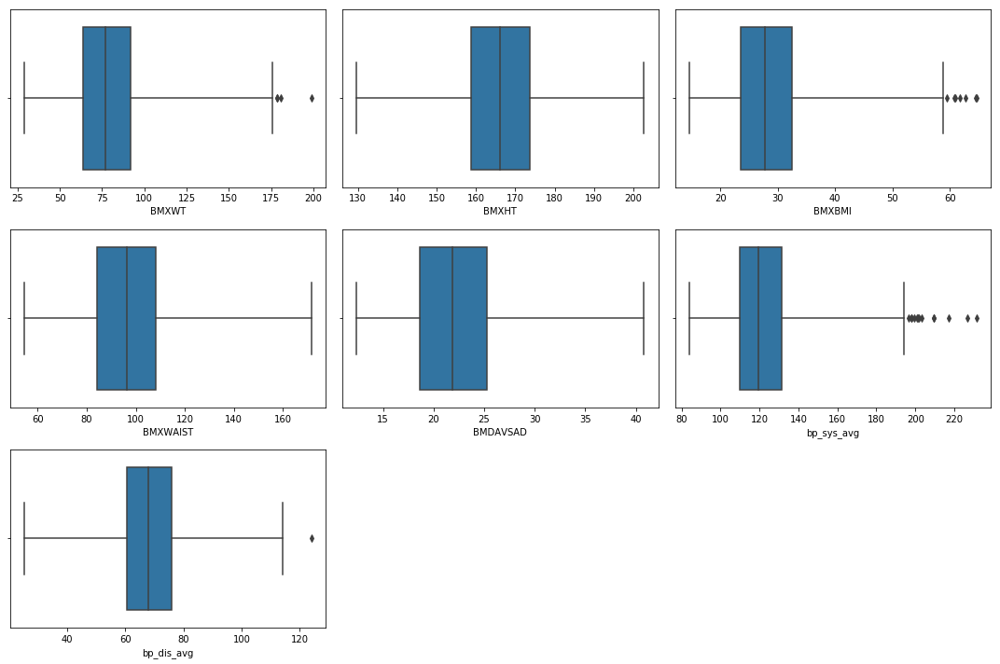

In [207]:
data = nhanes_full_df[body_continuous]

plt.figure(figsize = (15,10)) 
for i, column in enumerate(data.columns):
    plt.subplot(3, 3, i + 1) 
    sns.boxplot(x=column, data=data, whis=3)

plt.tight_layout()
plt.show()

In [208]:
lab_continuous = ['LBXWBCSI', 'LBXLYPCT', 'LBXMOPCT', 'LBXMOPCT', 
                  'LBXNEPCT', 'LBXEOPCT', 'LBXBAPCT', 'LBDLYMNO', 
                  'LBDMONO', 'LBDNENO', 'LBDEONO', 'LBXRBCSI', 
                  'LBXHGB', 'LBXHCT', 'LBXMCVSI', 'LBXMCHSI', 
                  'LBXRDW', 'LBXPLTSI', 'LBXMPSI', 'LBXSAL', 
                  'LBXSAPSI', 'LBXSASSI', 'LBXSATSI', 'LBXSBU', 
                  'LBXSC3SI', 'LBXSCA', 'LBXSCH', 'LBXSCK',
                  'LBXSCLSI', 'LBXSCR', 'LBXSGL', 'LBXSIR', 
                  'LBXSKSI', 'LBXSLDSI', 'LBXSNASI', 'LBXSOSSI', 
                  'LBXSPH', 'LBDSPHSI', 'LBXSTB', 'LBXSTP', 
                  'LBXSTR', 'LBXSUA', 'LBDHDD', 'LBXTC', 
                  'LBXHSCRP']

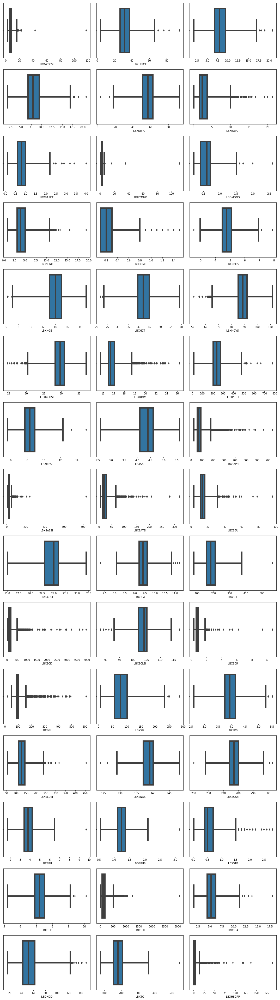

In [209]:
data = nhanes_full_df[lab_continuous]

plt.figure(figsize = (15,60)) 
for i, column in enumerate(data.columns):
    plt.subplot(17, 3, i + 1) 
    sns.boxplot(x=column, data=data, whis=3, linewidth=5)

plt.tight_layout()
plt.show()

In [210]:
diet_continuous = ['tot_kcal_avg', 'tot_pro_avg', 'tot_carb_avg',
                   'tot_sugar_avg', 'tot_fiber_avg', 'tot_fat_avg',
                   'tot_sfat_avg', 'tot_mfat_avg', 'tot_pfat_avg',
                   'tot_fchol_avg', 'tot_vit_e_avg', 'tot_retinol_avg',
                   'tot_vit_a_avg', 'tot_alpha_c_avg', 'tot_beta_c_avg',
                   'tot_beta_cry_avg', 'tot_lyco_avg', 'tot_lutein_avg',
                   'vit_b1_avg', 'vit_b2_avg', 'niac_avg', 
                   'vit_b6_avg', 'folate_avg', 'folic_acid_avg', 
                   'food_fol_avg', 'folate_dfe_avg', 'tot_choline_avg', 
                   'vit_b12_avg', 'vit_c_avg', 'vit_d_avg', 
                   'tot_vit_k_avg', 'calc_avg', 'tot_phos_avg', 
                   'mag_avg', 'fe_avg', 'zn_avg', 
                   'cu_avg', 'na_avg', 'k_avg', 
                   'se_avg', 'tot_mois_avg', 'tot_h20_avg']

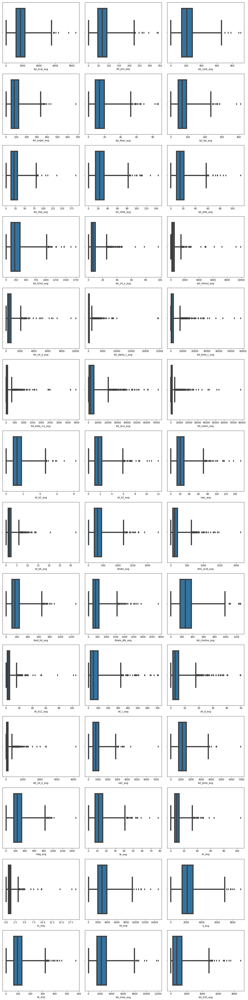

In [211]:
data = nhanes_full_df[diet_continuous]

plt.figure(figsize = (15,60)) 
for i, column in enumerate(data.columns):
    plt.subplot(14, 3, i + 1) 
    sns.boxplot(x=column, data=data, whis=3, linewidth=5)

plt.tight_layout()
plt.show()

In [212]:
supplement_continuous = ['supp_b1_avg', 'supp_b2_avg', 'supp_nia_avg', 
                         'supp_b6_avg', 'supp_b12_avg', 'supp_folate_avg', 
                         'supp_folfde_avg', 'supp_c_avg', 'supp_d_avg', 
                         'supp_ca_avg', 'supp_mg_avg', 'supp_fe_avg', 
                         'supp_zn_avg', 'supp_cu_avg', 'supp_na_avg',
                         'supp_potk_avg', 'supp_se_avg']

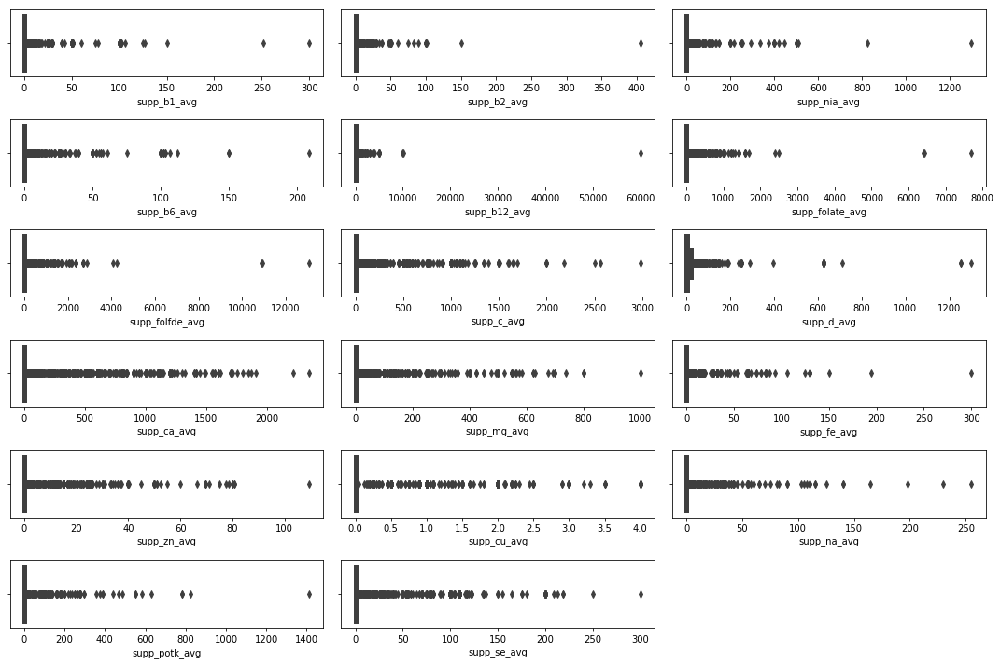

In [213]:
data = nhanes_full_df[supplement_continuous]

plt.figure(figsize = (15,10)) 
for i, column in enumerate(data.columns):
    plt.subplot(6, 3, i + 1) 
    sns.boxplot(x=column, data=data, whis=3, linewidth=5)

plt.tight_layout()
plt.show()

In [214]:
total_intake_continuous = ['tot_kcal_avg', 'tot_pro_avg', 'tot_carb_avg',
                           'tot_sugar_avg', 'tot_fiber_avg', 'tot_fat_avg',
                           'tot_sfat_avg', 'tot_mfat_avg', 'tot_pfat_avg',
                           'tot_fchol_avg', 'tot_vit_e_avg', 'tot_retinol_avg',
                           'tot_vit_a_avg', 'tot_alpha_c_avg', 'tot_beta_c_avg',
                           'tot_beta_cry_avg', 'tot_lyco_avg', 'tot_lutein_avg',
                           'tot_choline_avg', 'tot_vit_k_avg', 'tot_phos_avg',
                           'tot_mois_avg', 'tot_h20_avg', 'tot_b1_avg', 
                           'tot_b2_avg', 'tot_niac_avg', 'tot_b6_avg', 
                           'tot_b12_avg', 'tot_c_avg', 'tot_d_avg', 
                           'tot_calc_avg', 'tot_mag_avg', 'tot_fe_avg',
                           'tot_zn_avg', 'tot_cu_avg', 'tot_na_avg', 
                           'tot_k_avg', 'tot_se_avg', 'tot_folate_avg']

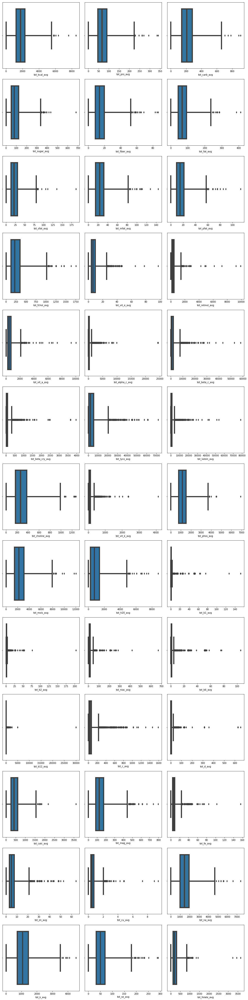

In [215]:
data = nhanes_full_df[total_intake_continuous]

plt.figure(figsize = (15,60)) 
for i, column in enumerate(data.columns):
    plt.subplot(13, 3, i + 1) 
    sns.boxplot(x=column, data=data, whis=3, linewidth=5)

plt.tight_layout()
plt.show()

#### z-score, iqr to determine outliers

In [216]:
continuous_data = ['BMXWT', 'BMXHT', 'BMXBMI', 'BMXWAIST', 'BMDAVSAD',
 'bp_sys_avg', 'bp_dis_avg', 'LBXWBCSI', 'LBXLYPCT',
 'LBXMOPCT', 'LBXNEPCT', 'LBXEOPCT', 'LBXBAPCT',
 'LBDLYMNO', 'LBDMONO', 'LBDNENO', 'LBDEONO',
 'LBXRBCSI', 'LBXHGB', 'LBXHCT', 'LBXMCVSI',
 'LBXMCHSI', 'LBXRDW', 'LBXPLTSI', 'LBXMPSI',
 'LBXSAL', 'LBXSAPSI', 'LBXSASSI', 'LBXSATSI',
 'LBXSBU', 'LBXSC3SI', 'LBXSCA', 'LBXSCH', 'LBXSCK',
 'LBXSCLSI', 'LBXSCR', 'LBXSGL', 'LBXSIR', 'LBXSKSI',
 'LBXSLDSI', 'LBXSNASI', 'LBXSOSSI', 'LBXSPH',
 'LBDSPHSI', 'LBXSTB', 'LBXSTP', 'LBXSTR', 'LBXSUA',
 'LBDHDD', 'LBXTC', 'LBXHSCRP', 'DR1TCAFF', 
 'tot_kcal_avg', 'tot_pro_avg', 'tot_carb_avg',
 'tot_sugar_avg', 'tot_fiber_avg', 'tot_fat_avg',
 'tot_sfat_avg', 'tot_mfat_avg', 'tot_pfat_avg',
 'tot_fchol_avg', 'tot_vit_e_avg', 'tot_retinol_avg',
 'tot_vit_a_avg', 'tot_alpha_c_avg', 'tot_beta_c_avg',
 'tot_beta_cry_avg', 'tot_lyco_avg', 'tot_lutein_avg',
 'vit_b1_avg', 'vit_b2_avg', 'niac_avg', 'vit_b6_avg',
 'folate_avg', 'folic_acid_avg', 'food_fol_avg',
 'folate_dfe_avg', 'tot_choline_avg', 'vit_b12_avg',
 'vit_c_avg', 'vit_d_avg', 'tot_vit_k_avg', 'calc_avg',
 'tot_phos_avg', 'mag_avg', 'fe_avg', 'zn_avg', 'cu_avg',
 'na_avg', 'k_avg', 'se_avg', 'tot_mois_avg', 'tot_h20_avg', 
 'supp_b1_avg', 'supp_b2_avg', 'supp_nia_avg', 'supp_b6_avg',
 'supp_b12_avg', 'supp_folate_avg', 'supp_folfde_avg', 
 'supp_c_avg', 'supp_d_avg', 'supp_ca_avg', 'supp_mg_avg',
 'supp_fe_avg', 'supp_zn_avg', 'supp_cu_avg', 'supp_na_avg',
 'supp_potk_avg', 'supp_se_avg', 'tot_b1_avg', 'tot_b2_avg',
 'tot_niac_avg', 'tot_b6_avg', 'tot_b12_avg', 'tot_c_avg',
 'tot_d_avg', 'tot_calc_avg', 'tot_mag_avg', 'tot_fe_avg',
 'tot_zn_avg', 'tot_cu_avg', 'tot_na_avg', 'tot_k_avg',
 'tot_se_avg', 'tot_folate_avg']

In [217]:
#zscore
z_outliers = []

for i in continuous_data:
    threshold = 4 
    z_scores = zscore(nhanes_full_df[i])
    #for threshold = 4:
    z_outliers = (i)
    print(i)  
    print('The score threshold is: {}'.format(threshold))
    print('Number of outliers is: {}'.format(len((np.where(z_scores > threshold)[0]))))
    

BMXWT
The score threshold is: 4
Number of outliers is: 10
BMXHT
The score threshold is: 4
Number of outliers is: 0
BMXBMI
The score threshold is: 4
Number of outliers is: 14
BMXWAIST
The score threshold is: 4
Number of outliers is: 1
BMDAVSAD
The score threshold is: 4
Number of outliers is: 0
bp_sys_avg
The score threshold is: 4
Number of outliers is: 14
bp_dis_avg
The score threshold is: 4
Number of outliers is: 1
LBXWBCSI
The score threshold is: 4
Number of outliers is: 7
LBXLYPCT
The score threshold is: 4
Number of outliers is: 5
LBXMOPCT
The score threshold is: 4
Number of outliers is: 6
LBXNEPCT
The score threshold is: 4
Number of outliers is: 0
LBXEOPCT
The score threshold is: 4
Number of outliers is: 47
LBXBAPCT
The score threshold is: 4
Number of outliers is: 21
LBDLYMNO
The score threshold is: 4
Number of outliers is: 3
LBDMONO
The score threshold is: 4
Number of outliers is: 18
LBDNENO
The score threshold is: 4
Number of outliers is: 18
LBDEONO
The score threshold is: 4
Numbe

In [218]:
#iqr
for i in continuous_data:
    threshold = 3 
    q75, q25 = np.percentile(nhanes_full_df[i], [75 ,25])
    iqr = q75 - q25

    for threshold in np.arange(3,5,1):
        min_val = q25 - (iqr*threshold)
        max_val = q75 + (iqr*threshold)
        print(i)
        print("The score threshold is: {}".format(threshold))
        print("Number of outliers is: {}".format(
            len((np.where((nhanes_full_df[i] > max_val) 
                      | (nhanes_full_df[i] < min_val))[0]))
        ))

BMXWT
The score threshold is: 3
Number of outliers is: 4
BMXWT
The score threshold is: 4
Number of outliers is: 0
BMXHT
The score threshold is: 3
Number of outliers is: 0
BMXHT
The score threshold is: 4
Number of outliers is: 0
BMXBMI
The score threshold is: 3
Number of outliers is: 7
BMXBMI
The score threshold is: 4
Number of outliers is: 0
BMXWAIST
The score threshold is: 3
Number of outliers is: 0
BMXWAIST
The score threshold is: 4
Number of outliers is: 0
BMDAVSAD
The score threshold is: 3
Number of outliers is: 0
BMDAVSAD
The score threshold is: 4
Number of outliers is: 0
bp_sys_avg
The score threshold is: 3
Number of outliers is: 13
bp_sys_avg
The score threshold is: 4
Number of outliers is: 3
bp_dis_avg
The score threshold is: 3
Number of outliers is: 1
bp_dis_avg
The score threshold is: 4
Number of outliers is: 0
LBXWBCSI
The score threshold is: 3
Number of outliers is: 12
LBXWBCSI
The score threshold is: 4
Number of outliers is: 4
LBXLYPCT
The score threshold is: 3
Number of o

Number of outliers is: 33
food_fol_avg
The score threshold is: 3
Number of outliers is: 23
food_fol_avg
The score threshold is: 4
Number of outliers is: 6
folate_dfe_avg
The score threshold is: 3
Number of outliers is: 30
folate_dfe_avg
The score threshold is: 4
Number of outliers is: 14
tot_choline_avg
The score threshold is: 3
Number of outliers is: 8
tot_choline_avg
The score threshold is: 4
Number of outliers is: 5
vit_b12_avg
The score threshold is: 3
Number of outliers is: 77
vit_b12_avg
The score threshold is: 4
Number of outliers is: 45
vit_c_avg
The score threshold is: 3
Number of outliers is: 37
vit_c_avg
The score threshold is: 4
Number of outliers is: 18
vit_d_avg
The score threshold is: 3
Number of outliers is: 73
vit_d_avg
The score threshold is: 4
Number of outliers is: 37
tot_vit_k_avg
The score threshold is: 3
Number of outliers is: 185
tot_vit_k_avg
The score threshold is: 4
Number of outliers is: 122
calc_avg
The score threshold is: 3
Number of outliers is: 14
calc_a

#### will not use
irq4_outlier = ['bp_sys_avg', 'LBXWBCSI', 'LBXLYPCT', 'LBXMOPCT', 
                'LBXEOPCT', 'LBXBAPCT', 'LBDLYMNO', 'LBDMONO', 
                'LBDNENO', 'LBDEONO', 'LBXRBCSI', 'LBXMCVSI', 'LBXMCHSI', 
                'LBXRDW', 'LBXPLTSI', 'LBXMPSI', 'LBXSAPSI', 'LBXSASSI',
                'LBXSATSI', 'LBXSBU', 'LBXSCA', 'LBXSCH', 'LBXSCK', 
                'LBXSCLSI', 'LBXSCR', 'LBXSGL', 'LBXSIR', 'LBXSLDSI', 
                'LBXSNASI', 'LBXSPH', 'LBDSPHSI', 'LBXSTB', 'LBXSTP', 
                'LBXSTR', 'LBXSUA', 'LBDHDD', 'LBXTC', 'LBXHSCRP', 'DR1TCAFF', 
                'tot_kcal_avg', 'tot_pro_avg', 'tot_carb_avg', 'tot_sugar_avg',
                'tot_fiber_avg', 'tot_fat_avg', 'tot_sfat_avg', 'tot_mfat_avg',
                'tot_pfat_avg', 'tot_fchol_avg', 'tot_vit_e_avg', 'tot_retinol_avg', 
                'tot_vit_a_avg', 'tot_alpha_c_avg', 'tot_beta_c_avg', 'tot_beta_cry_avg', 
                'tot_lyco_avg', 'tot_lutein_avg', 'vit_b1_avg', 'vit_b2_avg',
                'niac_avg', 'vit_b6_avg', 'folate_avg', 'folic_acid_avg',
                'food_fol_avg', 'folate_dfe_avg', 'tot_choline_avg', 
                'vit_b12_avg', 'vit_c_avg', 'vit_d_avg', 'tot_vit_k_avg', 
                'calc_avg', 'tot_phos_avg', 'mag_avg', 'fe_avg', 'zn_avg', 
                'cu_avg', 'na_avg', 'k_avg', 'se_avg', 'tot_mois_avg', 
                'tot_h20_avg', 'tot_b1_avg', 'tot_b2_avg', 'tot_niac_avg', 
                'tot_b6_avg', 'tot_b12_avg', 'tot_c_avg', 'tot_d_avg', 
                'tot_calc_avg', 'tot_mag_avg', 'tot_fe_avg', 'tot_zn_avg', 
                'tot_cu_avg', 'tot_na_avg', 'tot_k_avg', 'tot_se_avg', 
                'tot_folate_avg']

#### comment: fewer outlier columns with iqr but much higher numbers; will use z-score outliers
will also remove total supplement columns and use only food totals and intake totals (which includes supplement totals); have column to determine whether or not individual took supplement

In [219]:
z_outliers = ['BMXWT', 'BMXBMI', 'BMXWAIST', 'bp_sys_avg',
              'bp_dis_avg', 'LBXWBCSI', 'LBXLYPCT', 'LBXMOPCT',
              'LBXEOPCT', 'LBXBAPCT', 'LBDLYMNO', 'LBDMONO',
              'LBDNENO', 'LBDEONO', 'LBXRBCSI', 'LBXHCT',
              'LBXRDW', 'LBXPLTSI', 'LBXMPSI', 'LBXSAPSI', 
              'LBXSASSI', 'LBXSATSI', 'LBXSBU', 'LBXSCA', 
              'LBXSCH', 'LBXSCK', 'LBXSCLSI', 'LBXSCR', 
              'LBXSGL', 'LBXSIR', 'LBXSKSI', 'LBXSLDSI', 
              'LBXSNASI', 'LBXSOSSI', 'LBXSPH', 'LBDSPHSI', 
              'LBXSTB', 'LBXSTP', 'LBXSTR', 'LBXSUA', 'LBDHDD',
              'LBXTC', 'LBXHSCRP', 'DR1TCAFF', 'tot_kcal_avg', 
              'tot_pro_avg', 'tot_carb_avg', 
              'tot_sugar_avg', 'tot_fiber_avg', 'tot_fat_avg',
              'tot_sfat_avg', 'tot_mfat_avg', 'tot_pfat_avg', 
              'tot_fchol_avg', 'tot_vit_e_avg', 'tot_retinol_avg', 
              'tot_vit_a_avg', 'tot_alpha_c_avg', 'tot_beta_c_avg', 
              'tot_beta_cry_avg', 'tot_lyco_avg', 'tot_lutein_avg', 
              'vit_b1_avg', 'vit_b2_avg', 'niac_avg', 'vit_b6_avg', 
              'folate_avg', 'folic_acid_avg', 'food_fol_avg',
              'folate_dfe_avg', 'tot_choline_avg', 'vit_b12_avg', 
              'vit_c_avg', 'vit_d_avg', 'tot_vit_k_avg', 
              'calc_avg', 'tot_phos_avg', 'mag_avg', 'fe_avg',
              'zn_avg', 'cu_avg', 'na_avg', 'k_avg', 'se_avg',
              'tot_mois_avg', 'tot_h20_avg', 'tot_b1_avg', 
              'tot_b2_avg', 'tot_niac_avg', 'tot_b6_avg', 
              'tot_b12_avg', 'tot_c_avg', 'tot_d_avg', 
              'tot_calc_avg', 'tot_mag_avg', 'tot_fe_avg', 
              'tot_zn_avg', 'tot_cu_avg', 'tot_na_avg', 
              'tot_k_avg', 'tot_se_avg', 'tot_folate_avg']

In [220]:
for outlier in z_outliers:
    nhanes_full_df['log_'+ outlier] = np.log(nhanes_full_df[outlier]+1)

In [221]:
nhanes_full_df.head()

,SEQN,RIAGENDR,RIDAGEYR,WTINT2YR,WTMEC2YR,INDFMPIR,MCQ160B,MCQ160C,MCQ160D,MCQ160E,MCQ300A,MCQ365C,MCQ365D,MCQ370A,MCQ370C,MCQ370D,BMXWT,BMXHT,BMXBMI,BMXWAIST,BMDAVSAD,BPQ020,BPQ030,BPQ040A,BPQ050A,BPQ080,BPQ060,BPQ070,BPQ090D,BPQ100D,bp_sys_avg,bp_dis_avg,LBXWBCSI,LBXLYPCT,LBXMOPCT,LBXNEPCT,LBXEOPCT,LBXBAPCT,LBDLYMNO,LBDMONO,LBDNENO,LBDEONO,LBXRBCSI,LBXHGB,LBXHCT,LBXMCVSI,LBXMCHSI,LBXRDW,LBXPLTSI,LBXMPSI,LBXSAL,LBXSAPSI,LBXSASSI,LBXSATSI,LBXSBU,LBXSC3SI,LBXSCA,LBXSCH,LBXSCK,LBXSCLSI,LBXSCR,LBXSGL,LBXSIR,LBXSKSI,LBXSLDSI,LBXSNASI,LBXSOSSI,LBXSPH,LBDSPHSI,LBXSTB,LBXSTP,LBXSTR,LBXSUA,LBDHDD,LBXTC,LBXHSCRP,WTDRD1_x,WTDR2D_x,DRDINT_x,DBQ095Z,DBD100,DRQSPREP,DR1STY,DRQSDIET,DR1TCAFF,DRD360,DR2STY,WTDRD1_x,WTDR2D_x,DS1DS,DS1AN,DS2DS,DS2AN,tot_kcal_avg,tot_pro_avg,tot_carb_avg,tot_sugar_avg,tot_fiber_avg,tot_fat_avg,tot_sfat_avg,tot_mfat_avg,tot_pfat_avg,tot_fchol_avg,tot_vit_e_avg,tot_retinol_avg,tot_vit_a_avg,tot_alpha_c_avg,tot_beta_c_avg,tot_beta_cry_avg,tot_lyco_avg,tot_lutein_avg,vit_b1_avg,vit_b2_avg,niac_avg,vit_b6_avg,folate_avg,folic_acid_avg,food_fol_avg,folate_dfe_avg,tot_choline_avg,vit_b12_avg,vit_c_avg,vit_d_avg,tot_vit_k_avg,calc_avg,tot_phos_avg,mag_avg,fe_avg,zn_avg,cu_avg,na_avg,k_avg,se_avg,tot_mois_avg,tot_h20_avg,supp_b1_avg,supp_b2_avg,supp_nia_avg,supp_b6_avg,supp_b12_avg,supp_folate_avg,supp_folfde_avg,supp_c_avg,supp_d_avg,supp_ca_avg,supp_mg_avg,supp_fe_avg,supp_zn_avg,supp_cu_avg,supp_na_avg,supp_potk_avg,supp_se_avg,tot_b1_avg,tot_b2_avg,tot_niac_avg,tot_b6_avg,tot_b12_avg,tot_c_avg,tot_d_avg,tot_calc_avg,tot_mag_avg,tot_fe_avg,tot_zn_avg,tot_cu_avg,tot_na_avg,tot_k_avg,tot_se_avg,tot_folate_avg,heart_dz,log_BMXWT,log_BMXBMI,log_BMXWAIST,log_bp_sys_avg,log_bp_dis_avg,log_LBXWBCSI,log_LBXLYPCT,log_LBXMOPCT,log_LBXEOPCT,log_LBXBAPCT,log_LBDLYMNO,log_LBDMONO,log_LBDNENO,log_LBDEONO,log_LBXRBCSI,log_LBXHCT,log_LBXRDW,log_LBXPLTSI,log_LBXMPSI,log_LBXSAPSI,log_LBXSASSI,log_LBXSATSI,log_LBXSBU,log_LBXSCA,log_LBXSCH,log_LBXSCK,log_LBXSCLSI,log_LBXSCR,log_LBXSGL,log_LBXSIR,log_LBXSKSI,log_LBXSLDSI,log_LBXSNASI,log_LBXSOSSI,log_LBXSPH,log_LBDSPHSI,log_LBXSTB,log_LBXSTP,log_LBXSTR,log_LBXSUA,log_LBDHDD,log_LBXTC,log_LBXHSCRP,log_DR1TCAFF,log_tot_kcal_avg,log_tot_pro_avg,log_tot_carb_avg,log_tot_sugar_avg,log_tot_fiber_avg,log_tot_fat_avg,log_tot_sfat_avg,log_tot_mfat_avg,log_tot_pfat_avg,log_tot_fchol_avg,log_tot_vit_e_avg,log_tot_retinol_avg,log_tot_vit_a_avg,log_tot_alpha_c_avg,log_tot_beta_c_avg,log_tot_beta_cry_avg,log_tot_lyco_avg,log_tot_lutein_avg,log_vit_b1_avg,log_vit_b2_avg,log_niac_avg,log_vit_b6_avg,log_folate_avg,log_folic_acid_avg,log_food_fol_avg,log_folate_dfe_avg,log_tot_choline_avg,log_vit_b12_avg,log_vit_c_avg,log_vit_d_avg,log_tot_vit_k_avg,log_calc_avg,log_tot_phos_avg,log_mag_avg,log_fe_avg,log_zn_avg,log_cu_avg,log_na_avg,log_k_avg,log_se_avg,log_tot_mois_avg,log_tot_h20_avg,log_tot_b1_avg,log_tot_b2_avg,log_tot_niac_avg,log_tot_b6_avg,log_tot_b12_avg,log_tot_c_avg,log_tot_d_avg,log_tot_calc_avg,log_tot_mag_avg,log_tot_fe_avg,log_tot_zn_avg,log_tot_cu_avg,log_tot_na_avg,log_tot_k_avg,log_tot_se_avg,log_tot_folate_avg
0,83732.0,1,62.0,134671.370419,135629.507405,4.39,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,94.8,184.5,27.8,101.1,22.8,2.0,9.0,9.0,9.0,2.0,1.0,1.0,2.0,9.0,122.666667,65.333333,9.8,23.9,8.2,63.5,4.0,0.5,2.3,0.8,6.2,0.4,4.93,15.2,44.7,90.8,30.8,13.9,181.0,8.3,4.6,52.0,21.0,25.0,13.0,25.0,9.8,172.0,203.0,100.0,0.90,94.0,70.0,4.30,110.0,136.0,272.0,4.7,1.518,0.5,7.5,158.0,4.2,46.0,173.0,0.6,92670.699919,69945.934107,2.0,1.0,3.0,3.0,1.0,2.0,360.0,1.0,1.0,92670.699919,69945.934107,1.0,2.0,1.0,2.0,2262.5,104.815,237.465,80.355,19.75,100.415,31.9250,37.1625,22.6705,386.5,9.605,362.0,651.5,213.5,3297.0,162.0,1460.5,4797.0,2.1855,2.6175,28.0310,2.7810,422.5,161.5,260.5,535.5,415.55,4.450,87.55,6.10,336.20,1028.0,1466.0,294.5,15.840,11.910,1.1800,4864.5,3207.5,140.70,3361.605,1200.0,1.50,1.7,20.0,3.0,25.0,400.0,680.0,60.0,12.5,220.0,50.0,3.15,11.0,0.5,22.5,237.5,19.0,1.84275,2.15875,24.01550,2

In [222]:
log_continuous = ['log_BMXWT', 'log_BMXBMI', 'log_BMXWAIST',
                  'log_bp_sys_avg', 'log_bp_dis_avg', 'log_LBXWBCSI',
                  'log_LBXLYPCT', 'log_LBXMOPCT', 'log_LBXEOPCT',
                  'log_LBXBAPCT', 'log_LBDLYMNO', 'log_LBDMONO',
                  'log_LBDNENO', 'log_LBDEONO', 'log_LBXRBCSI',
                  'log_LBXHCT','log_LBXRDW', 'log_LBXPLTSI',
                  'log_LBXMPSI', 'log_LBXSAPSI', 'log_LBXSASSI',
                  'log_LBXSATSI', 'log_LBXSBU', 'log_LBXSCA',
                  'log_LBXSCH', 'log_LBXSCK', 'log_LBXSCLSI',
                  'log_LBXSCR', 'log_LBXSGL', 'log_LBXSIR',
                  'log_LBXSKSI', 'log_LBXSLDSI', 'log_LBXSNASI',
                  'log_LBXSOSSI', 'log_LBXSPH', 'log_LBDSPHSI',
                  'log_LBXSTB', 'log_LBXSTP', 'log_LBXSTR',
                  'log_LBXSUA', 'log_LBDHDD', 'log_LBXTC',
                  'log_LBXHSCRP', 'log_DR1TCAFF', 'log_tot_kcal_avg',
                  'log_tot_pro_avg', 'log_tot_carb_avg', 'log_tot_sugar_avg',
                  'log_tot_fiber_avg', 'log_tot_fat_avg', 'log_tot_sfat_avg',
                  'log_tot_mfat_avg', 'log_tot_pfat_avg', 'log_tot_fchol_avg',
                  'log_tot_vit_e_avg', 'log_tot_retinol_avg', 'log_tot_vit_a_avg',
                  'log_tot_alpha_c_avg', 'log_tot_beta_c_avg', 'log_tot_beta_cry_avg',
                  'log_tot_lyco_avg', 'log_tot_lutein_avg', 'log_vit_b1_avg',
                  'log_vit_b2_avg', 'log_niac_avg', 'log_vit_b6_avg',
                  'log_folate_avg', 'log_folic_acid_avg', 'log_food_fol_avg',
                  'log_folate_dfe_avg', 'log_tot_choline_avg', 'log_vit_b12_avg',
                  'log_vit_c_avg', 'log_vit_d_avg', 'log_tot_vit_k_avg',
                  'log_calc_avg', 'log_tot_phos_avg', 'log_mag_avg',
                  'log_fe_avg', 'log_zn_avg', 'log_cu_avg',
                  'log_na_avg', 'log_k_avg', 'log_se_avg', 'log_tot_mois_avg',
                  'log_tot_h20_avg', 'log_tot_b1_avg', 'log_tot_b2_avg',
                  'log_tot_niac_avg', 'log_tot_b6_avg', 'log_tot_b12_avg',
                  'log_tot_c_avg', 'log_tot_d_avg', 'log_tot_calc_avg',
                  'log_tot_mag_avg', 'log_tot_fe_avg', 'log_tot_zn_avg',
                  'log_tot_cu_avg', 'log_tot_na_avg', 'log_tot_k_avg',
                  'log_tot_se_avg', 'log_tot_folate_avg']

In [223]:
for i in log_continuous:
    threshold = 4 
    z_scores = zscore(nhanes_full_df[i])
    #for threshold = 4:
    z_outliers = np.where(z_scores > threshold)
    print(i)  
    print('The score threshold is: {}'.format(threshold))
    print('Number of outliers is: {}'.format(len((np.where(z_scores > threshold)[0]))))
    

log_BMXWT
The score threshold is: 4
Number of outliers is: 0
log_BMXBMI
The score threshold is: 4
Number of outliers is: 0
log_BMXWAIST
The score threshold is: 4
Number of outliers is: 0
log_bp_sys_avg
The score threshold is: 4
Number of outliers is: 3
log_bp_dis_avg
The score threshold is: 4
Number of outliers is: 0
log_LBXWBCSI
The score threshold is: 4
Number of outliers is: 4
log_LBXLYPCT
The score threshold is: 4
Number of outliers is: 1
log_LBXMOPCT
The score threshold is: 4
Number of outliers is: 0
log_LBXEOPCT
The score threshold is: 4
Number of outliers is: 2
log_LBXBAPCT
The score threshold is: 4
Number of outliers is: 12
log_LBDLYMNO
The score threshold is: 4
Number of outliers is: 3
log_LBDMONO
The score threshold is: 4
Number of outliers is: 5
log_LBDNENO
The score threshold is: 4
Number of outliers is: 1
log_LBDEONO
The score threshold is: 4
Number of outliers is: 29
log_LBXRBCSI
The score threshold is: 4
Number of outliers is: 2
log_LBXHCT
The score threshold is: 4
Numbe

#### outliers have been significantly reduced, but not eliminated
will not attempt to completely remove outliers secondary to need to consider exteme values in dietary intake of population; these extreme values may be key in determining the classification of the target value

**remaining_ outliers** =  'log_bp_sys_avg', 'log_LBXWBCSI', 'log_LBXBAPCT', 'log_LBDLYMNO', 'log_LBDMONO', 'log_LBDNENO', 'log_LBXRBCSI', 'log_LBXRDW', 'log_LBXPLTSI', 'log_LBXMPSI',                        'log_LBXSAPSI', 'log_LBXSASSI', 'log_LBXSATSI', 'log_LBXSBU', 'log_LBXSCA', 'log_LBXSCH', 'log_LBXSCK', 'log_LBXSCLSI', 'log_LBXSCR', 'log_LBXSGL', 'log_LBXSKSI', 'log_LBXSLDSI',                        'log_LBXSNASI', 'log_LBXSOSSI', 'log_LBXSPH', 'log_LBDSPHSI', 'log_LBXSTP', 'log_LBXSTR', 'log_LBXSUA', 'log_LBXTC'

#### comment:  will not use supplement totals (contain 0.0); will only use totals 
'supp_b1_avg', 'supp_b2_avg', 'supp_nia_avg', 'supp_b6_avg', 
'supp_b12_avg', 'supp_folate_avg', 'supp_folfde_avg', 'supp_c_avg', 
'supp_d_avg', 'supp_ca_avg', 'supp_mg_avg', 'supp_fe_avg', 
'supp_zn_avg', 'supp_cu_avg', 'supp_na_avg', 'supp_potk_avg', 
'supp_se_avg',

# data exploration and visualization

## summary statistics

In [224]:
nhanes_full_df.describe()

,SEQN,RIAGENDR,RIDAGEYR,WTINT2YR,WTMEC2YR,INDFMPIR,MCQ160B,MCQ160C,MCQ160D,MCQ160E,MCQ300A,MCQ365C,MCQ365D,MCQ370A,MCQ370C,MCQ370D,BMXWT,BMXHT,BMXBMI,BMXWAIST,BMDAVSAD,BPQ020,BPQ030,BPQ040A,BPQ050A,BPQ080,BPQ060,BPQ070,BPQ090D,BPQ100D,bp_sys_avg,bp_dis_avg,LBXWBCSI,LBXLYPCT,LBXMOPCT,LBXNEPCT,LBXEOPCT,LBXBAPCT,LBDLYMNO,LBDMONO,LBDNENO,LBDEONO,LBXRBCSI,LBXHGB,LBXHCT,LBXMCVSI,LBXMCHSI,LBXRDW,LBXPLTSI,LBXMPSI,LBXSAL,LBXSAPSI,LBXSASSI,LBXSATSI,LBXSBU,LBXSC3SI,LBXSCA,LBXSCH,LBXSCK,LBXSCLSI,LBXSCR,LBXSGL,LBXSIR,LBXSKSI,LBXSLDSI,LBXSNASI,LBXSOSSI,LBXSPH,LBDSPHSI,LBXSTB,LBXSTP,LBXSTR,LBXSUA,LBDHDD,LBXTC,LBXHSCRP,WTDRD1_x,WTDR2D_x,DRDINT_x,DBQ095Z,DBD100,DRQSPREP,DR1STY,DRQSDIET,DR1TCAFF,DRD360,DR2STY,WTDRD1_x,WTDR2D_x,DS1DS,DS1AN,DS2DS,DS2AN,tot_kcal_avg,tot_pro_avg,tot_carb_avg,tot_sugar_avg,tot_fiber_avg,tot_fat_avg,tot_sfat_avg,tot_mfat_avg,tot_pfat_avg,tot_fchol_avg,tot_vit_e_avg,tot_retinol_avg,tot_vit_a_avg,tot_alpha_c_avg,tot_beta_c_avg,tot_beta_cry_avg,tot_lyco_avg,tot_lutein_avg,vit_b1_avg,vit_b2_avg,niac_avg,vit_b6_avg,folate_avg,folic_acid_avg,food_fol_avg,folate_dfe_avg,tot_choline_avg,vit_b12_avg,vit_c_avg,vit_d_avg,tot_vit_k_avg,calc_avg,tot_phos_avg,mag_avg,fe_avg,zn_avg,cu_avg,na_avg,k_avg,se_avg,tot_mois_avg,tot_h20_avg,supp_b1_avg,supp_b2_avg,supp_nia_avg,supp_b6_avg,supp_b12_avg,supp_folate_avg,supp_folfde_avg,supp_c_avg,supp_d_avg,supp_ca_avg,supp_mg_avg,supp_fe_avg,supp_zn_avg,supp_cu_avg,supp_na_avg,supp_potk_avg,supp_se_avg,tot_b1_avg,tot_b2_avg,tot_niac_avg,tot_b6_avg,tot_b12_avg,tot_c_avg,tot_d_avg,tot_calc_avg,tot_mag_avg,tot_fe_avg,tot_zn_avg,tot_cu_avg,tot_na_avg,tot_k_avg,tot_se_avg,tot_folate_avg,heart_dz,log_BMXWT,log_BMXBMI,log_BMXWAIST,log_bp_sys_avg,log_bp_dis_avg,log_LBXWBCSI,log_LBXLYPCT,log_LBXMOPCT,log_LBXEOPCT,log_LBXBAPCT,log_LBDLYMNO,log_LBDMONO,log_LBDNENO,log_LBDEONO,log_LBXRBCSI,log_LBXHCT,log_LBXRDW,log_LBXPLTSI,log_LBXMPSI,log_LBXSAPSI,log_LBXSASSI,log_LBXSATSI,log_LBXSBU,log_LBXSCA,log_LBXSCH,log_LBXSCK,log_LBXSCLSI,log_LBXSCR,log_LBXSGL,log_LBXSIR,log_LBXSKSI,log_LBXSLDSI,log_LBXSNASI,log_LBXSOSSI,log_LBXSPH,log_LBDSPHSI,log_LBXSTB,log_LBXSTP,log_LBXSTR,log_LBXSUA,log_LBDHDD,log_LBXTC,log_LBXHSCRP,log_DR1TCAFF,log_tot_kcal_avg,log_tot_pro_avg,log_tot_carb_avg,log_tot_sugar_avg,log_tot_fiber_avg,log_tot_fat_avg,log_tot_sfat_avg,log_tot_mfat_avg,log_tot_pfat_avg,log_tot_fchol_avg,log_tot_vit_e_avg,log_tot_retinol_avg,log_tot_vit_a_avg,log_tot_alpha_c_avg,log_tot_beta_c_avg,log_tot_beta_cry_avg,log_tot_lyco_avg,log_tot_lutein_avg,log_vit_b1_avg,log_vit_b2_avg,log_niac_avg,log_vit_b6_avg,log_folate_avg,log_folic_acid_avg,log_food_fol_avg,log_folate_dfe_avg,log_tot_choline_avg,log_vit_b12_avg,log_vit_c_avg,log_vit_d_avg,log_tot_vit_k_avg,log_calc_avg,log_tot_phos_avg,log_mag_avg,log_fe_avg,log_zn_avg,log_cu_avg,log_na_avg,log_k_avg,log_se_avg,log_tot_mois_avg,log_tot_h20_avg,log_tot_b1_avg,log_tot_b2_avg,log_tot_niac_avg,log_tot_b6_avg,log_tot_b12_avg,log_tot_c_avg,log_tot_d_avg,log_tot_calc_avg,log_tot_mag_avg,log_tot_fe_avg,log_tot_zn_avg,log_tot_cu_avg,log_tot_na_avg,log_tot_k_avg,log_tot_se_avg,log_tot_folate_avg
count,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.00000,4712.000000,4712.000000,4712.000000,4712.00000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4

In [225]:
continuous_data_df = nhanes_full_df[['RIDAGEYR', 'BMXWT', 'BMXHT', 'BMXBMI', 'BMXWAIST', 'BMDAVSAD',
 'bp_sys_avg', 'bp_dis_avg', 'LBXWBCSI', 'LBXLYPCT',
 'LBXMOPCT', 'LBXNEPCT', 'LBXEOPCT', 'LBXBAPCT',
 'LBDLYMNO', 'LBDMONO', 'LBDNENO', 'LBDEONO',
 'LBXRBCSI', 'LBXHGB', 'LBXHCT', 'LBXMCVSI',
 'LBXMCHSI', 'LBXRDW', 'LBXPLTSI', 'LBXMPSI',
 'LBXSAL', 'LBXSAPSI', 'LBXSASSI', 'LBXSATSI',
 'LBXSBU', 'LBXSC3SI', 'LBXSCA', 'LBXSCH', 'LBXSCK',
 'LBXSCLSI', 'LBXSCR', 'LBXSGL', 'LBXSIR', 'LBXSKSI',
 'LBXSLDSI', 'LBXSNASI', 'LBXSOSSI', 'LBXSPH',
 'LBDSPHSI', 'LBXSTB', 'LBXSTP', 'LBXSTR', 'LBXSUA',
 'LBDHDD', 'LBXTC', 'LBXHSCRP', 'DR1TCAFF', 
 'tot_kcal_avg', 'tot_pro_avg', 'tot_carb_avg',
 'tot_sugar_avg', 'tot_fiber_avg', 'tot_fat_avg',
 'tot_sfat_avg', 'tot_mfat_avg', 'tot_pfat_avg',
 'tot_fchol_avg', 'tot_vit_e_avg', 'tot_retinol_avg',
 'tot_vit_a_avg', 'tot_alpha_c_avg', 'tot_beta_c_avg',
 'tot_beta_cry_avg', 'tot_lyco_avg', 'tot_lutein_avg',
 'vit_b1_avg', 'vit_b2_avg', 'niac_avg', 'vit_b6_avg',
 'folate_avg', 'folic_acid_avg', 'food_fol_avg',
 'folate_dfe_avg', 'tot_choline_avg', 'vit_b12_avg',
 'vit_c_avg', 'vit_d_avg', 'tot_vit_k_avg', 'calc_avg',
 'tot_phos_avg', 'mag_avg', 'fe_avg', 'zn_avg', 'cu_avg',
 'na_avg', 'k_avg', 'se_avg', 'tot_mois_avg', 'tot_h20_avg', 
 'supp_b1_avg', 'supp_b2_avg', 'supp_nia_avg', 'supp_b6_avg',
 'supp_b12_avg', 'supp_folate_avg', 'supp_folfde_avg', 
 'supp_c_avg', 'supp_d_avg', 'supp_ca_avg', 'supp_mg_avg',
 'supp_fe_avg', 'supp_zn_avg', 'supp_cu_avg', 'supp_na_avg',
 'supp_potk_avg', 'supp_se_avg', 'tot_b1_avg', 'tot_b2_avg',
 'tot_niac_avg', 'tot_b6_avg', 'tot_b12_avg', 'tot_c_avg',
 'tot_d_avg', 'tot_calc_avg', 'tot_mag_avg', 'tot_fe_avg',
 'tot_zn_avg', 'tot_cu_avg', 'tot_na_avg', 'tot_k_avg',
 'tot_se_avg', 'tot_folate_avg', 'heart_dz']]

In [226]:
continuous_data_df.groupby('heart_dz').describe()

RIDAGEYR                                                       BMXWT  \
            count       mean        std   min   25%   50%   75%   max   count   
heart_dz                                                                        
0          4403.0  41.387917  19.785041  12.0  24.0  41.0  58.0  80.0  4403.0   
1           309.0  65.582524  12.059262  31.0  59.0  68.0  76.0  80.0   309.0   

                                                                BMXHT  \
               mean        std   min   25%   50%   75%    max   count   
heart_dz                                                                
0         79.136339  22.090336  29.0  63.4  76.0  91.2  198.9  4403.0   
1         87.239482  22.758301  32.4  72.2  84.0  99.1  178.3   309.0   

                                                                    BMXBMI  \
                mean        std    min    25%    50%    75%    max   count   
heart_dz                                                                     
0         166.172246  10.075509  129.7  158.7  165.9  173.5  202.7  4403.0   
1         167.065372   9.426837  137.4  160.6  167.7  174.0  187.7   309.0   

                                                            BMXWAIST  \
               mean       std   min   25%   50%   75%   max    count   
heart_dz                                                               
0         28.523461  7.039455  14.6  23.4  27.6  32.3  64.6   4403.0   
1         31.161812  7.424536  16.9  26.0  30.0  34.7  64.5    309.0   

                                                                 BMDAVSAD  \
                mean        std   min   25%    50%    75%    max    count   
heart_dz                                                                    
0          96.663797  17.599170  54.6  83.5   95.6  107.4  171.6   4403.0   
1         108.002265  16.154535  71.6  97.1  107.0  117.1  160.0    309.0   

                                                            bp_sys_avg  \
               mean       std   min   25%   50%   75%   max      count   
heart_dz                                                                 
0         22.018010  4.662452  12.4  18.4  21.6  25.1  39.9     4403.0   
1         25.290291  4.673270  14.5  21.7  25.2  28.1  40.8      309.0   

                                                                           \
                mean        std   min         25%         50%         75%   
heart_dz                                                                    
0         121.727913  17.060301  84.0  110.000000  119.333333  130.000000   
1         130.592233  22.027249  86.0  114.666667  127.333333  141.333333   

                     bp_dis_avg                                              \
                 max      count       mean        std        min        25%   
heart_dz                                                                      
0         231.333333     4403.0  68.382542  11.814519  25.333333  60.666667   
1         217.333333      309.0  66.865156  12.815660  31.000000  56.666667   

                                      LBXWBCSI                                \
                50%        75%    max    count      mean       std  min  25%   
heart_dz                                                                       
0         68.000000  76.000000  124.0   4403.0  7.271542  2.071086  2.4  5.8   
1         66.666667  75.333333  114.0    309.0  8.075405  6.934666  3.3  6.0   

                          LBXLYPCT                                        \
          50%  75%    max    count       mean       std  min   25%   50%   
heart_dz                                                                   
0         7.0  8.4   23.0   4403.0  32.106496  8.353170  5.4  26.5  31.6   
1         7.2  9.0  117.2    309.0  27.962783  9.941034  3.7  21.6  27.2   

                     LBXMOPCT                                                \
           75%   max    count      mean      std  min  25%  50%   75%   max   
heart_

In [227]:
categorical_data_df = nhanes_full_df[['MCQ160B', 'MCQ160C', 'MCQ160D',
                                      'MCQ160E', 'MCQ300A', 'MCQ365C',
                                      'MCQ365D', 'MCQ370A', 'MCQ370C',
                                      'MCQ370D', 'BPQ020', 'BPQ030',
                                      'BPQ040A', 'BPQ050A', 'BPQ080',
                                      'BPQ060', 'BPQ070', 'BPQ090D',
                                      'BPQ100D', 'DBQ095Z', 'DBD100',
                                      'DRQSPREP', 'DR1STY', 'DRQSDIET',
                                      'DR1TCAFF', 'DRD360', 'DR2STY', 
                                      'DS1DS', 'DS1AN', 'DS2DS', 
                                      'DS2AN', 'heart_dz']]


In [228]:
categorical_data_df.groupby('heart_dz').describe()

MCQ160B                                              MCQ160C  \
           count      mean       std  min  25%  50%  75%  max   count   
heart_dz                                                                
0         4403.0  3.362480  2.771778  2.0  2.0  2.0  2.0  9.0  4403.0   
1          309.0  1.728155  1.052463  1.0  1.0  2.0  2.0  9.0   309.0   

                                                      MCQ160D            \
              mean       std  min  25%  50%  75%  max   count      mean   
heart_dz                                                                  
0         3.378378  2.783969  2.0  2.0  2.0  2.0  9.0  4403.0  3.368839   
1         1.624595  1.069733  1.0  1.0  2.0  2.0  9.0   309.0  1.763754   

                                            MCQ160E                           \
               std  min  25%  50%  75%  max   count      mean       std  min   
heart_dz                                                                       
0         2.776672  2.0  2.0  2.0  2.0  9.0  4403.0  3.370429  2.777891  2.0   
1         0.852335  1.0  1.0  2.0  2.0  9.0   309.0  1.511327  0.657648  1.0   

                             MCQ300A                                          \
          25%  50%  75%  max   count      mean       std  min  25%  50%  75%   
heart_dz                                                                       
0         2.0  2.0  2.0  9.0  4403.0  3.402907  2.930252  1.0  2.0  2.0  2.0   
1         1.0  1.0  2.0  9.0   309.0  1.928803  1.341682  1.0  1.0  2.0  2.0   

              MCQ365C                                              MCQ365D  \
          max   count      mean       std  min  25%  50%  75%  max   count   
heart_dz                                                                     
0         9.0  4403.0  2.528503  2.271206  1.0  2.0  2.0  2.0  9.0  4403.0   
1         9.0   309.0  1.430421  0.495938  1.0  1.0  1.0  2.0  2.0   309.0   

                                                      MCQ370A            \
              mean       std  min  25%  50%  75%  max   count      mean   
heart_dz                                                                  
0         2.487622  2.283719  1.0  1.0  2.0  2.0  9.0  4403.0  2.188962   
1         1.472492  0.500053  1.0  1.0  1.0  2.0  2.0   309.0  1.249191   

                                            MCQ370C                           \
               std  min  25%  50%  75%  max   count      mean       std  min   
heart_dz                                                                       
0         2.388199  1.0  1.0  1.0  2.0  9.0  4403.0  2.310697  2.346949  1.0   
1         0.433246  1.0  1.0  1.0  1.0  2.0   309.0  1.307443  0.462183  1.0   

                             MCQ370D                                          \
          25%  50%  75%  max   count      mean       std  min  25%  50%  75%   
heart_dz                                                                       
0         1.0  2.0  2.0  9.0  4403.0  2.248467  2.364846  1.0  1.0  2.0  2.0   
1         1.0  1.0  2.0  2.0   309.0  1.343042  0.638682  1.0  1.0  1.0  2.0   

               BPQ020                                              BPQ030  \
          max   count      mean      std  min  25%  50%  75%  max   count   
heart_dz                                                                    
0         9.0  4403.0  2.478764  2.28753  1.0  1.0  2.0  2.0  9.0  4403.0   
1         9.0   309.0  1.252427  0.43511  1.0  1.0  1.0  2.0  2.0   309.0   

                                                      BPQ040A            \
              mean       std  min  25%  50%  75%  max   count      mean   
heart_dz                                                                  
0         6.962980  3.430658  1.0  2.0  9.0  9.0  9.0  4403.0  6.928458   
1         3.132686  3.429039  1.0  1.0  1.0  9.0  9.0   309.0  3.058252   

                                            BPQ050A                           \
               std  min  25%  50%  75%  max   count   

#### First look:
On average, those with indicator for heart disease are older, weigh more, have higher BMI, larger waist circumference, larger sagittal abdominal diameter, higher systolic blood pressure, higher cbc markers for LBXWBCSI, LBXMOPCT, LBXNEPCT, LBXEOPCT, LBXBAPCT, LBDLYMNO, LBDMONO, LBDNENO, LBDEONO, LBXMCVSI, LBXMCHSI, LBXRDW, LBXMPSI, LBXSASSI, LBXSBU, LBXSC3SI, LBXSCR, LBXSGL, LBXSKSI, LBXSLDSI, LBXSOSSI, LBXSTB, LBXSTR, LBXSUA, LBXHSCRP, 

use more salt, drink more caffeine, consume more cholesterol, retinol, vitamin A, B2, choline, B12, C, D, copper, potassium, and more supplements 

lower cbc markers for LBXLYPCT, LBXRBCSI, LBXHGB, LBXHCT, LBXPLTSI, LBXSAL, LBXSAPSI, LBXSATSI, LBXSCA, LBXSCH, LBXSCK, LBXSCLSI, LBXSIR, LBXSNASI, LBXSPH, LBDSPHSI, LBXSTP, LBDHDD, LBXTC, eat less fish, 
consume less calories, protein, carbohydrates, sugar, fiber, fat, vitamin E, lycopene, lutein, vitamin B1, B2, niacin, B6, folate, folic acid, food folate, folatae DFE, vitamin K, calcium, phosphorus, magnesium, iron, zinc, sodium, selenium, than those without heart disease. 

## visualization

### categorical values

In [229]:
# original columns, prior to encoding
categorical_values = ['MCQ160B', 'MCQ160C', 'MCQ160D', 'MCQ160E', 
                      'MCQ300A', 'MCQ365C', 'MCQ365D', 'MCQ370A', 
                      'MCQ370C', 'MCQ370D', 'BPQ020', 'BPQ030',
                      'BPQ040A', 'BPQ050A', 'BPQ080', 'BPQ060', 
                      'BPQ070', 'BPQ090D', 'BPQ100D', 'DBQ095Z', 
                      'DBD100', 'DRQSPREP', 'DR1STY', 'DRQSDIET',
                      'DR1TCAFF', 'DRD360', 'DR2STY', 'DS1DS', 
                      'DS1AN', 'DS2DS', 'DS2AN', 'heart_dz']

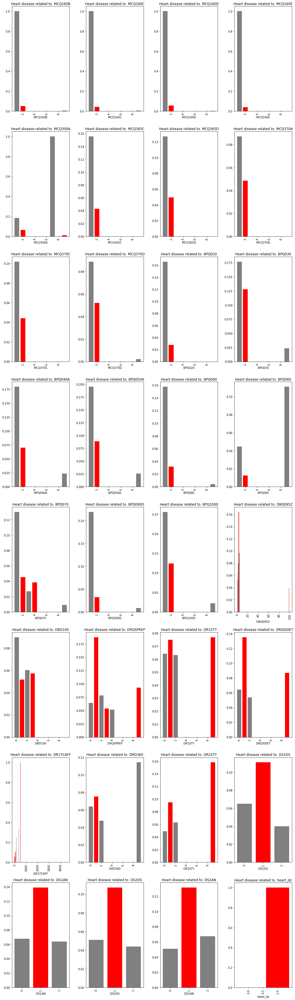

In [230]:
plt.figure(figsize=(15,50))

for index, column in enumerate(categorical_values):
    plt.subplot(8,4,index+1)
    plt.bar(nhanes_full_df.groupby(column)['heart_dz'].mean().index, nhanes_full_df.groupby(column)['heart_dz'].mean(),
           color=('grey','red'))
    plt.title('Heart disease related to. {}'.format(column))
    plt.xlabel(column)
    plt.xticks(rotation='vertical')

plt.tight_layout()
plt.show()

### continuous variables

In [231]:
continuous_values = ['RIDAGEYR','BMXWT', 'BMXHT', 'BMXBMI',
                     'BMXWAIST', 'BMDAVSAD','bp_sys_avg', 'bp_dis_avg', 
                     'LBXWBCSI', 'LBXLYPCT', 'LBXMOPCT', 'LBXNEPCT', 
                     'LBXEOPCT', 'LBXBAPCT', 'LBDLYMNO', 'LBDMONO', 
                     'LBDNENO', 'LBDEONO', 'LBXRBCSI', 'LBXHGB', 
                     'LBXHCT', 'LBXMCVSI', 'LBXMCHSI', 'LBXRDW', 
                     'LBXPLTSI', 'LBXMPSI', 'LBXSAL', 'LBXSAPSI', 
                     'LBXSASSI', 'LBXSATSI', 'LBXSBU', 'LBXSC3SI', 
                     'LBXSCA', 'LBXSCH', 'LBXSCK', 'LBXSCLSI', 
                     'LBXSCR', 'LBXSGL', 'LBXSIR', 'LBXSKSI',
                     'LBXSLDSI', 'LBXSNASI', 'LBXSOSSI', 'LBXSPH',
                     'LBDSPHSI', 'LBXSTB', 'LBXSTP', 'LBXSTR', 
                     'LBXSUA', 'LBDHDD', 'LBXTC', 'LBXHSCRP', 
                     'DR1TCAFF', 'tot_kcal_avg', 'tot_pro_avg', 
                     'tot_carb_avg', 'tot_sugar_avg', 'tot_fiber_avg', 
                     'tot_fat_avg', 'tot_sfat_avg', 'tot_mfat_avg', 
                     'tot_pfat_avg', 'tot_fchol_avg', 'tot_vit_e_avg', 
                     'tot_retinol_avg', 'tot_vit_a_avg', 'tot_alpha_c_avg', 
                     'tot_beta_c_avg', 'tot_beta_cry_avg', 'tot_lyco_avg', 
                     'tot_lutein_avg', 'vit_b1_avg', 'vit_b2_avg', 
                     'niac_avg', 'vit_b6_avg', 'folate_avg', 
                     'folic_acid_avg', 'food_fol_avg', 'folate_dfe_avg', 
                     'tot_choline_avg', 'vit_b12_avg', 'vit_c_avg', 
                     'vit_d_avg', 'tot_vit_k_avg', 'calc_avg',
                     'tot_phos_avg', 'mag_avg', 'fe_avg', 'zn_avg', 
                     'cu_avg', 'na_avg', 'k_avg', 'se_avg', 'tot_mois_avg',
                     'tot_h20_avg', 'supp_b1_avg', 'supp_b2_avg', 
                     'supp_nia_avg', 'supp_b6_avg', 'supp_b12_avg', 
                     'supp_folate_avg', 'supp_folfde_avg', 'supp_c_avg', 
                     'supp_d_avg', 'supp_ca_avg', 'supp_mg_avg',
                     'supp_fe_avg', 'supp_zn_avg', 'supp_cu_avg', 
                     'supp_na_avg', 'supp_potk_avg', 'supp_se_avg', 
                     'tot_b1_avg', 'tot_b2_avg', 'tot_niac_avg', 
                     'tot_b6_avg', 'tot_b12_avg', 'tot_c_avg',
                     'tot_d_avg', 'tot_calc_avg', 'tot_mag_avg', 
                     'tot_fe_avg', 'tot_zn_avg', 'tot_cu_avg', 'tot_na_avg',
                     'tot_k_avg', 'tot_se_avg', 'tot_folate_avg']


In [232]:
len(continuous_values)

128

In [233]:
log_values = ['log_BMXWT', 'log_BMXBMI', 'log_BMXWAIST',
                  'log_bp_sys_avg', 'log_bp_dis_avg', 'log_LBXWBCSI',
                  'log_LBXLYPCT', 'log_LBXMOPCT', 'log_LBXEOPCT',
                  'log_LBXBAPCT', 'log_LBDLYMNO', 'log_LBDMONO',
                  'log_LBDNENO', 'log_LBDEONO', 'log_LBXRBCSI',
                  'log_LBXHCT','log_LBXRDW', 'log_LBXPLTSI',
                  'log_LBXMPSI', 'log_LBXSAPSI', 'log_LBXSASSI',
                  'log_LBXSATSI', 'log_LBXSBU', 'log_LBXSCA',
                  'log_LBXSCH', 'log_LBXSCK', 'log_LBXSCLSI',
                  'log_LBXSCR', 'log_LBXSGL', 'log_LBXSIR',
                  'log_LBXSKSI', 'log_LBXSLDSI', 'log_LBXSNASI',
                  'log_LBXSOSSI', 'log_LBXSPH', 'log_LBDSPHSI',
                  'log_LBXSTB', 'log_LBXSTP', 'log_LBXSTR',
                  'log_LBXSUA', 'log_LBDHDD', 'log_LBXTC',
                  'log_LBXHSCRP', 'log_DR1TCAFF', 'log_tot_kcal_avg',
                  'log_tot_pro_avg', 'log_tot_carb_avg', 'log_tot_sugar_avg',
                  'log_tot_fiber_avg', 'log_tot_fat_avg', 'log_tot_sfat_avg',
                  'log_tot_mfat_avg', 'log_tot_pfat_avg', 'log_tot_fchol_avg',
                  'log_tot_vit_e_avg', 'log_tot_retinol_avg', 'log_tot_vit_a_avg',
                  'log_tot_alpha_c_avg', 'log_tot_beta_c_avg', 'log_tot_beta_cry_avg',
                  'log_tot_lyco_avg', 'log_tot_lutein_avg', 'log_vit_b1_avg',
                  'log_vit_b2_avg', 'log_niac_avg', 'log_vit_b6_avg',
                  'log_folate_avg', 'log_folic_acid_avg', 'log_food_fol_avg',
                  'log_folate_dfe_avg', 'log_tot_choline_avg', 'log_vit_b12_avg',
                  'log_vit_c_avg', 'log_vit_d_avg', 'log_tot_vit_k_avg',
                  'log_calc_avg', 'log_tot_phos_avg', 'log_mag_avg',
                  'log_fe_avg', 'log_zn_avg', 'log_cu_avg',
                  'log_na_avg', 'log_k_avg', 'log_se_avg', 'log_tot_mois_avg',
                  'log_tot_h20_avg', 'log_tot_b1_avg', 'log_tot_b2_avg',
                  'log_tot_niac_avg', 'log_tot_b6_avg', 'log_tot_b12_avg',
                  'log_tot_c_avg', 'log_tot_d_avg', 'log_tot_calc_avg',
                  'log_tot_mag_avg', 'log_tot_fe_avg', 'log_tot_zn_avg',
                  'log_tot_cu_avg', 'log_tot_na_avg', 'log_tot_k_avg',
                  'log_tot_se_avg', 'log_tot_folate_avg']

In [234]:
len(log_values)

102

### break up continuous values into groups for easier viewing

In [235]:
body_continuous = nhanes_full_df[['BMXWT', 'BMXHT', 'BMXBMI', 'BMXWAIST', 'BMDAVSAD',
                   'bp_sys_avg', 'bp_dis_avg']]

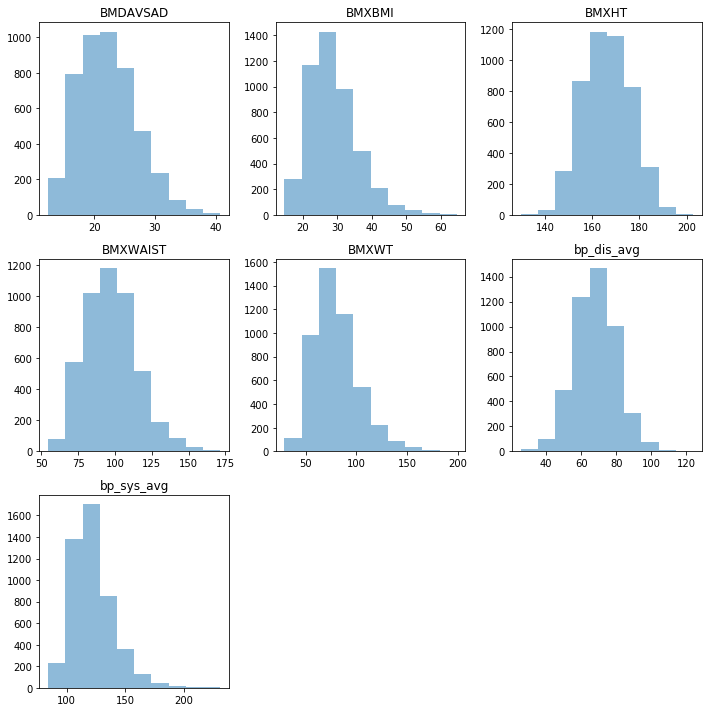

In [236]:
body_continuous.hist(grid=False, alpha=0.5, figsize=(10, 10))
plt.tight_layout()

#### comment: would anticipte these values to be normal distribution as they are body measurements

In [237]:
body_log_continuous = nhanes_full_df[['log_BMXWT', 'log_BMXBMI', 'log_BMXWAIST',
                  'log_bp_sys_avg', 'log_bp_dis_avg']]

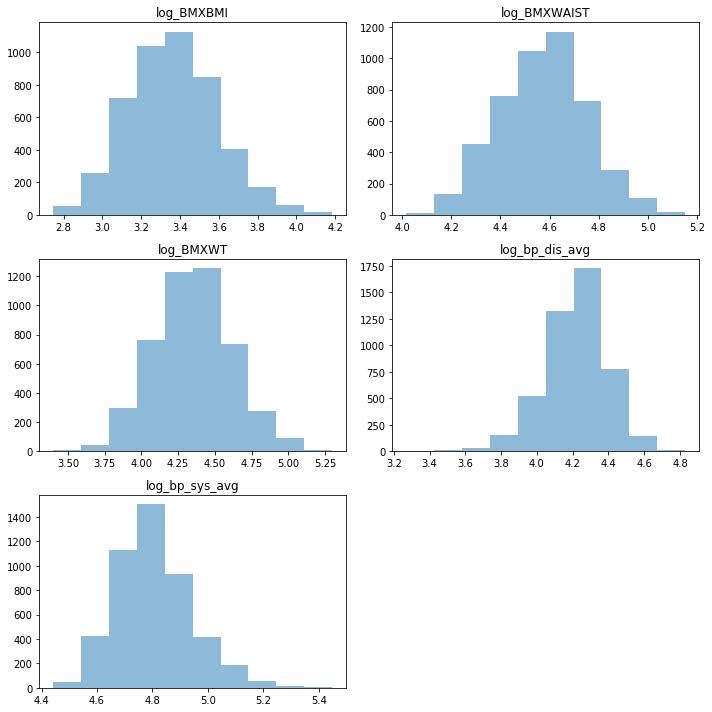

In [238]:
body_log_continuous.hist(grid=False, alpha=0.5, figsize=(10, 10))
plt.tight_layout()

In [239]:
lab_continuous = nhanes_full_df[['LBXWBCSI', 'LBXLYPCT', 'LBXMOPCT', 'LBXMOPCT', 
                  'LBXNEPCT', 'LBXEOPCT', 'LBXBAPCT', 'LBDLYMNO', 
                  'LBDMONO', 'LBDNENO', 'LBDEONO', 'LBXRBCSI', 
                  'LBXHGB', 'LBXHCT', 'LBXMCVSI', 'LBXMCHSI', 
                  'LBXRDW', 'LBXPLTSI', 'LBXMPSI', 'LBXSAL', 
                  'LBXSAPSI', 'LBXSASSI', 'LBXSATSI', 'LBXSBU', 
                  'LBXSC3SI', 'LBXSCA', 'LBXSCH', 'LBXSCK',
                  'LBXSCLSI', 'LBXSCR', 'LBXSGL', 'LBXSIR', 
                  'LBXSKSI', 'LBXSLDSI', 'LBXSNASI', 'LBXSOSSI', 
                  'LBXSPH', 'LBDSPHSI', 'LBXSTB', 'LBXSTP', 
                  'LBXSTR', 'LBXSUA', 'LBDHDD', 'LBXTC', 
                  'LBXHSCRP']]

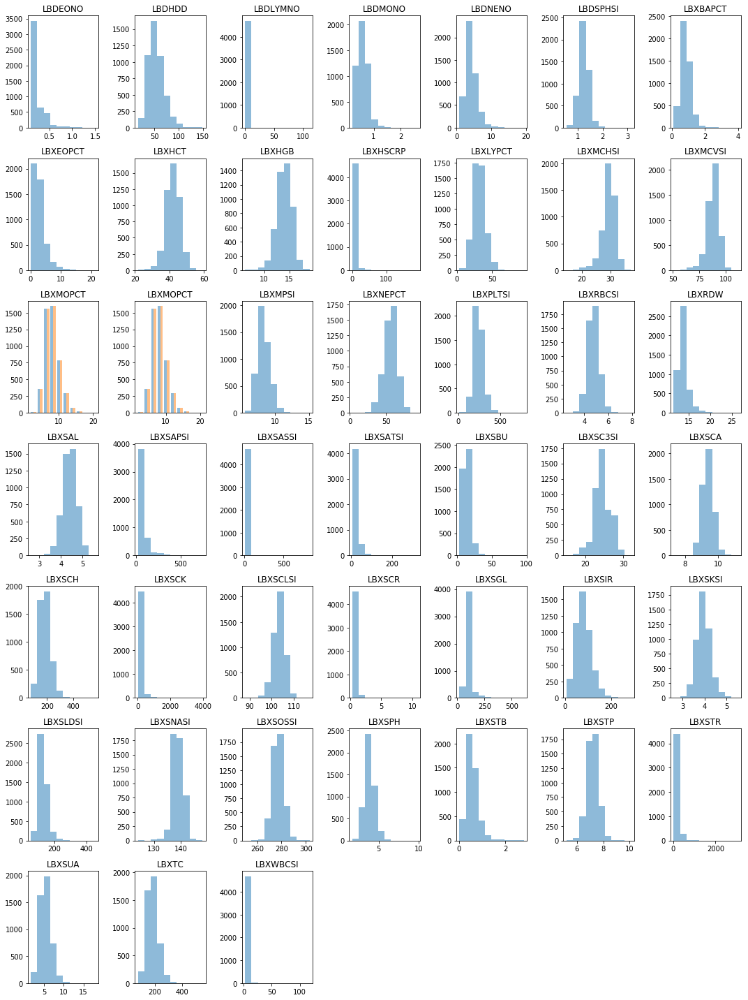

In [240]:
lab_continuous.hist(grid=False, alpha=0.5, figsize=(15, 20))
plt.tight_layout()

In [241]:
lab_log_continuous = nhanes_full_df[
    ['log_LBXWBCSI','log_LBXLYPCT', 'log_LBXMOPCT', 'log_LBXEOPCT',
     'log_LBXBAPCT', 'log_LBDLYMNO', 'log_LBDMONO', 'log_LBDNENO', 
     'log_LBDEONO', 'log_LBXRBCSI', 'log_LBXHCT','log_LBXRDW', 
     'log_LBXPLTSI', 'log_LBXMPSI', 'log_LBXSAPSI', 'log_LBXSASSI',
     'log_LBXSATSI', 'log_LBXSBU', 'log_LBXSCA', 'log_LBXSCH', 
     'log_LBXSCK', 'log_LBXSCLSI', 'log_LBXSCR', 'log_LBXSGL', 
     'log_LBXSIR', 'log_LBXSKSI', 'log_LBXSLDSI', 'log_LBXSNASI',
     'log_LBXSOSSI', 'log_LBXSPH', 'log_LBDSPHSI', 'log_LBXSTB', 
     'log_LBXSTP', 'log_LBXSTR', 'log_LBXSUA', 'log_LBDHDD', 
     'log_LBXTC', 'log_LBXHSCRP']]

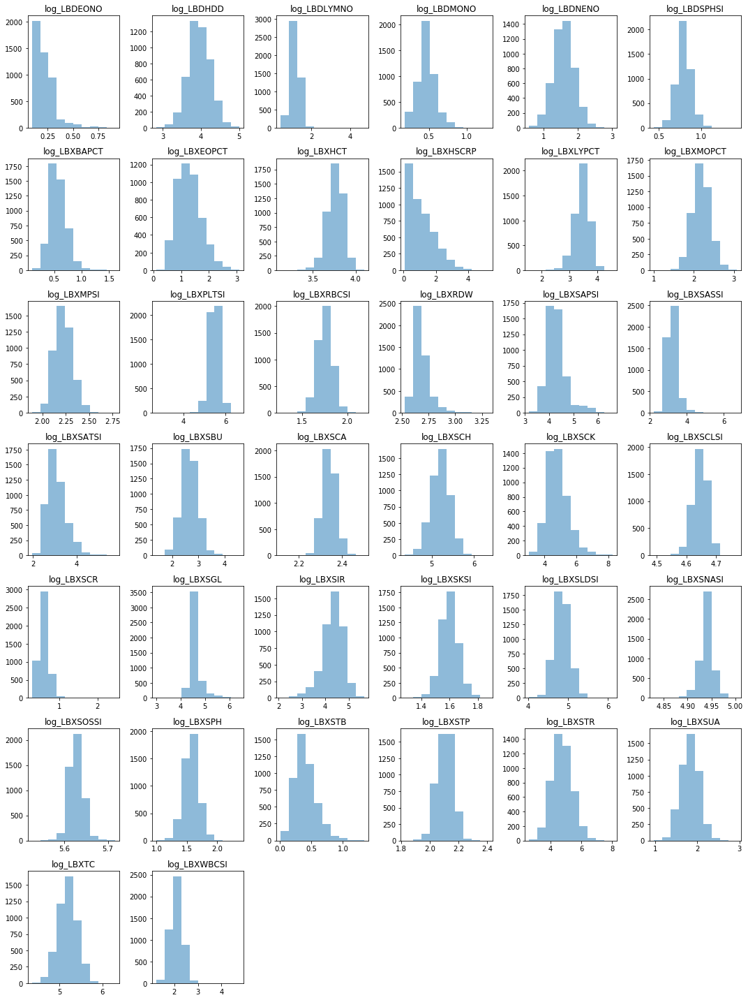

In [242]:
lab_log_continuous.hist(grid=False, alpha=0.5, figsize=(15, 20))
plt.tight_layout()

#### comment: distribution of lab values is much more normal after log-transformation

In [243]:
diet_continuous = nhanes_full_df[['tot_kcal_avg', 'tot_pro_avg', 'tot_carb_avg',
                   'tot_sugar_avg', 'tot_fiber_avg', 'tot_fat_avg',
                   'tot_sfat_avg', 'tot_mfat_avg', 'tot_pfat_avg',
                   'tot_fchol_avg', 'tot_vit_e_avg', 'tot_retinol_avg',
                   'tot_vit_a_avg', 'tot_alpha_c_avg', 'tot_beta_c_avg',
                   'tot_beta_cry_avg', 'tot_lyco_avg', 'tot_lutein_avg',
                   'vit_b1_avg', 'vit_b2_avg', 'niac_avg', 
                   'vit_b6_avg', 'folate_avg', 'folic_acid_avg', 
                   'food_fol_avg', 'folate_dfe_avg', 'tot_choline_avg', 
                   'vit_b12_avg', 'vit_c_avg', 'vit_d_avg', 
                   'tot_vit_k_avg', 'calc_avg', 'tot_phos_avg', 
                   'mag_avg', 'fe_avg', 'zn_avg', 
                   'cu_avg', 'na_avg', 'k_avg', 
                   'se_avg', 'tot_mois_avg', 'tot_h20_avg']]

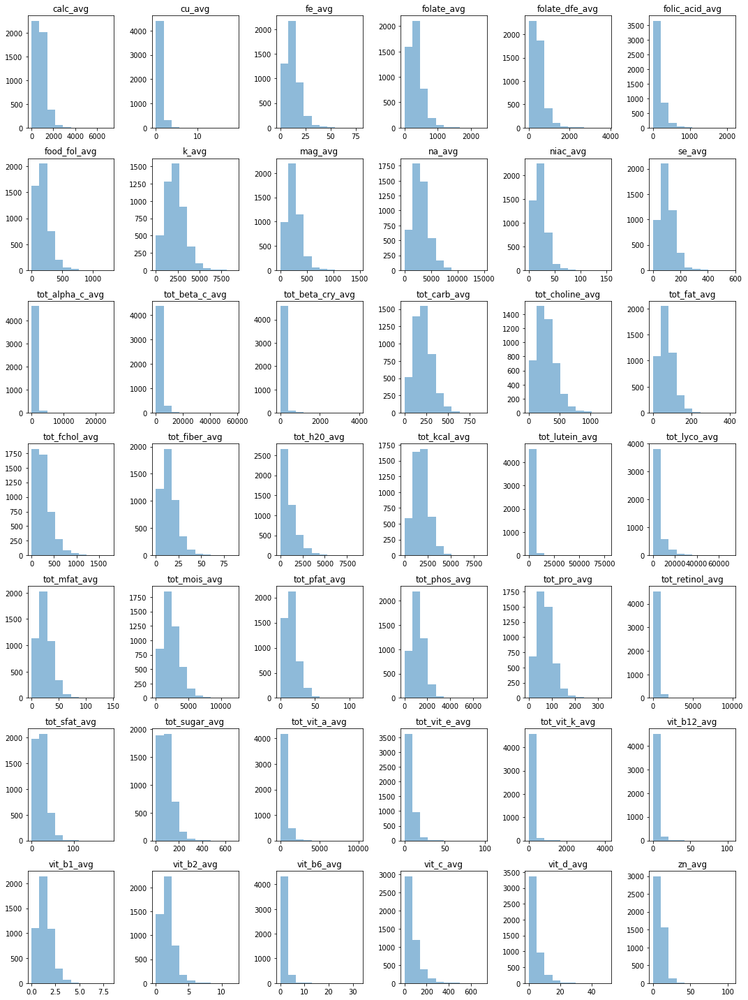

In [244]:
diet_continuous.hist(grid=False, alpha=0.5, figsize=(15, 20))
plt.tight_layout()

In [245]:
diet_log_continuous = nhanes_full_df[
    ['log_DR1TCAFF', 'log_tot_kcal_avg', 'log_tot_pro_avg', 'log_tot_carb_avg', 
     'log_tot_sugar_avg', 'log_tot_fiber_avg', 'log_tot_fat_avg', 'log_tot_sfat_avg',
     'log_tot_mfat_avg', 'log_tot_pfat_avg', 'log_tot_fchol_avg',
     'log_tot_vit_e_avg', 'log_tot_retinol_avg', 'log_tot_vit_a_avg',
     'log_tot_alpha_c_avg', 'log_tot_beta_c_avg', 'log_tot_beta_cry_avg',
     'log_tot_lyco_avg', 'log_tot_lutein_avg', 'log_vit_b1_avg',
     'log_vit_b2_avg', 'log_niac_avg', 'log_vit_b6_avg',
     'log_folate_avg', 'log_folic_acid_avg', 'log_food_fol_avg',
     'log_folate_dfe_avg', 'log_tot_choline_avg', 'log_vit_b12_avg',
     'log_vit_c_avg', 'log_vit_d_avg', 'log_tot_vit_k_avg',
     'log_calc_avg', 'log_tot_phos_avg', 'log_mag_avg',
     'log_fe_avg', 'log_zn_avg', 'log_cu_avg', 'log_na_avg', 
     'log_k_avg', 'log_se_avg', 'log_tot_mois_avg', 'log_tot_h20_avg', 
     'log_tot_b1_avg', 'log_tot_b2_avg', 'log_tot_niac_avg', 
     'log_tot_b6_avg', 'log_tot_b12_avg', 'log_tot_c_avg', 'log_tot_d_avg', 
     'log_tot_calc_avg', 'log_tot_mag_avg', 'log_tot_fe_avg', 'log_tot_zn_avg',
     'log_tot_cu_avg', 'log_tot_na_avg', 'log_tot_k_avg', 'log_tot_se_avg', 
     'log_tot_folate_avg']]

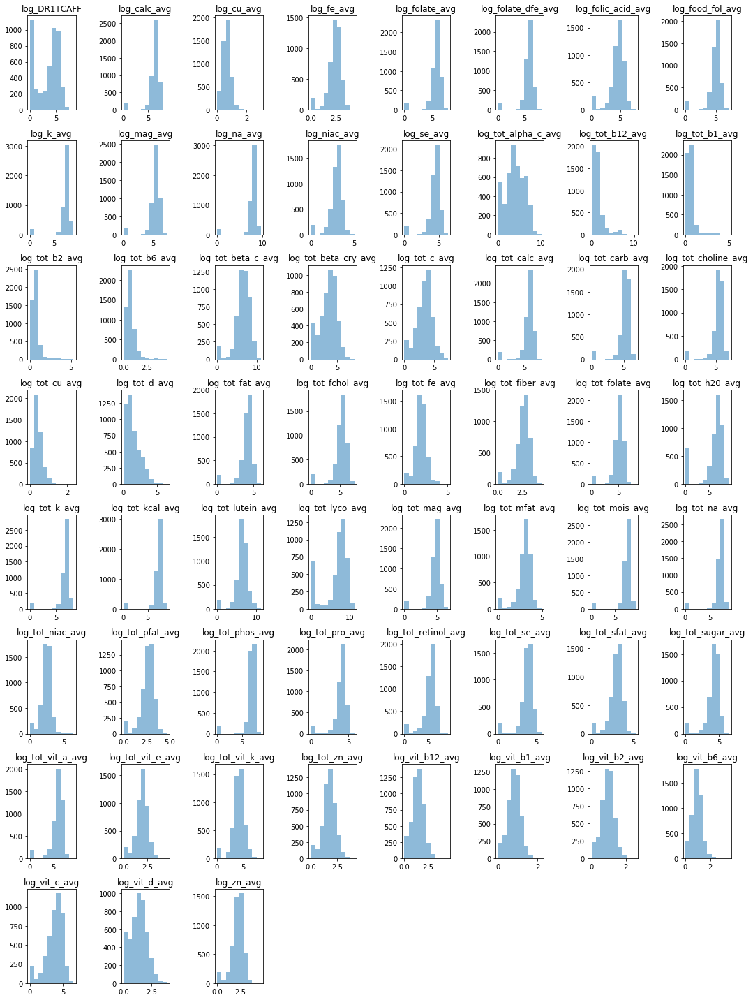

In [246]:
diet_log_continuous.hist(grid=False, alpha=0.5, figsize=(15, 20))
plt.tight_layout()

In [247]:
supplement_continuous = nhanes_full_df[['supp_b1_avg', 'supp_b2_avg', 'supp_nia_avg', 
                         'supp_b6_avg', 'supp_b12_avg', 'supp_folate_avg', 
                         'supp_folfde_avg', 'supp_c_avg', 'supp_d_avg', 
                         'supp_ca_avg', 'supp_mg_avg', 'supp_fe_avg', 
                         'supp_zn_avg', 'supp_cu_avg', 'supp_na_avg',
                         'supp_potk_avg', 'supp_se_avg']]

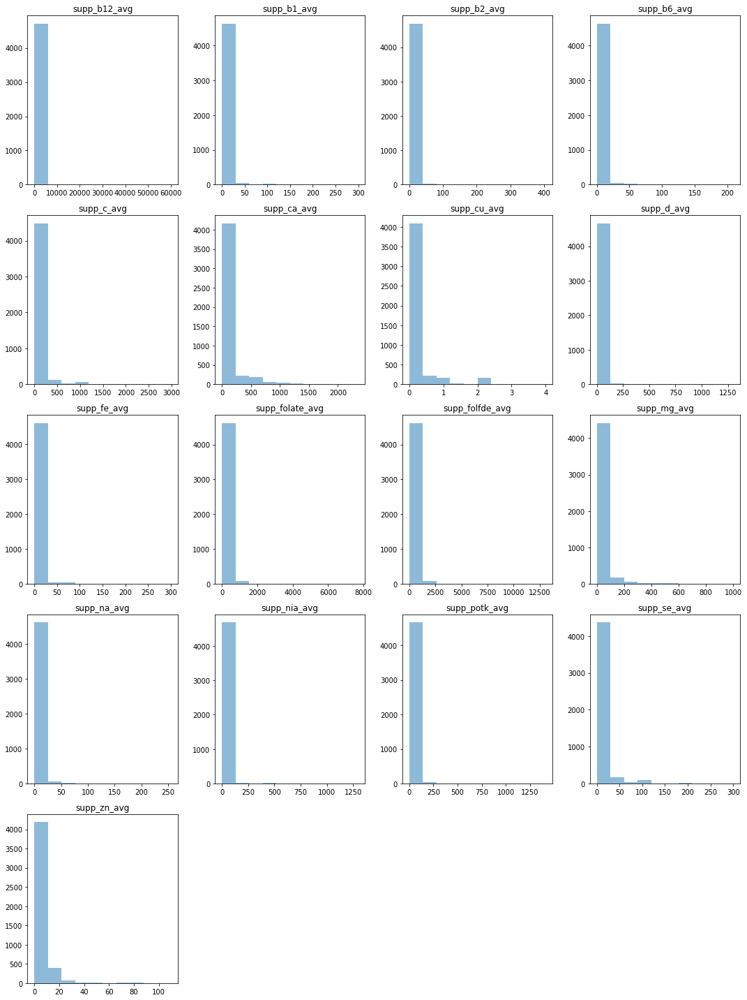

In [248]:
supplement_continuous.hist(grid=False, alpha=0.5, figsize=(15, 20))
plt.tight_layout()

In [249]:
total_intake_continuous = nhanes_full_df[['tot_kcal_avg', 'tot_pro_avg', 'tot_carb_avg',
                           'tot_sugar_avg', 'tot_fiber_avg', 'tot_fat_avg',
                           'tot_sfat_avg', 'tot_mfat_avg', 'tot_pfat_avg',
                           'tot_fchol_avg', 'tot_vit_e_avg', 'tot_retinol_avg',
                           'tot_vit_a_avg', 'tot_alpha_c_avg', 'tot_beta_c_avg',
                           'tot_beta_cry_avg', 'tot_lyco_avg', 'tot_lutein_avg',
                           'tot_choline_avg', 'tot_vit_k_avg', 'tot_phos_avg',
                           'tot_mois_avg', 'tot_h20_avg', 'tot_b1_avg', 
                           'tot_b2_avg', 'tot_niac_avg', 'tot_b6_avg', 
                           'tot_b12_avg', 'tot_c_avg', 'tot_d_avg', 
                           'tot_calc_avg', 'tot_mag_avg', 'tot_fe_avg',
                           'tot_zn_avg', 'tot_cu_avg', 'tot_na_avg', 
                           'tot_k_avg', 'tot_se_avg', 'tot_folate_avg']]

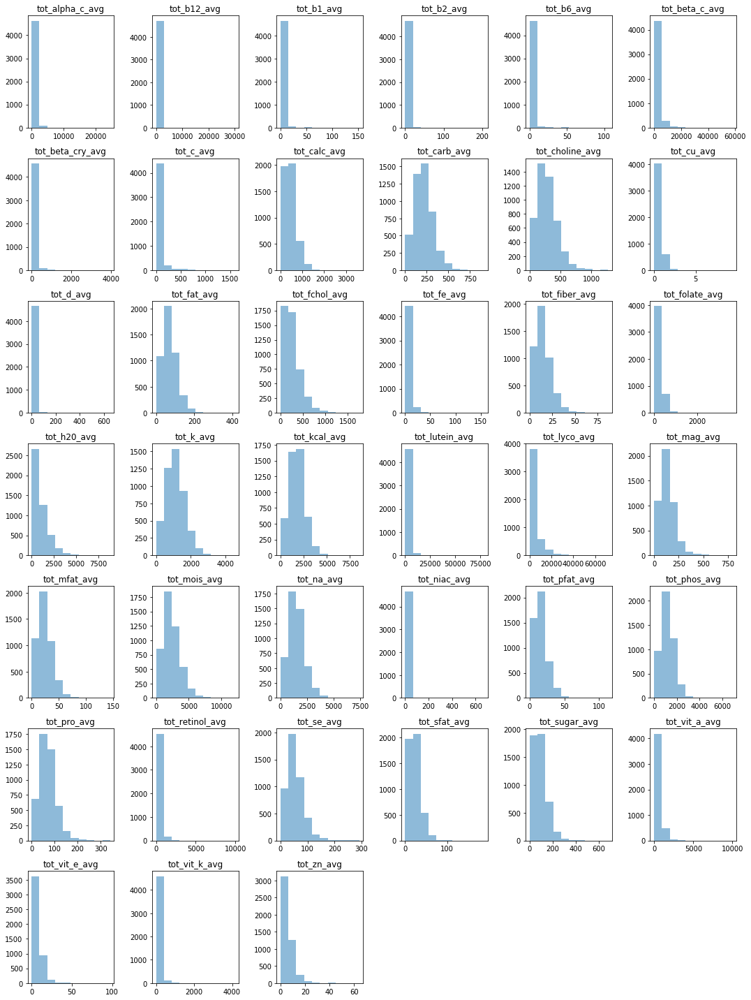

In [250]:
total_intake_continuous.hist(grid=False, alpha=0.5, figsize=(15, 20))
plt.tight_layout()

In [251]:
total_intake_log_continuous = nhanes_full_df[
    ['log_DR1TCAFF', 'log_tot_kcal_avg', 'log_tot_pro_avg', 
     'log_tot_carb_avg', 'log_tot_sugar_avg', 'log_tot_fiber_avg', 
     'log_tot_fat_avg', 'log_tot_sfat_avg', 'log_tot_mfat_avg', 
     'log_tot_pfat_avg', 'log_tot_fchol_avg', 'log_tot_vit_e_avg', 
     'log_tot_retinol_avg', 'log_tot_vit_a_avg', 'log_tot_alpha_c_avg', 
     'log_tot_beta_c_avg', 'log_tot_beta_cry_avg', 'log_tot_lyco_avg', 
     'log_tot_lutein_avg', 'log_tot_choline_avg', 'log_tot_vit_k_avg',
     'log_tot_phos_avg', 'log_tot_mois_avg', 'log_tot_h20_avg', 
     'log_tot_b1_avg', 'log_tot_b2_avg', 'log_tot_niac_avg', 
     'log_tot_niac_avg', 'log_tot_b6_avg', 'log_tot_b12_avg',
     'log_tot_c_avg', 'log_tot_d_avg', 'log_tot_calc_avg',
     'log_tot_mag_avg', 'log_tot_fe_avg', 'log_tot_zn_avg',
     'log_tot_cu_avg', 'log_tot_na_avg', 'log_tot_k_avg',
     'log_tot_se_avg', 'log_tot_folate_avg']]

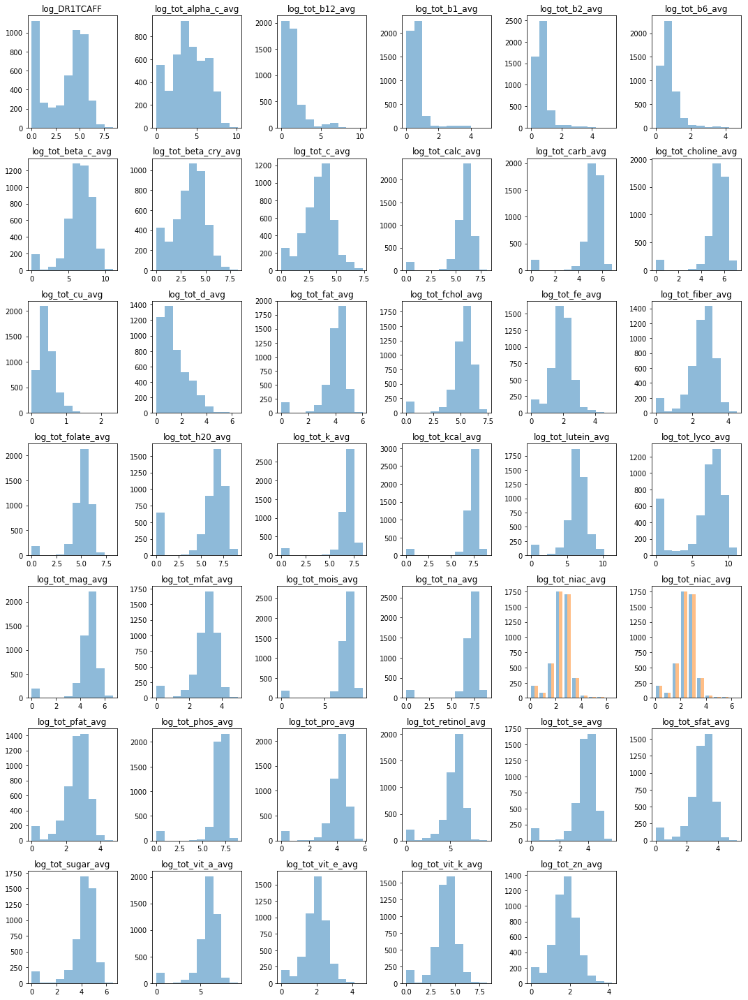

In [252]:
total_intake_log_continuous.hist(grid=False, alpha=0.5, figsize=(15, 20))
plt.tight_layout()

## convert questions to dummy variables for modeling

1 = yes; 2 = no; 7 = refused; 9 = don’t know
MCQ160B	   Ever told had congestive heart failure
MCQ160C    Ever told you had coronary heart disease
MCQ160D    Ever told you had angina/angina pectoris
MCQ160E    Ever told you had heart attack

MCQ300A    Close relative had heart attack?
MCQ365C    Doctor told you to reduce salt in diet
MCQ365D    Doctor told you to reduce fat/calories
MCQ370A    Are you now controlling or losing weight
MCQ370C    Are you now reducing salt in diet
MCQ370D    Are you now reducing fat in diet


1 = yes; 2 = no; 7 = refused; 9 = don’t know
BPQ020     Ever told you had high blood pressure
BPQ030     Told had high blood pressure - 2+ times
BPQ040A    Taking prescription for hypertension
**BPQ050A    Now taking prescribed medicine for HBP**
BPQ080     Doctor told you - high cholesterol level
BPQ060     Ever had blood cholesterol checked
BPQ070     When blood cholesterol last checked
BPQ090D    Told to take prescription for cholesterol
BPQ100D    Now taking prescribed medicine

DBQ095Z     Type of table salt used
1=Ordinary salt; 2=lite salt; 3 = salt sub; 4 = no added salt; 
DBD100      How often add salt to food at table
1=rarely; 2=occasionally; 3=very often; 7=refused; 9=don’t know
DRQSPREP    Salt used in preparation?
1=never; 2=rarely; 3=occasionally; 4=v often; 9=don’t know
DR1STY      Salt used at table yesterday?
1 = yes; 2 = no; 9 = don’t know
DRQSDIET    On special diet?
1 = yes; 2 = no; 9 = don’t know

1 = yes; 2 = no; 7 = refused; 9 = don’t know
DS1DS       Any Dietary Supplements Taken?
DS1AN       Any Antacids Taken?

In [253]:
question_list = ['MCQ160B', 'MCQ160C', 'MCQ160D', 'MCQ160E', 'MCQ300A',
             'MCQ365C', 'MCQ365D', 'MCQ370A', 'MCQ370C', 'MCQ370D',  
             'BPQ020', 'BPQ030', 'BPQ040A', 'BPQ050A', 'BPQ080', 
             'BPQ060', 'BPQ070', 'BPQ090D', 'BPQ100D', 'DBD100', 
             'DRQSPREP', 'DR1STY', 'DRQSDIET', 'DR2STY', 'DS1DS', 
             'DS1AN', 'DS2DS', 'DS2AN'] 

In [254]:
for column in question_list:
    nhanes_full_df = pd.concat([nhanes_full_df, pd.get_dummies(nhanes_full_df[column], prefix=column, drop_first=True)], axis=1)


In [255]:
nhanes_full_df.head()

,SEQN,RIAGENDR,RIDAGEYR,WTINT2YR,WTMEC2YR,INDFMPIR,MCQ160B,MCQ160C,MCQ160D,MCQ160E,MCQ300A,MCQ365C,MCQ365D,MCQ370A,MCQ370C,MCQ370D,BMXWT,BMXHT,BMXBMI,BMXWAIST,BMDAVSAD,BPQ020,BPQ030,BPQ040A,BPQ050A,BPQ080,BPQ060,BPQ070,BPQ090D,BPQ100D,bp_sys_avg,bp_dis_avg,LBXWBCSI,LBXLYPCT,LBXMOPCT,LBXNEPCT,LBXEOPCT,LBXBAPCT,LBDLYMNO,LBDMONO,LBDNENO,LBDEONO,LBXRBCSI,LBXHGB,LBXHCT,LBXMCVSI,LBXMCHSI,LBXRDW,LBXPLTSI,LBXMPSI,LBXSAL,LBXSAPSI,LBXSASSI,LBXSATSI,LBXSBU,LBXSC3SI,LBXSCA,LBXSCH,LBXSCK,LBXSCLSI,LBXSCR,LBXSGL,LBXSIR,LBXSKSI,LBXSLDSI,LBXSNASI,LBXSOSSI,LBXSPH,LBDSPHSI,LBXSTB,LBXSTP,LBXSTR,LBXSUA,LBDHDD,LBXTC,LBXHSCRP,WTDRD1_x,WTDR2D_x,DRDINT_x,DBQ095Z,DBD100,DRQSPREP,DR1STY,DRQSDIET,DR1TCAFF,DRD360,DR2STY,WTDRD1_x,WTDR2D_x,DS1DS,DS1AN,DS2DS,DS2AN,tot_kcal_avg,tot_pro_avg,tot_carb_avg,tot_sugar_avg,tot_fiber_avg,tot_fat_avg,tot_sfat_avg,tot_mfat_avg,tot_pfat_avg,tot_fchol_avg,tot_vit_e_avg,tot_retinol_avg,tot_vit_a_avg,tot_alpha_c_avg,tot_beta_c_avg,tot_beta_cry_avg,tot_lyco_avg,tot_lutein_avg,vit_b1_avg,vit_b2_avg,niac_avg,vit_b6_avg,folate_avg,folic_acid_avg,food_fol_avg,folate_dfe_avg,tot_choline_avg,vit_b12_avg,vit_c_avg,vit_d_avg,tot_vit_k_avg,calc_avg,tot_phos_avg,mag_avg,fe_avg,zn_avg,cu_avg,na_avg,k_avg,se_avg,tot_mois_avg,tot_h20_avg,supp_b1_avg,supp_b2_avg,supp_nia_avg,supp_b6_avg,supp_b12_avg,supp_folate_avg,supp_folfde_avg,supp_c_avg,supp_d_avg,supp_ca_avg,supp_mg_avg,supp_fe_avg,supp_zn_avg,supp_cu_avg,supp_na_avg,supp_potk_avg,supp_se_avg,tot_b1_avg,tot_b2_avg,tot_niac_avg,tot_b6_avg,tot_b12_avg,tot_c_avg,tot_d_avg,tot_calc_avg,tot_mag_avg,tot_fe_avg,tot_zn_avg,tot_cu_avg,tot_na_avg,tot_k_avg,tot_se_avg,tot_folate_avg,heart_dz,log_BMXWT,log_BMXBMI,log_BMXWAIST,log_bp_sys_avg,log_bp_dis_avg,log_LBXWBCSI,log_LBXLYPCT,log_LBXMOPCT,log_LBXEOPCT,log_LBXBAPCT,log_LBDLYMNO,log_LBDMONO,log_LBDNENO,log_LBDEONO,log_LBXRBCSI,log_LBXHCT,log_LBXRDW,log_LBXPLTSI,log_LBXMPSI,log_LBXSAPSI,log_LBXSASSI,log_LBXSATSI,log_LBXSBU,log_LBXSCA,log_LBXSCH,log_LBXSCK,log_LBXSCLSI,log_LBXSCR,log_LBXSGL,log_LBXSIR,log_LBXSKSI,log_LBXSLDSI,log_LBXSNASI,log_LBXSOSSI,log_LBXSPH,log_LBDSPHSI,log_LBXSTB,log_LBXSTP,log_LBXSTR,log_LBXSUA,log_LBDHDD,log_LBXTC,log_LBXHSCRP,log_DR1TCAFF,log_tot_kcal_avg,log_tot_pro_avg,log_tot_carb_avg,log_tot_sugar_avg,log_tot_fiber_avg,log_tot_fat_avg,log_tot_sfat_avg,log_tot_mfat_avg,log_tot_pfat_avg,log_tot_fchol_avg,log_tot_vit_e_avg,log_tot_retinol_avg,log_tot_vit_a_avg,log_tot_alpha_c_avg,log_tot_beta_c_avg,log_tot_beta_cry_avg,log_tot_lyco_avg,log_tot_lutein_avg,log_vit_b1_avg,log_vit_b2_avg,log_niac_avg,log_vit_b6_avg,log_folate_avg,log_folic_acid_avg,log_food_fol_avg,log_folate_dfe_avg,log_tot_choline_avg,log_vit_b12_avg,log_vit_c_avg,log_vit_d_avg,log_tot_vit_k_avg,log_calc_avg,log_tot_phos_avg,log_mag_avg,log_fe_avg,log_zn_avg,log_cu_avg,log_na_avg,log_k_avg,log_se_avg,log_tot_mois_avg,log_tot_h20_avg,log_tot_b1_avg,log_tot_b2_avg,log_tot_niac_avg,log_tot_b6_avg,log_tot_b12_avg,log_tot_c_avg,log_tot_d_avg,log_tot_calc_avg,log_tot_mag_avg,log_tot_fe_avg,log_tot_zn_avg,log_tot_cu_avg,log_tot_na_avg,log_tot_k_avg,log_tot_se_avg,log_tot_folate_avg,MCQ160B_2.0,MCQ160B_9.0,MCQ160C_2.0,MCQ160C_9.0,MCQ160D_2.0,MCQ160D_9.0,MCQ160E_2.0,MCQ160E_9.0,MCQ300A_2.0,MCQ300A_7.0,MCQ300A_9.0,MCQ365C_2.0,MCQ365C_9.0,MCQ365D_2.0,MCQ365D_9.0,MCQ370A_2.0,MCQ370A_9.0,MCQ370C_2.0,MCQ370C_9.0,MCQ370D_2.0,MCQ370D_9.0,BPQ020_2.0,BPQ020_9.0,BPQ030_2.0,BPQ030_9.0,BPQ040A_2.0,BPQ040A_9.0,BPQ050A_2.0,BPQ050A_9.0,BPQ080_2.0,BPQ080_9.0,BPQ060_2.0,BPQ060_9.0,BPQ070_2.0,BPQ070_3.0,BPQ070_4.0,BPQ070_9.0,BPQ090D_2.0,BPQ090D_9.0,BPQ100D_2.0,BPQ100D_9.0,DBD100_1.0,DBD100_2.0,DBD100_3.0,DBD100_9.0,DRQSPREP_1.0,DRQSPREP_2.0,DRQSPREP_3.0,DRQSPREP_4.0,DRQSPREP_9.0,DR1STY_1.0,DR1STY_2.0,DR1STY_9.0,DRQSDIET_1.0,DRQSDIET_2.0,DRQSDIET_9.0,DR2STY_1.0,DR2STY_2.0,DR2STY_9.0,DS1DS_1.0,DS1DS_2.0,DS1AN_1.0,DS1AN_2.0,DS2DS_1.0,DS2DS_2.0,DS2AN_1.0,DS2AN_2.0
0,83732.0,1,62.0,134671.370419,135629.507405,4.39,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,94.8,184.5,27.8,101.1,22.8,2.

# unsupervised learning: 
## clustering
attempt to cluster lab data and body measurement data to act as variable in supervised model

#### creating dfs with variables for clustering
3 versions

In [256]:
#contains both mec & lab data + 'WTMEC2YR' weight
nhanes_cluster_df = nhanes_full_df[
    ['RIAGENDR', 'RIDAGEYR', 'WTMEC2YR', 'INDFMPIR', 
     'log_BMXWT', 'BMXHT', 'log_BMXBMI', 'log_BMXWAIST', 'BMDAVSAD',
     'log_bp_sys_avg', 'log_bp_dis_avg', 'log_LBXWBCSI', 'log_LBXLYPCT',
     'log_LBXMOPCT', 'LBXNEPCT', 'log_LBXEOPCT', 'log_LBXBAPCT', 
     'log_LBDLYMNO', 'log_LBDMONO', 'log_LBDNENO', 'log_LBDEONO',
     'log_LBXRBCSI', 'LBXHGB', 'log_LBXHCT', 'LBXMCVSI', 'LBXMCHSI',
     'log_LBXRDW', 'log_LBXPLTSI', 'log_LBXMPSI', 'LBXSAL', 'log_LBXSAPSI',
     'log_LBXSASSI', 'log_LBXSATSI', 'log_LBXSBU', 'LBXSC3SI', 'log_LBXSCA',
     'log_LBXSCH', 'log_LBXSCK', 'log_LBXSCLSI', 'log_LBXSCR', 'log_LBXSGL',
     'log_LBXSIR', 'log_LBXSKSI', 'log_LBXSLDSI', 'log_LBXSNASI', 'log_LBXSOSSI',
     'log_LBXSPH', 'log_LBDSPHSI', 'log_LBXSTB', 'log_LBXSTP', 'log_LBXSTR',
     'log_LBXSUA', 'log_LBDHDD', 'log_LBXTC', 'log_LBXHSCRP',]]

In [257]:
nhanes_cluster_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4712 entries, 0 to 9963
Data columns (total 55 columns):
RIAGENDR          4712 non-null int64
RIDAGEYR          4712 non-null float64
WTMEC2YR          4712 non-null float64
INDFMPIR          4712 non-null float64
log_BMXWT         4712 non-null float64
BMXHT             4712 non-null float64
log_BMXBMI        4712 non-null float64
log_BMXWAIST      4712 non-null float64
BMDAVSAD          4712 non-null float64
log_bp_sys_avg    4712 non-null float64
log_bp_dis_avg    4712 non-null float64
log_LBXWBCSI      4712 non-null float64
log_LBXLYPCT      4712 non-null float64
log_LBXMOPCT      4712 non-null float64
LBXNEPCT          4712 non-null float64
log_LBXEOPCT      4712 non-null float64
log_LBXBAPCT      4712 non-null float64
log_LBDLYMNO      4712 non-null float64
log_LBDMONO       4712 non-null float64
log_LBDNENO       4712 non-null float64
log_LBDEONO       4712 non-null float64
log_LBXRBCSI      4712 non-null float64
LBXHGB         

In [258]:
nhanes_cluster_df.describe()

,RIAGENDR,RIDAGEYR,WTMEC2YR,INDFMPIR,log_BMXWT,BMXHT,log_BMXBMI,log_BMXWAIST,BMDAVSAD,log_bp_sys_avg,log_bp_dis_avg,log_LBXWBCSI,log_LBXLYPCT,log_LBXMOPCT,LBXNEPCT,log_LBXEOPCT,log_LBXBAPCT,log_LBDLYMNO,log_LBDMONO,log_LBDNENO,log_LBDEONO,log_LBXRBCSI,LBXHGB,log_LBXHCT,LBXMCVSI,LBXMCHSI,log_LBXRDW,log_LBXPLTSI,log_LBXMPSI,LBXSAL,log_LBXSAPSI,log_LBXSASSI,log_LBXSATSI,log_LBXSBU,LBXSC3SI,log_LBXSCA,log_LBXSCH,log_LBXSCK,log_LBXSCLSI,log_LBXSCR,log_LBXSGL,log_LBXSIR,log_LBXSKSI,log_LBXSLDSI,log_LBXSNASI,log_LBXSOSSI,log_LBXSPH,log_LBDSPHSI,log_LBXSTB,log_LBXSTP,log_LBXSTR,log_LBXSUA,log_LBDHDD,log_LBXTC,log_LBXHSCRP
count,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000
mean,1.501273,42.974533,42230.756482,2.433147,4.354369,166.230815,3.364328,4.573107,22.232598,4.805205,4.222861,2.086611,3.456144,2.190559,56.314877,1.284139,0.576120,1.159352,0.453316,1.600609,0.187867,1.751962,13.982322,3.756646,88.018994,29.284508,2.687079,5.464893,2.230416,4.363115,4.302155,3.218792,3.120460,2.664667,24.448854,2.339513,5.211255,4.841196,4.647062,0.600431,4.591543,4.314366,1.598620,4.853450,4.939340,5.628160,1.562256,0.797961,0.427341,2.102197,4.778319,1.826195,3.954513,5.195853,1.100526
std,0.500051,20.277029,40292.508799,1.573329,0.267068,10.035743,0.228792,0.178950,4.732518,0.135911,0.177962,0.246668,0.272714,0.223907,9.299703,0.434525,0.168117,0.222222,0.117105,0.302375,0.113737,0.083191,1.496697,0.097897,5.988607,2.412466,0.079031,0.249882,0.096921,0.330842,0.417518,0.292724,0.442976,0.319154,2.112505,0.032732,0.222609,0.674325,0.026636,0.141476,0.256521,0.456523,0.065203,0.197428,0.014600,0.016269,0.127444,0.088431,0.172553,0.054532,0.639173,0.218588,0.293169,0.220623,0.819233
min,1.000000,12.000000,5157.019076,0.010000,3.401197,129.700000,2.747271,4.018183,12.400000,4.442651,3.270836,1.223775,1.547563,0.993252,3.600000,0.095310,0.095310,0.405465,0.182322,0.587787,0.095310,1.258461,6.200000,3.126761,50.800000,14.600000,2.525729,2.708050,1.887070,2.600000,3.178054,2.197225,1.945910,1.386294,15.000000,2.116256,4.369448,3.044522,4.488636,0.277632,2.995732,2.079442,1.280934,4.025352,4.828314,5.525453,0.993252,0.437610,0.009950,1.824549,2.639057,0.955511,2.833213,4.356709,0.076961
25%,1.000000,25.000000,17452.972425,1.110000,4.169761,158.800000,3.202746,4.446174,18.600000,4.709530,4.121744,1.916923,3.303217,2.041220,50.600000,0.955511,0.470004,1.029619,0.336472,1.410987,0.095310,1.697449,13.000000,3.698830,85.100000,28.200000,2.639057,5.318120,2.163323,4.100000,4.043051,3.044522,2.772589,2.484907,23.000000,2.322388,5.056246,4.369448,4.634729,0.506818,4.454347,4.060443,1.558145,4.727388,4.927254,5.616771,1.481605,0.740985,0.336472,2.066863,4.317488,1.686399,3.761200,5.043425,0.470004
50%,2.000000,42.000000,25416.841251,2.025000,4.352855,166.100000,3.356897,4.579852,21.900000,4.790266,4.234107,2.079442,3.475067,2.186051,56.900000,1.223775,0.587787,1.163151,0.470004,1.589235,0.182322,1.750937,14.000000,3.761200,88.600000,29.600000,2.667228,5.472271,2.230014,4.400000,4.248495,3.178054,3.044522,2.639057,25.000000,2.341806,5.214936,4.762174,4.653960,0.587787,4.532599,4.356709,1.597365,4.844187,4.941642,5.627621,1.568616,0.800655,0.405465,2.104134,4.744932,1.824549,3.951244,5.204007,0.955511
75%,2.000000,60.000000,47627.498320,3.720000,4.531793,173.600000,3.511545,4.693181,25.300000,4.885324,4.343805,2.251292,3.637586,2.341806,62.500000,1.547563,0.69

In [259]:
# mec cluster with weights
nhanes_mec_cluster_df = nhanes_full_df[
    ['RIAGENDR', 'RIDAGEYR', 'WTMEC2YR', 
     'log_BMXWT', 'BMXHT', 'log_BMXBMI', 
     'log_BMXWAIST', 'BMDAVSAD', 'log_bp_sys_avg', 
     'log_bp_dis_avg']]

In [260]:
nhanes_mec_cluster_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4712 entries, 0 to 9963
Data columns (total 10 columns):
RIAGENDR          4712 non-null int64
RIDAGEYR          4712 non-null float64
WTMEC2YR          4712 non-null float64
log_BMXWT         4712 non-null float64
BMXHT             4712 non-null float64
log_BMXBMI        4712 non-null float64
log_BMXWAIST      4712 non-null float64
BMDAVSAD          4712 non-null float64
log_bp_sys_avg    4712 non-null float64
log_bp_dis_avg    4712 non-null float64
dtypes: float64(9), int64(1)
memory usage: 404.9 KB


In [261]:
nhanes_mec_cluster_df.describe()

,RIAGENDR,RIDAGEYR,WTMEC2YR,log_BMXWT,BMXHT,log_BMXBMI,log_BMXWAIST,BMDAVSAD,log_bp_sys_avg,log_bp_dis_avg
count,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000
mean,1.501273,42.974533,42230.756482,4.354369,166.230815,3.364328,4.573107,22.232598,4.805205,4.222861
std,0.500051,20.277029,40292.508799,0.267068,10.035743,0.228792,0.178950,4.732518,0.135911,0.177962
min,1.000000,12.000000,5157.019076,3.401197,129.700000,2.747271,4.018183,12.400000,4.442651,3.270836
25%,1.000000,25.000000,17452.972425,4.169761,158.800000,3.202746,4.446174,18.600000,4.709530,4.121744
50%,2.000000,42.000000,25416.841251,4.352855,166.100000,3.356897,4.579852,21.900000,4.790266,4.234107
75%,2.000000,60.000000,47627.498320,4.531793,173.600000,3.511545,4.693181,25.300000,4.885324,4.343805
max,2.000000,80.000000,242386.660766,5.297817,202.700000,4.183576,5.150977,40.800000,5.448173,4.828314


In [262]:
# lab cluster with weights
nhanes_lab_cluster_df = nhanes_full_df[
    ['RIAGENDR', 'RIDAGEYR', 'log_LBXWBCSI', 'log_LBXLYPCT',
     'log_LBXMOPCT', 'LBXNEPCT', 'log_LBXEOPCT', 'log_LBXBAPCT', 
     'log_LBDLYMNO', 'log_LBDMONO', 'log_LBDNENO', 'log_LBDEONO',
     'log_LBXRBCSI', 'LBXHGB', 'log_LBXHCT', 'LBXMCVSI', 'LBXMCHSI',
     'log_LBXRDW', 'log_LBXPLTSI', 'log_LBXMPSI', 'LBXSAL', 
     'log_LBXSAPSI', 'log_LBXSASSI', 'log_LBXSATSI', 'log_LBXSBU', 
     'LBXSC3SI', 'log_LBXSCA', 'log_LBXSCH', 'log_LBXSCK', 'log_LBXSCLSI', 
     'log_LBXSCR', 'log_LBXSGL', 'log_LBXSIR', 'log_LBXSKSI', 'log_LBXSLDSI', 
     'log_LBXSNASI', 'log_LBXSOSSI', 'log_LBXSPH', 'log_LBDSPHSI', 
     'log_LBXSTB', 'log_LBXSTP', 'log_LBXSTR','log_LBXSUA', 
     'log_LBDHDD', 'log_LBXTC', 'log_LBXHSCRP', 'WTMEC2YR', ]]

In [263]:
nhanes_lab_cluster_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4712 entries, 0 to 9963
Data columns (total 47 columns):
RIAGENDR        4712 non-null int64
RIDAGEYR        4712 non-null float64
log_LBXWBCSI    4712 non-null float64
log_LBXLYPCT    4712 non-null float64
log_LBXMOPCT    4712 non-null float64
LBXNEPCT        4712 non-null float64
log_LBXEOPCT    4712 non-null float64
log_LBXBAPCT    4712 non-null float64
log_LBDLYMNO    4712 non-null float64
log_LBDMONO     4712 non-null float64
log_LBDNENO     4712 non-null float64
log_LBDEONO     4712 non-null float64
log_LBXRBCSI    4712 non-null float64
LBXHGB          4712 non-null float64
log_LBXHCT      4712 non-null float64
LBXMCVSI        4712 non-null float64
LBXMCHSI        4712 non-null float64
log_LBXRDW      4712 non-null float64
log_LBXPLTSI    4712 non-null float64
log_LBXMPSI     4712 non-null float64
LBXSAL          4712 non-null float64
log_LBXSAPSI    4712 non-null float64
log_LBXSASSI    4712 non-null float64
log_LBXSATSI    4712 

In [264]:
nhanes_lab_cluster_df.describe()

,RIAGENDR,RIDAGEYR,log_LBXWBCSI,log_LBXLYPCT,log_LBXMOPCT,LBXNEPCT,log_LBXEOPCT,log_LBXBAPCT,log_LBDLYMNO,log_LBDMONO,log_LBDNENO,log_LBDEONO,log_LBXRBCSI,LBXHGB,log_LBXHCT,LBXMCVSI,LBXMCHSI,log_LBXRDW,log_LBXPLTSI,log_LBXMPSI,LBXSAL,log_LBXSAPSI,log_LBXSASSI,log_LBXSATSI,log_LBXSBU,LBXSC3SI,log_LBXSCA,log_LBXSCH,log_LBXSCK,log_LBXSCLSI,log_LBXSCR,log_LBXSGL,log_LBXSIR,log_LBXSKSI,log_LBXSLDSI,log_LBXSNASI,log_LBXSOSSI,log_LBXSPH,log_LBDSPHSI,log_LBXSTB,log_LBXSTP,log_LBXSTR,log_LBXSUA,log_LBDHDD,log_LBXTC,log_LBXHSCRP,WTMEC2YR
count,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000,4712.000000
mean,1.501273,42.974533,2.086611,3.456144,2.190559,56.314877,1.284139,0.576120,1.159352,0.453316,1.600609,0.187867,1.751962,13.982322,3.756646,88.018994,29.284508,2.687079,5.464893,2.230416,4.363115,4.302155,3.218792,3.120460,2.664667,24.448854,2.339513,5.211255,4.841196,4.647062,0.600431,4.591543,4.314366,1.598620,4.853450,4.939340,5.628160,1.562256,0.797961,0.427341,2.102197,4.778319,1.826195,3.954513,5.195853,1.100526,42230.756482
std,0.500051,20.277029,0.246668,0.272714,0.223907,9.299703,0.434525,0.168117,0.222222,0.117105,0.302375,0.113737,0.083191,1.496697,0.097897,5.988607,2.412466,0.079031,0.249882,0.096921,0.330842,0.417518,0.292724,0.442976,0.319154,2.112505,0.032732,0.222609,0.674325,0.026636,0.141476,0.256521,0.456523,0.065203,0.197428,0.014600,0.016269,0.127444,0.088431,0.172553,0.054532,0.639173,0.218588,0.293169,0.220623,0.819233,40292.508799
min,1.000000,12.000000,1.223775,1.547563,0.993252,3.600000,0.095310,0.095310,0.405465,0.182322,0.587787,0.095310,1.258461,6.200000,3.126761,50.800000,14.600000,2.525729,2.708050,1.887070,2.600000,3.178054,2.197225,1.945910,1.386294,15.000000,2.116256,4.369448,3.044522,4.488636,0.277632,2.995732,2.079442,1.280934,4.025352,4.828314,5.525453,0.993252,0.437610,0.009950,1.824549,2.639057,0.955511,2.833213,4.356709,0.076961,5157.019076
25%,1.000000,25.000000,1.916923,3.303217,2.041220,50.600000,0.955511,0.470004,1.029619,0.336472,1.410987,0.095310,1.697449,13.000000,3.698830,85.100000,28.200000,2.639057,5.318120,2.163323,4.100000,4.043051,3.044522,2.772589,2.484907,23.000000,2.322388,5.056246,4.369448,4.634729,0.506818,4.454347,4.060443,1.558145,4.727388,4.927254,5.616771,1.481605,0.740985,0.336472,2.066863,4.317488,1.686399,3.761200,5.043425,0.470004,17452.972425
50%,2.000000,42.000000,2.079442,3.475067,2.186051,56.900000,1.223775,0.587787,1.163151,0.470004,1.589235,0.182322,1.750937,14.000000,3.761200,88.600000,29.600000,2.667228,5.472271,2.230014,4.400000,4.248495,3.178054,3.044522,2.639057,25.000000,2.341806,5.214936,4.762174,4.653960,0.587787,4.532599,4.356709,1.597365,4.844187,4.941642,5.627621,1.568616,0.800655,0.405465,2.104134,4.744932,1.824549,3.951244,5.204007,0.955511,25416.841251
75%,2.000000,60.000000,2.251292,3.637586,2.341806,62.500000,1.547563,0.693147,1.308333,0.530628,1.791759,0.262364,1.808289,15.000000,3.824284,91.800000,30.800000,2.714695,5.624018,2.292535,4.600000,4.477337,3.367296,3.367296,2.833213,26.000000,2.360854,5.356586,5.220356,4.663439,0.672944,4.644391,4.624973,1.638997,4.976734,4.948760,5.638355,1.648659,0.856965,0.530628,2.140066,5.209486,1.974081,4.143135,5.342334,1.589235,47627.498320
max,2.000000,80.000000,4.772378,4.559126,3.081910,92.200000,3.104587,1.609438,4.716712,1.280934,3.015535,0.916291,2.186051,19.000000,4.094345,111.500000,37.100000,3.310543,6.656727,2.778819,5.600000,6.608001,6.725034,5.768321,4.574711,32.000000,2.501436,6.338594,8.285009,4.770685,

## normalize data

In [265]:
from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn.preprocessing import normalize
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn.cluster import SpectralClustering
from sklearn.cluster import AffinityPropagation
from sklearn import metrics
from itertools import cycle

#### group 1: full dataset (body measurements + lab data)

In [266]:
#normalize data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

X = nhanes_cluster_df
X_std = scaler.fit_transform(X)

In [267]:
X_std

array([[-1.00254994,  0.93837642,  2.31826377, ..., -0.35602814,
        -0.16680884, -0.76973186],
       [-1.00254994,  0.49447731, -0.42067694, ...,  0.69718171,
         1.75722325, -0.2747466 ],
       [-1.00254994,  1.72753038, -0.73606896, ..., -1.77570373,
         1.09803394, -0.76973186],
       ...,
       [-1.00254994, -0.54128727,  0.08638206, ..., -0.82193733,
         0.48708857, -0.2747466 ],
       [-1.00254994, -0.88654213, -0.70612898, ..., -0.14494847,
        -0.51880802,  0.28624304],
       [ 0.99745655,  1.62888614,  0.60682062, ...,  0.95379636,
        -1.12009823, -0.00233656]])

#### group 2: body measurements

In [268]:
#normalize data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

X = nhanes_mec_cluster_df
X_mec = scaler.fit_transform(X)

In [269]:
X_mec

array([[-1.00254994,  0.93837642,  2.31826377, ...,  0.11990712,
         0.09113671, -0.15829856],
       [-1.00254994,  0.49447731, -0.42067694, ...,  1.07087608,
         1.05635721,  1.36587117],
       [-1.00254994,  1.72753038, -0.73606896, ...,  0.92294757,
         0.80869067, -2.17484635],
       ...,
       [-1.00254994, -0.54128727,  0.08638206, ...,  0.11990712,
        -0.35869185, -0.4480417 ],
       [-1.00254994, -0.88654213, -0.70612898, ..., -0.74653126,
        -0.57261795,  0.67968185],
       [ 0.99745655,  1.62888614,  0.60682062, ..., -0.02802138,
        -0.61615974, -1.93735586]])

#### group 3: lab data

In [270]:
#normalize data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

X = nhanes_lab_cluster_df
X_lab = scaler.fit_transform(X)

In [271]:
X_lab

array([[-1.00254994,  0.93837642,  1.18769475, ..., -0.16680884,
        -0.76973186,  2.31826377],
       [-1.00254994,  0.49447731,  0.12019188, ...,  1.75722325,
        -0.2747466 , -0.42067694],
       [-1.00254994,  1.72753038, -1.62264694, ...,  1.09803394,
        -0.76973186, -0.73606896],
       ...,
       [-1.00254994, -0.54128727,  1.87654462, ...,  0.48708857,
        -0.2747466 ,  0.08638206],
       [-1.00254994, -0.88654213,  0.02129756, ..., -0.51880802,
         0.28624304, -0.70612898],
       [ 0.99745655,  1.62888614, -0.34516155, ..., -1.12009823,
        -0.00233656,  0.60682062]])

## kmeans clusters

### group 1: X_std (body measurements & lab data)

#### X_std clustering, reference

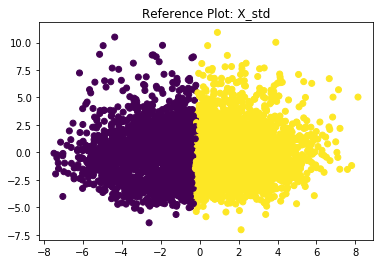

In [272]:
# reduce data to two components for plotting
X_pca = PCA(2).fit_transform(X_std)

# calculate predicted values
y_std = KMeans(n_clusters=2, random_state=42).fit_predict(X_std)
y_pred_pca = KMeans(n_clusters=2, random_state=42).fit_predict(X_pca)

# plot the solution
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_pred_pca)
plt.title('Reference Plot: X_std')
plt.show()

#### X_std, fit kmeans

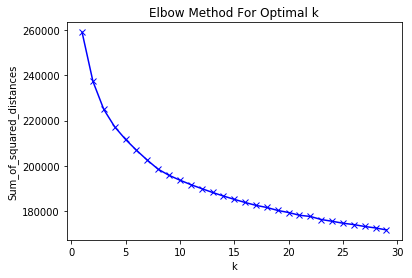

In [273]:
# find k
Sum_of_squared_distances = []
K = range(1,30)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(X_std)
    Sum_of_squared_distances.append(km.inertia_)
    
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()   

In [274]:
from yellowbrick.cluster import KElbowVisualizer

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:144: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


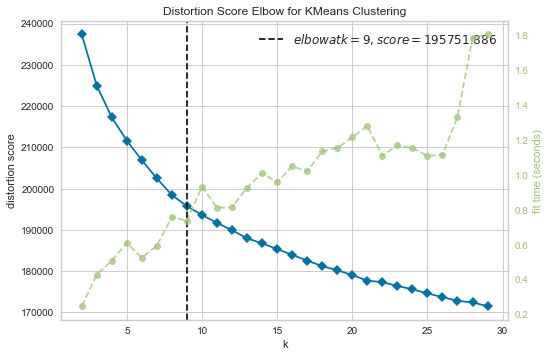

In [275]:
# find k
# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(2,30))

visualizer.fit(X_std)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

In [276]:
from cycler import cycler
plt.rcParams['axes.prop_cycle'] = cycler(color='bgrcmyk')

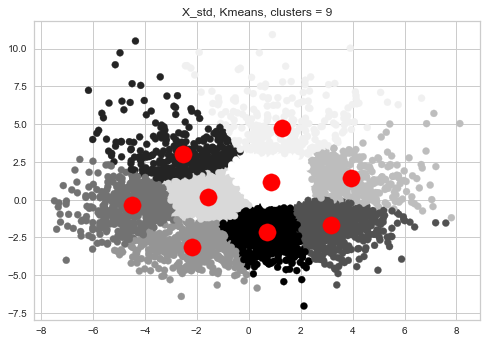

In [277]:
# reduce data to two components for plotting
X_pca = PCA(2).fit_transform(X_std)

# calculate predicted values
kmeans9_std = KMeans(n_clusters=9, init='k-means++', random_state=42).fit_predict(X_std)
#fit to graph
kmeans9_pca = KMeans(n_clusters=9, init='k-means++', random_state=42)
y_9pred_pca = kmeans9_pca.fit_predict(X_pca)
# plot the solution with centroids

plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_9pred_pca)
plt.scatter(kmeans9_pca.cluster_centers_[:, 0], 
            kmeans9_pca.cluster_centers_[:, 1], s=300, c='red')
plt.title('X_std, Kmeans, clusters = 9')
plt.show()

In [278]:
# calculate silhouette_score
from sklearn.metrics import silhouette_score
silhouette_kmeans9 = silhouette_score(X_std, kmeans9_std)

print('X_std, Kmeans, clusters = 9')
print(silhouette_kmeans9)

X_std, Kmeans, clusters = 9
0.04866418388078674


### group 2: X_mec (body measurements)

#### X_mec clustering, reference

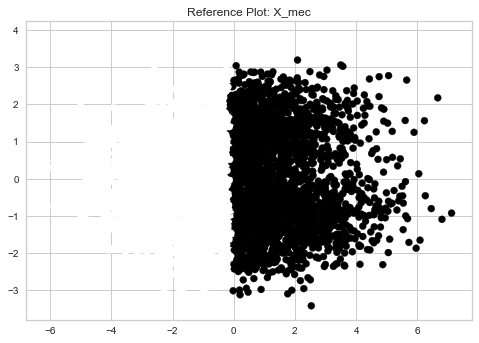

In [279]:
# reduce data to two components for plotting
X_mec_pca = PCA(2).fit_transform(X_mec)

# calculate predicted values
y_mec = KMeans(n_clusters=2, random_state=42).fit_predict(X_mec)
y_pred_mpca = KMeans(n_clusters=2, random_state=42).fit_predict(X_mec_pca)

# plot the solution

plt.scatter(X_mec_pca[:, 0], X_mec_pca[:, 1], c=y_pred_mpca)
plt.title('Reference Plot: X_mec')
plt.show()

#### X_mec, fit kmeans

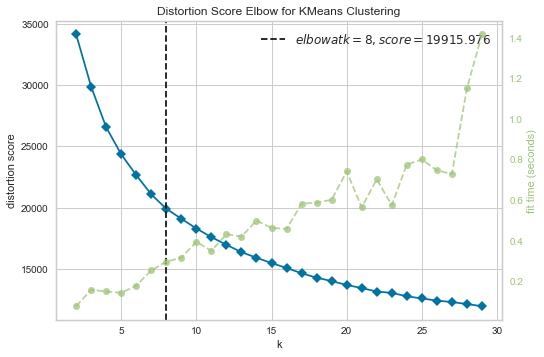

In [280]:
# find k
# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(2,30))

visualizer.fit(X_mec)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

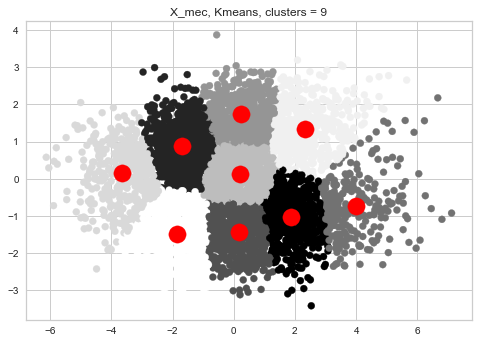

In [281]:
#X_mec, using 8 clusters
# reduce data to two components for plotting
X_mec_pca = PCA(2).fit_transform(X_mec)

# calculate predicted values
kmeans9_mec = KMeans(n_clusters=9, init='k-means++', random_state=42).fit_predict(X_mec)
#fit to graph
kmeans9_mec_pca = KMeans(n_clusters=9, init='k-means++', random_state=42)
y_9pred_mec_pca = kmeans9_mec_pca.fit_predict(X_mec_pca)
# plot the solution with centroids

plt.scatter(X_mec_pca[:, 0], X_mec_pca[:, 1], c=y_9pred_mec_pca)
plt.scatter(kmeans9_mec_pca.cluster_centers_[:, 0], 
            kmeans9_mec_pca.cluster_centers_[:, 1], s=300, c='red')
plt.title('X_mec, Kmeans, clusters = 9')
plt.show()

In [282]:
# calculate silhouette_score
silhouette_kmeans9_mec = silhouette_score(X_mec, kmeans9_mec)

print('X_std, Kmeans, clusters = 9')
print(silhouette_kmeans9_mec)

X_std, Kmeans, clusters = 9
0.17285573317869343


### group 3: X_lab (lab data)

#### X_lab clustering, reference

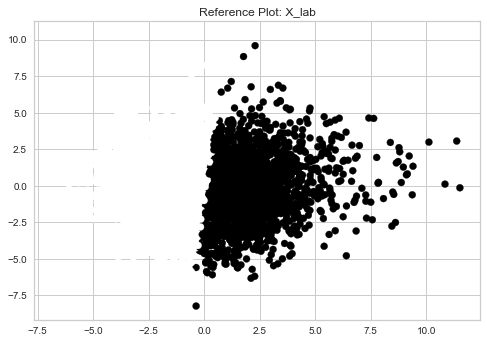

In [283]:
# reduce data to two components for plotting
X_lab_pca = PCA(2).fit_transform(X_lab)

# calculate predicted values
y_lab = KMeans(n_clusters=2, random_state=42).fit_predict(X_lab)
y_pred_lpca = KMeans(n_clusters=2, random_state=42).fit_predict(X_lab_pca)

# plot the solution

plt.scatter(X_lab_pca[:, 0], X_lab_pca[:, 1], c=y_pred_lpca)
plt.title('Reference Plot: X_lab')
plt.show()

#### X_lab, fit kmeans

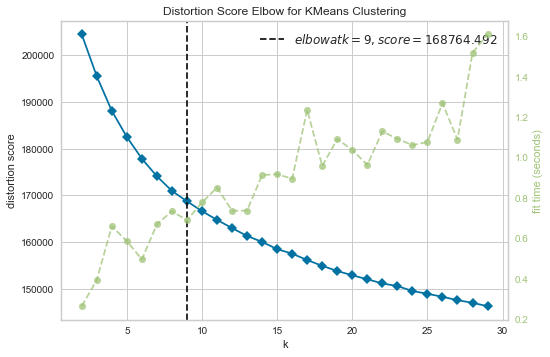

In [284]:
# find k
# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(2,30))

visualizer.fit(X_lab)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

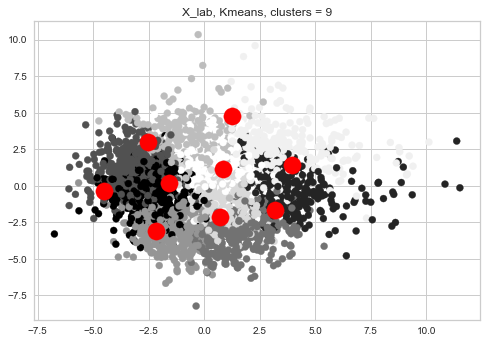

In [285]:
# reduce data to two components for plotting
X_lab_pca = PCA(2).fit_transform(X_lab)

# calculate predicted values
kmeans9_lab = KMeans(n_clusters=9, init='k-means++', random_state=42).fit_predict(X_lab)
#fit to graph
kmeans9_lpca = KMeans(n_clusters=9, init='k-means++', random_state=42)
y_9pred_lpca = kmeans9_lpca.fit_predict(X_pca)
# plot the solution with centroids

plt.scatter(X_lab_pca[:, 0], X_lab_pca[:, 1], c=y_9pred_pca)
plt.scatter(kmeans9_lpca.cluster_centers_[:, 0], 
            kmeans9_lpca.cluster_centers_[:, 1], s=300, c='red')
plt.title('X_lab, Kmeans, clusters = 9')
plt.show()

In [286]:
# calculate silhouette_score
from sklearn.metrics import silhouette_score
silhouette_kmeans9_lab = silhouette_score(X_lab, kmeans9_lab)

print('X_lab, Kmeans, clusters = N')
print(silhouette_kmeans9_lab)

X_lab, Kmeans, clusters = N
0.04887071893331051


#### kmeans cluster silhoueette scores

In [287]:
print('Silhouette score kmeans body measurements & labs: {}'.format(silhouette_kmeans9))
print('Silhouette score kmeans body measurements: {}'.format(silhouette_kmeans9_mec))
print('Silhouette score kmeans lab measurements: {}'.format (silhouette_kmeans9_lab))

Silhouette score kmeans body measurements & labs: 0.04866418388078674
Silhouette score kmeans body measurements: 0.17285573317869343
Silhouette score kmeans lab measurements: 0.04887071893331051


## mini batch kmeans

### group 1: X_std (body measurements & lab data)

#### mini batch kmeans with 'k-means++' centroids

In [288]:
#X_std
#model
minibatch9_kmeans = MiniBatchKMeans(
    init='k-means++',
    n_clusters=9,
    batch_size=200,
    random_state=42)

# fit & calculate predicted values
mini9_std = minibatch9_kmeans.fit_predict(X_std)

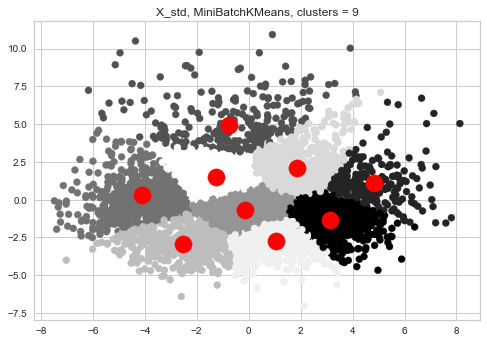

In [289]:
# reduce data to two components for plotting
X_mini_pca = PCA(2).fit_transform(X_std)

# predicted values, as above 
# fit to graph
kmini9_pca = MiniBatchKMeans(
    init='k-means++',
    n_clusters=9,
    batch_size=200,
    random_state=42)
pred_kmini9_pca = kmini9_pca.fit_predict(X_mini_pca)

# plot the solution with centroids
sns.set_palette('bright')
plt.scatter(X_mini_pca[:, 0], X_mini_pca[:, 1], c=pred_kmini9_pca)
plt.scatter(kmini9_pca.cluster_centers_[:, 0], 
            kmini9_pca.cluster_centers_[:, 1], s=300, c='red')
plt.title('X_std, MiniBatchKMeans, clusters = 9')
plt.show()

In [290]:
# calculate silhouette_score
silhouette_minibatch9_std = silhouette_score(X_std, mini9_std)
print(silhouette_minibatch9_std)

0.0466873448363177


### group 2: X_mec (body measurements )

In [291]:
# X_mec
#model
minibatch9_kmeans = MiniBatchKMeans(
    init='k-means++',
    n_clusters=9,
    batch_size=200,
    random_state=42)

# fit & calculate predicted values
mini9_mec = minibatch9_kmeans.fit_predict(X_mec)



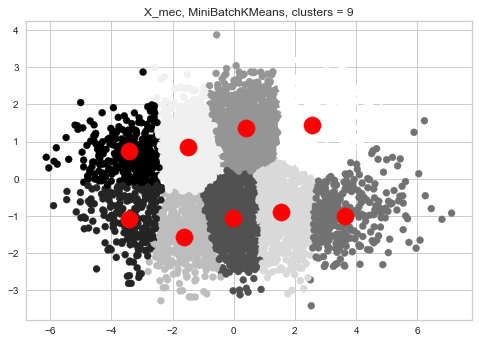

In [292]:
# reduce data to two components for plotting
X_mini_mec_pca = PCA(2).fit_transform(X_mec)

# predicted values, as above
# fit to graph
mini9_mec_pca = MiniBatchKMeans(
    init='k-means++',
    n_clusters=9,
    batch_size=200,
    random_state=42)
pred_kmini9_mec_pca = mini9_mec_pca.fit_predict(X_mini_mec_pca)

# plot the solution with centroids
sns.set_palette('bright')
plt.scatter(X_mini_mec_pca[:, 0], X_mini_mec_pca[:, 1], c=pred_kmini9_mec_pca)
plt.scatter(mini9_mec_pca.cluster_centers_[:, 0], 
            mini9_mec_pca.cluster_centers_[:, 1], s=300, c='red')
plt.title('X_mec, MiniBatchKMeans, clusters = 9')
plt.show()

In [293]:
# calculate silhouette_score
silhouette_minibatch9_mec = silhouette_score(X_mec, mini9_mec)
print(silhouette_minibatch9_mec)

0.16914761315999866


### group 3: X_lab (lab data)

In [294]:
# X_lab
#model
minibatch9_kmeans = MiniBatchKMeans(
    init='k-means++',
    n_clusters=9,
    batch_size=200,
    random_state=42)

# fit & calculate predicted values
mini9_lab = minibatch9_kmeans.fit_predict(X_lab)



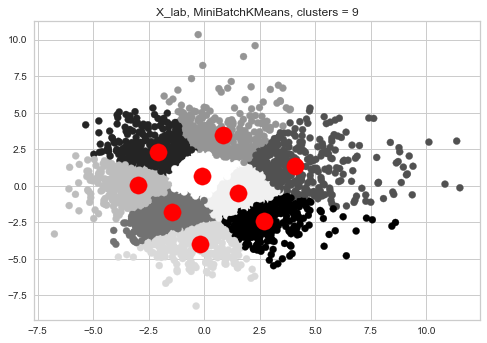

In [295]:
# reduce data to two components for plotting
X_mini_lab_pca = PCA(2).fit_transform(X_lab)

# predicted values, as above
# fit to graph
mini9_lab_pca = MiniBatchKMeans(
    init='k-means++',
    n_clusters=9,
    batch_size=200,
    random_state=42)
pred_kmini9_lab_pca = mini9_lab_pca.fit_predict(X_mini_lab_pca)

# plot the solution with centroids

plt.scatter(X_mini_lab_pca[:, 0], X_mini_lab_pca[:, 1], c=pred_kmini9_lab_pca)
plt.scatter(mini9_lab_pca.cluster_centers_[:, 0], 
            mini9_lab_pca.cluster_centers_[:, 1], s=300, c='red')
plt.title('X_lab, MiniBatchKMeans, clusters = 9')
plt.show()

In [296]:
# calculate silhouette_score
silhouette_minibatch9_lab = silhouette_score(X_lab, mini9_lab)
print(silhouette_minibatch9_lab)

0.04531915476507719


In [297]:
print('Silhouette score kmeans body measurements & labs: {}'.format(silhouette_kmeans9))
print('Silhouette score kmeans body measurements: {}'.format(silhouette_kmeans9_mec))
print('Silhouette score kmeans lab measurements: {}'.format (silhouette_kmeans9_lab))
print('Silhouette score minibatch body measurements & labs: {}'.format(silhouette_minibatch9_std))
print('Silhouette score minibatch body measurements: {}'.format(silhouette_minibatch9_mec))
print('Silhouette score minibatch lab measurements: {}'.format (silhouette_minibatch9_lab))

Silhouette score kmeans body measurements & labs: 0.04866418388078674
Silhouette score kmeans body measurements: 0.17285573317869343
Silhouette score kmeans lab measurements: 0.04887071893331051
Silhouette score minibatch body measurements & labs: 0.0466873448363177
Silhouette score minibatch body measurements: 0.16914761315999866
Silhouette score minibatch lab measurements: 0.04531915476507719


## mean shift

### group 1: X_std (body measurements & lab data)

In [298]:
from sklearn.cluster import MeanShift, estimate_bandwidth

# set the bandwidth automatically; function derives a bandwidth
# number based on an inspection of the distances among points 
# in the data.
bandwidth = estimate_bandwidth(X_std, quantile=0.2, n_samples=500)

# declare and fit the model
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True)
ms_std = ms.fit_predict(X_std)

# extract cluster assignments for each data point
labels = ms.labels_

# coordinates of the cluster centers
cluster_centers = ms.cluster_centers_

# count our clusters
n_clusters_ = len(np.unique(labels))

print("Number of estimated clusters: {}".format(n_clusters_))

Number of estimated clusters: 2


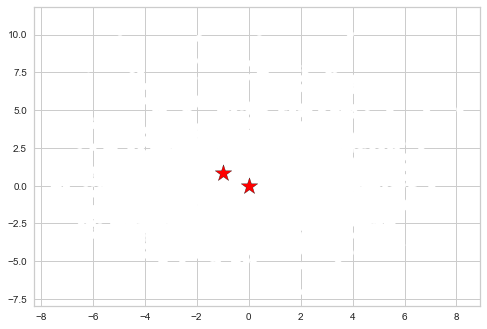

In [299]:
# reduce data to two components for plotting
X_ms_std_pca = PCA(2).fit_transform(X_std)


#fit to graph
ms_std_pca = MeanShift(bandwidth=bandwidth, bin_seeding=True)
pred_ms_std_pca = ms_std_pca.fit_predict(X_ms_std_pca)

# plot the solution 

plt.scatter(X_ms_std_pca[:, 0], X_ms_std_pca[:, 1], c=pred_ms_std_pca)

# plot the centroids
plt.scatter(
    ms.cluster_centers_[:, 0], ms.cluster_centers_[:, 1],
    s=300, marker='*',
    c='red', edgecolor='black',
    label='centroids')


plt.show()

In [300]:
# calculate silhouette_score
silhoueette_ms_std = silhouette_score(X_std, ms.labels_)
print(silhoueette_ms_std)

0.2584470929714834


### group 2: X_mec (body measurements)

In [301]:
bandwidth = estimate_bandwidth(X_mec, quantile=0.2, n_samples=500)

# declare and fit the model
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True)
ms_mec = ms.fit_predict(X_mec)

# extract cluster assignments for each data point
mec_labels = ms.labels_

# coordinates of the cluster centers
mec_cluster_centers = ms.cluster_centers_

# count our clusters.
n_clusters_ = len(np.unique(mec_labels))

print("Number of estimated clusters: {}".format(n_clusters_))

Number of estimated clusters: 1


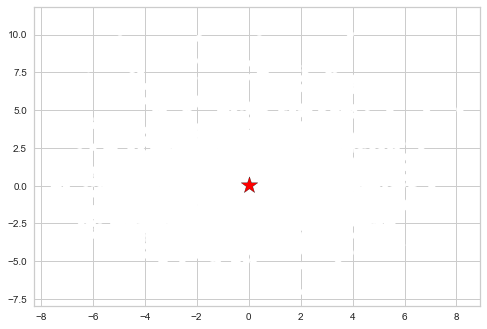

In [302]:
# reduce data to two components for plotting
X_ms_std_pca = PCA(2).fit_transform(X_std)


#fit to graph
ms_std_pca = MeanShift(bandwidth=bandwidth, bin_seeding=True)
pred_ms_std_pca = ms_std_pca.fit_predict(X_ms_std_pca)

# plot the solution

plt.scatter(X_ms_std_pca[:, 0], X_ms_std_pca[:, 1], c=pred_ms_std_pca)

# plot the centroids
plt.scatter(
    ms.cluster_centers_[:, 0], ms.cluster_centers_[:, 1],
    s=300, marker='*',
    c='red', edgecolor='black',
    label='centroids')


plt.show()

In [303]:
# calculate silhouette_score
silhoueette_ms_mec = silhouette_score(X_mec, ms.labels_)
print(silhoueette_ms_mec)

ValueError: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)

### group 3: X_lab (lab data)

In [304]:
bandwidth = estimate_bandwidth(X_lab, quantile=0.2, n_samples=500)

# declare and fit the model
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True)
ms_lab = ms.fit_predict(X_lab)

# extract cluster assignments for each data point
lab_labels = ms.labels_

# coordinates of the cluster centers
lab_cluster_centers = ms.cluster_centers_

# count our clusters
n_clusters_ = len(np.unique(lab_labels))

print("Number of estimated clusters: {}".format(n_clusters_))

Number of estimated clusters: 2


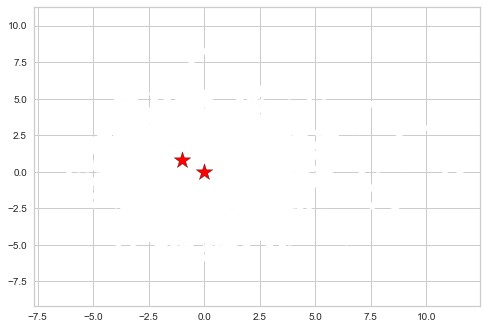

In [305]:
# reduce data to two components for plotting
X_ms_lab_pca = PCA(2).fit_transform(X_lab)


#fit to graph
ms_lab_pca = MeanShift(bandwidth=bandwidth, bin_seeding=True)
pred_ms_lab_pca = ms_lab_pca.fit_predict(X_ms_lab_pca)

# plot the solution 

plt.scatter(X_ms_lab_pca[:, 0], X_ms_lab_pca[:, 1], c=pred_ms_lab_pca)

# plot the centroids
plt.scatter(
    ms.cluster_centers_[:, 0], ms.cluster_centers_[:, 1],
    s=300, marker='*',
    c='red', edgecolor='black',
    label='centroids')


plt.show()

In [306]:
# calculate silhouette_score
silhoueette_ms_lab = silhouette_score(X_lab, ms.labels_)
print(silhoueette_ms_lab)

0.25752785123194827


In [307]:
print('Silhouette score kmeans body measurements & labs: {}'.format(silhouette_kmeans9))
print('Silhouette score kmeans body measurements: {}'.format(silhouette_kmeans9_mec))
print('Silhouette score kmeans lab measurements: {}'.format (silhouette_kmeans9_lab))
print('Silhouette score minibatch body measurements & labs: {}'.format(silhouette_minibatch9_std))
print('Silhouette score minibatch body measurements: {}'.format(silhouette_minibatch9_mec))
print('Silhouette score minibatch lab measurements: {}'.format (silhouette_minibatch9_lab))
print('Silhouette score means shift body measurements & labs: {}'.format(silhoueette_ms_std))
print('Silhouette score means shift lab measurements: {}'.format (silhoueette_ms_lab))

Silhouette score kmeans body measurements & labs: 0.04866418388078674
Silhouette score kmeans body measurements: 0.17285573317869343
Silhouette score kmeans lab measurements: 0.04887071893331051
Silhouette score minibatch body measurements & labs: 0.0466873448363177
Silhouette score minibatch body measurements: 0.16914761315999866
Silhouette score minibatch lab measurements: 0.04531915476507719
Silhouette score means shift body measurements & labs: 0.2584470929714834
Silhouette score means shift lab measurements: 0.25752785123194827


#### comment: the best performing 
**combined cluster** per silhouette score is the means shift body measurements & labs: 0.2584470929714834; 

**lab cluster** per silhouette score is the means shift lab: 0.25752785123194827; 

**body measurement cluster** per silhouette score is the kmeans body measurements: 0.17285573317869343;

will use this cluster as a variable in supervised model.

### add predictions from kmeans cluster to df

In [308]:
nhanes_full_df['cluster_std']= pd.Series(ms_std, index=nhanes_full_df.index)

In [309]:
nhanes_full_df['cluster_mec']= pd.Series(kmeans9_mec, index=nhanes_full_df.index)

In [310]:
nhanes_full_df['cluster_lab']= pd.Series(ms_lab, index=nhanes_full_df.index)

In [311]:
nhanes_full_df.columns.tolist()

['SEQN',
 'RIAGENDR',
 'RIDAGEYR',
 'WTINT2YR',
 'WTMEC2YR',
 'INDFMPIR',
 'MCQ160B',
 'MCQ160C',
 'MCQ160D',
 'MCQ160E',
 'MCQ300A',
 'MCQ365C',
 'MCQ365D',
 'MCQ370A',
 'MCQ370C',
 'MCQ370D',
 'BMXWT',
 'BMXHT',
 'BMXBMI',
 'BMXWAIST',
 'BMDAVSAD',
 'BPQ020',
 'BPQ030',
 'BPQ040A',
 'BPQ050A',
 'BPQ080',
 'BPQ060',
 'BPQ070',
 'BPQ090D',
 'BPQ100D',
 'bp_sys_avg',
 'bp_dis_avg',
 'LBXWBCSI',
 'LBXLYPCT',
 'LBXMOPCT',
 'LBXNEPCT',
 'LBXEOPCT',
 'LBXBAPCT',
 'LBDLYMNO',
 'LBDMONO',
 'LBDNENO',
 'LBDEONO',
 'LBXRBCSI',
 'LBXHGB',
 'LBXHCT',
 'LBXMCVSI',
 'LBXMCHSI',
 'LBXRDW',
 'LBXPLTSI',
 'LBXMPSI',
 'LBXSAL',
 'LBXSAPSI',
 'LBXSASSI',
 'LBXSATSI',
 'LBXSBU',
 'LBXSC3SI',
 'LBXSCA',
 'LBXSCH',
 'LBXSCK',
 'LBXSCLSI',
 'LBXSCR',
 'LBXSGL',
 'LBXSIR',
 'LBXSKSI',
 'LBXSLDSI',
 'LBXSNASI',
 'LBXSOSSI',
 'LBXSPH',
 'LBDSPHSI',
 'LBXSTB',
 'LBXSTP',
 'LBXSTR',
 'LBXSUA',
 'LBDHDD',
 'LBXTC',
 'LBXHSCRP',
 'WTDRD1_x',
 'WTDR2D_x',
 'DRDINT_x',
 'DBQ095Z',
 'DBD100',
 'DRQSPREP',
 'DR1STY',


In [312]:
nhanes_full_df.head()

,SEQN,RIAGENDR,RIDAGEYR,WTINT2YR,WTMEC2YR,INDFMPIR,MCQ160B,MCQ160C,MCQ160D,MCQ160E,MCQ300A,MCQ365C,MCQ365D,MCQ370A,MCQ370C,MCQ370D,BMXWT,BMXHT,BMXBMI,BMXWAIST,BMDAVSAD,BPQ020,BPQ030,BPQ040A,BPQ050A,BPQ080,BPQ060,BPQ070,BPQ090D,BPQ100D,bp_sys_avg,bp_dis_avg,LBXWBCSI,LBXLYPCT,LBXMOPCT,LBXNEPCT,LBXEOPCT,LBXBAPCT,LBDLYMNO,LBDMONO,LBDNENO,LBDEONO,LBXRBCSI,LBXHGB,LBXHCT,LBXMCVSI,LBXMCHSI,LBXRDW,LBXPLTSI,LBXMPSI,LBXSAL,LBXSAPSI,LBXSASSI,LBXSATSI,LBXSBU,LBXSC3SI,LBXSCA,LBXSCH,LBXSCK,LBXSCLSI,LBXSCR,LBXSGL,LBXSIR,LBXSKSI,LBXSLDSI,LBXSNASI,LBXSOSSI,LBXSPH,LBDSPHSI,LBXSTB,LBXSTP,LBXSTR,LBXSUA,LBDHDD,LBXTC,LBXHSCRP,WTDRD1_x,WTDR2D_x,DRDINT_x,DBQ095Z,DBD100,DRQSPREP,DR1STY,DRQSDIET,DR1TCAFF,DRD360,DR2STY,WTDRD1_x,WTDR2D_x,DS1DS,DS1AN,DS2DS,DS2AN,tot_kcal_avg,tot_pro_avg,tot_carb_avg,tot_sugar_avg,tot_fiber_avg,tot_fat_avg,tot_sfat_avg,tot_mfat_avg,tot_pfat_avg,tot_fchol_avg,tot_vit_e_avg,tot_retinol_avg,tot_vit_a_avg,tot_alpha_c_avg,tot_beta_c_avg,tot_beta_cry_avg,tot_lyco_avg,tot_lutein_avg,vit_b1_avg,vit_b2_avg,niac_avg,vit_b6_avg,folate_avg,folic_acid_avg,food_fol_avg,folate_dfe_avg,tot_choline_avg,vit_b12_avg,vit_c_avg,vit_d_avg,tot_vit_k_avg,calc_avg,tot_phos_avg,mag_avg,fe_avg,zn_avg,cu_avg,na_avg,k_avg,se_avg,tot_mois_avg,tot_h20_avg,supp_b1_avg,supp_b2_avg,supp_nia_avg,supp_b6_avg,supp_b12_avg,supp_folate_avg,supp_folfde_avg,supp_c_avg,supp_d_avg,supp_ca_avg,supp_mg_avg,supp_fe_avg,supp_zn_avg,supp_cu_avg,supp_na_avg,supp_potk_avg,supp_se_avg,tot_b1_avg,tot_b2_avg,tot_niac_avg,tot_b6_avg,tot_b12_avg,tot_c_avg,tot_d_avg,tot_calc_avg,tot_mag_avg,tot_fe_avg,tot_zn_avg,tot_cu_avg,tot_na_avg,tot_k_avg,tot_se_avg,tot_folate_avg,heart_dz,log_BMXWT,log_BMXBMI,log_BMXWAIST,log_bp_sys_avg,log_bp_dis_avg,log_LBXWBCSI,log_LBXLYPCT,log_LBXMOPCT,log_LBXEOPCT,log_LBXBAPCT,log_LBDLYMNO,log_LBDMONO,log_LBDNENO,log_LBDEONO,log_LBXRBCSI,log_LBXHCT,log_LBXRDW,log_LBXPLTSI,log_LBXMPSI,log_LBXSAPSI,log_LBXSASSI,log_LBXSATSI,log_LBXSBU,log_LBXSCA,log_LBXSCH,log_LBXSCK,log_LBXSCLSI,log_LBXSCR,log_LBXSGL,log_LBXSIR,log_LBXSKSI,log_LBXSLDSI,log_LBXSNASI,log_LBXSOSSI,log_LBXSPH,log_LBDSPHSI,log_LBXSTB,log_LBXSTP,log_LBXSTR,log_LBXSUA,log_LBDHDD,log_LBXTC,log_LBXHSCRP,log_DR1TCAFF,log_tot_kcal_avg,log_tot_pro_avg,log_tot_carb_avg,log_tot_sugar_avg,log_tot_fiber_avg,log_tot_fat_avg,log_tot_sfat_avg,log_tot_mfat_avg,log_tot_pfat_avg,log_tot_fchol_avg,log_tot_vit_e_avg,log_tot_retinol_avg,log_tot_vit_a_avg,log_tot_alpha_c_avg,log_tot_beta_c_avg,log_tot_beta_cry_avg,log_tot_lyco_avg,log_tot_lutein_avg,log_vit_b1_avg,log_vit_b2_avg,log_niac_avg,log_vit_b6_avg,log_folate_avg,log_folic_acid_avg,log_food_fol_avg,log_folate_dfe_avg,log_tot_choline_avg,log_vit_b12_avg,log_vit_c_avg,log_vit_d_avg,log_tot_vit_k_avg,log_calc_avg,log_tot_phos_avg,log_mag_avg,log_fe_avg,log_zn_avg,log_cu_avg,log_na_avg,log_k_avg,log_se_avg,log_tot_mois_avg,log_tot_h20_avg,log_tot_b1_avg,log_tot_b2_avg,log_tot_niac_avg,log_tot_b6_avg,log_tot_b12_avg,log_tot_c_avg,log_tot_d_avg,log_tot_calc_avg,log_tot_mag_avg,log_tot_fe_avg,log_tot_zn_avg,log_tot_cu_avg,log_tot_na_avg,log_tot_k_avg,log_tot_se_avg,log_tot_folate_avg,MCQ160B_2.0,MCQ160B_9.0,MCQ160C_2.0,MCQ160C_9.0,MCQ160D_2.0,MCQ160D_9.0,MCQ160E_2.0,MCQ160E_9.0,MCQ300A_2.0,MCQ300A_7.0,MCQ300A_9.0,MCQ365C_2.0,MCQ365C_9.0,MCQ365D_2.0,MCQ365D_9.0,MCQ370A_2.0,MCQ370A_9.0,MCQ370C_2.0,MCQ370C_9.0,MCQ370D_2.0,MCQ370D_9.0,BPQ020_2.0,BPQ020_9.0,BPQ030_2.0,BPQ030_9.0,BPQ040A_2.0,BPQ040A_9.0,BPQ050A_2.0,BPQ050A_9.0,BPQ080_2.0,BPQ080_9.0,BPQ060_2.0,BPQ060_9.0,BPQ070_2.0,BPQ070_3.0,BPQ070_4.0,BPQ070_9.0,BPQ090D_2.0,BPQ090D_9.0,BPQ100D_2.0,BPQ100D_9.0,DBD100_1.0,DBD100_2.0,DBD100_3.0,DBD100_9.0,DRQSPREP_1.0,DRQSPREP_2.0,DRQSPREP_3.0,DRQSPREP_4.0,DRQSPREP_9.0,DR1STY_1.0,DR1STY_2.0,DR1STY_9.0,DRQSDIET_1.0,DRQSDIET_2.0,DRQSDIET_9.0,DR2STY_1.0,DR2STY_2.0,DR2STY_9.0,DS1DS_1.0,DS1DS_2.0,DS1AN_1.0,DS1AN_2.0,DS2DS_1.0,DS2DS_2.0,DS2AN_1.0,DS2AN_2.0,cluster_std,cluster_mec,cluster_lab
0,83732.0,1,62.0,134671.370419,135629.507405,4.39,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2

# supervised model

## create df for supervised model

In [313]:
nhanes_model_df = nhanes_full_df[
    ['RIAGENDR', 'RIDAGEYR', 'INDFMPIR', 'WTDRD1_x', 'WTDR2D_x',
     'heart_dz', 'log_DR1TCAFF', 'log_tot_kcal_avg', 'log_tot_pro_avg',
     'log_tot_carb_avg', 'log_tot_sugar_avg', 'log_tot_fiber_avg',
     'log_tot_fat_avg', 'log_tot_sfat_avg', 'log_tot_mfat_avg',
     'log_tot_pfat_avg', 'log_tot_fchol_avg', 'log_tot_vit_e_avg',
     'log_tot_retinol_avg', 'log_tot_vit_a_avg', 'log_tot_alpha_c_avg',
     'log_tot_beta_c_avg', 'log_tot_beta_cry_avg', 'log_tot_lyco_avg',
     'log_tot_lutein_avg', 'log_vit_b1_avg', 'log_vit_b2_avg', 
     'log_niac_avg', 'log_vit_b6_avg', 'log_folate_avg', 'log_folic_acid_avg', 
     'log_food_fol_avg', 'log_folate_dfe_avg', 'log_tot_choline_avg', 
     'log_vit_b12_avg', 'log_vit_c_avg', 'log_vit_d_avg', 'log_tot_vit_k_avg', 
     'log_calc_avg', 'log_tot_phos_avg', 'log_mag_avg', 'log_fe_avg', 
     'log_zn_avg', 'log_cu_avg', 'log_na_avg', 'log_k_avg', 'log_se_avg', 
     'log_tot_mois_avg', 'log_tot_h20_avg', 'log_tot_b1_avg', 'log_tot_b2_avg',
     'log_tot_niac_avg', 'log_tot_b6_avg', 'log_tot_b12_avg', 'log_tot_c_avg', 
     'log_tot_d_avg', 'log_tot_calc_avg', 'log_tot_mag_avg', 'log_tot_fe_avg', 
     'log_tot_zn_avg', 'log_tot_cu_avg', 'log_tot_na_avg', 'log_tot_k_avg', 
     'log_tot_se_avg', 'log_tot_folate_avg', 'MCQ300A_2.0', 'MCQ300A_7.0', 
     'MCQ300A_9.0', 'MCQ365C_2.0', 'MCQ365C_9.0', 'MCQ365D_2.0', 'MCQ365D_9.0',
     'MCQ370A_2.0', 'MCQ370A_9.0', 'MCQ370C_2.0', 'MCQ370C_9.0', 'MCQ370D_2.0',
     'MCQ370D_9.0', 'BPQ020_2.0', 'BPQ020_9.0', 'BPQ030_2.0', 'BPQ030_9.0', 
     'BPQ040A_2.0', 'BPQ040A_9.0', 'BPQ050A_2.0', 'BPQ050A_9.0', 'BPQ080_2.0', 
     'BPQ080_9.0', 'BPQ060_2.0', 'BPQ060_9.0', 'BPQ070_2.0', 'BPQ070_3.0', 
     'BPQ070_4.0', 'BPQ070_9.0', 'BPQ090D_2.0', 'BPQ090D_9.0', 'BPQ100D_2.0', 
     'BPQ100D_9.0', 'DBD100_1.0', 'DBD100_2.0', 'DBD100_3.0', 'DBD100_9.0', 
     'DRQSPREP_1.0', 'DRQSPREP_2.0', 'DRQSPREP_3.0', 'DRQSPREP_4.0', 
     'DRQSPREP_9.0', 'DR1STY_1.0', 'DR1STY_2.0', 'DR1STY_9.0', 'DRQSDIET_1.0', 
     'DRQSDIET_2.0', 'DRQSDIET_9.0', 'DR2STY_1.0', 'DR2STY_2.0', 
     'DR2STY_9.0', 'DS1DS_1.0','DS1DS_2.0', 'DS1AN_1.0', 'DS1AN_2.0', 
     'DS2DS_1.0', 'DS2DS_2.0', 'DS2AN_1.0', 'DS2AN_2.0', 'cluster_std', 
     'cluster_mec', 'cluster_lab']]

In [314]:
nhanes_model_df = nhanes_model_df.loc[:,~nhanes_model_df.columns.duplicated()]

In [315]:
nhanes_model_df.head()

,RIAGENDR,RIDAGEYR,INDFMPIR,WTDRD1_x,WTDR2D_x,heart_dz,log_DR1TCAFF,log_tot_kcal_avg,log_tot_pro_avg,log_tot_carb_avg,log_tot_sugar_avg,log_tot_fiber_avg,log_tot_fat_avg,log_tot_sfat_avg,log_tot_mfat_avg,log_tot_pfat_avg,log_tot_fchol_avg,log_tot_vit_e_avg,log_tot_retinol_avg,log_tot_vit_a_avg,log_tot_alpha_c_avg,log_tot_beta_c_avg,log_tot_beta_cry_avg,log_tot_lyco_avg,log_tot_lutein_avg,log_vit_b1_avg,log_vit_b2_avg,log_niac_avg,log_vit_b6_avg,log_folate_avg,log_folic_acid_avg,log_food_fol_avg,log_folate_dfe_avg,log_tot_choline_avg,log_vit_b12_avg,log_vit_c_avg,log_vit_d_avg,log_tot_vit_k_avg,log_calc_avg,log_tot_phos_avg,log_mag_avg,log_fe_avg,log_zn_avg,log_cu_avg,log_na_avg,log_k_avg,log_se_avg,log_tot_mois_avg,log_tot_h20_avg,log_tot_b1_avg,log_tot_b2_avg,log_tot_niac_avg,log_tot_b6_avg,log_tot_b12_avg,log_tot_c_avg,log_tot_d_avg,log_tot_calc_avg,log_tot_mag_avg,log_tot_fe_avg,log_tot_zn_avg,log_tot_cu_avg,log_tot_na_avg,log_tot_k_avg,log_tot_se_avg,log_tot_folate_avg,MCQ300A_2.0,MCQ300A_7.0,MCQ300A_9.0,MCQ365C_2.0,MCQ365C_9.0,MCQ365D_2.0,MCQ365D_9.0,MCQ370A_2.0,MCQ370A_9.0,MCQ370C_2.0,MCQ370C_9.0,MCQ370D_2.0,MCQ370D_9.0,BPQ020_2.0,BPQ020_9.0,BPQ030_2.0,BPQ030_9.0,BPQ040A_2.0,BPQ040A_9.0,BPQ050A_2.0,BPQ050A_9.0,BPQ080_2.0,BPQ080_9.0,BPQ060_2.0,BPQ060_9.0,BPQ070_2.0,BPQ070_3.0,BPQ070_4.0,BPQ070_9.0,BPQ090D_2.0,BPQ090D_9.0,BPQ100D_2.0,BPQ100D_9.0,DBD100_1.0,DBD100_2.0,DBD100_3.0,DBD100_9.0,DRQSPREP_1.0,DRQSPREP_2.0,DRQSPREP_3.0,DRQSPREP_4.0,DRQSPREP_9.0,DR1STY_1.0,DR1STY_2.0,DR1STY_9.0,DRQSDIET_1.0,DRQSDIET_2.0,DRQSDIET_9.0,DR2STY_1.0,DR2STY_2.0,DR2STY_9.0,DS1DS_1.0,DS1DS_2.0,DS1AN_1.0,DS1AN_2.0,DS2DS_1.0,DS2DS_2.0,DS2AN_1.0,DS2AN_2.0,cluster_std,cluster_mec,cluster_lab
0,1,62.0,4.39,92670.699919,69945.934107,0,5.888878,7.724668,4.661692,5.474223,4.398822,3.032546,4.619221,3.494232,3.641853,3.164230,5.959716,2.361326,5.894403,6.480811,5.368310,8.101072,5.093750,7.287219,8.475954,1.158609,1.285783,3.368364,1.329989,6.048554,5.090678,5.566434,6.285067,6.032007,1.695616,4.483567,1.960095,5.820676,6.936343,7.290975,5.688669,2.823757,2.558002,0.779325,8.489925,8.073559,4.953712,8.120471,7.090910,1.044772,1.150176,3.219496,1.358538,2.755252,4.314484,2.332144,6.437752,5.154736,2.350899,2.522122,0.609766,7.801596,7.452112,4.392596,6.018593,1,0,0,1,0,1,0,0,0,1,0,1,0,1,0,0,1,0,1,0,1,1,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,1,0,0,1,1,0,0,1,0,6,0
1,1,53.0,1.32,16454.105994,13190.268870,0,5.262690,8.151478,4.745888,5.674045,4.688408,2.374906,4.764138,3.412648,3.715241,3.529825,6.381816,2.485323,5.678465,5.928258,5.618588,6.692084,4.174387,7.367393,7.095893,1.063330,1.292533,3.626193,1.237069,6.223568,4.787492,5.953243,6.375876,6.791502,2.457878,3.402863,1.589235,4.740575,6.417549,7.620215,5.976351,2.672768,2.086914,0.637634,8.271165,8.183956,4.809742,8.439158,6.203547,0.666803,0.841998,2.959315,0.798745,1.846879,2.742452,1.081805,6.228018,5.290789,2.046402,1.510722,0.368801,7.578273,7.491088,4.124712,5.585374,1,0,0,1,0,1,0,1,0,1,0,1,0,1,0,0,1,0,1,0,1,1,0,1,0,0,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,1,1,0,0,1,1,0,0,5,0
2,1,78.0,1.51,6529.619788,4928.422423,1,5.726848,7.698936,4.664759,5.522860,4.378144,3.305054,4.522386,3.480486,3.414739,3.114093,6.033086,2.198890,6.131226,6.381816,3.044522,7.268920,5.705448,9.706347,6.216606,1.053615,1.529745,3.239031,1.232414,5.932245,4.317488,5.715382,6.060291,6.245719,1.592292,4.028027,1.252763,4.554403,6.780490,7.271356,5.961005,3.062924,2.795145,1.101109,8.329175,8.279190,4.788741,7.845115,6.679599,0.958967,1.297053,3.102544,1.312311,2.481359,4.070308,2.397895,6.302161,5.577841,2.415467,2.783930,1.099862,7.636270,7.586296,4.749920,5.934012,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,1,0,0,0,1,0,1,0,0,1,1,0,0,1,0,4,0
3,2,56.0,5.00,58191.539622,0.000000,0,5.517453,6.508769,3.588783,4.381964,3.345861,2.079442,3.243178,2.282025,2.318803,1.756823,4.248495,1.241269,5.278115,5.342334,2.602690,5.020586,1.609438,7.036148,4.740575,

In [316]:
nhanes_model_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4712 entries, 0 to 9963
Columns: 127 entries, RIAGENDR to cluster_lab
dtypes: float64(63), int32(1), int64(4), uint8(59)
memory usage: 2.7 MB


In [317]:
nhanes_model_df['heart_dz'].value_counts()

0    4403
1     309
Name: heart_dz, dtype: int64

#### sample weight variables included in dataframe :

**tot_intake1_df, tot_intake2_df: 9545**
'WTDRD1' = Dietary day one sample weight
'WTDR2D' = Dietary two-day sample weight

## continuous data, visualize

### macronutrients

C:\Users\katec\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\Users\katec\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


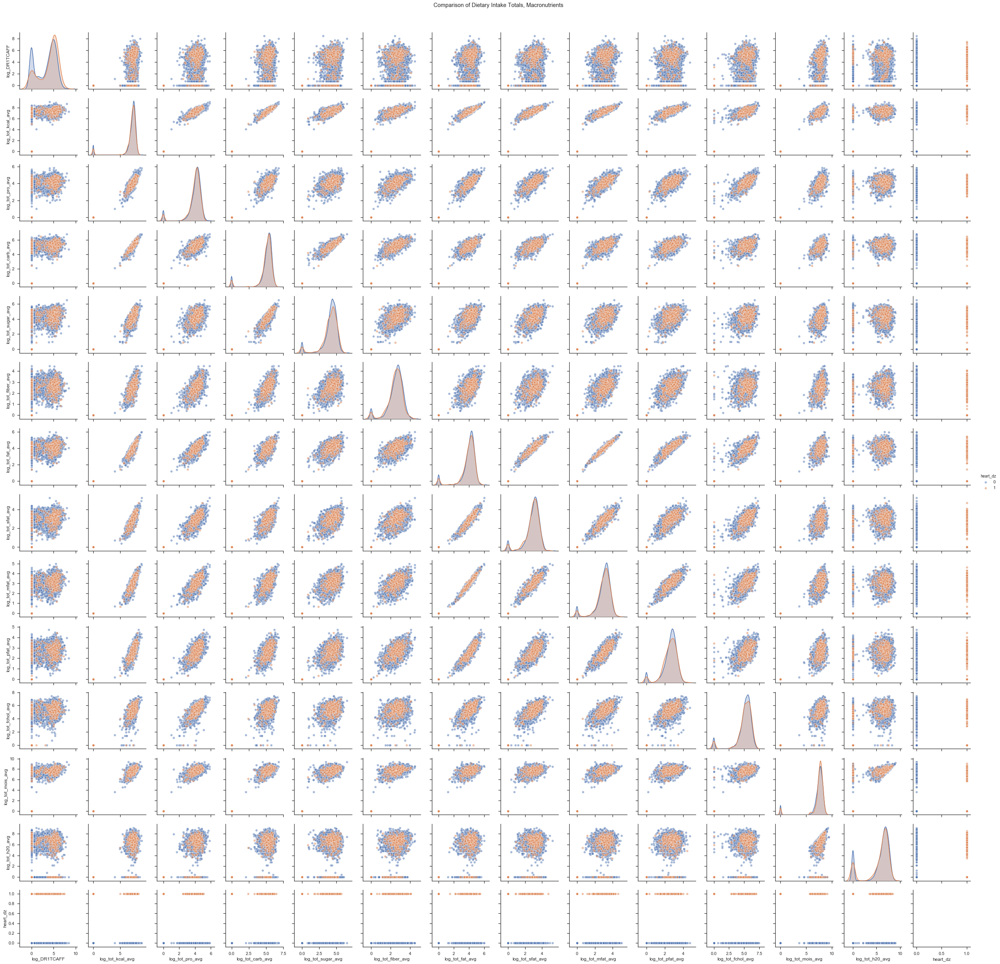

In [318]:
sns.set(style='ticks')

sns.pairplot(nhanes_model_df[
    ['log_DR1TCAFF', 'log_tot_kcal_avg', 'log_tot_pro_avg',
     'log_tot_carb_avg', 'log_tot_sugar_avg', 'log_tot_fiber_avg',
     'log_tot_fat_avg', 'log_tot_sfat_avg', 'log_tot_mfat_avg',
     'log_tot_pfat_avg', 'log_tot_fchol_avg', 'log_tot_mois_avg', 
     'log_tot_h20_avg','heart_dz']], 
            hue= 'heart_dz',
            plot_kws = {'alpha': 0.5},
            )
plt.subplots_adjust(top=0.95)
plt.suptitle('Comparison of Dietary Intake Totals, Macronutrients')
plt.show()

#### comment: relationship between variables appears to be non-linear; will try SVM in addition to RFC and gradient boosting models

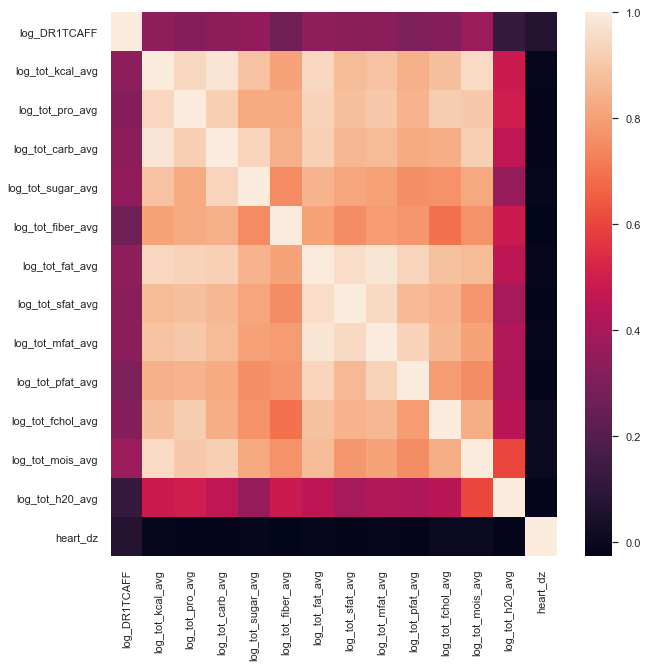

In [319]:
macronutrients = nhanes_model_df[
    ['log_DR1TCAFF', 'log_tot_kcal_avg', 'log_tot_pro_avg',
     'log_tot_carb_avg', 'log_tot_sugar_avg', 'log_tot_fiber_avg',
     'log_tot_fat_avg', 'log_tot_sfat_avg', 'log_tot_mfat_avg',
     'log_tot_pfat_avg', 'log_tot_fchol_avg', 'log_tot_mois_avg', 
     'log_tot_h20_avg', 'heart_dz']]

#correlation matrix
plt.figure(figsize=(10,10))
sns.set(font_scale=1)
sns.heatmap(macronutrients.corr())
plt.show()

In [320]:
macronutrients.corr()

,log_DR1TCAFF,log_tot_kcal_avg,log_tot_pro_avg,log_tot_carb_avg,log_tot_sugar_avg,log_tot_fiber_avg,log_tot_fat_avg,log_tot_sfat_avg,log_tot_mfat_avg,log_tot_pfat_avg,log_tot_fchol_avg,log_tot_mois_avg,log_tot_h20_avg,heart_dz
log_DR1TCAFF,1.000000,0.342473,0.314891,0.335715,0.349930,0.262231,0.341168,0.327022,0.329525,0.301760,0.318096,0.372880,0.118582,0.073751
log_tot_kcal_avg,0.342473,1.000000,0.947848,0.979779,0.888753,0.808357,0.946178,0.871306,0.890605,0.840017,0.881117,0.955105,0.485170,-0.010909
log_tot_pro_avg,0.314891,0.947848,1.000000,0.923148,0.830355,0.827996,0.935736,0.879790,0.905833,0.848470,0.917785,0.903939,0.497166,-0.017262
log_tot_carb_avg,0.335715,0.979779,0.923148,1.000000,0.937271,0.841668,0.924521,0.861290,0.870086,0.829297,0.839525,0.921675,0.455055,-0.016154
log_tot_sugar_avg,0.349930,0.888753,0.830355,0.937271,1.000000,0.754790,0.851148,0.816461,0.803658,0.759985,0.767791,0.820226,0.360507,-0.012300
log_tot_fiber_avg,0.262231,0.808357,0.827996,0.841668,0.754790,1.000000,0.810777,0.756625,0.793287,0.781608,0.691653,0.770398,0.486574,-0.026257
log_tot_fat_avg,0.341168,0.946178,0.935736,0.924521,0.851148,0.810777,1.000000,0.962839,0.982789,0.936879,0.887215,0.870815,0.454095,-0.013892
log_tot_sfat_avg,0.327022,0.871306,0.879790,0.861290,0.816461,0.756625,0.962839,1.000000,0.950239,0.867633,0.849100,0.779616,0.398074,-0.017381
log_tot_mfat_avg,0.329525,0.890605,0.905833,0.870086,0.803658,0.793287,0.982789,0.950239,1.000000,0.935245,0.860467,0.808575,0.425149,-0.012265
log_tot_pfat_avg,0.301760,0.840017,0.848470,0.829297,0.759985,0.781608,0.936879,0.867633,0.935245,1.000000,0.794285,0.758633,0.415507,-0.017496


#### comment: highly correlated features
remove feature with lower correlation to target value from pairs of highly correlated features:
'log_tot_kcal_avg', 'log_tot_pro_avg', 'log_tot_carb_avg', 'log_tot_fat_avg', 'log_tot_mois_avg'

In [321]:
np.abs(macronutrients.iloc[:,:].corr().loc[:,'heart_dz']).sort_values(ascending=False)

heart_dz             1.000000
log_DR1TCAFF         0.073751
log_tot_fiber_avg    0.026257
log_tot_pfat_avg     0.017496
log_tot_sfat_avg     0.017381
log_tot_pro_avg      0.017262
log_tot_carb_avg     0.016154
log_tot_h20_avg      0.015708
log_tot_fat_avg      0.013892
log_tot_sugar_avg    0.012300
log_tot_mfat_avg     0.012265
log_tot_kcal_avg     0.010909
log_tot_mois_avg     0.004058
log_tot_fchol_avg    0.001711
Name: heart_dz, dtype: float64

### fat-soluble vitamins, total

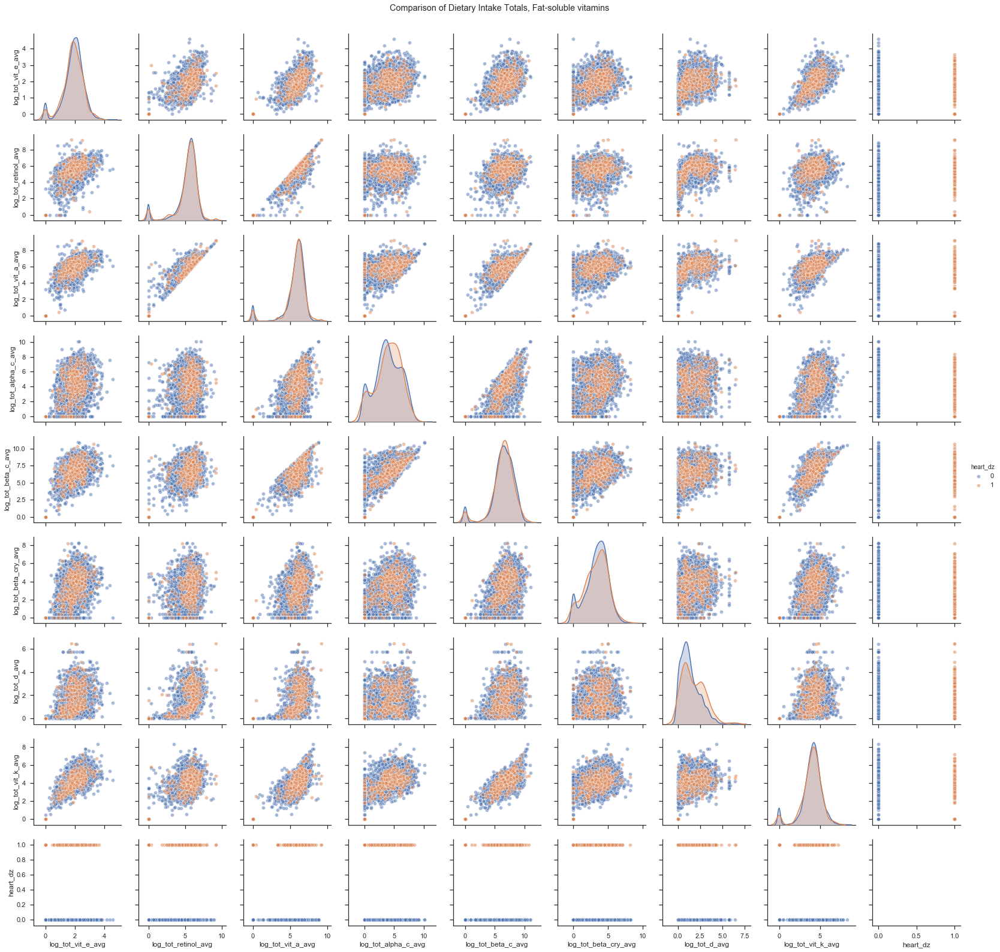

In [322]:
#comparing dietary intake (features) with target
sns.set(style='ticks')

sns.pairplot(nhanes_model_df[
    ['log_tot_vit_e_avg','log_tot_retinol_avg', 'log_tot_vit_a_avg', 
     'log_tot_alpha_c_avg', 'log_tot_beta_c_avg', 'log_tot_beta_cry_avg', 
     'log_tot_d_avg', 'log_tot_vit_k_avg','heart_dz']], 
            hue= 'heart_dz',
            plot_kws = {'alpha': 0.5})
plt.subplots_adjust(top=0.95)
plt.suptitle('Comparison of Dietary Intake Totals, Fat-soluble vitamins')
plt.show()

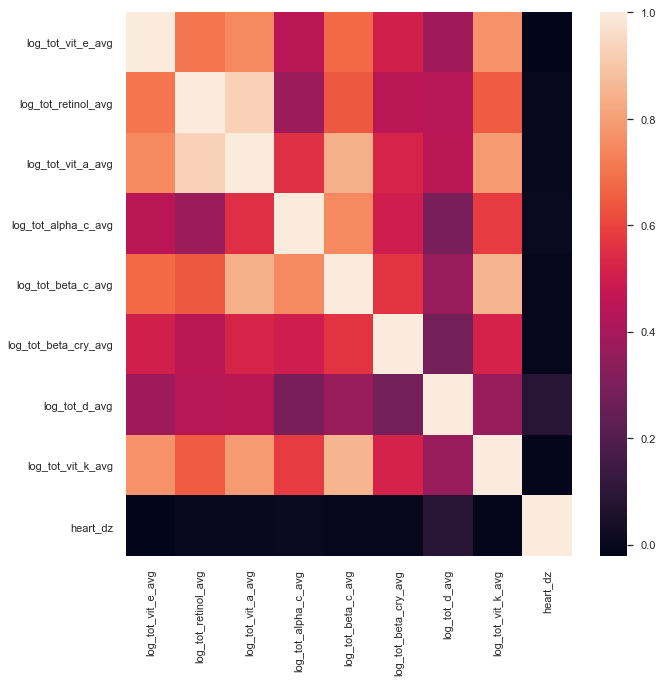

In [323]:
fat_sol = nhanes_model_df[
    ['log_tot_vit_e_avg','log_tot_retinol_avg', 'log_tot_vit_a_avg', 
     'log_tot_alpha_c_avg', 'log_tot_beta_c_avg', 'log_tot_beta_cry_avg', 
     'log_tot_d_avg', 'log_tot_vit_k_avg','heart_dz']]

#correlation matrix
plt.figure(figsize=(10,10))
sns.set(font_scale=1)
sns.heatmap(fat_sol.corr())

In [324]:
fat_sol.corr()

,log_tot_vit_e_avg,log_tot_retinol_avg,log_tot_vit_a_avg,log_tot_alpha_c_avg,log_tot_beta_c_avg,log_tot_beta_cry_avg,log_tot_d_avg,log_tot_vit_k_avg,heart_dz
log_tot_vit_e_avg,1.000000,0.704769,0.749678,0.447661,0.679239,0.506477,0.384243,0.771754,-0.021561
log_tot_retinol_avg,0.704769,1.000000,0.932075,0.376168,0.644248,0.448961,0.440932,0.650745,0.001014
log_tot_vit_a_avg,0.749678,0.932075,1.000000,0.555823,0.843155,0.524245,0.447130,0.790539,0.001328
log_tot_alpha_c_avg,0.447661,0.376168,0.555823,1.000000,0.750749,0.498138,0.293035,0.581640,0.004870
log_tot_beta_c_avg,0.679239,0.644248,0.843155,0.750749,1.000000,0.564861,0.365597,0.854926,-0.008229
log_tot_beta_cry_avg,0.506477,0.448961,0.524245,0.498138,0.564861,1.000000,0.281654,0.517309,-0.009299
log_tot_d_avg,0.384243,0.440932,0.447130,0.293035,0.365597,0.281654,1.000000,0.368475,0.088072
log_tot_vit_k_avg,0.771754,0.650745,0.790539,0.581640,0.854926,0.517309,0.368475,1.000000,-0.011356
heart_dz,-0.021561,0.001014,0.001328,0.004870,-0.008229,-0.009299,0.088072,-0.011356,1.000000


#### comment: highly correlated features
remove feature with lower correlation to target value from pairs of highly correlated features:
'log_tot_retinol_avg', 'log_tot_alpha_c_avg', 

In [325]:
np.abs(fat_sol.iloc[:,:].corr().loc[:,'heart_dz']).sort_values(ascending=False)

heart_dz                1.000000
log_tot_d_avg           0.088072
log_tot_vit_e_avg       0.021561
log_tot_vit_k_avg       0.011356
log_tot_beta_cry_avg    0.009299
log_tot_beta_c_avg      0.008229
log_tot_alpha_c_avg     0.004870
log_tot_vit_a_avg       0.001328
log_tot_retinol_avg     0.001014
Name: heart_dz, dtype: float64

### water-soluble vitamins, total

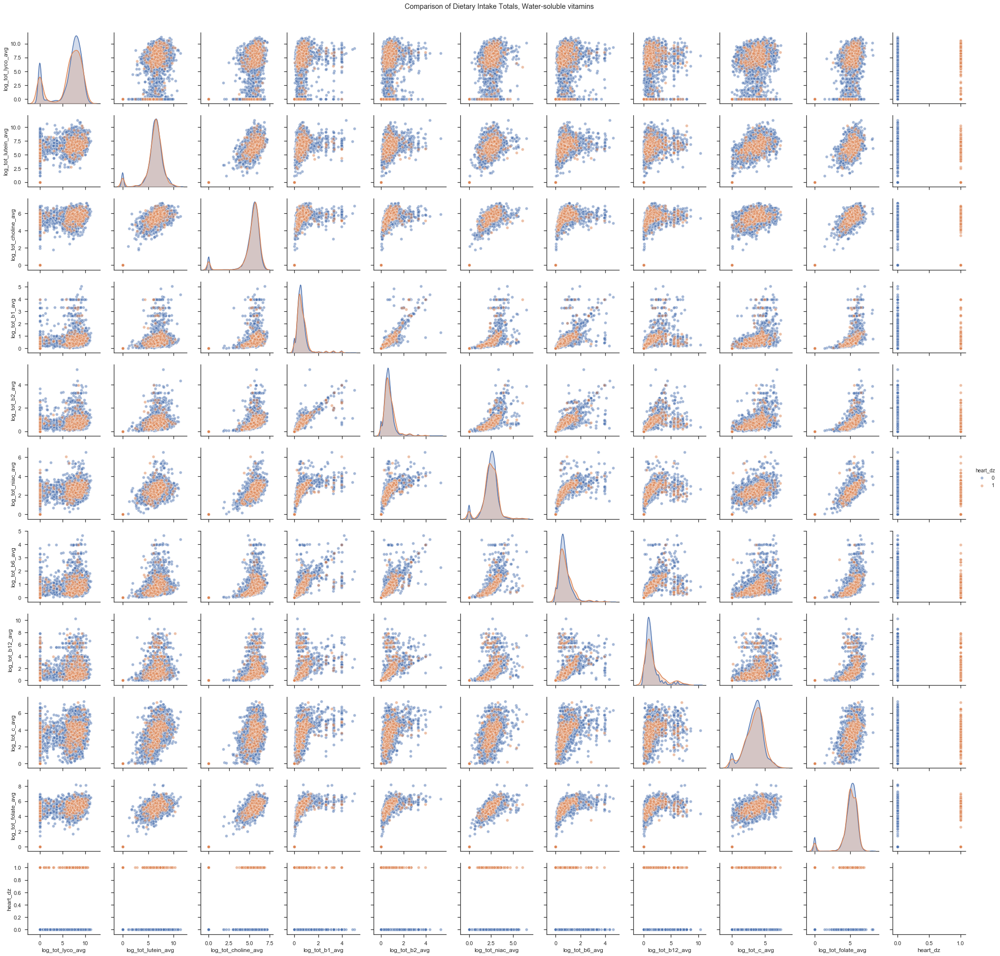

In [326]:
#comparing dietary intake (features) with target
sns.set(style='ticks')

sns.pairplot(nhanes_model_df[
    ['log_tot_lyco_avg', 'log_tot_lutein_avg', 'log_tot_choline_avg', 
     'log_tot_b1_avg', 'log_tot_b2_avg', 'log_tot_niac_avg', 
     'log_tot_b6_avg', 'log_tot_b12_avg', 'log_tot_c_avg', 
     'log_tot_folate_avg', 'heart_dz']], 
            hue= 'heart_dz',
            plot_kws = {'alpha': 0.5})
plt.subplots_adjust(top=0.95)
plt.suptitle('Comparison of Dietary Intake Totals, Water-soluble vitamins')
plt.show()

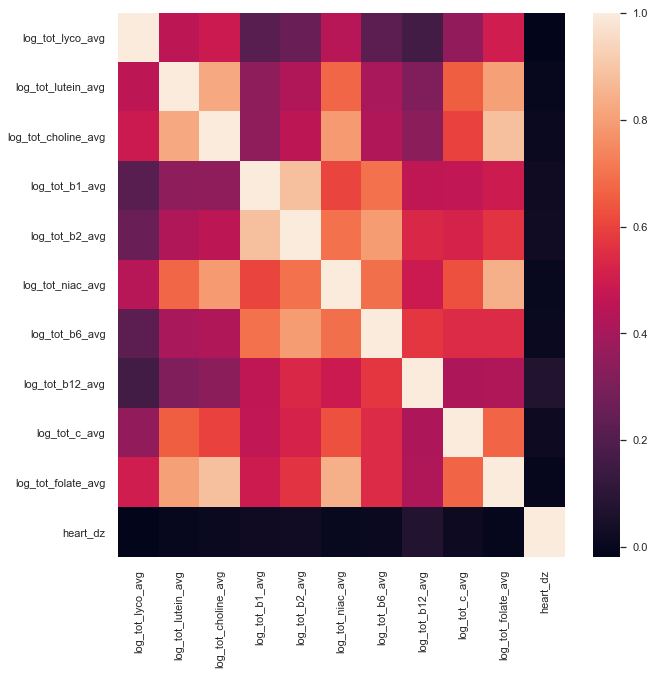

In [327]:
water_sol_tot = nhanes_model_df[
    ['log_tot_lyco_avg', 'log_tot_lutein_avg', 'log_tot_choline_avg', 
     'log_tot_b1_avg', 'log_tot_b2_avg', 'log_tot_niac_avg', 
     'log_tot_b6_avg', 'log_tot_b12_avg', 'log_tot_c_avg', 
     'log_tot_folate_avg', 'heart_dz']]

#correlation matrix
plt.figure(figsize=(10,10))
sns.set(font_scale=1)
sns.heatmap(water_sol_tot.corr())

In [328]:
water_sol_tot.corr()

,log_tot_lyco_avg,log_tot_lutein_avg,log_tot_choline_avg,log_tot_b1_avg,log_tot_b2_avg,log_tot_niac_avg,log_tot_b6_avg,log_tot_b12_avg,log_tot_c_avg,log_tot_folate_avg,heart_dz
log_tot_lyco_avg,1.000000,0.459076,0.488023,0.217024,0.256728,0.442055,0.225456,0.162824,0.355228,0.502487,-0.018015
log_tot_lutein_avg,0.459076,1.000000,0.824305,0.347009,0.426225,0.672364,0.404120,0.309908,0.654915,0.801348,-0.000728
log_tot_choline_avg,0.488023,0.824305,1.000000,0.349710,0.458744,0.790975,0.421565,0.343407,0.598894,0.882606,0.007518
log_tot_b1_avg,0.217024,0.347009,0.349710,1.000000,0.882979,0.602451,0.695605,0.462520,0.466233,0.491659,0.022270
log_tot_b2_avg,0.256728,0.426225,0.458744,0.882979,1.000000,0.697708,0.793277,0.537175,0.522169,0.565706,0.026068
log_tot_niac_avg,0.442055,0.672364,0.790975,0.602451,0.697708,1.000000,0.690958,0.488210,0.627346,0.843044,0.004414
log_tot_b6_avg,0.225456,0.404120,0.421565,0.695605,0.793277,0.690958,1.000000,0.571278,0.543092,0.545182,0.009840
log_tot_b12_avg,0.162824,0.309908,0.343407,0.462520,0.537175,0.488210,0.571278,1.000000,0.416107,0.419659,0.076012
log_tot_c_avg,0.355228,0.654915,0.598894,0.466233,0.522169,0.627346,0.543092,0.416107,1.000000,0.668186,0.015941
log_tot_folate_avg,0.502487,0.801348,0.882606,0.491659,0.565706,0.843044,0.545182,0.419659,0.668186,1.000000,-0.002115


#### comment: highly correlated features
remove 'log_tot_lutein_avg'

In [329]:
np.abs(water_sol_tot.iloc[:,:].corr().loc[:,'heart_dz']).sort_values(ascending=False)

heart_dz               1.000000
log_tot_b12_avg        0.076012
log_tot_b2_avg         0.026068
log_tot_b1_avg         0.022270
log_tot_lyco_avg       0.018015
log_tot_c_avg          0.015941
log_tot_b6_avg         0.009840
log_tot_choline_avg    0.007518
log_tot_niac_avg       0.004414
log_tot_folate_avg     0.002115
log_tot_lutein_avg     0.000728
Name: heart_dz, dtype: float64

### water-soluble vitamins, food

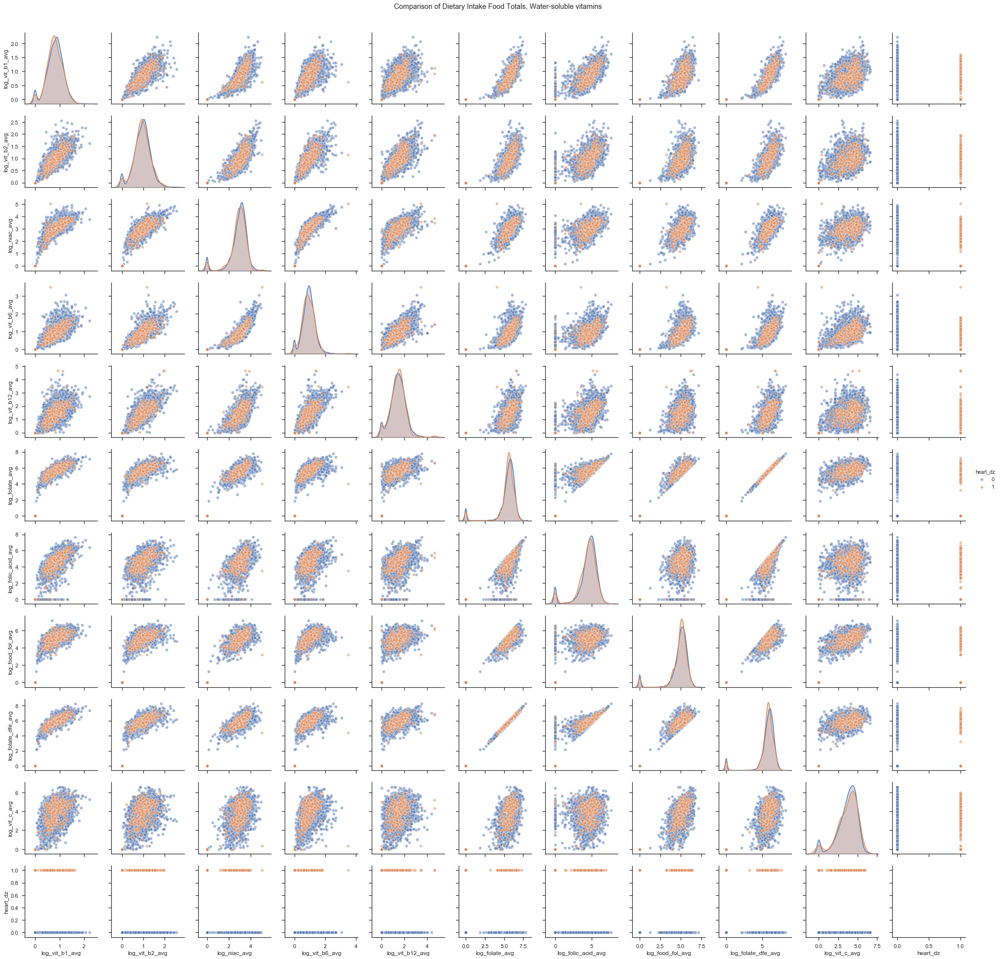

In [330]:
#comparing dietary intake (features) with target
sns.set(style='ticks')

sns.pairplot(nhanes_model_df[
    ['log_vit_b1_avg', 'log_vit_b2_avg', 'log_niac_avg', 'log_vit_b6_avg',
     'log_vit_b12_avg','log_folate_avg', 'log_folic_acid_avg', 
     'log_food_fol_avg', 'log_folate_dfe_avg','log_vit_c_avg',
     'heart_dz']], 
            hue= 'heart_dz',
            plot_kws = {'alpha': 0.5})
plt.subplots_adjust(top=0.95)
plt.suptitle('Comparison of Dietary Intake Food Totals, Water-soluble vitamins')
plt.show()

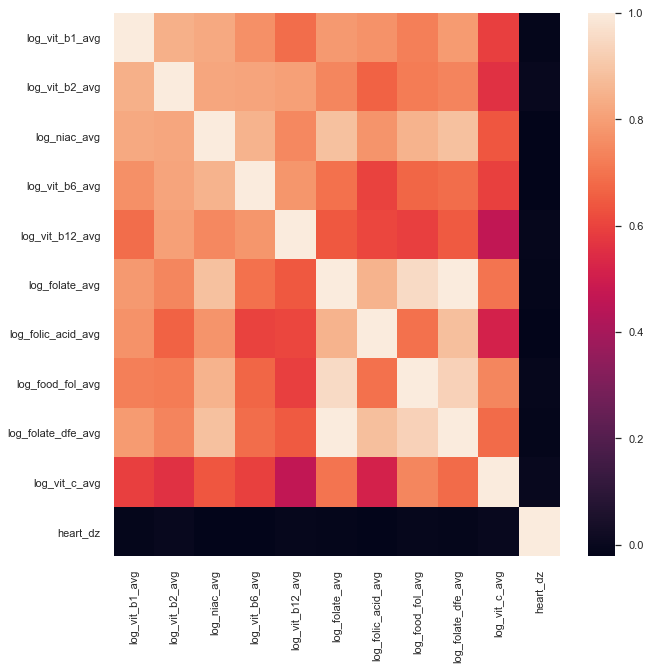

In [331]:
water_sol_food = nhanes_model_df[
    ['log_vit_b1_avg', 'log_vit_b2_avg', 'log_niac_avg', 'log_vit_b6_avg',
     'log_vit_b12_avg','log_folate_avg', 'log_folic_acid_avg', 
     'log_food_fol_avg', 'log_folate_dfe_avg','log_vit_c_avg',
     'heart_dz']]

#correlation matrix
plt.figure(figsize=(10,10))
sns.set(font_scale=1)
sns.heatmap(water_sol_food.corr())

In [332]:
water_sol_food.corr()

,log_vit_b1_avg,log_vit_b2_avg,log_niac_avg,log_vit_b6_avg,log_vit_b12_avg,log_folate_avg,log_folic_acid_avg,log_food_fol_avg,log_folate_dfe_avg,log_vit_c_avg,heart_dz
log_vit_b1_avg,1.000000,0.841438,0.825845,0.765890,0.686318,0.786159,0.770366,0.725923,0.788797,0.589364,-0.012379
log_vit_b2_avg,0.841438,1.000000,0.817152,0.813057,0.801907,0.742886,0.662246,0.718623,0.736681,0.557635,0.001453
log_niac_avg,0.825845,0.817152,1.000000,0.851449,0.745893,0.888023,0.775084,0.849973,0.885538,0.638957,-0.019661
log_vit_b6_avg,0.765890,0.813057,0.851449,1.000000,0.779372,0.693163,0.599374,0.670205,0.685698,0.595935,-0.018089
log_vit_b12_avg,0.686318,0.801907,0.745893,0.779372,1.000000,0.643909,0.608593,0.589201,0.646601,0.461772,-0.008264
log_folate_avg,0.786159,0.742886,0.888023,0.693163,0.643909,1.000000,0.850773,0.952258,0.997327,0.702287,-0.012825
log_folic_acid_avg,0.770366,0.662246,0.775084,0.599374,0.608593,0.850773,1.000000,0.693755,0.880386,0.514303,-0.021918
log_food_fol_avg,0.725923,0.718623,0.849973,0.670205,0.589201,0.952258,0.693755,1.000000,0.928729,0.742353,-0.007598
log_folate_dfe_avg,0.788797,0.736681,0.885538,0.685698,0.646601,0.997327,0.880386,0.928729,1.000000,0.683099,-0.013863
log_vit_c_avg,0.589364,0.557635,0.638957,0.595935,0.461772,0.702287,0.514303,0.742353,0.683099,1.000000,0.000714


#### comment: highly correlated features
remove feature with lower correlation to target value from pairs of highly correlated features:
'log_folate_avg', 'log_folic_acid_avg', 'log_food_fol_avg', 'log_folate_dfe_avg'

In [333]:
np.abs(water_sol_food.iloc[:,:].corr().loc[:,'heart_dz']).sort_values(ascending=False)

heart_dz              1.000000
log_folic_acid_avg    0.021918
log_niac_avg          0.019661
log_vit_b6_avg        0.018089
log_folate_dfe_avg    0.013863
log_folate_avg        0.012825
log_vit_b1_avg        0.012379
log_vit_b12_avg       0.008264
log_food_fol_avg      0.007598
log_vit_b2_avg        0.001453
log_vit_c_avg         0.000714
Name: heart_dz, dtype: float64

### minerals, total

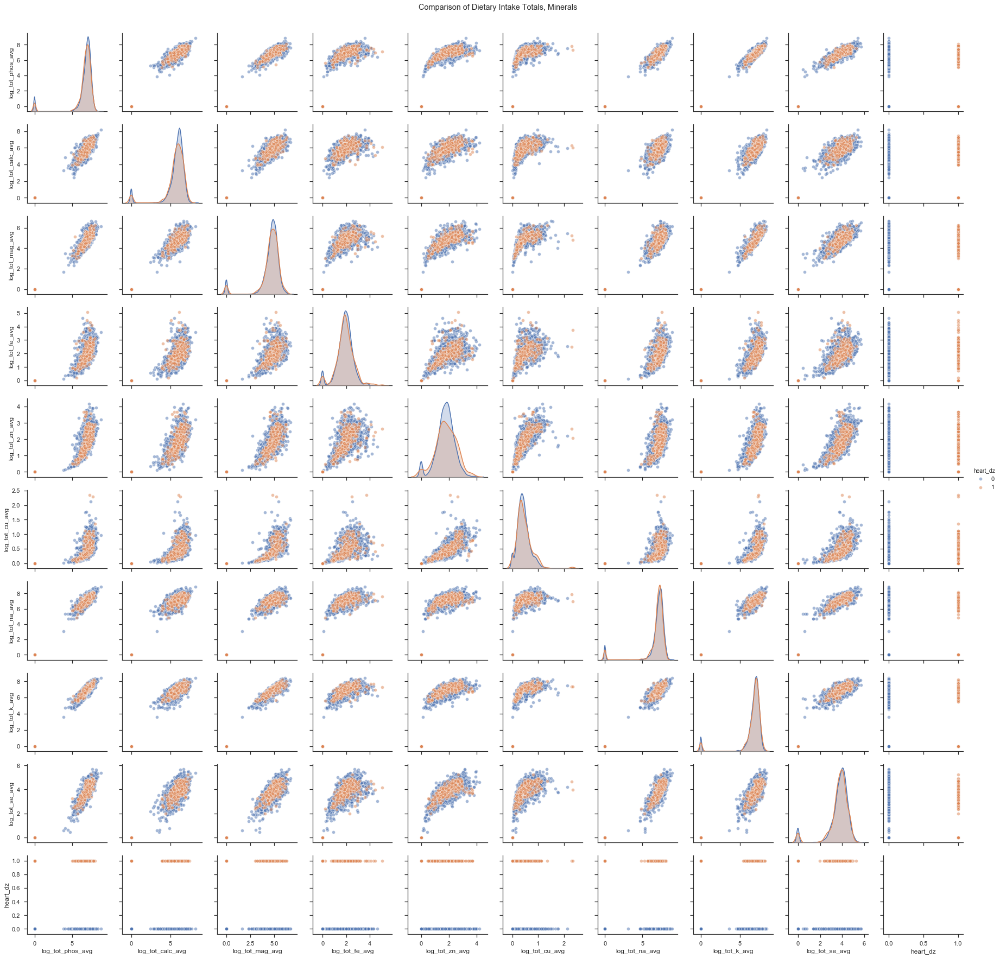

In [334]:
#comparing dietary intake (features) with target
sns.set(style='ticks')

sns.pairplot(nhanes_model_df[
    ['log_tot_phos_avg', 'log_tot_calc_avg', 'log_tot_mag_avg', 
     'log_tot_fe_avg', 'log_tot_zn_avg', 'log_tot_cu_avg',
     'log_tot_na_avg', 'log_tot_k_avg', 'log_tot_se_avg','heart_dz']], 
            hue= 'heart_dz',
            plot_kws = {'alpha': 0.5})
plt.subplots_adjust(top=0.95)
plt.suptitle('Comparison of Dietary Intake Totals, Minerals')
plt.show()

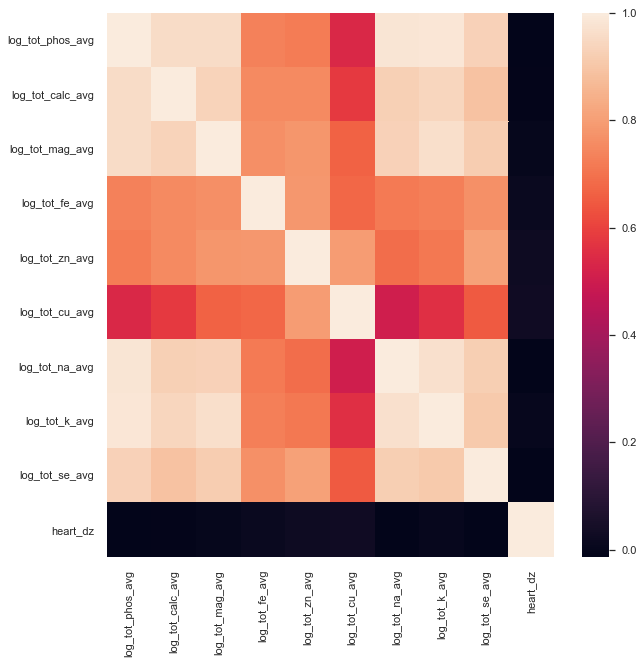

In [335]:
minerals = nhanes_model_df[
    ['log_tot_phos_avg', 'log_tot_calc_avg', 'log_tot_mag_avg', 
     'log_tot_fe_avg', 'log_tot_zn_avg', 'log_tot_cu_avg',
     'log_tot_na_avg', 'log_tot_k_avg', 'log_tot_se_avg','heart_dz']]

#correlation matrix
plt.figure(figsize=(10,10))
sns.set(font_scale=1)
sns.heatmap(minerals.corr())

In [336]:
minerals.corr()

,log_tot_phos_avg,log_tot_calc_avg,log_tot_mag_avg,log_tot_fe_avg,log_tot_zn_avg,log_tot_cu_avg,log_tot_na_avg,log_tot_k_avg,log_tot_se_avg,heart_dz
log_tot_phos_avg,1.000000,0.956722,0.956767,0.734014,0.719951,0.540125,0.980672,0.984455,0.929332,-0.013250
log_tot_calc_avg,0.956722,1.000000,0.935314,0.752397,0.753195,0.581092,0.927850,0.942208,0.892383,-0.008841
log_tot_mag_avg,0.956767,0.935314,1.000000,0.764322,0.778514,0.665939,0.929116,0.965014,0.918535,0.000224
log_tot_fe_avg,0.734014,0.752397,0.764322,1.000000,0.784806,0.676488,0.717604,0.730095,0.770201,0.010501
log_tot_zn_avg,0.719951,0.753195,0.778514,0.784806,1.000000,0.796940,0.688185,0.714330,0.809056,0.022892
log_tot_cu_avg,0.540125,0.581092,0.665939,0.676488,0.796940,1.000000,0.506325,0.560409,0.651299,0.028290
log_tot_na_avg,0.980672,0.927850,0.929116,0.717604,0.688185,0.506325,1.000000,0.969575,0.922777,-0.012537
log_tot_k_avg,0.984455,0.942208,0.965014,0.730095,0.714330,0.560409,0.969575,1.000000,0.910831,0.003122
log_tot_se_avg,0.929332,0.892383,0.918535,0.770201,0.809056,0.651299,0.922777,0.910831,1.000000,-0.009306
heart_dz,-0.013250,-0.008841,0.000224,0.010501,0.022892,0.028290,-0.012537,0.003122,-0.009306,1.000000


In [337]:
np.abs(minerals.iloc[:,:].corr().loc[:,'heart_dz']).sort_values(ascending=False)

heart_dz            1.000000
log_tot_cu_avg      0.028290
log_tot_zn_avg      0.022892
log_tot_phos_avg    0.013250
log_tot_na_avg      0.012537
log_tot_fe_avg      0.010501
log_tot_se_avg      0.009306
log_tot_calc_avg    0.008841
log_tot_k_avg       0.003122
log_tot_mag_avg     0.000224
Name: heart_dz, dtype: float64

### minerals, food

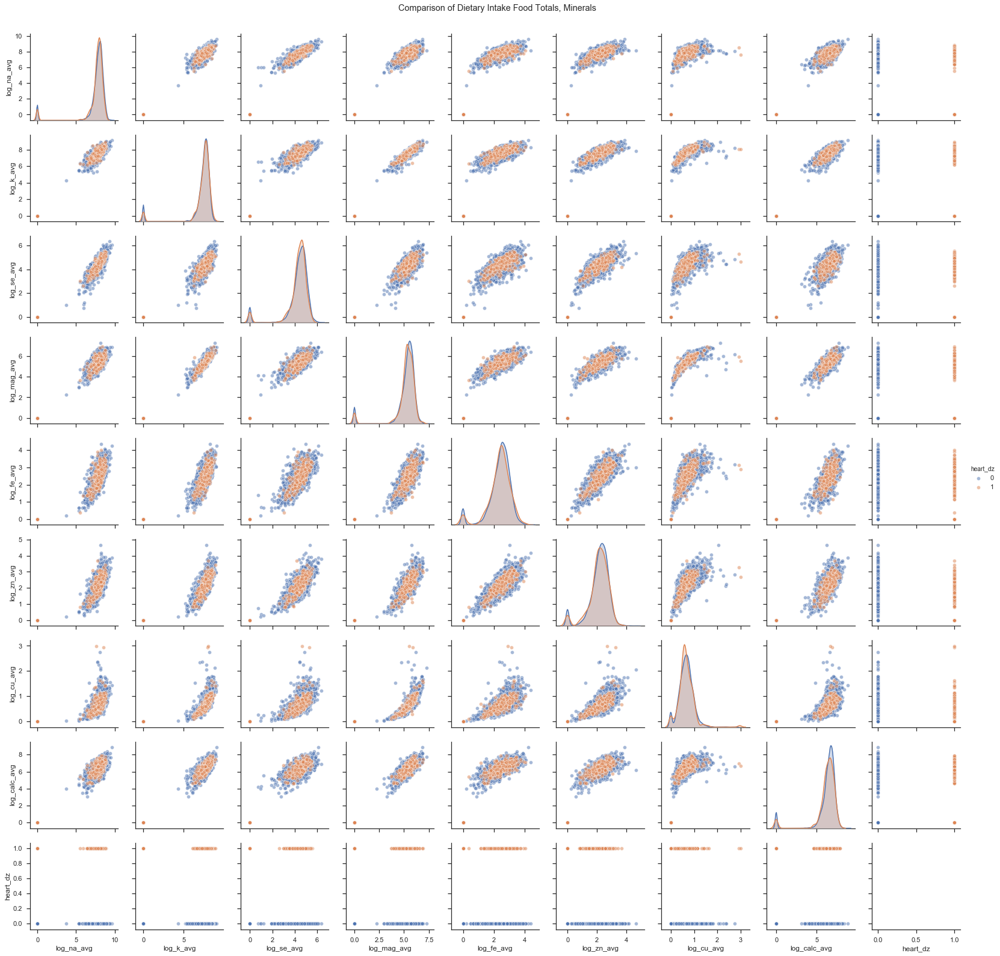

In [338]:
#comparing dietary intake (features) with target
sns.set(style='ticks')

sns.pairplot(nhanes_model_df[
    ['log_na_avg', 'log_k_avg', 'log_se_avg', 'log_mag_avg', 
     'log_fe_avg', 'log_zn_avg', 'log_cu_avg', 'log_calc_avg','heart_dz']], 
            hue= 'heart_dz',
            plot_kws = {'alpha': 0.5})
plt.subplots_adjust(top=0.95)
plt.suptitle('Comparison of Dietary Intake Food Totals, Minerals')
plt.show()

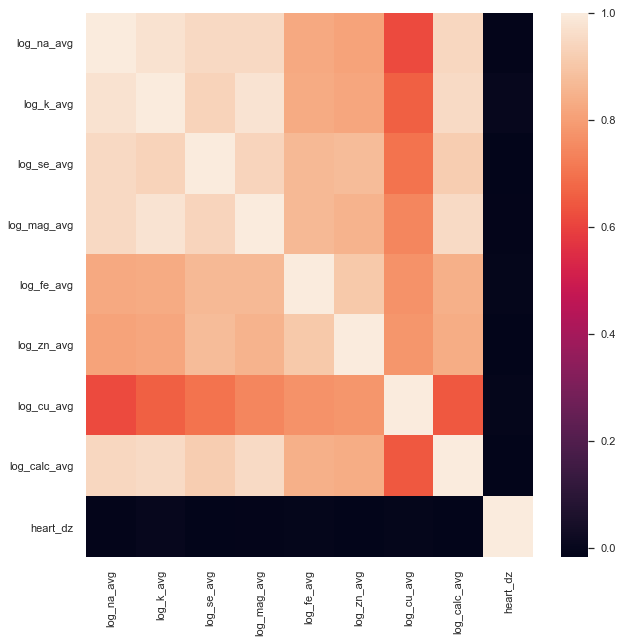

In [339]:
minerals_food = nhanes_model_df[
    ['log_na_avg', 'log_k_avg', 'log_se_avg', 'log_mag_avg', 
     'log_fe_avg', 'log_zn_avg', 'log_cu_avg', 'log_calc_avg',
     'heart_dz']]

#correlation matrix
plt.figure(figsize=(10,10))
sns.set(font_scale=1)
sns.heatmap(minerals_food.corr())

In [340]:
minerals_food.corr()

,log_na_avg,log_k_avg,log_se_avg,log_mag_avg,log_fe_avg,log_zn_avg,log_cu_avg,log_calc_avg,heart_dz
log_na_avg,1.000000,0.974316,0.949138,0.952073,0.827891,0.810777,0.615546,0.946802,-0.011721
log_k_avg,0.974316,1.000000,0.933941,0.979735,0.832517,0.820187,0.660756,0.955106,0.001676
log_se_avg,0.949138,0.933941,1.000000,0.936864,0.866329,0.874170,0.699493,0.916636,-0.016295
log_mag_avg,0.952073,0.979735,0.936864,1.000000,0.865948,0.852976,0.744146,0.953094,-0.009435
log_fe_avg,0.827891,0.832517,0.866329,0.865948,1.000000,0.905712,0.773457,0.843885,-0.007964
log_zn_avg,0.810777,0.820187,0.874170,0.852976,0.905712,1.000000,0.780456,0.833531,-0.014571
log_cu_avg,0.615546,0.660756,0.699493,0.744146,0.773457,0.780456,1.000000,0.643688,-0.006048
log_calc_avg,0.946802,0.955106,0.916636,0.953094,0.843885,0.833531,0.643688,1.000000,-0.016094
heart_dz,-0.011721,0.001676,-0.016295,-0.009435,-0.007964,-0.014571,-0.006048,-0.016094,1.000000


In [341]:
np.abs(minerals_food.iloc[:,:].corr().loc[:,'heart_dz']).sort_values(ascending=False)

heart_dz        1.000000
log_se_avg      0.016295
log_calc_avg    0.016094
log_zn_avg      0.014571
log_na_avg      0.011721
log_mag_avg     0.009435
log_fe_avg      0.007964
log_cu_avg      0.006048
log_k_avg       0.001676
Name: heart_dz, dtype: float64

#### comment: highly correlated features
remove feature with lower correlation to target value from pairs of highly correlated features:
'log_tot_kcal_avg', 'log_tot_pro_avg', 'log_tot_carb_avg', 'log_tot_fat_avg', 'log_tot_mois_avg', 'log_tot_vit_a_avg', 'log_tot_lutein_avg', 'log_vit_b1_avg', 'log_vit_b2_avg', 'log_niac_avg', 'log_vit_b6_avg', 'log_vit_b12_avg', 'log_folate_avg', 'log_folic_acid_avg', 'log_food_fol_avg', 'log_folate_dfe_avg', 'log_tot_mag_avg', 'log_na_avg', 'log_k_avg', 'log_se_avg', 'log_mag_avg', 'log_fe_avg', 'log_zn_avg', 'log_cu_avg', 'log_calc_avg'

## categorical data

In [342]:
categorical1_columns = nhanes_model_df[
    ['heart_dz', 'MCQ300A_2.0', 'MCQ300A_7.0', 'MCQ300A_9.0', 'MCQ365C_2.0', 
     'MCQ365C_9.0', 'MCQ365D_2.0', 'MCQ365D_9.0', 'MCQ370A_2.0', 'MCQ370A_9.0',
     'MCQ370C_2.0', 'MCQ370C_9.0', 'MCQ370D_2.0', 'MCQ370D_9.0', 'BPQ020_2.0', 
     'BPQ020_9.0', 'BPQ030_2.0', 'BPQ030_9.0', 'BPQ040A_2.0', 'BPQ040A_9.0', 
     'BPQ050A_2.0', 'BPQ050A_9.0', 'BPQ080_2.0', 'BPQ080_9.0', 'BPQ060_2.0', 
     'BPQ060_9.0', 'BPQ070_2.0', 'BPQ070_3.0', 'BPQ070_4.0', 'BPQ070_9.0', 
     'BPQ090D_2.0', 'BPQ090D_9.0', 'BPQ100D_2.0', 'BPQ100D_9.0', 'DBD100_1.0', 
     'DBD100_2.0', 'DBD100_3.0', 'DBD100_9.0', 'DRQSPREP_1.0', 'DRQSPREP_2.0', 
     'DRQSPREP_3.0', 'DRQSPREP_4.0', 'DRQSPREP_9.0', 'DR1STY_1.0', 'DR1STY_2.0', 
     'DR1STY_9.0', 'DRQSDIET_1.0', 'DRQSDIET_2.0', 'DRQSDIET_9.0', 'DR2STY_1.0', 
     'DR2STY_2.0', 'DR2STY_9.0', 'DS1DS_1.0', 'DS1DS_2.0', 'DS1AN_1.0', 
     'DS1AN_2.0', 'DS2DS_1.0', 'DS2DS_2.0', 'DS2AN_1.0', 'DS2AN_2.0', 
     'cluster_mec', 'cluster_lab', 'cluster_std']]

In [343]:
len(nhanes_model_df[nhanes_model_df['heart_dz']==0])

4403

In [344]:
#check ratio of non-target value
len(nhanes_model_df[nhanes_model_df['heart_dz']==0])/len(nhanes_model_df)

0.9344227504244482

In [345]:
len(nhanes_model_df[nhanes_model_df['heart_dz']==1])

309

In [346]:
#check ratio of target value
len(nhanes_model_df[nhanes_model_df['heart_dz']==1])/len(nhanes_model_df)

0.06557724957555178

#### comment: highly correlated features
remove feature with lower correlation to target value from pairs of highly correlated features:
'log_tot_kcal_avg', 'log_tot_pro_avg', 'log_tot_carb_avg', 'log_tot_fat_avg', 'log_tot_mois_avg', 'log_tot_vit_a_avg', 'log_tot_lutein_avg', 'log_vit_b1_avg', 'log_vit_b2_avg', 'log_niac_avg', 'log_vit_b6_avg', 'log_vit_b12_avg', 'log_folate_avg', 'log_folic_acid_avg', 'log_food_fol_avg', 'log_folate_dfe_avg', 'log_tot_mag_avg', 'log_na_avg', 'log_k_avg', 'log_se_avg', 'log_mag_avg', 'log_fe_avg', 'log_zn_avg', 'log_cu_avg', 'log_calc_avg'

In [347]:
nhanes_model_df.columns.tolist()

['RIAGENDR',
 'RIDAGEYR',
 'INDFMPIR',
 'WTDRD1_x',
 'WTDR2D_x',
 'heart_dz',
 'log_DR1TCAFF',
 'log_tot_kcal_avg',
 'log_tot_pro_avg',
 'log_tot_carb_avg',
 'log_tot_sugar_avg',
 'log_tot_fiber_avg',
 'log_tot_fat_avg',
 'log_tot_sfat_avg',
 'log_tot_mfat_avg',
 'log_tot_pfat_avg',
 'log_tot_fchol_avg',
 'log_tot_vit_e_avg',
 'log_tot_retinol_avg',
 'log_tot_vit_a_avg',
 'log_tot_alpha_c_avg',
 'log_tot_beta_c_avg',
 'log_tot_beta_cry_avg',
 'log_tot_lyco_avg',
 'log_tot_lutein_avg',
 'log_vit_b1_avg',
 'log_vit_b2_avg',
 'log_niac_avg',
 'log_vit_b6_avg',
 'log_folate_avg',
 'log_folic_acid_avg',
 'log_food_fol_avg',
 'log_folate_dfe_avg',
 'log_tot_choline_avg',
 'log_vit_b12_avg',
 'log_vit_c_avg',
 'log_vit_d_avg',
 'log_tot_vit_k_avg',
 'log_calc_avg',
 'log_tot_phos_avg',
 'log_mag_avg',
 'log_fe_avg',
 'log_zn_avg',
 'log_cu_avg',
 'log_na_avg',
 'log_k_avg',
 'log_se_avg',
 'log_tot_mois_avg',
 'log_tot_h20_avg',
 'log_tot_b1_avg',
 'log_tot_b2_avg',
 'log_tot_niac_avg',
 'log

## Random Forest

### run model WITH imbalanced class distribution 
### first run

In [348]:
from sklearn import ensemble
from sklearn.model_selection import cross_val_score
from sklearn import metrics

#initial run
rfc = ensemble.RandomForestClassifier(random_state=42)
X = nhanes_model_df.drop(
    ['log_tot_kcal_avg', 'log_tot_pro_avg', 'log_tot_carb_avg', 
     'log_tot_fat_avg', 'log_tot_mois_avg', 'log_tot_vit_a_avg', 
     'log_tot_lutein_avg', 'log_vit_b1_avg', 'log_vit_b2_avg', 
     'log_niac_avg', 'log_vit_b6_avg', 'log_vit_b12_avg', 
     'log_folate_avg', 'log_folic_acid_avg', 'log_food_fol_avg', 
     'log_folate_dfe_avg', 'log_tot_mag_avg', 'log_na_avg', 
     'log_k_avg', 'log_se_avg', 'log_mag_avg', 'log_fe_avg', 
     'log_zn_avg', 'log_cu_avg', 'log_calc_avg', 'heart_dz'], axis=1)
Y = nhanes_model_df['heart_dz']

cv_initial = cross_val_score(rfc, X, Y, cv=10)
cv_initial

array([0.93644068, 0.93432203, 0.93630573, 0.93418259, 0.93205945,
       0.93630573, 0.93418259, 0.93630573, 0.93418259, 0.93418259])

In [349]:
print('Cross-validation mean score for initial run: {}'.format (cv_initial.mean()))

Cross-validation mean score for initial run: 0.9348469718233833


In [350]:
roc_cv_score = cross_val_score(rfc, X, Y, cv=10, scoring= 'roc_auc')
roc_cv_score

array([0.85012069, 0.79200497, 0.81519274, 0.88046188, 0.85766129,
       0.91389296, 0.87005132, 0.87983871, 0.87019795, 0.85692815])

In [351]:
print('ROC-AUC mean score for initial run: {}'.format (roc_cv_score.mean()))

ROC-AUC mean score for initial run: 0.8586350669299978


In [352]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, stratify=Y, random_state=42 )

In [353]:
rfc.fit(X_train, Y_train) 
## score on testing data.
rfc_initial = rfc.score(X_test, Y_test)
print('Accuracy score for initial run: {}'.format (rfc_initial))

Accuracy score for initial run: 0.9320882852292021


In [354]:
rfc_predict = rfc.predict(X_test)
rfc_predict

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

sklearn.metrics.classification_report(y_true, y_pred, labels=None, target_names=None, sample_weight=None, digits=2, output_dict=False, zero_division='warn')

In [355]:
from sklearn.metrics import classification_report
y_true = Y_test
y_pred = rfc_predict
initial_class_report = classification_report(y_true, y_pred, labels=[0, 1])
print('Classification Report for initial run:')
print(initial_class_report)

Classification Report for initial run:
              precision    recall  f1-score   support

           0       0.93      1.00      0.96      1101
           1       0.00      0.00      0.00        77

    accuracy                           0.93      1178
   macro avg       0.47      0.50      0.48      1178
weighted avg       0.87      0.93      0.90      1178



In [356]:
pd.Series(Y_test).value_counts()

0    1101
1      77
Name: heart_dz, dtype: int64

In [357]:
from sklearn.metrics import confusion_matrix
initial_conf_mat = confusion_matrix(rfc_predict, Y_test)

print('Confusion Matrix for initial run')
initial_conf_mat

Confusion Matrix for initial run


array([[1098,   77],
       [   3,    0]], dtype=int64)

#### metrics on initial run for imbalanced data: 

In [358]:
print('Cross-validation mean score for initial run: {}'.format (cv_initial.mean()))
print('ROC-AUC mean score for initial run: {}'.format (roc_cv_score.mean()))
print('Accuracy score for initial run: {}'.format (rfc_initial))

print('Classification Report for initial run:')
print(initial_class_report)

print('Confusion Matrix for initial run')
initial_conf_mat

Cross-validation mean score for initial run: 0.9348469718233833
ROC-AUC mean score for initial run: 0.8586350669299978
Accuracy score for initial run: 0.9320882852292021
Classification Report for initial run:
              precision    recall  f1-score   support

           0       0.93      1.00      0.96      1101
           1       0.00      0.00      0.00        77

    accuracy                           0.93      1178
   macro avg       0.47      0.50      0.48      1178
weighted avg       0.87      0.93      0.90      1178

Confusion Matrix for initial run


array([[1098,   77],
       [   3,    0]], dtype=int64)

#### comments: model is performing only slightly better than ratio on CV metric, and grossly underperforming based on precision/recall for target value; the model did not accurately identify any cases of class 1; additional feature engineering required

### feature engineering 

In [359]:
feature_importances_initial = pd.DataFrame(rfc.feature_importances_,
                                   index = X_train.columns,
                                    columns=['importance']).sort_values('importance',
                                                                        ascending=False)
feature_importances_initial

,importance
RIDAGEYR,0.061635
BPQ100D_9.0,0.037428
INDFMPIR,0.029599
log_tot_d_avg,0.023118
WTDRD1_x,0.022837
log_tot_beta_c_avg,0.022287
log_tot_fchol_avg,0.021932
log_tot_beta_cry_avg,0.021510
log_tot_fe_avg,0.020944
log_tot_b12_avg,0.020717


Text(0.5, 1.0, 'Cumulative Importances')

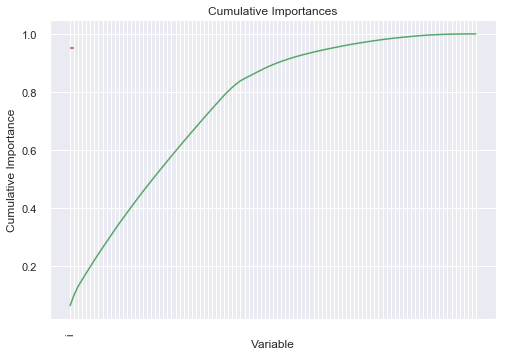

In [360]:
# list of x locations for plotting
x_values = list(range(len(feature_importances_initial)))

# list of features sorted from most to least important
sorted_importances = [importance[1] for importance in feature_importances_initial]
sorted_features = [importance[0] for importance in feature_importances_initial]

# cumulative importances
cumulative_importances = np.cumsum(feature_importances_initial)

# make a line graph
plt.plot(x_values, cumulative_importances, 'g-')

# draw line at 95% of importance retained
plt.hlines(y = 0.95, xmin=0, xmax=len(sorted_importances), color = 'r', linestyles = 'dashed')

# format x ticks and labels
plt.xticks(x_values, sorted_features, rotation = 'vertical')

# axis labels and title
plt.xlabel('Variable') 
plt.ylabel('Cumulative Importance') 
plt.title('Cumulative Importances')

In [361]:
# Find number of features for cumulative importance of 95%
# Add 1 because Python is zero-indexed
print('Number of features for 95% importance:', np.where(cumulative_importances > 0.95)[0][0] + 1)

Number of features for 95% importance: 66


In [362]:
feature_importances_initial[:66]

,importance
RIDAGEYR,0.061635
BPQ100D_9.0,0.037428
INDFMPIR,0.029599
log_tot_d_avg,0.023118
WTDRD1_x,0.022837
log_tot_beta_c_avg,0.022287
log_tot_fchol_avg,0.021932
log_tot_beta_cry_avg,0.021510
log_tot_fe_avg,0.020944
log_tot_b12_avg,0.020717


In [363]:
print(feature_importances_initial[:66].index)

Index(['RIDAGEYR', 'BPQ100D_9.0', 'INDFMPIR', 'log_tot_d_avg', 'WTDRD1_x',
       'log_tot_beta_c_avg', 'log_tot_fchol_avg', 'log_tot_beta_cry_avg',
       'log_tot_fe_avg', 'log_tot_b12_avg', 'log_tot_calc_avg',
       'log_tot_pfat_avg', 'log_tot_sugar_avg', 'log_DR1TCAFF',
       'log_tot_vit_e_avg', 'log_tot_alpha_c_avg', 'log_tot_lyco_avg',
       'log_tot_h20_avg', 'log_tot_vit_k_avg', 'log_tot_b1_avg',
       'log_tot_b6_avg', 'log_tot_zn_avg', 'log_tot_fiber_avg',
       'log_tot_k_avg', 'log_tot_retinol_avg', 'log_tot_se_avg',
       'log_tot_mfat_avg', 'log_tot_na_avg', 'log_tot_cu_avg', 'WTDR2D_x',
       'log_tot_c_avg', 'log_tot_sfat_avg', 'log_vit_d_avg', 'BPQ030_9.0',
       'log_tot_niac_avg', 'log_vit_c_avg', 'log_tot_choline_avg',
       'log_tot_phos_avg', 'log_tot_folate_avg', 'cluster_mec',
       'log_tot_b2_avg', 'BPQ050A_9.0', 'BPQ040A_9.0', 'DRQSPREP_1.0',
       'RIAGENDR', 'BPQ020_2.0', 'MCQ365C_2.0', 'BPQ080_2.0', 'BPQ060_9.0',
       'DRQSDIET_1.0', 'BPQ090

### 2nd run (features tuned from initial run)

In [364]:
rfc = ensemble.RandomForestClassifier(random_state=42)
X_feat_rev = nhanes_model_df[
    ['RIDAGEYR', 'BPQ100D_9.0', 'INDFMPIR', 'log_tot_d_avg', 'WTDRD1_x',
       'log_tot_beta_c_avg', 'log_tot_fchol_avg', 'log_tot_beta_cry_avg',
       'log_tot_fe_avg', 'log_tot_b12_avg', 'log_tot_calc_avg',
       'log_tot_pfat_avg', 'log_tot_sugar_avg', 'log_DR1TCAFF',
       'log_tot_vit_e_avg', 'log_tot_alpha_c_avg', 'log_tot_lyco_avg',
       'log_tot_h20_avg', 'log_tot_vit_k_avg', 'log_tot_b1_avg',
       'log_tot_b6_avg', 'log_tot_zn_avg', 'log_tot_fiber_avg',
       'log_tot_k_avg', 'log_tot_retinol_avg', 'log_tot_se_avg',
       'log_tot_mfat_avg', 'log_tot_na_avg', 'log_tot_cu_avg', 'WTDR2D_x',
       'log_tot_c_avg', 'log_tot_sfat_avg', 'log_vit_d_avg', 'BPQ030_9.0',
       'log_tot_niac_avg', 'log_vit_c_avg', 'log_tot_choline_avg',
       'log_tot_phos_avg', 'log_tot_folate_avg', 'cluster_mec',
       'log_tot_b2_avg', 'BPQ050A_9.0', 'BPQ040A_9.0', 'DRQSPREP_1.0',
       'RIAGENDR', 'BPQ020_2.0', 'MCQ365C_2.0', 'BPQ080_2.0', 'BPQ060_9.0',
       'DRQSDIET_1.0', 'BPQ090D_2.0', 'MCQ300A_2.0', 'MCQ365D_2.0',
       'DRQSDIET_2.0', 'MCQ370D_2.0', 'MCQ370C_2.0', 'BPQ070_9.0', 'DS1DS_1.0',
       'DR2STY_1.0', 'DS2DS_1.0', 'DR2STY_2.0', 'BPQ090D_9.0', 'DRQSPREP_4.0',
       'MCQ370A_2.0', 'DBD100_1.0', 'DR1STY_1.0']] 
Y_feat_rev = nhanes_model_df['heart_dz']

In [365]:
cv_revised = cross_val_score(rfc, X_feat_rev, Y_feat_rev, cv=10)
cv_revised

array([0.93220339, 0.93432203, 0.93630573, 0.93418259, 0.93418259,
       0.93418259, 0.93418259, 0.93630573, 0.93418259, 0.93418259])

In [366]:
print('Cross-validation mean score for 2nd run: {}'.format (cv_revised.mean()))

Cross-validation mean score for 2nd run: 0.9344232430098239


In [367]:
roc_cv_rev_score = cross_val_score(rfc, X_feat_rev, Y_feat_rev, cv=10, scoring= 'roc_auc')
roc_cv_rev_score

array([0.8648965 , 0.82210519, 0.82951625, 0.88247801, 0.85274927,
       0.90205279, 0.88515396, 0.8768695 , 0.88398094, 0.84402493])

In [368]:
print('ROC-AUC mean score for 2nd run: {}'.format (roc_cv_rev_score.mean()))

ROC-AUC mean score for 2nd run: 0.8643827317502433


In [369]:
X_rev_train, X_rev_test, Y_rev_train, Y_rev_test = train_test_split(X_feat_rev, Y_feat_rev, stratify=Y_feat_rev, random_state=42)

In [370]:
rfc.fit(X_rev_train, Y_rev_train) 
## score testing data.
rfc_rev = rfc.score(X_rev_test, Y_rev_test)
print('Accuracy score for 2nd run: {}'.format (rfc_rev))

Accuracy score for 2nd run: 0.933786078098472


In [371]:
rfc1_rev_predict = rfc.predict(X_rev_test)
rfc1_rev_predict

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [372]:
y_true = Y_rev_test
y_pred = rfc1_rev_predict
class1_rev_report = classification_report(y_true, y_pred, labels=[0, 1])
print('Classification Report for 2nd run:')
print(class1_rev_report)

Classification Report for 2nd run:
              precision    recall  f1-score   support

           0       0.93      1.00      0.97      1101
           1       0.00      0.00      0.00        77

    accuracy                           0.93      1178
   macro avg       0.47      0.50      0.48      1178
weighted avg       0.87      0.93      0.90      1178



In [373]:
pd.Series(Y_rev_test).value_counts()

0    1101
1      77
Name: heart_dz, dtype: int64

In [374]:
conf_2nd_mat = confusion_matrix(rfc1_rev_predict, Y_rev_test)

print('Confusion Matrix for 2nd run')
conf_2nd_mat

Confusion Matrix for 2nd run


array([[1100,   77],
       [   1,    0]], dtype=int64)

#### metrics on 2nd run for imbalanced data: 

In [375]:
print('Cross-validation mean score for 2nd run: {}'.format (cv_revised.mean()))
print('ROC-AUC mean score for 2nd run: {}'.format (roc_cv_rev_score.mean()))
print('Accuracy score for 2nd run: {}'.format (rfc_rev))

print('Classification Report for 2nd run:')
print(class1_rev_report)

print('Confusion Matrix for 2nd run')
conf_2nd_mat

Cross-validation mean score for 2nd run: 0.9344232430098239
ROC-AUC mean score for 2nd run: 0.8643827317502433
Accuracy score for 2nd run: 0.933786078098472
Classification Report for 2nd run:
              precision    recall  f1-score   support

           0       0.93      1.00      0.97      1101
           1       0.00      0.00      0.00        77

    accuracy                           0.93      1178
   macro avg       0.47      0.50      0.48      1178
weighted avg       0.87      0.93      0.90      1178

Confusion Matrix for 2nd run


array([[1100,   77],
       [   1,    0]], dtype=int64)

#### comments on 2nd run for imbalanced data:  model shows no improvement; additional feature engineering required

Precision/recall for the target value (class 1)remain zero; the confusion matrix indicates that the model again failed to correctly identify even one case of heart disease. 

### 2nd feature engineering

In [376]:
feature_importances_revised = pd.DataFrame(rfc.feature_importances_,
                                           index = X_rev_train.columns,
                                           columns=['importance']).sort_values('importance',
                                           ascending=False)
feature_importances_revised

,importance
RIDAGEYR,0.065708
BPQ100D_9.0,0.033033
INDFMPIR,0.032100
WTDRD1_x,0.025974
log_tot_b12_avg,0.023270
log_tot_beta_c_avg,0.022279
log_DR1TCAFF,0.022212
log_tot_sugar_avg,0.022130
log_tot_beta_cry_avg,0.022105
log_tot_fe_avg,0.021978


Text(0.5, 1.0, 'Cumulative Importances')

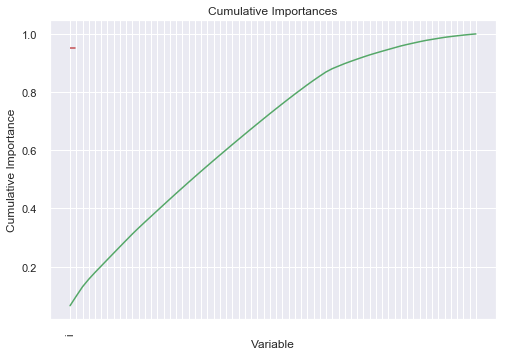

In [377]:
# list of x locations for plotting
x_values = list(range(len(feature_importances_revised)))

# List of features sorted from most to least important
sorted_importances = [importance[1] for importance in feature_importances_revised]
sorted_features = [importance[0] for importance in feature_importances_revised]

# Cumulative importances
cumulative_importances = np.cumsum(feature_importances_revised)

# Make a line graph
plt.plot(x_values, cumulative_importances, 'g-')

# Draw line at 95% of importance retained
plt.hlines(y = 0.95, xmin=0, xmax=len(sorted_importances), color = 'r', linestyles = 'dashed')

# Format x ticks and labels
plt.xticks(x_values, sorted_features, rotation = 'vertical')

# Axis labels and title
plt.xlabel('Variable') 
plt.ylabel('Cumulative Importance') 
plt.title('Cumulative Importances')

In [378]:
# Find number of features for cumulative importance of 95%
# Add 1 because Python is zero-indexed
print('Number of features for 95% importance:', np.where(cumulative_importances > 0.95)[0][0] + 1)

Number of features for 95% importance: 53


In [379]:
#take top 30 features only:
feature_importances_revised[:53]

,importance
RIDAGEYR,0.065708
BPQ100D_9.0,0.033033
INDFMPIR,0.032100
WTDRD1_x,0.025974
log_tot_b12_avg,0.023270
log_tot_beta_c_avg,0.022279
log_DR1TCAFF,0.022212
log_tot_sugar_avg,0.022130
log_tot_beta_cry_avg,0.022105
log_tot_fe_avg,0.021978


In [380]:
print(feature_importances_revised[:30].index)

Index(['RIDAGEYR', 'BPQ100D_9.0', 'INDFMPIR', 'WTDRD1_x', 'log_tot_b12_avg',
       'log_tot_beta_c_avg', 'log_DR1TCAFF', 'log_tot_sugar_avg',
       'log_tot_beta_cry_avg', 'log_tot_fe_avg', 'log_tot_d_avg',
       'log_tot_calc_avg', 'log_tot_lyco_avg', 'log_tot_b2_avg',
       'log_tot_zn_avg', 'log_vit_c_avg', 'WTDR2D_x', 'log_tot_alpha_c_avg',
       'log_tot_fchol_avg', 'log_tot_pfat_avg', 'log_tot_h20_avg',
       'log_tot_sfat_avg', 'log_tot_mfat_avg', 'log_tot_vit_k_avg',
       'log_tot_niac_avg', 'log_tot_b6_avg', 'log_tot_b1_avg',
       'log_tot_vit_e_avg', 'log_vit_d_avg', 'log_tot_choline_avg'],
      dtype='object')


### 3rd  run (features tuned from 2nd run)

In [381]:
# 3rd  run
rfc = ensemble.RandomForestClassifier(random_state=42)
X3_feat_rev = nhanes_model_df[
    ['RIDAGEYR', 'BPQ100D_9.0', 'INDFMPIR', 'WTDRD1_x', 'log_tot_b12_avg',
       'log_tot_beta_c_avg', 'log_DR1TCAFF', 'log_tot_sugar_avg',
       'log_tot_beta_cry_avg', 'log_tot_fe_avg', 'log_tot_d_avg',
       'log_tot_calc_avg', 'log_tot_lyco_avg', 'log_tot_b2_avg',
       'log_tot_zn_avg', 'log_vit_c_avg', 'WTDR2D_x', 'log_tot_alpha_c_avg',
       'log_tot_fchol_avg', 'log_tot_pfat_avg', 'log_tot_h20_avg',
       'log_tot_sfat_avg', 'log_tot_mfat_avg', 'log_tot_vit_k_avg',
       'log_tot_niac_avg', 'log_tot_b6_avg', 'log_tot_b1_avg',
       'log_tot_vit_e_avg', 'log_vit_d_avg', 'log_tot_choline_avg']]
Y3_feat_rev = nhanes_model_df['heart_dz']

cv_3rd_run = cross_val_score(rfc, X3_feat_rev, Y3_feat_rev, cv=10)
cv_3rd_run

array([0.93220339, 0.93432203, 0.93418259, 0.93418259, 0.93418259,
       0.93205945, 0.93842887, 0.93418259, 0.93630573, 0.93630573])

In [382]:
print('Cross-validation mean score for 3rd run: {}'.format (cv_3rd_run.mean()))

Cross-validation mean score for 3rd run: 0.934635557234877


In [383]:
roc3_cv_feat_rev_score = cross_val_score(rfc, X3_feat_rev, Y3_feat_rev, cv=10, scoring= 'roc_auc')
roc3_cv_feat_rev_score

array([0.85034014, 0.7742667 , 0.78382464, 0.88489736, 0.8377566 ,
       0.91345308, 0.85579179, 0.87851906, 0.86678886, 0.86755865])

In [384]:
print('ROC-AUC mean score for 3rd run: {}'.format (roc3_cv_feat_rev_score.mean()))

ROC-AUC mean score for 3rd run: 0.851319686884203


In [385]:
X3_feat_rev_train, X3_feat_rev_test, Y3_feat_rev_train, Y3_feat_rev_test = train_test_split(X3_feat_rev, Y3_feat_rev, stratify=Y3_feat_rev, random_state=42)

In [386]:
rfc.fit(X3_feat_rev_train, Y3_feat_rev_train) 
## score testing data.
rfc_3rd_feat_rev_run = rfc.score(X3_feat_rev_test, Y3_feat_rev_test)
print('Accuracy score for 3rd run: {}'.format (rfc_3rd_feat_rev_run))

Accuracy score for 3rd run: 0.932937181663837


In [387]:
rfc3_feat_rev_predict = rfc.predict(X3_feat_rev_test)
rfc3_feat_rev_predict

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [388]:
y_true = Y3_feat_rev_test
y_pred = rfc3_feat_rev_predict
class3_feat_rev_report = classification_report(y_true, y_pred, labels=[0, 1])
print('Classification Report for 3rd run:')
print(class3_feat_rev_report)

Classification Report for 3rd run:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97      1101
           1       0.25      0.01      0.02        77

    accuracy                           0.93      1178
   macro avg       0.59      0.51      0.49      1178
weighted avg       0.89      0.93      0.90      1178



In [389]:
conf_3rd_mat = confusion_matrix(rfc3_feat_rev_predict, Y3_feat_rev_test)

print('Confusion Matrix for 3rd run')
conf_3rd_mat

Confusion Matrix for 3rd run


array([[1098,   76],
       [   3,    1]], dtype=int64)

#### metrics on 3rd run for imbalanced data: 

In [390]:
print('Cross-validation mean score for 3rd run: {}'.format (cv_3rd_run.mean()))
print('ROC-AUC mean score for 3rd run: {}'.format (roc3_cv_feat_rev_score.mean()))
print('Accuracy score for 3rd run: {}'.format (rfc_3rd_feat_rev_run))


print('Classification Report for 3rd run:')
print(class3_feat_rev_report)

print('Confusion Matrix for 3rd run')
conf_3rd_mat

Cross-validation mean score for 3rd run: 0.934635557234877
ROC-AUC mean score for 3rd run: 0.851319686884203
Accuracy score for 3rd run: 0.932937181663837
Classification Report for 3rd run:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97      1101
           1       0.25      0.01      0.02        77

    accuracy                           0.93      1178
   macro avg       0.59      0.51      0.49      1178
weighted avg       0.89      0.93      0.90      1178

Confusion Matrix for 3rd run


array([[1098,   76],
       [   3,    1]], dtype=int64)

#### comments on 3rd run for imbalanced data: 

When running the top 30 features only, there is minimal improvement in both the classification report and confusion matrix, but the number of class 1 cases accurately identified does not rise above one case.  

### 3rd feature engineering
#### Will attempt a final feature tuning by selecting only the top 15 features.

In [391]:
feature_importances_3rd = pd.DataFrame(rfc.feature_importances_,
                                   index = X3_feat_rev_train.columns,
                                    columns=['importance']).sort_values('importance',
                                                                        ascending=False)
feature_importances_3rd

,importance
RIDAGEYR,0.101870
BPQ100D_9.0,0.064606
INDFMPIR,0.050212
WTDRD1_x,0.038483
log_tot_d_avg,0.035124
log_tot_sugar_avg,0.035070
log_tot_beta_c_avg,0.033066
log_tot_fe_avg,0.032779
log_tot_b12_avg,0.032505
log_DR1TCAFF,0.032099


Text(0.5, 1.0, 'Cumulative Importances')

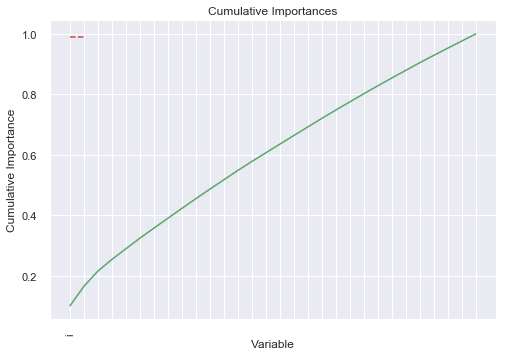

In [392]:
# list of x locations for plotting
x_values = list(range(len(feature_importances_3rd)))

# List of features sorted from most to least important
sorted_importances = [importance[1] for importance in feature_importances_3rd]
sorted_features = [importance[0] for importance in feature_importances_3rd]

# Cumulative importances
cumulative_importances = np.cumsum(feature_importances_3rd)

# Make a line graph
plt.plot(x_values, cumulative_importances, 'g-')

# Draw line at 99% of importance retained
plt.hlines(y = 0.99, xmin=0, xmax=len(sorted_importances), color = 'r', linestyles = 'dashed')

# Format x ticks and labels
plt.xticks(x_values, sorted_features, rotation = 'vertical')

# Axis labels and title
plt.xlabel('Variable') 
plt.ylabel('Cumulative Importance') 
plt.title('Cumulative Importances')

In [393]:
# Find number of features for cumulative importance of 99%
# Add 1 because Python is zero-indexed
print('Number of features for 99% importance:', np.where(cumulative_importances > 0.99)[0][0] + 1)

Number of features for 99% importance: 30


In [394]:
feature_importances_3rd[:30]

,importance
RIDAGEYR,0.101870
BPQ100D_9.0,0.064606
INDFMPIR,0.050212
WTDRD1_x,0.038483
log_tot_d_avg,0.035124
log_tot_sugar_avg,0.035070
log_tot_beta_c_avg,0.033066
log_tot_fe_avg,0.032779
log_tot_b12_avg,0.032505
log_DR1TCAFF,0.032099


In [395]:
print(feature_importances_3rd[:15].index)

Index(['RIDAGEYR', 'BPQ100D_9.0', 'INDFMPIR', 'WTDRD1_x', 'log_tot_d_avg',
       'log_tot_sugar_avg', 'log_tot_beta_c_avg', 'log_tot_fe_avg',
       'log_tot_b12_avg', 'log_DR1TCAFF', 'log_tot_beta_cry_avg',
       'log_tot_calc_avg', 'log_tot_zn_avg', 'log_tot_pfat_avg', 'WTDR2D_x'],
      dtype='object')


### 4th  run (top 15 feaures)

In [396]:
# 4th  run
rfc = ensemble.RandomForestClassifier(random_state=42)
X4_feat_rev = nhanes_model_df[
    ['RIDAGEYR', 'BPQ100D_9.0', 'INDFMPIR', 'WTDRD1_x', 'log_tot_d_avg',
       'log_tot_sugar_avg', 'log_tot_beta_c_avg', 'log_tot_fe_avg',
       'log_tot_b12_avg', 'log_DR1TCAFF', 'log_tot_beta_cry_avg',
       'log_tot_calc_avg', 'log_tot_zn_avg', 'log_tot_pfat_avg', 'WTDR2D_x']]
Y4_feat_rev = nhanes_model_df['heart_dz']

cv_4th_run = cross_val_score(rfc, X4_feat_rev, Y4_feat_rev, cv=10)
cv_4th_run

array([0.93644068, 0.93432203, 0.93418259, 0.93418259, 0.93630573,
       0.93205945, 0.93842887, 0.93418259, 0.93205945, 0.94055202])

In [397]:
print('Cross-validation mean score for 4th run: {}'.format (cv_4th_run.mean()))

Cross-validation mean score for 4th run: 0.9352716002734894


In [398]:
roc4_cv_feat_rev_score = cross_val_score(rfc, X4_feat_rev, Y4_feat_rev, cv=10, scoring= 'roc_auc')
roc4_cv_feat_rev_score

array([0.83706386, 0.7919684 , 0.80740741, 0.8832478 , 0.85      ,
       0.89105572, 0.85535191, 0.87404692, 0.87221408, 0.87404692])

In [399]:
print('ROC-AUC mean score for 4th run: {}'.format (roc4_cv_feat_rev_score.mean()))

ROC-AUC mean score for 4th run: 0.8536403008580429


In [400]:
X4_feat_rev_train, X4_feat_rev_test, Y4_feat_rev_train, Y4_feat_rev_test = train_test_split(X4_feat_rev, Y4_feat_rev, stratify=Y4_feat_rev, random_state=42)

In [401]:
rfc.fit(X4_feat_rev_train, Y4_feat_rev_train) 
## score testing data.
rfc_4th_feat_rev_run = rfc.score(X4_feat_rev_test, Y4_feat_rev_test)
print('Accuracy score for 4th run: {}'.format (rfc_4th_feat_rev_run))

Accuracy score for 4th run: 0.932937181663837


In [402]:
rfc4_feat_rev_predict = rfc.predict(X4_feat_rev_test)
rfc4_feat_rev_predict

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [403]:
y_true = Y4_feat_rev_test
y_pred = rfc4_feat_rev_predict
class4_feat_rev_report = classification_report(y_true, y_pred, labels=[0, 1])
print('Classification report for 4th run:')
print(class4_feat_rev_report)

Classification report for 4th run:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97      1101
           1       0.25      0.01      0.02        77

    accuracy                           0.93      1178
   macro avg       0.59      0.51      0.49      1178
weighted avg       0.89      0.93      0.90      1178



In [404]:
conf_4th_mat = confusion_matrix(rfc4_feat_rev_predict, Y4_feat_rev_test)

print('Confusion Matrix for 4th run')
conf_4th_mat

Confusion Matrix for 4th run


array([[1098,   76],
       [   3,    1]], dtype=int64)

 #### metrics on 4th run for imbalanced data (top 15 features): 

In [405]:
print('Cross-validation mean score for 4th run: {}'.format (cv_4th_run.mean()))
print('ROC-AUC mean score for 4th run: {}'.format (roc4_cv_feat_rev_score.mean()))
print('Accuracy score for 4th run: {}'.format (rfc_4th_feat_rev_run))

print('Classification report for 4th run:')
print(class4_feat_rev_report)

print('Confusion Matrix for 4th run')
conf_4th_mat

Cross-validation mean score for 4th run: 0.9352716002734894
ROC-AUC mean score for 4th run: 0.8536403008580429
Accuracy score for 4th run: 0.932937181663837
Classification report for 4th run:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97      1101
           1       0.25      0.01      0.02        77

    accuracy                           0.93      1178
   macro avg       0.59      0.51      0.49      1178
weighted avg       0.89      0.93      0.90      1178

Confusion Matrix for 4th run


array([[1098,   76],
       [   3,    1]], dtype=int64)

#### comments on 4th run for imbalanced data (top 15 features): 

The last model run using only top 15 features produces no real change over the top 30 features model. As the model with the "best" performance, will use this version (top 15 features) to tune hyperparameters for imbalanced data. 

## tuning hyperparameters on imbalanced class model 

In [406]:
from pprint import pprint
# Look at parameters used by current forest
print('Parameters currently in use:\n')
pprint(rfc.get_params())

Parameters currently in use:

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 42,
 'verbose': 0,
 'warm_start': False}


In [407]:
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV, StratifiedKFold
from sklearn.metrics import roc_curve, precision_recall_curve, auc, make_scorer, recall_score, accuracy_score, precision_score, confusion_matrix

#### comments: optimize for sensitivity with the scoring argument

https://towardsdatascience.com/fine-tuning-a-classifier-in-scikit-learn-66e048c21e65

In [408]:
rfc = ensemble.RandomForestClassifier(random_state=42)

#Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
#Number of features to consider at every split
max_features = ['auto', 'sqrt']
#Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(3, 10, num = 8)]
max_depth.append(None)
#Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
#Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
#Method of selecting samples for training each tree
bootstrap = [True, False]

param_grid = {
    'n_estimators': n_estimators,
    'max_features': max_features,
    'max_depth': max_depth, 
    'min_samples_split': min_samples_split,
    'min_samples_leaf': min_samples_leaf,
    'bootstrap': bootstrap
}

scorers = {
    'precision_score': make_scorer(precision_score),
    'recall_score': make_scorer(recall_score),
    'accuracy_score': make_scorer(accuracy_score)
}

In [409]:
def grid_search_wrapper(refit_score='recall_score'):
    #fits a RandomizedSearchCV classifier using refit_score for optimization
    #prints classifier performance metrics
   
    skf = StratifiedKFold(n_splits=10)
    grid_search = RandomizedSearchCV(rfc, param_grid, scoring=scorers, refit=refit_score,
                           cv=skf, return_train_score=True, n_jobs=-1)
    grid_search.fit(X4_feat_rev_train.values, Y4_feat_rev_train.values)

    # make the predictions
    y_pred = grid_search.predict(X4_feat_rev_test.values)

    print('Best params for {}'.format(refit_score))
    print(grid_search.best_params_)

    # confusion matrix on the test data.
    print('\nConfusion matrix of Random Forest optimized for {} on the test data:'.format(refit_score))
    print(pd.DataFrame(confusion_matrix(Y4_feat_rev_test, y_pred),
                 columns=['pred_neg', 'pred_pos'], index=['neg', 'pos']))
    return grid_search

In [410]:
grid_search_rfc = grid_search_wrapper(refit_score='recall_score')
grid_search_rfc

Best params for recall_score
{'n_estimators': 200, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 8, 'bootstrap': False}

Confusion matrix of Random Forest optimized for recall_score on the test data:
     pred_neg  pred_pos
neg      1101         0
pos        77         0


RandomizedSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
                   error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_s...
                     

In [411]:
results = pd.DataFrame(grid_search_rfc.cv_results_)
results = results.sort_values(by='mean_test_recall_score', 
                              ascending=False)

results[['mean_test_precision_score', 
         'mean_test_recall_score', 
         'mean_test_accuracy_score', 
         'param_max_depth', 
         'param_max_features', 
         'param_min_samples_split', 
         'param_n_estimators']].round(3).head()

,mean_test_precision_score,mean_test_recall_score,mean_test_accuracy_score,param_max_depth,param_max_features,param_min_samples_split,param_n_estimators
1,0.1,0.004,0.934,8,auto,5,200
5,0.1,0.004,0.933,9,auto,10,2000
0,0.0,0.000,0.934,9,auto,10,1400
2,0.0,0.000,0.934,3,sqrt,10,400
3,0.0,0.000,0.934,6,auto,5,400


#### comment: hyperparameters for tuning 
'n_estimators': 200, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 8, 'bootstrap': False

In [412]:
base_model = ensemble.RandomForestClassifier(random_state = 42, 
                                             n_estimators = 200,
                                             min_samples_split = 5,
                                             min_samples_leaf = 1,
                                             max_features = 'auto',
                                             max_depth = 8,
                                             bootstrap = False)
base_model.fit(X4_feat_rev_train, Y4_feat_rev_train)
base4_score = base_accuracy = base_model.score(X4_feat_rev_test, Y4_feat_rev_test)
print('Accuracy score for hyperparameter-tuned run: {}'.format (base4_score))

Accuracy score for hyperparameter-tuned run: 0.934634974533107


In [413]:
cv_4_hp_tuned_run = cross_val_score(base_model, X4_feat_rev_train, Y4_feat_rev_train, cv=10)

print('Cross-validation mean score for hyperparameter-tuned run: {}'.format (cv_4_hp_tuned_run
.mean()))

Cross-validation mean score for hyperparameter-tuned run: 0.9335037851506858


In [414]:
roc_4_hp_tuned_score = cross_val_score(base_model, X4_feat_rev_train, Y4_feat_rev_train, cv=10, scoring= 'roc_auc')

print('ROC-AUC mean score for hyperparameter-tuned run: {}'.format (roc_4_hp_tuned_score
.mean()))

ROC-AUC mean score for hyperparameter-tuned run: 0.8669313189692804


In [415]:
base_model_hp_tuned_predict = base_model.predict(X4_feat_rev_test)

y_true = Y4_feat_rev_test
y_hp_pred = base_model_hp_tuned_predict
class_hp_tuned_report = classification_report(y_true, y_hp_pred, labels=[0, 1])
print('Classification report for hyperparameter-tuned run:')
print(class_hp_tuned_report)

Classification report for hyperparameter-tuned run:
              precision    recall  f1-score   support

           0       0.93      1.00      0.97      1101
           1       0.00      0.00      0.00        77

    accuracy                           0.93      1178
   macro avg       0.47      0.50      0.48      1178
weighted avg       0.87      0.93      0.90      1178



C:\Users\katec\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [416]:
conf_hp_tuned_mat = confusion_matrix(y_hp_pred, y_true)
print('Confusion Matrix for imbalanced data, hyperparameter-tuned run')
conf_hp_tuned_mat

Confusion Matrix for imbalanced data, hyperparameter-tuned run


array([[1101,   77],
       [   0,    0]], dtype=int64)

#### comments metrics on best run for imbalanced data (top 15 features) with hyperparameters tuned: 

In [417]:
print('Accuracy score for hyperparameter-tuned run: {}'.format (base4_score))
print('Cross-validation mean score for hyperparameter-tuned run: {}'.format (cv_4_hp_tuned_run
.mean()))
print('ROC-AUC mean score for hyperparameter-tuned run: {}'.format (roc_4_hp_tuned_score
.mean()))

print('Classification report for hyperparameter-tuned run:')
print(class_hp_tuned_report)

print('Confusion Matrix for imbalanced data, hyperparameter-tuned run')
conf_hp_tuned_mat

Accuracy score for hyperparameter-tuned run: 0.934634974533107
Cross-validation mean score for hyperparameter-tuned run: 0.9335037851506858
ROC-AUC mean score for hyperparameter-tuned run: 0.8669313189692804
Classification report for hyperparameter-tuned run:
              precision    recall  f1-score   support

           0       0.93      1.00      0.97      1101
           1       0.00      0.00      0.00        77

    accuracy                           0.93      1178
   macro avg       0.47      0.50      0.48      1178
weighted avg       0.87      0.93      0.90      1178

Confusion Matrix for imbalanced data, hyperparameter-tuned run


array([[1101,   77],
       [   0,    0]], dtype=int64)

#### comments and comparisons on best run for imbalanced data (top 15 features) with hyperparameters tuned vs untuned: 
After tuning hyperparameters with the goal of improving recall and F1-scores, only the F1-score improved over the non-hyperparameter-tuned model. All other metrics are similar to previous runs with small plus/minus fluctuations. Again, only one class 1 case is accurately identified.

## balance data  

### using SMOTE to balance data classes
smote only on training
feed the supervised model

In [418]:
from sklearn.model_selection import RepeatedStratifiedKFold
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from numpy import mean

class imblearn.over_sampling.SMOTE(sampling_strategy='auto', random_state=None, k_neighbors=5, m_neighbors='deprecated', out_step='deprecated', kind='deprecated', svm_estimator='deprecated', n_jobs=1, ratio=None)

### initial SMOTE run

In [419]:
from collections import Counter
from sklearn.datasets import make_classification
from matplotlib import pyplot
from numpy import where

# define dataset
X_res = nhanes_model_df.drop(
    ['log_tot_kcal_avg', 'log_tot_pro_avg', 'log_tot_carb_avg', 
     'log_tot_fat_avg', 'log_tot_mois_avg', 'log_tot_vit_a_avg', 
     'log_tot_lutein_avg', 'log_vit_b1_avg', 'log_vit_b2_avg', 
     'log_niac_avg', 'log_vit_b6_avg', 'log_vit_b12_avg', 
     'log_folate_avg', 'log_folic_acid_avg', 'log_food_fol_avg', 
     'log_folate_dfe_avg', 'log_tot_mag_avg', 'log_na_avg', 
     'log_k_avg', 'log_se_avg', 'log_mag_avg', 'log_fe_avg', 
     'log_zn_avg', 'log_cu_avg', 'log_calc_avg', 'heart_dz'], axis=1)
y_res = nhanes_model_df['heart_dz']

In [420]:
# summarize class distribution
counter = Counter(y_res)
print(counter)

Counter({0: 4403, 1: 309})


In [421]:
X_res_train, X_res_test, y_res_train, y_res_test = train_test_split(X_res, y_res, stratify=y_res, random_state=42)

In [422]:
# transform the dataset
oversample = SMOTE()
X_1res_train, y_1res_train = oversample.fit_resample(X_res_train, y_res_train)

In [423]:
# summarize class distribution (SMOTE)
counter = Counter(y_1res_train)
print(counter)

Counter({0: 3302, 1: 3302})


In [424]:
rfc = ensemble.RandomForestClassifier(random_state=42)
cv_res_run = cross_val_score(rfc, X_1res_train, y_1res_train, cv=10)
cv_res_run

array([0.81089259, 0.99394856, 0.97881997, 0.98638427, 0.98181818,
       0.98636364, 0.96969697, 0.97575758, 0.98939394, 0.98333333])

In [425]:
print('Cross-validation mean score for balanced data initial run: {}'.format (cv_res_run.mean()))

Cross-validation mean score for balanced data initial run: 0.9656409022142759


In [426]:
roc_cv_res_score = cross_val_score(rfc, X_1res_train, y_1res_train, cv=10, scoring= 'roc_auc')
roc_cv_res_score

array([0.95559828, 0.99986725, 0.99866795, 0.99979859, 0.9984573 ,
       0.99910009, 0.99981635, 0.99945822, 0.99948118, 0.9994123 ])

In [427]:
print('ROC-AUC mean score for balanced data initial run: {}'.format (roc_cv_res_score.mean()))

ROC-AUC mean score for balanced data initial run: 0.9949657506124137


In [428]:
rfc.fit(X_1res_train, y_1res_train) 
## score testing data.
rfc_res_run = rfc.score(X_res_test, y_res_test)
print('Accuracy score for balanced data initial run: {}'.format (rfc_res_run))

Accuracy score for balanced data initial run: 0.9142614601018676


In [429]:
rfc1_res_predict = rfc.predict(X_res_test)
rfc1_res_predict

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [431]:
y_res_true = y_res_test
y_res_pred = rfc1_res_predict
class1_res_report = classification_report(y_res_true, y_res_pred, labels=[0, 1])
print('Classification report for balanced data initial run:')
print(class1_res_report)

Classification report for balanced data initial run:
              precision    recall  f1-score   support

           0       0.94      0.96      0.95      1101
           1       0.28      0.19      0.23        77

    accuracy                           0.91      1178
   macro avg       0.61      0.58      0.59      1178
weighted avg       0.90      0.91      0.91      1178



In [432]:
conf_res_mat = confusion_matrix(rfc1_res_predict, y_res_test)

print('Confusion Matrix for balanced data initial run')
conf_res_mat

Confusion Matrix for balanced data initial run


array([[1062,   62],
       [  39,   15]], dtype=int64)

#### metrics on initial SMOTE run with balanced data: 

In [433]:
print('Cross-validation mean score for balanced data initial run: {}'.format (cv_res_run.mean()))
print('ROC-AUC mean score for balanced data initial run: {}'.format (roc_cv_res_score.mean()))
print('Accuracy score for balanced data initial run: {}'.format (rfc_res_run))


print('Classification report for balanced data initial run:')
print(class1_res_report)

print('Confusion Matrix for balanced data initial run')
conf_res_mat

Cross-validation mean score for balanced data initial run: 0.9656409022142759
ROC-AUC mean score for balanced data initial run: 0.9949657506124137
Accuracy score for balanced data initial run: 0.9142614601018676
Classification report for balanced data initial run:
              precision    recall  f1-score   support

           0       0.94      0.96      0.95      1101
           1       0.28      0.19      0.23        77

    accuracy                           0.91      1178
   macro avg       0.61      0.58      0.59      1178
weighted avg       0.90      0.91      0.91      1178

Confusion Matrix for balanced data initial run


array([[1062,   62],
       [  39,   15]], dtype=int64)

#### comments on initial SMOTE run with balanced data: 
Focusing on the metrics of recall and F1-score, the model run with SMOTE-balanced data is performing much better than all of the imbalanced data models, including the model with tuned hyperparameters. The confusion matrix indicates that the model correctly identified 14 class 1 cases. 

### feature engineering

In [434]:
feature_importances_res = pd.DataFrame(rfc.feature_importances_,
                                   index = X_1res_train.columns,
                                    columns=['importance']).sort_values('importance',
                                                                        ascending=False)
feature_importances_res

,importance
BPQ100D_9.0,0.146243
BPQ030_9.0,0.088456
BPQ050A_9.0,0.060691
RIDAGEYR,0.059384
BPQ040A_9.0,0.052005
BPQ080_2.0,0.031953
BPQ090D_2.0,0.026341
DS1DS_2.0,0.025761
BPQ020_2.0,0.023922
MCQ365C_2.0,0.020064


Text(0.5, 1.0, 'Cumulative Importances')

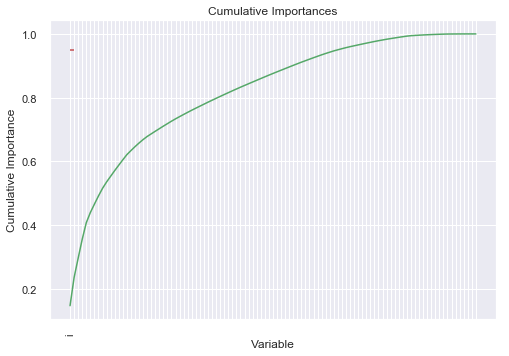

In [435]:
# list of x locations for plotting
x_values = list(range(len(feature_importances_res)))

# List of features sorted from most to least important
sorted_importances = [importance[1] for importance in feature_importances_res]
sorted_features = [importance[0] for importance in feature_importances_res]

# Cumulative importances
cumulative_importances = np.cumsum(feature_importances_res)

# Make a line graph
plt.plot(x_values, cumulative_importances, 'g-')

# Draw line at 95% of importance retained
plt.hlines(y = 0.95, xmin=0, xmax=len(sorted_importances), color = 'r', linestyles = 'dashed')

# Format x ticks and labels
plt.xticks(x_values, sorted_features, rotation = 'vertical')

# Axis labels and title
plt.xlabel('Variable') 
plt.ylabel('Cumulative Importance') 
plt.title('Cumulative Importances')

In [436]:
# Find number of features for cumulative importance of 95%
# Add 1 because Python is zero-indexed
print('Number of features for 95% importance:', np.where(cumulative_importances > 0.95)[0][0] + 1)


Number of features for 95% importance: 67


In [437]:
feature_importances_res[:67]

,importance
BPQ100D_9.0,0.146243
BPQ030_9.0,0.088456
BPQ050A_9.0,0.060691
RIDAGEYR,0.059384
BPQ040A_9.0,0.052005
BPQ080_2.0,0.031953
BPQ090D_2.0,0.026341
DS1DS_2.0,0.025761
BPQ020_2.0,0.023922
MCQ365C_2.0,0.020064


In [438]:
#top 30 features only
print(feature_importances_res[:30].index)

Index(['BPQ100D_9.0', 'BPQ030_9.0', 'BPQ050A_9.0', 'RIDAGEYR', 'BPQ040A_9.0',
       'BPQ080_2.0', 'BPQ090D_2.0', 'DS1DS_2.0', 'BPQ020_2.0', 'MCQ365C_2.0',
       'DRQSPREP_4.0', 'RIAGENDR', 'INDFMPIR', 'BPQ070_9.0', 'MCQ365D_2.0',
       'BPQ090D_9.0', 'cluster_mec', 'BPQ100D_2.0', 'DRQSDIET_2.0', 'WTDRD1_x',
       'MCQ370C_2.0', 'log_tot_h20_avg', 'log_DR1TCAFF', 'DBD100_1.0',
       'WTDR2D_x', 'log_tot_na_avg', 'DS2DS_2.0', 'log_tot_d_avg',
       'DRQSPREP_3.0', 'log_tot_vit_k_avg'],
      dtype='object')


### 2nd SMOTE run

In [439]:
rfc = ensemble.RandomForestClassifier(random_state=42)
X_2res = nhanes_model_df[
    ['BPQ100D_9.0', 'BPQ030_9.0', 'BPQ050A_9.0', 'RIDAGEYR', 'BPQ040A_9.0',
       'BPQ080_2.0', 'BPQ090D_2.0', 'DS1DS_2.0', 'BPQ020_2.0', 'MCQ365C_2.0',
       'DRQSPREP_4.0', 'RIAGENDR', 'INDFMPIR', 'BPQ070_9.0', 'MCQ365D_2.0',
       'BPQ090D_9.0', 'cluster_mec', 'BPQ100D_2.0', 'DRQSDIET_2.0', 'WTDRD1_x',
       'MCQ370C_2.0', 'log_tot_h20_avg', 'log_DR1TCAFF', 'DBD100_1.0',
       'WTDR2D_x', 'log_tot_na_avg', 'DS2DS_2.0', 'log_tot_d_avg',
       'DRQSPREP_3.0', 'log_tot_vit_k_avg']] 
Y_2res = nhanes_model_df['heart_dz']


In [440]:
# summarize class distribution
counter = Counter(Y_2res)
print(counter)

Counter({0: 4403, 1: 309})


In [441]:
X2r_train, X2r_test, y2r_train, y2r_test = train_test_split(X_2res, Y_2res, stratify=Y_2res, random_state=42)

In [442]:
# transform the dataset
oversample = SMOTE()
X_2res_train, y_2res_train = oversample.fit_resample(X2r_train, y2r_train)

# summarize class distribution (SMOTE)
counter = Counter(y_2res_train)
print(counter)

Counter({0: 3302, 1: 3302})


In [443]:
cv_2res_run = cross_val_score(rfc, X_2res_train, y_2res_train, cv=10)
cv_2res_run

array([0.82753404, 0.98335855, 0.96822995, 0.98638427, 0.96515152,
       0.97727273, 0.96818182, 0.97272727, 0.98484848, 0.97575758])

In [444]:
print('Cross-validation mean score for balanced data 2nd run: {}'.format (cv_2res_run.mean()))

Cross-validation mean score for balanced data 2nd run: 0.9609446201806262


In [445]:
roc_cv_2res_score = cross_val_score(rfc, X_2res_train, y_2res_train, cv=10, scoring= 'roc_auc')
roc_cv_2res_score

array([0.94673624, 0.99962465, 0.99909366, 0.99928133, 0.99538567,
       0.9978742 , 0.99843893, 0.99778237, 0.99931129, 0.99742424])

In [446]:
print('ROC-AUC mean score for balanced data 2nd run: {}'.format (roc_cv_2res_score.mean()))

ROC-AUC mean score for balanced data 2nd run: 0.9930952591002029


In [447]:
rfc.fit(X_2res_train, y_2res_train) 
## score testing data.
rfc_2res_initial = rfc.score(X2r_test, y2r_test)
print('Accuracy score for balanced data 2nd run: {}'.format (rfc_2res_initial))

Accuracy score for balanced data 2nd run: 0.9074702886247877


In [448]:
rfc2_predict = rfc.predict(X2r_test)
rfc2_predict

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [449]:
y_true = y2r_test
y_pred = rfc2_predict
class2_balanced_report = classification_report(y_true, y_pred, labels=[0, 1])
print('Classification report for balanced data 2nd run:')
print(class2_balanced_report)

Classification report for balanced data 2nd run:
              precision    recall  f1-score   support

           0       0.95      0.95      0.95      1101
           1       0.27      0.25      0.26        77

    accuracy                           0.91      1178
   macro avg       0.61      0.60      0.60      1178
weighted avg       0.90      0.91      0.91      1178



In [450]:
conf_2res_mat = confusion_matrix(rfc2_predict, y2r_test)

print('Confusion Matrix for balanced data 2nd run')
conf_2res_mat

Confusion Matrix for balanced data 2nd run


array([[1050,   58],
       [  51,   19]], dtype=int64)

#### metrics on 2nd run with balanced data 

In [451]:
print('Cross-validation mean score for balanced data 2nd run: {}'.format (cv_2res_run.mean()))
print('ROC-AUC mean score for balanced data 2nd run: {}'.format (roc_cv_2res_score.mean()))
print('Accuracy score for balanced data 2nd run: {}'.format (rfc_2res_initial))

print('Classification report for balanced data 2nd run:')
print(class2_balanced_report)

print('Confusion Matrix for balanced data 2nd run')
conf_2res_mat

Cross-validation mean score for balanced data 2nd run: 0.9609446201806262
ROC-AUC mean score for balanced data 2nd run: 0.9930952591002029
Accuracy score for balanced data 2nd run: 0.9074702886247877
Classification report for balanced data 2nd run:
              precision    recall  f1-score   support

           0       0.95      0.95      0.95      1101
           1       0.27      0.25      0.26        77

    accuracy                           0.91      1178
   macro avg       0.61      0.60      0.60      1178
weighted avg       0.90      0.91      0.91      1178

Confusion Matrix for balanced data 2nd run


array([[1050,   58],
       [  51,   19]], dtype=int64)

#### comments on 2nd run with balanced data 
Model continues to perform better with feature engineering. The accuracy measures are lower on this model run, but these metrics are less important in assessing the performance of this model, as the purpose is to improve the accuracy of identifying the class 1 scores.
This run of the model does improve the recall/F1-score and the number of accurately identified class 1 cases.  

### feature engineering

In [452]:
feature_importances_2res = pd.DataFrame(rfc.feature_importances_,
                                   index = X_2res_train.columns,
                                    columns=['importance']).sort_values('importance',
                                                                        ascending=False)
feature_importances_2res

,importance
BPQ100D_9.0,0.199185
BPQ050A_9.0,0.089219
RIDAGEYR,0.074870
BPQ030_9.0,0.065724
BPQ090D_2.0,0.041051
BPQ020_2.0,0.039320
INDFMPIR,0.034065
BPQ040A_9.0,0.032943
MCQ365C_2.0,0.027648
WTDRD1_x,0.025774


Text(0.5, 1.0, 'Cumulative Importances')

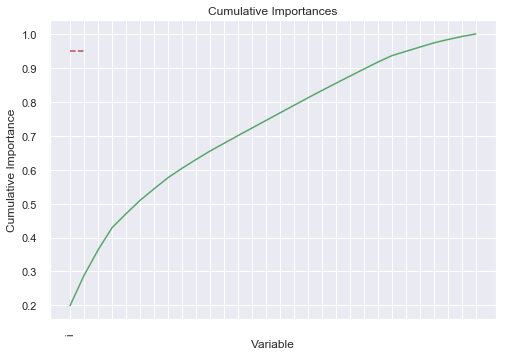

In [453]:
# list of x locations for plotting
x_values = list(range(len(feature_importances_2res)))

# List of features sorted from most to least important
sorted_importances = [importance[1] for importance in feature_importances_2res]
sorted_features = [importance[0] for importance in feature_importances_2res]

# Cumulative importances
cumulative_importances = np.cumsum(feature_importances_2res)

# Make a line graph
plt.plot(x_values, cumulative_importances, 'g-')

# Draw line at 95% of importance retained
plt.hlines(y = 0.95, xmin=0, xmax=len(sorted_importances), color = 'r', linestyles = 'dashed')

# Format x ticks and labels
plt.xticks(x_values, sorted_features, rotation = 'vertical')

# Axis labels and title
plt.xlabel('Variable') 
plt.ylabel('Cumulative Importance') 
plt.title('Cumulative Importances')

In [454]:
print('Number of features for 95% importance:', np.where(cumulative_importances > 0.95)[0][0] + 1)

Number of features for 95% importance: 26


In [455]:
feature_importances_res[:26]

,importance
BPQ100D_9.0,0.146243
BPQ030_9.0,0.088456
BPQ050A_9.0,0.060691
RIDAGEYR,0.059384
BPQ040A_9.0,0.052005
BPQ080_2.0,0.031953
BPQ090D_2.0,0.026341
DS1DS_2.0,0.025761
BPQ020_2.0,0.023922
MCQ365C_2.0,0.020064


In [456]:
print(feature_importances_2res[:15].index)

Index(['BPQ100D_9.0', 'BPQ050A_9.0', 'RIDAGEYR', 'BPQ030_9.0', 'BPQ090D_2.0',
       'BPQ020_2.0', 'INDFMPIR', 'BPQ040A_9.0', 'MCQ365C_2.0', 'WTDRD1_x',
       'BPQ070_9.0', 'cluster_mec', 'log_tot_d_avg', 'DRQSPREP_4.0',
       'WTDR2D_x'],
      dtype='object')


### 3rd SMOTE run
using top 15 features only

In [457]:
X_3res = nhanes_model_df[
    ['BPQ100D_9.0', 'BPQ050A_9.0', 'RIDAGEYR', 'BPQ030_9.0', 'BPQ090D_2.0',
       'BPQ020_2.0', 'INDFMPIR', 'BPQ040A_9.0', 'MCQ365C_2.0', 'WTDRD1_x',
       'BPQ070_9.0', 'cluster_mec', 'log_tot_d_avg', 'DRQSPREP_4.0',
       'WTDR2D_x']]
y_3res = nhanes_model_df['heart_dz']

# summarize class distribution
counter = Counter(y_3res)
print(counter)

Counter({0: 4403, 1: 309})


In [458]:
X3r_train, X3r_test, y3r_train, y3r_test = train_test_split(X_3res, y_3res, stratify=y_3res, random_state=42)

In [459]:
# transform the dataset
oversample = SMOTE()
X_3res_train, y_3res_train = oversample.fit_resample(X3r_train, y3r_train)

# summarize class distribution (SMOTE)
counter = Counter(y_3res_train)
print(counter)

Counter({0: 3302, 1: 3302})


In [460]:
cv_3res_run = cross_val_score(rfc, X_3res_train, y_3res_train, cv=10)
cv_3res_run

array([0.85627837, 0.97125567, 0.95763994, 0.9667171 , 0.96969697,
       0.95757576, 0.95454545, 0.95757576, 0.96515152, 0.96363636])

In [461]:
print('Cross-validation mean score for 3rd run: {}'.format (cv_3res_run.mean()))

Cross-validation mean score for 3rd run: 0.9520072892311923


In [462]:
roc_cv_3res_score = cross_val_score(rfc, X_3res_train, y_3res_train, cv=10, scoring= 'roc_auc')
roc_cv_3res_score

array([0.94382496, 0.99680033, 0.99278586, 0.99752815, 0.99369146,
       0.99390266, 0.98707071, 0.99455464, 0.99618916, 0.9929247 ])

In [463]:
print('ROC-AUC mean score for 3rd run: {}'.format (roc_cv_3res_score.mean()))

ROC-AUC mean score for 3rd run: 0.9889272635722787


In [464]:
rfc.fit(X_3res_train, y_3res_train) 
##score testing data.
rfc_3res_run = rfc.score(X3r_test, y3r_test)
print('Accuracy score for balanced data 3rd run: {}'.format (rfc_3res_run))

Accuracy score for balanced data 3rd run: 0.8879456706281834


In [465]:
rfc_3res_predict = rfc.predict(X3r_test)
rfc_3res_predict

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [466]:
y_res_true = y3r_test
y_res_pred = rfc_3res_predict
class3_balanced_report = classification_report(y_res_true, y_res_pred, labels=[0, 1])
print('Classification report for balanced data 3rd run')
print(class3_balanced_report)

Classification report for balanced data 3rd run
              precision    recall  f1-score   support

           0       0.95      0.92      0.94      1101
           1       0.26      0.38      0.31        77

    accuracy                           0.89      1178
   macro avg       0.61      0.65      0.62      1178
weighted avg       0.91      0.89      0.90      1178



In [467]:
conf_3res_mat = confusion_matrix(rfc_3res_predict, y3r_test)

print('Confusion Matrix for balanced data 3rd run')
conf_3res_mat

Confusion Matrix for balanced data 3rd run


array([[1017,   48],
       [  84,   29]], dtype=int64)

#### metrics for 3rd run, balanced data

In [468]:
print('Cross-validation mean score for 3rd run: {}'.format (cv_3res_run.mean()))
print('ROC-AUC mean score for 3rd run: {}'.format (roc_cv_3res_score.mean()))
print('Accuracy score for balanced data 3rd run: {}'.format (rfc_3res_run))

print('Classification report for balanced data 3rd run')
print(class3_balanced_report)

print('Confusion Matrix for balanced data 3rd run')
conf_3res_mat

Cross-validation mean score for 3rd run: 0.9520072892311923
ROC-AUC mean score for 3rd run: 0.9889272635722787
Accuracy score for balanced data 3rd run: 0.8879456706281834
Classification report for balanced data 3rd run
              precision    recall  f1-score   support

           0       0.95      0.92      0.94      1101
           1       0.26      0.38      0.31        77

    accuracy                           0.89      1178
   macro avg       0.61      0.65      0.62      1178
weighted avg       0.91      0.89      0.90      1178

Confusion Matrix for balanced data 3rd run


array([[1017,   48],
       [  84,   29]], dtype=int64)

#### comments on 3rd run, balanced data
In the 3rd run for balanced data, using only the top 15 features, the preferred scores of recall and F1-score have improved at the expense of the accuracy, CV, and ROC-AUC scores. 
The confusion matrix indicates that 33 of the class 1 records (43%) have been identified, which is by far the highest recall score to date. 

### tune hyperparameters on best balanced model
3rd run, with top 15 features

In [469]:
# Look at parameters used by our current forest
print('Parameters currently in use:\n')
pprint(rfc.get_params())

Parameters currently in use:

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 42,
 'verbose': 0,
 'warm_start': False}


In [470]:
rfc = ensemble.RandomForestClassifier(random_state=42)

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(3, 10, num = 8)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]

random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth, 
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

scorers = {
    'precision_score': make_scorer(precision_score),
    'recall_score': make_scorer(recall_score),
    'accuracy_score': make_scorer(accuracy_score)
}

In [471]:
def grid_search_wrapper(refit_score='recall_score'):
    #fits a RandomizedSearchCV classifier using refit_score for optimization
    #prints classifier performance metrics
   
    skf = StratifiedKFold(n_splits=10)
    grid_search = RandomizedSearchCV(rfc, param_grid, scoring=scorers, refit=refit_score,
                           cv=skf, return_train_score=True, n_jobs=-1)
    grid_search.fit(X_3res_train.values, y_3res_train.values)

    # make the predictions
    y_pred = grid_search.predict(X3r_test.values)

    print('Best params for {}'.format(refit_score))
    print(grid_search.best_params_)

    # confusion matrix on the test data.
    print('\nConfusion matrix of Random Forest optimized for {} on the test data:'.format(refit_score))
    print(pd.DataFrame(confusion_matrix(y3r_test, y_pred),
                 columns=['pred_neg', 'pred_pos'], index=['neg', 'pos']))
    return grid_search

In [472]:
grid_search_rfc = grid_search_wrapper(refit_score='recall_score')
grid_search_rfc

Best params for recall_score
{'n_estimators': 600, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 'auto', 'max_depth': 10, 'bootstrap': True}

Confusion matrix of Random Forest optimized for recall_score on the test data:
     pred_neg  pred_pos
neg      1000       101
pos        42        35


RandomizedSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
                   error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_s...
                     

In [473]:
results = pd.DataFrame(grid_search_rfc.cv_results_)
results = results.sort_values(by='mean_test_recall_score', 
                              ascending=False)

results[['mean_test_precision_score', 
         'mean_test_recall_score', 
         'mean_test_accuracy_score', 
         'param_max_depth', 
         'param_max_features', 
         'param_min_samples_split', 
         'param_n_estimators']].round(3).head()

,mean_test_precision_score,mean_test_recall_score,mean_test_accuracy_score,param_max_depth,param_max_features,param_min_samples_split,param_n_estimators
8,0.916,0.962,0.937,10,auto,5,600
7,0.908,0.960,0.931,8,sqrt,10,1200
9,0.908,0.960,0.931,8,sqrt,10,1400
0,0.919,0.957,0.936,None,auto,5,200
2,0.926,0.956,0.940,None,auto,10,800


#### Best params for recall_score
'n_estimators': 600, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 'auto', 'max_depth': 10, 'bootstrap': True

In [474]:
base_3res_model = ensemble.RandomForestClassifier(random_state = 42, 
                                             n_estimators = 600,
                                             min_samples_split = 5,
                                             min_samples_leaf = 2,
                                             max_features = 'auto',
                                             max_depth = 10,
                                             bootstrap = True)
base_3res_model.fit(X_3res_train, y_3res_train)
base_3res_score = base_accuracy = base_3res_model.score(X3r_test, y3r_test)
print('Accuracy score for balanced data, hyperparameter-tuned 3rd model run: {}'.format (base_3res_score))

Accuracy score for balanced data, hyperparameter-tuned 3rd model run: 0.8786078098471987


In [475]:
hp_tuned_3res_run = cross_val_score(base_3res_model, X_3res_train, y_3res_train, cv=10)

print('Cross-validation mean score for balanced data, hyperparameter-tuned 3rd model run: {}'.format (hp_tuned_3res_run
.mean()))

Cross-validation mean score for balanced data, hyperparameter-tuned 3rd model run: 0.9370155411910328


In [476]:
hp_tuned_3res_score = cross_val_score(base_3res_model, X_3res_train, y_3res_train, cv=10, scoring= 'roc_auc')

print('ROC-AUC mean score for balanced data, hyperparameter-tuned 3rd model run: {}'.format (hp_tuned_3res_score
.mean()))

ROC-AUC mean score for balanced data, hyperparameter-tuned 3rd model run: 0.9811751711012903


In [477]:
hp_tuned_3res_predict = base_3res_model.predict(X3r_test)

y_true = y3r_test
y_pred = hp_tuned_3res_predict
hp_tuned_3res_report = classification_report(y_true, y_pred, labels=[0, 1])
print('Classification Report for balanced data, hyperparameter-tuned 3rd model run:')
print(hp_tuned_3res_report)

Classification Report for balanced data, hyperparameter-tuned 3rd model run:
              precision    recall  f1-score   support

           0       0.96      0.91      0.93      1101
           1       0.26      0.45      0.33        77

    accuracy                           0.88      1178
   macro avg       0.61      0.68      0.63      1178
weighted avg       0.91      0.88      0.89      1178



In [478]:
conf_3res_hp_mat = confusion_matrix(hp_tuned_3res_predict, y3r_test)

print('Confusion Matrix for balanced data, hyperparameter-tuned 3rd model run')
conf_3res_hp_mat

Confusion Matrix for balanced data, hyperparameter-tuned 3rd model run


array([[1000,   42],
       [ 101,   35]], dtype=int64)

#### metrics for balanced data, hyperparameter-tuned, 3rd run RFC:

In [479]:
print('Accuracy score for balanced data, hyperparameter-tuned 3rd model run: {}'.format (base_3res_score))
print('Cross-validation mean score for balanced data, hyperparameter-tuned 3rd model run: {}'.format (hp_tuned_3res_run
.mean()))
print('ROC-AUC mean score for balanced data, hyperparameter-tuned 3rd model run: {}'.format (hp_tuned_3res_score
.mean()))


print('Classification Report for balanced data, hyperparameter-tuned 3rd model run:')
print(hp_tuned_3res_report)

print('Confusion Matrix for balanced data, hyperparameter-tuned 3rd model run')
conf_3res_hp_mat

Accuracy score for balanced data, hyperparameter-tuned 3rd model run: 0.8786078098471987
Cross-validation mean score for balanced data, hyperparameter-tuned 3rd model run: 0.9370155411910328
ROC-AUC mean score for balanced data, hyperparameter-tuned 3rd model run: 0.9811751711012903
Classification Report for balanced data, hyperparameter-tuned 3rd model run:
              precision    recall  f1-score   support

           0       0.96      0.91      0.93      1101
           1       0.26      0.45      0.33        77

    accuracy                           0.88      1178
   macro avg       0.61      0.68      0.63      1178
weighted avg       0.91      0.88      0.89      1178

Confusion Matrix for balanced data, hyperparameter-tuned 3rd model run


array([[1000,   42],
       [ 101,   35]], dtype=int64)

#### comments on balanced data, hyperparameter-tuned, 3rd run RFC:
Compared to best balanced data 3rd run without hyperparameter-tuning:
The Accuracy, CV, and ROC-AUC scores are all lower. However, the Recall and F1-score are noticably improved. In addition, 37 class 1 records were correctly identified, which represents 48% of the actual class 1 cases. This result of accurately identifying the true class 1 records is preferable to a higher accuracy scores.  

**Clearly, the over-sampling of class 1 through SMOTE-balanced data and the tuning of the hyperparameters have improved the performance of this model.** 

## gradient boosting model

### data, features to be used for gradient boosting model

In [480]:
# define dataset
X_gbm = nhanes_model_df.drop(
    ['log_tot_kcal_avg', 'log_tot_pro_avg', 'log_tot_carb_avg', 
     'log_tot_fat_avg', 'log_tot_mois_avg', 'log_tot_vit_a_avg', 
     'log_tot_lutein_avg', 'log_vit_b1_avg', 'log_vit_b2_avg', 
     'log_niac_avg', 'log_vit_b6_avg', 'log_vit_b12_avg', 
     'log_tot_folate_avg', 'log_folic_acid_avg', 'log_food_fol_avg', 
     'log_folate_dfe_avg', 'log_vit_c_avg', 'log_na_avg', 'log_k_avg', 
     'log_se_avg', 'log_mag_avg', 'log_fe_avg', 'log_zn_avg', 
     'log_cu_avg', 'log_calc_avg', 'heart_dz'], axis=1)
y_gbm = nhanes_model_df['heart_dz']

In [481]:
X_gbm_train, X_gbm_test, y_gbm_train, y_gbm_test = train_test_split(X_gbm, y_gbm, stratify=y_gbm, random_state=42)

In [482]:
# transform the dataset
oversample = SMOTE()
X_os_gbm_train, y_os_gbm_train = oversample.fit_resample(X_gbm_train, y_gbm_train)

# summarize class distribution (SMOTE)
counter = Counter(y_os_gbm_train)
print(counter)

Counter({0: 3302, 1: 3302})


Accuracy of the GBM on base run: 0.907
Classification Report on GBM base run:
              precision    recall  f1-score   support

           0       0.96      0.94      0.95      1101
           1       0.32      0.38      0.35        77

    accuracy                           0.91      1178
   macro avg       0.64      0.66      0.65      1178
weighted avg       0.91      0.91      0.91      1178



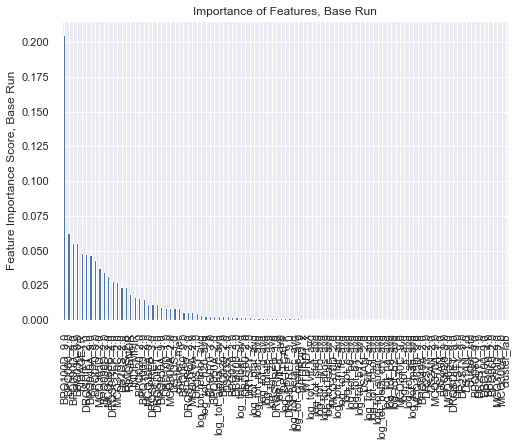

In [483]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV

base_gbm = GradientBoostingClassifier(learning_rate=0.1, n_estimators=100,
                                      max_depth=3, min_samples_split=2, 
                                      min_samples_leaf=1, subsample=1,
                                      max_features='sqrt', random_state=42)

base_gbm.fit(X_os_gbm_train, y_os_gbm_train)
predictors = list(X_os_gbm_train)
feat_imp = pd.Series(base_gbm.feature_importances_, predictors).sort_values(ascending=False)
feat_imp.plot(kind='bar', title='Importance of Features, Base Run')
plt.ylabel('Feature Importance Score, Base Run')

print('Accuracy of the GBM on base run: {:.3f}'.format(base_gbm.score(X_gbm_test, y_gbm_test)))
pred_base_gbm=base_gbm.predict(X_gbm_test)
class_report_base_gbm = classification_report(y_gbm_test, pred_base_gbm)
print('Classification Report on GBM base run:')
print(class_report_base_gbm)

In [484]:
conf_base_gbm_mat = confusion_matrix(pred_base_gbm, y_gbm_test)

print('Confusion Matrix for balanced data, GBM base run')
conf_base_gbm_mat

Confusion Matrix for balanced data, GBM base run


array([[1040,   48],
       [  61,   29]], dtype=int64)

#### metrics on initial Gradient Boosting Model

In [485]:
print('Accuracy of the GBM on base run: {:.3f}'.format(base_gbm.score(X_gbm_test, y_gbm_test)))

print('Classification Report on GBM base run:')
print(class_report_base_gbm)

print('Confusion Matrix for balanced data, GBM base run')
conf_base_gbm_mat

Accuracy of the GBM on base run: 0.907
Classification Report on GBM base run:
              precision    recall  f1-score   support

           0       0.96      0.94      0.95      1101
           1       0.32      0.38      0.35        77

    accuracy                           0.91      1178
   macro avg       0.64      0.66      0.65      1178
weighted avg       0.91      0.91      0.91      1178

Confusion Matrix for balanced data, GBM base run


array([[1040,   48],
       [  61,   29]], dtype=int64)

#### comments on initial Gradient Boosting Model:

The initial run of this model performs better than the initial runs of of other models using all features. However the recall/F1 scores and correctly identified class 1 cases are lower than the best, tuned hyperparameter models of other, previously run models. 

#### feature engineering of initial run

In [486]:
feature_importances_gbm = pd.DataFrame(base_gbm.feature_importances_,
                                   index = X_gbm_train.columns,
                                    columns=['importance']).sort_values('importance',
                                                                        ascending=False)
feature_importances_gbm

,importance
BPQ100D_9.0,0.204806
BPQ080_2.0,0.062506
BPQ090D_9.0,0.055714
BPQ030_9.0,0.055606
RIDAGEYR,0.048482
DRQSDIET_2.0,0.047254
BPQ040A_9.0,0.046529
BPQ070_9.0,0.043295
MCQ365D_2.0,0.037566
BPQ090D_2.0,0.034271


Text(0.5, 1.0, 'Cumulative Importances')

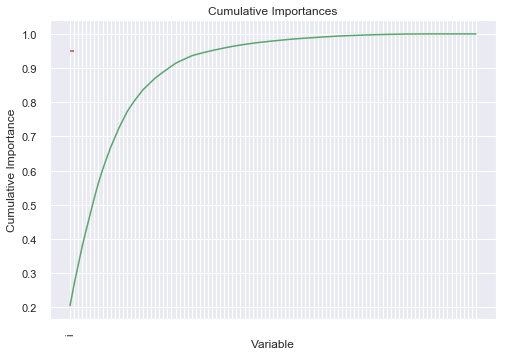

In [487]:
# list of x locations for plotting
x_values = list(range(len(feature_importances_gbm)))

# List of features sorted from most to least important
sorted_importances = [importance[1] for importance in feature_importances_gbm]
sorted_features = [importance[0] for importance in feature_importances_gbm]

# Cumulative importances
cumulative_importances = np.cumsum(feature_importances_gbm)

# Make a line graph
plt.plot(x_values, cumulative_importances, 'g-')

# Draw line at 95% of importance retained
plt.hlines(y = 0.95, xmin=0, xmax=len(sorted_importances), color = 'r', linestyles = 'dashed')

# Format x ticks and labels
plt.xticks(x_values, sorted_features, rotation = 'vertical')

# Axis labels and title
plt.xlabel('Variable') 
plt.ylabel('Cumulative Importance') 
plt.title('Cumulative Importances')

In [488]:
print('Number of features for 95% importance:', np.where(cumulative_importances > 0.95)[0][0] + 1)

Number of features for 95% importance: 36


In [489]:
feature_importances_gbm[:36]

,importance
BPQ100D_9.0,0.204806
BPQ080_2.0,0.062506
BPQ090D_9.0,0.055714
BPQ030_9.0,0.055606
RIDAGEYR,0.048482
DRQSDIET_2.0,0.047254
BPQ040A_9.0,0.046529
BPQ070_9.0,0.043295
MCQ365D_2.0,0.037566
BPQ090D_2.0,0.034271


In [490]:
#top 30 features
print(feature_importances_gbm[:30].index)

Index(['BPQ100D_9.0', 'BPQ080_2.0', 'BPQ090D_9.0', 'BPQ030_9.0', 'RIDAGEYR',
       'DRQSDIET_2.0', 'BPQ040A_9.0', 'BPQ070_9.0', 'MCQ365D_2.0',
       'BPQ090D_2.0', 'MCQ365C_2.0', 'DRQSPREP_4.0', 'MCQ370C_2.0',
       'DS2DS_2.0', 'DS1DS_2.0', 'RIAGENDR', 'INDFMPIR', 'BPQ020_2.0',
       'BPQ100D_2.0', 'MCQ300A_9.0', 'DRQSPREP_3.0', 'DRQSDIET_1.0',
       'BPQ050A_9.0', 'DBD100_1.0', 'MCQ300A_2.0', 'DS1DS_1.0', 'cluster_mec',
       'BPQ060_9.0', 'DRQSPREP_2.0', 'MCQ370A_2.0'],
      dtype='object')


### gradient boosting 2nd run, top 30

In [491]:
X_best30 = nhanes_model_df[
    ['BPQ100D_9.0', 'BPQ080_2.0', 'BPQ090D_9.0', 'BPQ030_9.0', 'RIDAGEYR',
       'DRQSDIET_2.0', 'BPQ040A_9.0', 'BPQ070_9.0', 'MCQ365D_2.0',
       'BPQ090D_2.0', 'MCQ365C_2.0', 'DRQSPREP_4.0', 'MCQ370C_2.0',
       'DS2DS_2.0', 'DS1DS_2.0', 'RIAGENDR', 'INDFMPIR', 'BPQ020_2.0',
       'BPQ100D_2.0', 'MCQ300A_9.0', 'DRQSPREP_3.0', 'DRQSDIET_1.0',
       'BPQ050A_9.0', 'DBD100_1.0', 'MCQ300A_2.0', 'DS1DS_1.0', 'cluster_mec',
       'BPQ060_9.0', 'DRQSPREP_2.0', 'MCQ370A_2.0']]
y_best30= nhanes_model_df['heart_dz']

# summarize class distribution
counter = Counter(y_best30)
print(counter)

Counter({0: 4403, 1: 309})


In [492]:
X_best30_train, X_best30_test, y_best30_train, y_best30_test = train_test_split(X_best30, y_best30, stratify=y_best30, random_state=42)

In [493]:
# transform the dataset
oversample = SMOTE()
X_os_best30_train, y_os_best30_train = oversample.fit_resample(X_best30_train, y_best30_train)

# summarize class distribution (SMOTE)
counter = Counter(y_os_best30_train)
print(counter)

Counter({0: 3302, 1: 3302})


Accuracy of the GBM 2nd run: 0.897
Classification Report on GBM 2nd run:
              precision    recall  f1-score   support

           0       0.96      0.93      0.94      1101
           1       0.31      0.45      0.37        77

    accuracy                           0.90      1178
   macro avg       0.63      0.69      0.66      1178
weighted avg       0.92      0.90      0.91      1178



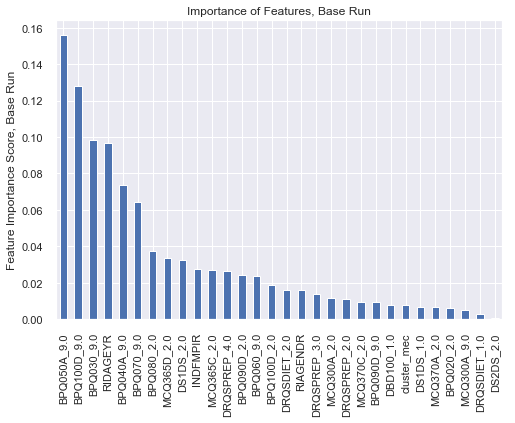

In [494]:
best30_gbc = GradientBoostingClassifier(learning_rate=0.1, n_estimators=100,
                                      max_depth=3, min_samples_split=2, 
                                      min_samples_leaf=1, subsample=1,
                                      max_features='sqrt', random_state=42)

best30_gbc.fit(X_os_best30_train, y_os_best30_train)
predictors = list(X_os_best30_train)
feat_imp = pd.Series(best30_gbc.feature_importances_, predictors).sort_values(ascending=False)
feat_imp.plot(kind='bar', title='Importance of Features, Base Run')
plt.ylabel('Feature Importance Score, Base Run')

print('Accuracy of the GBM 2nd run: {:.3f}'.format(best30_gbc.score(X_best30_test, y_best30_test)))
best30_pred=best30_gbc.predict(X_best30_test)
class_report_best30_gbc = classification_report(y_best30_test, best30_pred)
print('Classification Report on GBM 2nd run:')
print(class_report_best30_gbc)

In [495]:
pred_gbc_best30=best30_gbc.predict(X_best30_test)
conf_best30_gbc_mat = confusion_matrix(pred_gbc_best30, y_best30_test)

print('Confusion Matrix for balanced data, GBM 2nd run')
conf_best30_gbc_mat

Confusion Matrix for balanced data, GBM 2nd run


array([[1022,   42],
       [  79,   35]], dtype=int64)

#### metrics on 2nd Gradient Boosting Model:

In [496]:
print('Accuracy of the GBM 2nd run: {:.3f}'.format(best30_gbc.score(X_best30_test, y_best30_test)))

print('Classification Report on GBM 2nd run:')
print(class_report_best30_gbc)

print('Confusion Matrix for balanced data, GBM 2nd run')
conf_best30_gbc_mat

Accuracy of the GBM 2nd run: 0.897
Classification Report on GBM 2nd run:
              precision    recall  f1-score   support

           0       0.96      0.93      0.94      1101
           1       0.31      0.45      0.37        77

    accuracy                           0.90      1178
   macro avg       0.63      0.69      0.66      1178
weighted avg       0.92      0.90      0.91      1178

Confusion Matrix for balanced data, GBM 2nd run


array([[1022,   42],
       [  79,   35]], dtype=int64)

#### comments on 2nd Gradient Boosting Model:
Both the recall/F1-scores and the correctly identified class 1 cases have improved from the previous run of the model with feature-tuning. 

#### feature engineering, 2nd run

In [497]:
feature_importances_best30 = pd.DataFrame(best30_gbc.feature_importances_,
                                          index = X_os_best30_train.columns,
                                          columns=['importance']).sort_values('importance',
                                                                     ascending=False)
feature_importances_best30

,importance
BPQ050A_9.0,0.156189
BPQ100D_9.0,0.128157
BPQ030_9.0,0.098451
RIDAGEYR,0.096591
BPQ040A_9.0,0.073750
BPQ070_9.0,0.064085
BPQ080_2.0,0.037242
MCQ365D_2.0,0.033404
DS1DS_2.0,0.032280
INDFMPIR,0.027856


Text(0.5, 1.0, 'Cumulative Importances')

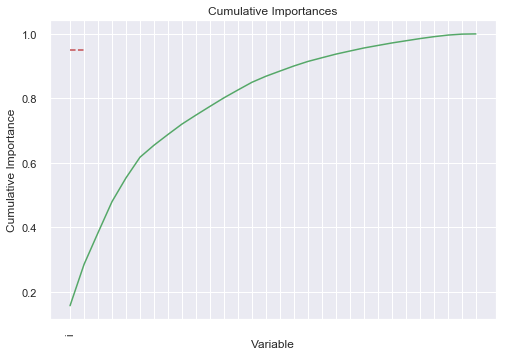

In [498]:
# list of x locations for plotting
x_values = list(range(len(feature_importances_best30)))

# List of features sorted from most to least important
sorted_importances = [importance[1] for importance in feature_importances_best30]
sorted_features = [importance[0] for importance in feature_importances_best30]

# Cumulative importances
cumulative_importances = np.cumsum(feature_importances_best30)

# Make a line graph
plt.plot(x_values, cumulative_importances, 'g-')

# Draw line at 95% of importance retained
plt.hlines(y = 0.95, xmin=0, xmax=len(sorted_importances), color = 'r', linestyles = 'dashed')

# Format x ticks and labels
plt.xticks(x_values, sorted_features, rotation = 'vertical')

# Axis labels and title
plt.xlabel('Variable') 
plt.ylabel('Cumulative Importance') 
plt.title('Cumulative Importances')

In [499]:
print('Number of features for 95% importance:', np.where(cumulative_importances > 0.95)[0][0] + 1)

Number of features for 95% importance: 22


In [500]:
feature_importances_best30[:22]

,importance
BPQ050A_9.0,0.156189
BPQ100D_9.0,0.128157
BPQ030_9.0,0.098451
RIDAGEYR,0.096591
BPQ040A_9.0,0.073750
BPQ070_9.0,0.064085
BPQ080_2.0,0.037242
MCQ365D_2.0,0.033404
DS1DS_2.0,0.032280
INDFMPIR,0.027856


In [501]:
print(feature_importances_best30[:15].index)

Index(['BPQ050A_9.0', 'BPQ100D_9.0', 'BPQ030_9.0', 'RIDAGEYR', 'BPQ040A_9.0',
       'BPQ070_9.0', 'BPQ080_2.0', 'MCQ365D_2.0', 'DS1DS_2.0', 'INDFMPIR',
       'MCQ365C_2.0', 'DRQSPREP_4.0', 'BPQ090D_2.0', 'BPQ060_9.0',
       'BPQ100D_2.0'],
      dtype='object')


### gradient boosting 3rd run, top 15

In [502]:
X_best15 = nhanes_model_df[
    ['BPQ050A_9.0', 'BPQ100D_9.0', 'BPQ030_9.0', 'RIDAGEYR', 'BPQ040A_9.0',
       'BPQ070_9.0', 'BPQ080_2.0', 'MCQ365D_2.0', 'DS1DS_2.0', 'INDFMPIR',
       'MCQ365C_2.0', 'DRQSPREP_4.0', 'BPQ090D_2.0', 'BPQ060_9.0',
       'BPQ100D_2.0']]
y_best15= nhanes_model_df['heart_dz']

# summarize class distribution
counter = Counter(y_best15)
print(counter)

Counter({0: 4403, 1: 309})


In [503]:
X_best15_train, X_best15_test, y_best15_train, y_best15_test = train_test_split(X_best15, y_best15, stratify=y_best15, random_state=42)

In [504]:
# transform the dataset
oversample = SMOTE()
X_os_best15_train, y_os_best15_train = oversample.fit_resample(X_best15_train, y_best15_train)

# summarize class distribution (SMOTE)
counter = Counter(y_os_best15_train)
print(counter)

Counter({0: 3302, 1: 3302})


Accuracy of the GBM on 3rd Run: 0.851
Classification Report of the GBM 3rd run:
              precision    recall  f1-score   support

           0       0.96      0.88      0.92      1101
           1       0.22      0.49      0.30        77

    accuracy                           0.85      1178
   macro avg       0.59      0.68      0.61      1178
weighted avg       0.91      0.85      0.88      1178



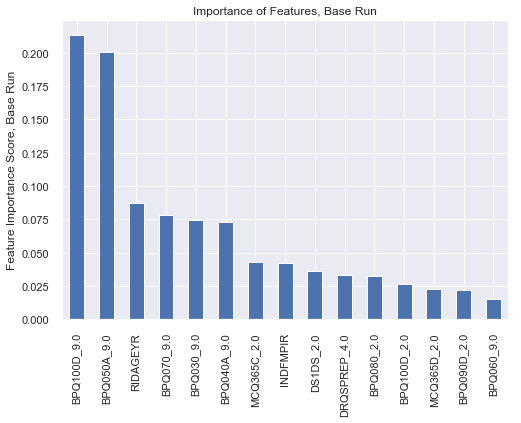

In [505]:
best15_gbc = GradientBoostingClassifier(learning_rate=0.1, n_estimators=100,
                                      max_depth=3, min_samples_split=2, 
                                      min_samples_leaf=1, subsample=1,
                                      max_features='sqrt', random_state=42)

best15_gbc.fit(X_os_best15_train, y_os_best15_train)
predictors = list(X_os_best15_train)
feat_imp = pd.Series(best15_gbc.feature_importances_, predictors).sort_values(ascending=False)
feat_imp.plot(kind='bar', title='Importance of Features, Base Run')
plt.ylabel('Feature Importance Score, Base Run')

print('Accuracy of the GBM on 3rd Run: {:.3f}'.format(best15_gbc.score(X_best15_test, y_best15_test)))
pred_best15=best15_gbc.predict(X_best15_test)
class_report_base_gbc = classification_report(y_best15_test, pred_best15)
print('Classification Report of the GBM 3rd run:')
print(class_report_base_gbc)

In [506]:
pred_best15=best15_gbc.predict(X_best15_test)
conf_best15_gbc_mat = confusion_matrix(pred_best15, y_best15_test)

print('Confusion Matrix for balanced data, GBM 3rd run')
conf_best15_gbc_mat

Confusion Matrix for balanced data, GBM 3rd run


array([[965,  39],
       [136,  38]], dtype=int64)

#### metrics Gradient Boosting Model:

In [507]:
print('Accuracy of the GBM on 3rd Run: {:.3f}'.format(best15_gbc.score(X_best15_test, y_best15_test)))

print('Classification Report of the GBM 3rd run:')
print(class_report_base_gbc)

print('Confusion Matrix for balanced data, GBM 3rd run')
conf_best15_gbc_mat

Accuracy of the GBM on 3rd Run: 0.851
Classification Report of the GBM 3rd run:
              precision    recall  f1-score   support

           0       0.96      0.88      0.92      1101
           1       0.22      0.49      0.30        77

    accuracy                           0.85      1178
   macro avg       0.59      0.68      0.61      1178
weighted avg       0.91      0.85      0.88      1178

Confusion Matrix for balanced data, GBM 3rd run


array([[965,  39],
       [136,  38]], dtype=int64)

#### comments on 3rd Gradient Boosting Model:
The feature-tuning shows improvement in the preferred metrics of recall and F1 scores, showing an increase of accurately identified class 1 cases from 35 to 42.


## parameter-tuning with gradient boosting

https://www.datacareer.ch/blog/parameter-tuning-in-gradient-boosting-gbm-with-python/
Run a baseline model without tuning:

#### base run parameters:
Current tree specific parameters:

**learning_rate** = 0.1 (shrinkage): Choose a relatively high learning rate. Generally the default value of 0.1 works but somewhere between 0.05 to 0.2 should work for different problems

**n_estimators** = 100 (number of trees): 

**max_depth** = 3: Should be chosen (5-8) based on the number of observations and predictors.

**min_samples_split** = 2: This should be ~0.5-1% of total values. With imbalanced class problem, take a small value from the range.

**min_samples_leaf** = 1: Can be selected based on intuition. This is used for preventing overfitting; use a small value with imbalanced classes.

**subsample** = 1: This is a commonly used used start value

**max_features** = 'sqrt': Its a general thumb-rule to start with square root.

**random_state** = 42: same random_state used in RFC model

Text(0, 0.5, 'GMB Feature Importance Score, Base Run')

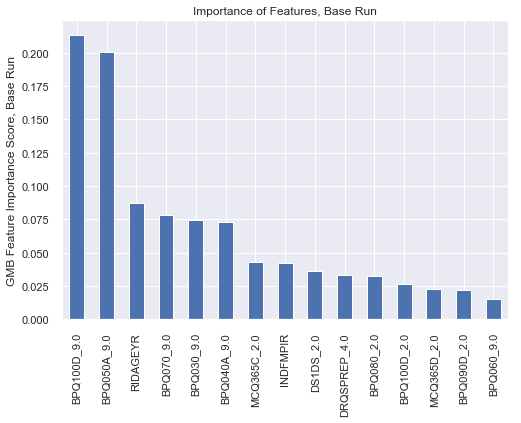

In [508]:
base15_gbc = GradientBoostingClassifier(learning_rate=0.1, n_estimators=100,
                                      max_depth=3, min_samples_split=2, 
                                      min_samples_leaf=1, subsample=1,
                                      max_features='sqrt', random_state=42)

base15_gbc.fit(X_os_best15_train, y_os_best15_train)
predictors = list(X_os_best15_train)
feat_imp = pd.Series(base15_gbc.feature_importances_, predictors).sort_values(ascending=False)
feat_imp.plot(kind='bar', title='Importance of Features, Base Run')
plt.ylabel('GMB Feature Importance Score, Base Run')

In [509]:
print('Accuracy of the GBM base run: {:.3f}'.format(base15_gbc.score(X_best15_test, y_best15_test)))
pred_base15=base15_gbc.predict(X_best15_test)
class_report_base_gbc = classification_report(y_best15_test, pred_base15)
print('Classification Report of the GMB base run:')
print(class_report_base_gbc)

Accuracy of the GBM base run: 0.851
Classification Report of the GMB base run:
              precision    recall  f1-score   support

           0       0.96      0.88      0.92      1101
           1       0.22      0.49      0.30        77

    accuracy                           0.85      1178
   macro avg       0.59      0.68      0.61      1178
weighted avg       0.91      0.85      0.88      1178



In [510]:
pred_base15=base15_gbc.predict(X_best15_test)
conf_base15_gbc_mat = confusion_matrix(pred_base15, y_best15_test)

print('Confusion Matrix for GMB base run')
conf_base15_gbc_mat

Confusion Matrix for GMB base run


array([[965,  39],
       [136,  38]], dtype=int64)

#### comments: the base run of the Gradient Boosting 
The base run of the Gradient Boosting Model does perform as well/better than the hyperparameter-tuned best model of the Random Forest Model. The recall score is slightly lower in the GBM than it was in the the RFC model, but the F1-score and the number of correctly identified class 1 cases is slightly higher. Will tune hypermarameters for GBM in an attempt to improve performance. 

### tuning learning_rate & n_estimators

In [511]:
# Tuning learning_rate & n_estimators
p_test3 = {'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001], 
           'n_estimators':[100,250,500,750,1000]}

tuning = GridSearchCV(estimator =GradientBoostingClassifier
                      (max_depth=3, min_samples_split=2, min_samples_leaf=1,
                       subsample=1, max_features='sqrt', random_state=42), 
            param_grid = p_test3, scoring='recall',n_jobs=4, cv=5)
tuning.fit(X_os_best15_train, y_os_best15_train)
print(tuning.scorer_) 
print('Best parameters: {}'.format(tuning.best_params_))
print('Best score: {}'.format(tuning.best_score_))

make_scorer(recall_score, average=binary)
Best parameters: {'learning_rate': 0.15, 'n_estimators': 500}
Best score: 0.9654586714344656


### tuning max_depth

In [512]:
#max_depth
p_test2 = {'max_depth':[2,3,4,5,6,7] }
tuning = GridSearchCV(estimator =GradientBoostingClassifier
                      (learning_rate=0.1, n_estimators=1000, 
                       min_samples_split=2, min_samples_leaf=1, 
                       subsample=1,max_features='sqrt', random_state=42), 
            param_grid = p_test2, scoring='recall',n_jobs=4, cv=5)
tuning.fit(X_os_best15_train, y_os_best15_train)
print(tuning.scorer_) 
print('Best parameters: {}'.format(tuning.best_params_))
print('Best score: {}'.format(tuning.best_score_))

make_scorer(recall_score, average=binary)
Best parameters: {'max_depth': 7}
Best score: 0.9645500389675881


### initial evaluation of model with tuned-parameters 
'learning_rate': 0.15, 'n_estimators': 500, 'max_depth': 7

Accuracy of the GBM hyperparameter-tuning, model1: 0.898
Classification Report of the GBM hyperparameter-tuning, model1:
              precision    recall  f1-score   support

           0       0.95      0.94      0.95      1101
           1       0.25      0.27      0.26        77

    accuracy                           0.90      1178
   macro avg       0.60      0.61      0.60      1178
weighted avg       0.90      0.90      0.90      1178



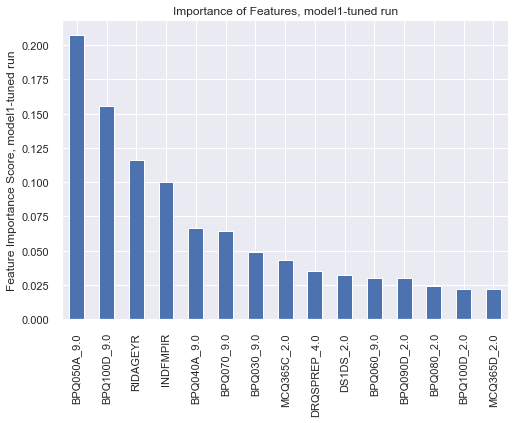

In [513]:
#First evaluation of new model on test set
model1 = GradientBoostingClassifier(learning_rate=0.15, n_estimators=500,
                                    max_depth=7, min_samples_split=2, 
                                    min_samples_leaf=1, subsample=1,
                                    max_features='sqrt', random_state=42)
model1.fit(X_os_best15_train, y_os_best15_train)

predictors=list(X_os_best15_train)
feat_imp = pd.Series(model1.feature_importances_, predictors).sort_values(ascending=False)
feat_imp.plot(kind='bar', title='Importance of Features, model1-tuned run')
plt.ylabel('Feature Importance Score, model1-tuned run')
print('Accuracy of the GBM hyperparameter-tuning, model1: {:.3f}'.format(model1.score(X_best15_test, y_best15_test)))
pred=model1.predict(X_best15_test)
class_report_model1 = classification_report(y_best15_test, pred)
print('Classification Report of the GBM hyperparameter-tuning, model1:')
print(class_report_model1)

In [514]:
pred_gbs_model1=model1.predict(X_best15_test)
conf_model1_gbc_mat = confusion_matrix(pred_gbs_model1, y_best15_test)

print('Confusion Matrix for GBM hyperparameter-tuning, model1')
conf_model1_gbc_mat

Confusion Matrix for GBM hyperparameter-tuning, model1


array([[1037,   56],
       [  64,   21]], dtype=int64)

#### comments: model1 performance (with parameter-tuning) is NOT improved over base run gradient boosting model based on lower recall/F1-scores and a lower number of correctly identified class 1 cases.

### tuning min_sample_split and min_samples_leaf

In [515]:
#tuning min sample split and min samples leaf
p_test4 = {'min_samples_split':[2,4,6,8,10,20,40,60,100], 
           'min_samples_leaf':[1,3,5,7,9]}

tuning = GridSearchCV(estimator=GradientBoostingClassifier(learning_rate=0.15,
                                                           n_estimators=500,
                                                           max_depth=7, 
                                                           subsample=1,
                                                           max_features='sqrt',
                                                           random_state=42), 
            param_grid = p_test4, scoring='recall',n_jobs=4, cv=5)
tuning.fit(X_os_best15_train, y_os_best15_train)
print(tuning.scorer_) 
print('Best parameters: {}'.format(tuning.best_params_))
print('Best score: {}'.format(tuning.best_score_))

make_scorer(recall_score, average=binary)
Best parameters: {'min_samples_leaf': 9, 'min_samples_split': 2}
Best score: 0.9657603264108559


### 2nd evaluation of model with tuned-parameters 
'learning_rate': 0.15, 'n_estimators': 500, 'max_depth': 7, 'min_samples_leaf': 9, 'min_samples_split': 2

Accuracy of the GBM hyperparameter-tuning, model2 run: 0.896
Classification Report of the GBM hyperparameter-tuning, model2 run:
              precision    recall  f1-score   support

           0       0.95      0.94      0.94      1101
           1       0.24      0.26      0.25        77

    accuracy                           0.90      1178
   macro avg       0.59      0.60      0.60      1178
weighted avg       0.90      0.90      0.90      1178



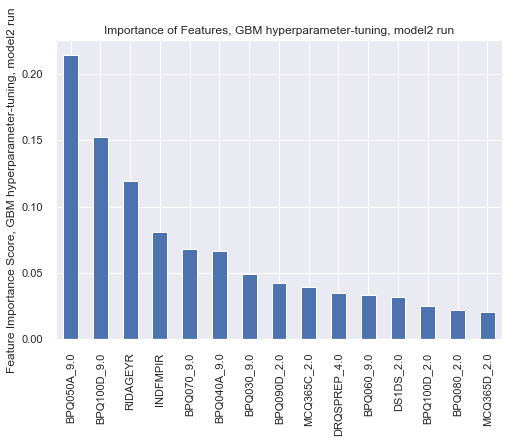

In [516]:
#second evaluation of new model on test set
model2 = GradientBoostingClassifier(learning_rate=0.15, n_estimators=500,
                                    max_depth=7, min_samples_split=2, 
                                    min_samples_leaf=9, subsample=1,
                                    max_features='sqrt', random_state=42)
model2.fit(X_os_best15_train, y_os_best15_train)

predictors=list(X_os_best15_train)
feat_imp = pd.Series(model2.feature_importances_, predictors).sort_values(ascending=False)
feat_imp.plot(kind='bar', title='Importance of Features, GBM hyperparameter-tuning, model2 run')
plt.ylabel('Feature Importance Score, GBM hyperparameter-tuning, model2 run')
print('Accuracy of the GBM hyperparameter-tuning, model2 run: {:.3f}'.format(model2.score(X_best15_test, y_best15_test)))
pred=model2.predict(X_best15_test)
class_report_model2 = classification_report(y_best15_test, pred)
print('Classification Report of the GBM hyperparameter-tuning, model2 run:')
print(class_report_model2)

In [517]:
pred_gbs_model2=model2.predict(X_best15_test)
conf_model2_gbc_mat = confusion_matrix(pred_gbs_model2, y_best15_test)

print('Confusion Matrix for GBM hyperparameter-tuning, model2 run')
conf_model2_gbc_mat

Confusion Matrix for GBM hyperparameter-tuning, model2 run


array([[1036,   57],
       [  65,   20]], dtype=int64)

#### comments on model2: performance is NOT improved over best run or model1 run with parameter-tuning based on recall and F1-scores

### tuning max_features

In [518]:
#tuning max_features
p_test5 = {'max_features':[2,3,4,5,6,7]}
tuning = GridSearchCV(estimator =GradientBoostingClassifier(learning_rate=0.15,
                                                            n_estimators=500,
                                                            max_depth=7, 
                                                            min_samples_split=2,
                                                            min_samples_leaf=9, 
                                                            subsample=1, 
                                                            random_state=42), 
param_grid = p_test5, scoring='recall',n_jobs=4, cv=5)
tuning.fit(X_os_best15_train, y_os_best15_train)
print(tuning.scorer_) 
print('Best parameters: {}'.format(tuning.best_params_))
print('Best score: {}'.format(tuning.best_score_))

make_scorer(recall_score, average=binary)
Best parameters: {'max_features': 7}
Best score: 0.9684889744647688


### tuning subsample

In [519]:
p_test6= {'subsample':[0.7,0.75,0.8,0.85,0.9,0.95,1]}

tuning = GridSearchCV(estimator =GradientBoostingClassifier(learning_rate=0.15, 
                                                            n_estimators=500,
                                                            max_depth=7, 
                                                            min_samples_split=2, 
                                                            min_samples_leaf=9,
                                                            max_features=7 , 
                                                            random_state=42), 
param_grid = p_test6, scoring='recall',n_jobs=4,cv=5)
tuning.fit(X_os_best15_train, y_os_best15_train)
print(tuning.scorer_) 
print('Best parameters: {}'.format(tuning.best_params_))
print('Best score: {}'.format(tuning.best_score_))

make_scorer(recall_score, average=binary)
Best parameters: {'subsample': 0.7}
Best score: 0.9687915463255857


### 3rd evaluation of model with tuned-parameters 
'learning_rate': 0.05, 'n_estimators': 1000, 'max_depth': 7, 'min_samples_leaf': 9, 'min_samples_split': 2, 'max_features': 7, 'subsample': 0.7

Accuracy of the GBM hyperparameter-tuning, model3 run: 0.898
Classification Report on the GBM hyperparameter-tuning, model3 run:
              precision    recall  f1-score   support

           0       0.95      0.94      0.95      1101
           1       0.24      0.26      0.25        77

    accuracy                           0.90      1178
   macro avg       0.59      0.60      0.60      1178
weighted avg       0.90      0.90      0.90      1178



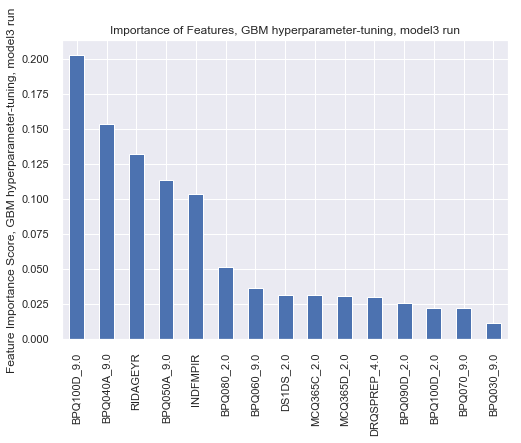

In [520]:
model3=GradientBoostingClassifier(learning_rate=0.15, n_estimators=500,
                               max_depth=7, min_samples_split=2, 
                               min_samples_leaf=9, max_features=3, 
                               subsample=0.7, random_state=42)
model3.fit(X_os_best15_train, y_os_best15_train)

predictors=list(X_os_best15_train)
feat_imp = pd.Series(model3.feature_importances_, predictors).sort_values(ascending=False)
feat_imp.plot(kind='bar', title='Importance of Features, GBM hyperparameter-tuning, model3 run')
plt.ylabel('Feature Importance Score, GBM hyperparameter-tuning, model3 run')
print('Accuracy of the GBM hyperparameter-tuning, model3 run: {:.3f}'.format(model3.score(X_best15_test, y_best15_test)))
pred=model3.predict(X_best15_test)
class_report_model3 = classification_report(y_best15_test, pred)
print('Classification Report on the GBM hyperparameter-tuning, model3 run:')
print(class_report_model3)

In [521]:
pred_gbs_model3=model3.predict(X_best15_test)
conf_model3_gbc_mat = confusion_matrix(pred_gbs_model3, y_best15_test)

print('Confusion Matrix for GBM hyperparameter-tuning, model2 run')
conf_model3_gbc_mat

Confusion Matrix for GBM hyperparameter-tuning, model2 run


array([[1038,   57],
       [  63,   20]], dtype=int64)

#### comments on GBM hyperparameter-tuning, model3:
The performance of the GBM model with all hyperparameters tuned does NOT perform better than the base GBM model. 

#### visualize performance of hyperparameter-tuned GBM models

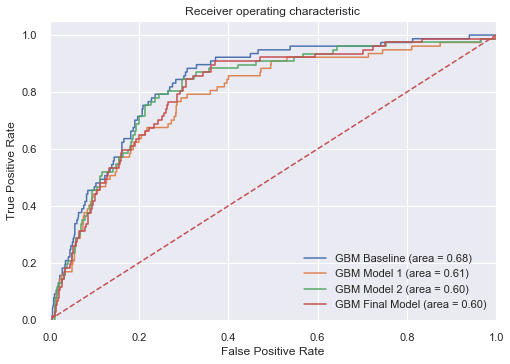

In [522]:
from sklearn import metrics
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve 


#run models
base15_gbc = GradientBoostingClassifier(learning_rate=0.1, n_estimators=100,
                                      max_depth=3, min_samples_split=2, 
                                      min_samples_leaf=1, subsample=1,
                                      max_features='sqrt', random_state=42)

base15_gbc.fit(X_os_best15_train, y_os_best15_train)


model1 = GradientBoostingClassifier(learning_rate=0.15, n_estimators=500,
                                    max_depth=7, min_samples_split=2, 
                                    min_samples_leaf=1, subsample=1,
                                    max_features='sqrt', random_state=42)
model1.fit(X_os_best15_train, y_os_best15_train)


model2 = GradientBoostingClassifier(learning_rate=0.15, n_estimators=500,
                                    max_depth=7, min_samples_split=2, 
                                    min_samples_leaf=9, subsample=1,
                                    max_features='sqrt', random_state=42)
model2.fit(X_os_best15_train, y_os_best15_train)


model3=GradientBoostingClassifier(learning_rate=0.15, n_estimators=500,
                               max_depth=7, min_samples_split=2, 
                               min_samples_leaf=9, max_features=3, 
                               subsample=0.7, random_state=42)
model3.fit(X_os_best15_train, y_os_best15_train)


#calculate values for ROC AUC plot
#baseline model
base_gbc_roc_auc = roc_auc_score(y_best15_test, base15_gbc.predict(X_best15_test))
fprB, tprB, thresholdsB = roc_curve(y_best15_test, base15_gbc.predict_proba(X_best15_test)[:,1])
#model 1
model1_roc_auc = roc_auc_score(y_best15_test, model1.predict(X_best15_test))
fpr1, tpr1, thresholds1 = roc_curve(y_best15_test, model1.predict_proba(X_best15_test)[:,1])
#model 2
model2_roc_auc = roc_auc_score(y_best15_test, model2.predict(X_best15_test))
fpr2, tpr2, thresholds2 = roc_curve(y_best15_test, model2.predict_proba(X_best15_test)[:,1])
#model 3 
model3_roc_auc = roc_auc_score(y_best15_test, model3.predict(X_best15_test))
fpr3, tpr3, thresholds3 = roc_curve(y_best15_test, model3.predict_proba(X_best15_test)[:,1])

plt.figure()
plt.plot(fprB, tprB, label='GBM Baseline (area = %0.2f)' % base_gbc_roc_auc)
plt.plot(fpr1, tpr1, label='GBM Model 1 (area = %0.2f)' % model1_roc_auc)
plt.plot(fpr2, tpr2, label='GBM Model 2 (area = %0.2f)' % model2_roc_auc)
plt.plot(fpr3, tpr3, label='GBM Final Model (area = %0.2f)' % model3_roc_auc)

plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

#### comments: gradient boosting
The gradient boosting model with NO hyperparameter tuning performed the best. However, none of the gradient boosting models performed significantly better than the best random forest model. 

## SVM Model
run each model with top 30 and top 15 features from both the RFC and GBM models

### SVC linear, top 30 features from RFC model

In [648]:
X_linear_r30 = nhanes_model_df[
    ['BPQ100D_9.0', 'BPQ030_9.0', 'BPQ050A_9.0', 'RIDAGEYR', 'BPQ040A_9.0',
       'BPQ080_2.0', 'BPQ090D_2.0', 'DS1DS_2.0', 'BPQ020_2.0', 'MCQ365C_2.0',
       'DRQSPREP_4.0', 'RIAGENDR', 'INDFMPIR', 'BPQ070_9.0', 'MCQ365D_2.0',
       'BPQ090D_9.0', 'cluster_mec', 'BPQ100D_2.0', 'DRQSDIET_2.0', 'WTDRD1_x',
       'MCQ370C_2.0', 'log_tot_h20_avg', 'log_DR1TCAFF', 'DBD100_1.0',
       'WTDR2D_x', 'log_tot_na_avg', 'DS2DS_2.0', 'log_tot_d_avg',
       'DRQSPREP_3.0', 'log_tot_vit_k_avg']]
y_linear_r30= nhanes_model_df['heart_dz']

# summarize class distribution
counter = Counter(y_linear_r30)
print(counter)

Counter({0: 4403, 1: 309})


In [649]:
X_linear_r30_train, X_linear_r30_test, y_linear_r30_train, y_linear_r30_test = train_test_split(X_linear_r30, y_linear_r30, stratify = y_linear_r30, random_state=42)

In [650]:
# transform the dataset
oversample = SMOTE()
X_os_linear_r30_train, y_os_linear_r30_train = oversample.fit_resample(X_linear_r30_train, y_linear_r30_train)

# summarize class distribution (SMOTE)
counter = Counter(y_os_linear_r30_train)
print(counter)

Counter({0: 3302, 1: 3302})


In [651]:
# import support vector classifier 
from sklearn.svm import SVC 
svc_linear = SVC(kernel='linear') 
linear_r30 = svc_linear.fit(X_os_linear_r30_train, y_os_linear_r30_train)  

In [652]:
y_linear_r30_pred = svc_linear.predict(X_linear_r30_test)
linear_r30_class = classification_report(y_linear_r30_test,y_linear_r30_pred)
linear_r30_confusion = confusion_matrix(y_linear_r30_pred, y_linear_r30_test)

print('Classification Report for SVC_linear model, top 30 RFC features:')
print(linear_r30_class)

print('Confusion Matrix for SVC_linear model, top 30 RFC features:')
print(linear_r30_confusion)

Classification Report for SVC_linear model, top 30 RFC features:
              precision    recall  f1-score   support

           0       0.97      0.80      0.88      1101
           1       0.19      0.65      0.29        77

    accuracy                           0.79      1178
   macro avg       0.58      0.73      0.59      1178
weighted avg       0.92      0.79      0.84      1178

Confusion Matrix for SVC_linear model, top 30 RFC features:
[[885  27]
 [216  50]]


#### comments:
The SVC linear model, using top 30 features from previous RFC model, is the best performing model to date. The recall score indicataes that 65% of class 1 cases are accurately identified. 

### SVC linear, 15 features from RFC model

In [653]:
X_linear_r15 = nhanes_model_df[
    ['BPQ100D_9.0', 'BPQ050A_9.0', 'RIDAGEYR', 'BPQ030_9.0', 'BPQ090D_2.0',
       'BPQ020_2.0', 'INDFMPIR', 'BPQ040A_9.0', 'MCQ365C_2.0', 'WTDRD1_x',
       'BPQ070_9.0', 'cluster_mec', 'log_tot_d_avg', 'DRQSPREP_4.0',
       'WTDR2D_x']]
y_linear_r15 = nhanes_model_df['heart_dz']

# summarize class distribution
counter = Counter(y_linear_r15)
print(counter)

Counter({0: 4403, 1: 309})


In [654]:
X_linear_r15_train, X_linear_r15_test, y_linear_r15_train, y_linear_r15_test = train_test_split(X_linear_r15, y_linear_r15, stratify=y_linear_r15, random_state=42)

In [655]:
# transform the dataset
oversample = SMOTE()
X_os_linear_r15_train, y_os_linear_r15_train = oversample.fit_resample(X_linear_r15_train, y_linear_r15_train)

# summarize class distribution (SMOTE)
counter = Counter(y_os_linear_r15_train)
print(counter)

Counter({0: 3302, 1: 3302})


In [656]:
svc_linear = SVC(kernel='linear') 
linear_r15 = svc_linear.fit(X_os_linear_r15_train, y_os_linear_r15_train)  

In [657]:
y_linear_r15_pred = svc_linear.predict(X_linear_r15_test)
linear_r15_class = classification_report(y_linear_r15_test,y_linear_r15_pred)
linear_r15_confusion = confusion_matrix(y_linear_r15_pred, y_linear_r15_test)


print('Classification Report for SVC_linear model, top 15 RFC features:')
print(linear_r15_class)

print('Confusion Matrix for SVC_linear model, top 15 RFC features:')
print(linear_r15_confusion)

Classification Report for SVC_linear model, top 15 RFC features:
              precision    recall  f1-score   support

           0       0.97      0.81      0.88      1101
           1       0.19      0.64      0.29        77

    accuracy                           0.80      1178
   macro avg       0.58      0.72      0.58      1178
weighted avg       0.92      0.80      0.84      1178

Confusion Matrix for SVC_linear model, top 15 RFC features:
[[888  28]
 [213  49]]


#### comment: 
This set of features (top 15, RFC) is an improvement over the top 30 RFC feature set and is currently the best performing model with 71% of the class 1 cases accurately identified. 

### SVC linear, 30 features from GBM model

In [658]:
X_linear_g30 = nhanes_model_df[
    ['BPQ100D_9.0', 'BPQ080_2.0', 'BPQ030_9.0', 'BPQ090D_9.0',
       'DRQSDIET_2.0', 'BPQ040A_9.0', 'RIDAGEYR', 'BPQ070_9.0', 'MCQ365D_2.0',
       'BPQ090D_2.0', 'MCQ370C_2.0', 'MCQ365C_2.0', 'DRQSPREP_4.0',
       'DS2DS_2.0', 'DS1DS_2.0', 'INDFMPIR', 'BPQ020_2.0', 'RIAGENDR',
       'BPQ100D_2.0', 'DRQSPREP_3.0', 'DRQSDIET_1.0', 'MCQ300A_9.0',
       'cluster_mec', 'BPQ050A_9.0', 'DBD100_1.0', 'DS1DS_1.0', 'MCQ300A_2.0',
       'BPQ060_9.0', 'MCQ370A_2.0', 'DRQSPREP_2.0']]
y_linear_g30 = nhanes_model_df['heart_dz']

# summarize class distribution
counter = Counter(y_linear_g30)
print(counter)

Counter({0: 4403, 1: 309})


In [659]:
X_linear_g30_train, X_linear_g30_test, y_linear_g30_train, y_linear_g30_test = train_test_split(X_linear_g30, y_linear_g30, stratify=y_linear_g30, random_state=42)

In [660]:
# transform the dataset
oversample = SMOTE()
X_os_linear_g30_train, y_os_linear_g30_train = oversample.fit_resample(X_linear_g30_train, y_linear_g30_train)

# summarize class distribution (SMOTE)
counter = Counter(y_os_linear_g30_train)
print(counter)

Counter({0: 3302, 1: 3302})


In [661]:
svc_linear = SVC(kernel='linear') 
linear_g30 = svc_linear.fit(X_os_linear_g30_train, y_os_linear_g30_train) 

In [662]:
y_linear_g30_pred = svc_linear.predict(X_linear_g30_test)
linear_g30_class = classification_report(y_linear_g30_test,y_linear_g30_pred)
linear_g30_confusion = confusion_matrix(y_linear_g30_pred, y_linear_g30_test)


print('Classification Report for SVC_linear model, top 30 GBM features:')
print(linear_g30_class)

print('Confusion Matrix for SVC_linear model, top 30 GBM features:')
print(linear_g30_confusion)

Classification Report for SVC_linear model, top 30 GBM features:
              precision    recall  f1-score   support

           0       0.96      0.93      0.95      1101
           1       0.33      0.51      0.40        77

    accuracy                           0.90      1178
   macro avg       0.65      0.72      0.67      1178
weighted avg       0.92      0.90      0.91      1178

Confusion Matrix for SVC_linear model, top 30 GBM features:
[[1023   38]
 [  78   39]]


#### comments:
The performance of the top 30 GBM features is similiar to that of the top 30 RFC features. The metrics for this model/feature set are slightly lower than the top 15 RFC feature set, but remain higher than all the previous GMB and the RFC model runs. 

### SVC linear, 15 features from GBM model

In [663]:
X_linear_g15 = nhanes_model_df[
    ['BPQ050A_9.0', 'BPQ100D_9.0', 'RIDAGEYR', 'BPQ030_9.0', 'BPQ040A_9.0',
       'BPQ070_9.0', 'DS1DS_2.0', 'DRQSDIET_2.0', 'DRQSPREP_4.0',
       'MCQ370A_2.0', 'BPQ080_2.0', 'INDFMPIR', 'RIAGENDR', 'MCQ365C_2.0',
       'BPQ100D_2.0']]
y_linear_g15 = nhanes_model_df['heart_dz']

# summarize class distribution
counter = Counter(y_linear_g15)
print(counter)

Counter({0: 4403, 1: 309})


In [664]:
X_linear_g15_train, X_linear_g15_test, y_linear_g15_train, y_linear_g15_test = train_test_split(X_linear_g15, y_linear_g15, stratify=y_linear_g15, random_state=42)

In [665]:
# transform the dataset
oversample = SMOTE()
X_os_linear_g15_train, y_os_linear_g15_train = oversample.fit_resample(X_linear_g15_train, y_linear_g15_train)

# summarize class distribution (SMOTE)
counter = Counter(y_os_linear_g15_train)
print(counter)

Counter({0: 3302, 1: 3302})


In [666]:
svc_linear = SVC(kernel='linear') 
linear_g15 =svc_linear.fit(X_os_linear_g15_train, y_os_linear_g15_train) 

In [667]:
y_linear_g15_pred = svc_linear.predict(X_linear_g15_test)
linear_g15_class = classification_report(y_linear_g15_test,y_linear_g15_pred)
linear_g15_confusion = confusion_matrix(y_linear_g15_pred, y_linear_g15_test)


print('Classification Report for SVC_linear model, top 15 GBM features:')
print(linear_g15_class)

print('Confusion Matrix for SVC_linear model, top 15 GBM features:')
print(linear_g15_confusion)

Classification Report for SVC_linear model, top 15 GBM features:
              precision    recall  f1-score   support

           0       0.97      0.87      0.91      1101
           1       0.23      0.56      0.33        77

    accuracy                           0.85      1178
   macro avg       0.60      0.71      0.62      1178
weighted avg       0.92      0.85      0.88      1178

Confusion Matrix for SVC_linear model, top 15 GBM features:
[[957  34]
 [144  43]]


#### comments: 
Curiously, the top 15 GBM feature set performs worse than the top 30 GBM feature set, with only 56% of the class 1 cases accurately identified. 

### SVC poly, 30 features from RFC model 

In [668]:
X_poly_r30 = nhanes_model_df[
    ['BPQ100D_9.0', 'BPQ030_9.0', 'RIDAGEYR', 
'BPQ050A_9.0', 'BPQ040A_9.0', 'BPQ080_2.0', 
'BPQ020_2.0', 'BPQ090D_2.0', 'DS1DS_2.0',
'MCQ365C_2.0', 'RIAGENDR', 'BPQ070_9.0', 
'DRQSPREP_4.0', 'INDFMPIR', 'MCQ365D_2.0',
'cluster_mec', 'BPQ100D_2.0', 'BPQ090D_9.0', 
'DRQSDIET_2.0', 'WTDRD1_x', 'log_tot_h20_avg',
'log_DR1TCAFF', 'MCQ370A_2.0', 'WTDR2D_x',
'DRQSPREP_3.0', 'log_tot_d_avg', 'DS2DS_2.0', 
'MCQ370C_2.0', 'log_tot_alpha_c_avg', 
'MCQ370D_2.0']]
y_poly_r30= nhanes_model_df['heart_dz']

# summarize class distribution
counter = Counter(y_poly_r30)
print(counter)

Counter({0: 4403, 1: 309})


In [669]:
X_poly_r30_train, X_poly_r30_test, y_poly_r30_train, y_poly_r30_test = train_test_split(X_poly_r30, y_poly_r30, stratify = y_poly_r30, random_state=42)

In [670]:
# transform the dataset
oversample = SMOTE()
X_os_poly_r30_train, y_os_poly_r30_train = oversample.fit_resample(X_poly_r30_train, y_poly_r30_train)

# summarize class distribution (SMOTE)
counter = Counter(y_os_poly_r30_train)
print(counter)

Counter({0: 3302, 1: 3302})


In [671]:
# import support vector classifier 

svc_poly = SVC(kernel='poly') 
poly_r30 = svc_poly.fit(X_os_poly_r30_train, y_os_poly_r30_train) 

In [672]:
y_poly_r30_pred = svc_poly.predict(X_poly_r30_test)
poly_r30_class = classification_report(y_poly_r30_test,y_poly_r30_pred)
poly_r30_confusion = confusion_matrix(y_poly_r30_pred, y_poly_r30_test)


print('Classification Report for SVC_poly model, top 30 RFC features:')
print(poly_r30_class)

print('Confusion Matrix for SVC_poly model, top 30 RFC features:')
print(poly_r30_confusion)

Classification Report for SVC_poly model, top 30 RFC features:
              precision    recall  f1-score   support

           0       0.95      0.05      0.10      1101
           1       0.07      0.96      0.12        77

    accuracy                           0.11      1178
   macro avg       0.51      0.51      0.11      1178
weighted avg       0.89      0.11      0.10      1178

Confusion Matrix for SVC_poly model, top 30 RFC features:
[[  57    3]
 [1044   74]]


#### comments: 
The top 30 feature set run with the SVC_poly model is by far the best performing model with 96% of the class 1 cases accurately identifiec. The precision of class 0 (no heart disease) is grossly underperforming previous models. 


### SVC poly, 15 features from RFC model

In [673]:
X_poly_r15 = nhanes_model_df[
    ['BPQ100D_9.0', 'BPQ050A_9.0', 'BPQ030_9.0', 
     'RIDAGEYR', 'BPQ040A_9.0', 'BPQ020_2.0', 
     'BPQ090D_2.0', 'INDFMPIR', 'MCQ365C_2.0', 
     'WTDRD1_x', 'DS1DS_2.0', 'log_tot_d_avg', 
     'log_tot_alpha_c_avg', 'log_tot_h20_avg',
     'WTDR2D_x']]
y_poly_r15 = nhanes_model_df['heart_dz']

# summarize class distribution
counter = Counter(y_poly_r15)
print(counter)

Counter({0: 4403, 1: 309})


In [674]:
X_poly_r15_train, X_poly_r15_test, y_poly_r15_train, y_poly_r15_test = train_test_split(X_poly_r15, y_poly_r15, stratify = y_poly_r15, random_state=42)

In [675]:
# transform the dataset
oversample = SMOTE()
X_os_poly_r15_train, y_os_poly_r15_train = oversample.fit_resample(X_poly_r15_train, y_poly_r15_train)

# summarize class distribution (SMOTE)
counter = Counter(y_os_poly_r15_train)
print(counter)

Counter({0: 3302, 1: 3302})


In [676]:
svc_poly = SVC(kernel='poly')
poly_r15 = svc_poly.fit(X_os_poly_r15_train, y_os_poly_r15_train)

In [677]:
y_poly_r15_pred = svc_poly.predict(X_poly_r15_test)
poly_r15_class = classification_report(y_poly_r15_test, y_poly_r15_pred)
poly_r15_confusion = confusion_matrix(y_poly_r15_pred, y_poly_r15_test)

  
print('Classification Report for SVC_poly model, top 15 RFC features:')
print(poly_r15_class)
      

print('Confusion Matrix for SVC_poly model, top 15 RFC features:')
print(poly_r15_confusion) 

Classification Report for SVC_poly model, top 15 RFC features:
              precision    recall  f1-score   support

           0       0.95      0.06      0.11      1101
           1       0.07      0.96      0.12        77

    accuracy                           0.12      1178
   macro avg       0.51      0.51      0.12      1178
weighted avg       0.90      0.12      0.11      1178

Confusion Matrix for SVC_poly model, top 15 RFC features:
[[  63    3]
 [1038   74]]


#### comments:
As seen in the previous run of this model with the top 30 RFC features, this model performs extremely well (perhaps overfitting) using the recall score for class 1 (heart disease) by correctly identifying 97% of the cases. However, the recall score for class 0 (no heart disease) is only 5%. Will disuss the this trade-off in final comments.


### SVC poly, 30 features from GBM model 

In [678]:
X_poly_g30 = nhanes_model_df[
    ['BPQ100D_9.0', 'BPQ080_2.0', 'BPQ030_9.0', 'BPQ090D_9.0',
       'DRQSDIET_2.0', 'BPQ040A_9.0', 'RIDAGEYR', 'BPQ070_9.0', 'MCQ365D_2.0',
       'BPQ090D_2.0', 'MCQ370C_2.0', 'MCQ365C_2.0', 'DRQSPREP_4.0',
       'DS2DS_2.0', 'DS1DS_2.0', 'INDFMPIR', 'BPQ020_2.0', 'RIAGENDR',
       'BPQ100D_2.0', 'DRQSPREP_3.0', 'DRQSDIET_1.0', 'MCQ300A_9.0',
       'cluster_mec', 'BPQ050A_9.0', 'DBD100_1.0', 'DS1DS_1.0', 'MCQ300A_2.0',
       'BPQ060_9.0', 'MCQ370A_2.0', 'DRQSPREP_2.0']]
y_poly_g30 = nhanes_model_df['heart_dz']

# summarize class distribution
counter = Counter(y_poly_g30)
print(counter)

Counter({0: 4403, 1: 309})


In [679]:
X_poly_g30_train, X_poly_g30_test, y_poly_g30_train, y_poly_g30_test = train_test_split(X_poly_g30, y_poly_g30, stratify = y_poly_g30, random_state=42)

In [680]:
# transform the dataset
oversample = SMOTE()
X_os_poly_g30_train, y_os_poly_g30_train = oversample.fit_resample(X_poly_g30_train, y_poly_g30_train)

# summarize class distribution (SMOTE)
counter = Counter(y_os_poly_g30_train)
print(counter)

Counter({0: 3302, 1: 3302})


In [681]:
svc_poly = SVC(kernel='poly') 
poly_g30 = svc_poly.fit(X_os_poly_g30_train, y_os_poly_g30_train) 

In [682]:
y_poly_g30_pred = svc_poly.predict(X_poly_g30_test)
poly_g30_class = classification_report(y_poly_g30_test, y_poly_g30_pred)
poly_g30_confusion = confusion_matrix(y_poly_g30_pred, y_poly_g30_test)

print('Classification Report for SVC_poly model, top 30 GBM features:')
print(poly_g30_class)

print('Confusion Matrix for SVC_poly model, top 30 GBM features:')
print(poly_g30_confusion)

Classification Report for SVC_poly model, top 30 GBM features:
              precision    recall  f1-score   support

           0       0.97      0.89      0.92      1101
           1       0.26      0.56      0.35        77

    accuracy                           0.87      1178
   macro avg       0.61      0.72      0.64      1178
weighted avg       0.92      0.87      0.89      1178

Confusion Matrix for SVC_poly model, top 30 GBM features:
[[976  34]
 [125  43]]


#### comments:


### SVC poly, top 15 features from GBM model 

In [683]:
X_poly_g15 = nhanes_model_df[
    ['BPQ050A_9.0', 'BPQ100D_9.0', 'BPQ030_9.0', 'RIDAGEYR', 'BPQ040A_9.0',
       'BPQ070_9.0', 'BPQ080_2.0', 'MCQ365D_2.0', 'DS1DS_2.0', 'INDFMPIR',
       'MCQ365C_2.0', 'DRQSPREP_4.0', 'BPQ090D_2.0', 'BPQ060_9.0',
       'BPQ100D_2.0']]
y_poly_g15 = nhanes_model_df['heart_dz']

# summarize class distribution
counter = Counter(y_poly_g30)
print(counter)

Counter({0: 4403, 1: 309})


In [684]:
X_poly_g15_train, X_poly_g15_test, y_poly_g15_train, y_poly_g15_test = train_test_split(X_poly_g15, y_poly_g15, stratify = y_poly_g15, random_state=42)

In [685]:
# transform the dataset
oversample = SMOTE()
X_os_poly_g15_train, y_os_poly_g15_train = oversample.fit_resample(X_poly_g15_train, y_poly_g15_train)

# summarize class distribution (SMOTE)
counter = Counter(y_os_poly_g15_train)
print(counter)

Counter({0: 3302, 1: 3302})


In [686]:
svc_poly = SVC(kernel='poly') 
poly_g15 = svc_poly.fit(X_os_poly_g15_train, y_os_poly_g15_train) 

In [687]:
y_poly_g15_pred = svc_poly.predict(X_poly_g15_test)
poly_g15_class = classification_report(y_poly_g15_test, y_poly_g15_pred)
poly_g15_confusion = confusion_matrix(y_poly_g15_pred, y_poly_g15_test)

print('Classification Report for SVC_poly model, top 15 GBM features:')
print(poly_g15_class)

print('Confusion Matrix for SVC_poly model, top 15 GBM features:')
print(poly_g15_confusion)

Classification Report for SVC_poly model, top 15 GBM features:
              precision    recall  f1-score   support

           0       0.97      0.85      0.90      1101
           1       0.22      0.62      0.33        77

    accuracy                           0.83      1178
   macro avg       0.60      0.73      0.62      1178
weighted avg       0.92      0.83      0.87      1178

Confusion Matrix for SVC_poly model, top 15 GBM features:
[[932  29]
 [169  48]]


#### comments:

### SVC RBF, top 30 features from RFC model

In [688]:
X_rbf_r30 = nhanes_model_df[
    ['BPQ100D_9.0', 'BPQ030_9.0', 'BPQ050A_9.0', 'RIDAGEYR', 'BPQ040A_9.0',
       'BPQ080_2.0', 'BPQ090D_2.0', 'DS1DS_2.0', 'BPQ020_2.0', 'MCQ365C_2.0',
       'DRQSPREP_4.0', 'RIAGENDR', 'INDFMPIR', 'BPQ070_9.0', 'MCQ365D_2.0',
       'BPQ090D_9.0', 'cluster_mec', 'BPQ100D_2.0', 'DRQSDIET_2.0', 'WTDRD1_x',
       'MCQ370C_2.0', 'log_tot_h20_avg', 'log_DR1TCAFF', 'DBD100_1.0',
       'WTDR2D_x', 'log_tot_na_avg', 'DS2DS_2.0', 'log_tot_d_avg',
       'DRQSPREP_3.0', 'log_tot_vit_k_avg']]
y_rbf_r30= nhanes_model_df['heart_dz']

# summarize class distribution
counter = Counter(y_rbf_r30)
print(counter)

Counter({0: 4403, 1: 309})


In [689]:
X_rbf_r30_train, X_rbf_r30_test, y_rbf_r30_train, y_rbf_r30_test = train_test_split(X_rbf_r30, y_rbf_r30, stratify = y_rbf_r30, random_state=42)

In [690]:
# transform the dataset
oversample = SMOTE()
X_os_rbf_r30_train, y_os_rbf_r30_train = oversample.fit_resample(X_rbf_r30_train, y_rbf_r30_train)


In [691]:
# summarize class distribution (SMOTE)
counter = Counter(y_os_rbf_r30_train)
print(counter)

Counter({0: 3302, 1: 3302})


In [692]:
# import support vector classifier 

svc_rbf = SVC(kernel='rbf') 
rbf_r30 = svc_rbf.fit(X_os_rbf_r30_train, y_os_rbf_r30_train)  

In [693]:
y_rbf_r30_pred = svc_rbf.predict(X_rbf_r30_test)
rbf_r30_class = classification_report(y_rbf_r30_test,y_rbf_r30_pred)
rbf_r30_confusion = confusion_matrix(y_rbf_r30_pred, y_rbf_r30_test)

print('Classification Report for SVC_RBF model, top 30 RFC features:')
print(rbf_r30_class)

print('Confusion Matrix for SVC_RBF model, top 30 RFC features:')
print(rbf_r30_confusion)


Classification Report for SVC_RBF model, top 30 RFC features:
              precision    recall  f1-score   support

           0       0.95      0.52      0.67      1101
           1       0.08      0.57      0.14        77

    accuracy                           0.53      1178
   macro avg       0.51      0.55      0.41      1178
weighted avg       0.89      0.53      0.64      1178

Confusion Matrix for SVC_RBF model, top 30 RFC features:
[[577  33]
 [524  44]]


#### comments:

### SVC RBF, top 15 features from RFC model

In [694]:
X_rbf_r15 = nhanes_model_df[
    ['BPQ100D_9.0', 'BPQ050A_9.0', 'RIDAGEYR', 'BPQ030_9.0', 'BPQ090D_2.0',
       'BPQ020_2.0', 'INDFMPIR', 'BPQ040A_9.0', 'MCQ365C_2.0', 'WTDRD1_x',
       'BPQ070_9.0', 'cluster_mec', 'log_tot_d_avg', 'DRQSPREP_4.0',
       'WTDR2D_x']]
y_rbf_r15= nhanes_model_df['heart_dz']

# summarize class distribution
counter = Counter(y_rbf_r15)
print(counter)

Counter({0: 4403, 1: 309})


In [695]:
X_rbf_r15_train, X_rbf_r15_test, y_rbf_r15_train, y_rbf_r15_test = train_test_split(X_rbf_r15, y_rbf_r15, stratify = y_rbf_r15, random_state=42)

In [696]:
# transform the dataset
oversample = SMOTE()
X_os_rbf_r15_train, y_os_rbf_r15_train = oversample.fit_resample(X_rbf_r15_train, y_rbf_r15_train)


In [697]:
# summarize class distribution (SMOTE)
counter = Counter(y_os_rbf_r15_train)
print(counter)

Counter({0: 3302, 1: 3302})


In [698]:
# import support vector classifier 
svc_rbf = SVC(kernel='rbf') 
rbf_r15 = svc_rbf.fit(X_os_rbf_r15_train, y_os_rbf_r15_train)  


In [700]:
y_rbf_r15_pred = svc_rbf.predict(X_rbf_r15_test)
rbf_r15_class = classification_report(y_rbf_r15_test,y_rbf_r15_pred)
rbf_r15_confusion = confusion_matrix(y_rbf_r15_pred, y_rbf_r15_test)


print('Classification Report for SVC_RBF model, top 15 RFC features:')
print(rbf_r15_class)

print('Confusion Matrix for SVC_RBF model, top 15 RFC features:')
print(rbf_r15_confusion)


Classification Report for SVC_RBF model, top 15 RFC features:
              precision    recall  f1-score   support

           0       0.94      0.53      0.68      1101
           1       0.07      0.55      0.13        77

    accuracy                           0.53      1178
   macro avg       0.51      0.54      0.40      1178
weighted avg       0.89      0.53      0.64      1178

Confusion Matrix for SVC_RBF model, top 15 RFC features:
[[579  35]
 [522  42]]


#### comments:

### SVC RBF, 30 features from GBM model

In [701]:
X_rbf_g30 = nhanes_model_df[
    ['BPQ100D_9.0', 'BPQ080_2.0', 'BPQ090D_9.0', 'BPQ030_9.0', 'RIDAGEYR',
       'DRQSDIET_2.0', 'BPQ040A_9.0', 'BPQ070_9.0', 'MCQ365D_2.0',
       'BPQ090D_2.0', 'MCQ365C_2.0', 'DRQSPREP_4.0', 'MCQ370C_2.0',
       'DS2DS_2.0', 'DS1DS_2.0', 'RIAGENDR', 'INDFMPIR', 'BPQ020_2.0',
       'BPQ100D_2.0', 'MCQ300A_9.0', 'DRQSPREP_3.0', 'DRQSDIET_1.0',
       'BPQ050A_9.0', 'DBD100_1.0', 'MCQ300A_2.0', 'DS1DS_1.0', 'cluster_mec',
       'BPQ060_9.0', 'DRQSPREP_2.0', 'MCQ370A_2.0']]
y_rbf_g30= nhanes_model_df['heart_dz']

# summarize class distribution
counter = Counter(y_rbf_g30)
print(counter)

Counter({0: 4403, 1: 309})


In [702]:
X_rbf_g30_train, X_rbf_g30_test, y_rbf_g30_train, y_rbf_g30_test = train_test_split(X_rbf_g30, y_rbf_g30, stratify = y_rbf_g30, random_state=42)

In [703]:
# transform the dataset
oversample = SMOTE()
X_os_rbf_g30_train, y_os_rbf_g30_train = oversample.fit_resample(X_rbf_g30_train, y_rbf_g30_train)

In [704]:
# summarize class distribution (SMOTE)
counter = Counter(y_os_rbf_g30_train)
print(counter)

Counter({0: 3302, 1: 3302})


In [705]:
# import support vector classifier 
svc_rbf = SVC(kernel='rbf') 
rbf_g30 = svc_rbf.fit(X_os_rbf_g30_train, y_os_rbf_g30_train)  


In [706]:
y_rbf_g30_pred = svc_rbf.predict(X_rbf_g30_test)
rbf_g30_class = classification_report(y_rbf_g30_test,y_rbf_g30_pred)
rbf_g30_confusion = confusion_matrix(y_rbf_g30_pred, y_rbf_g30_test)

print('Classification Report for SVC_RBF model, top 30 GBM features:')
print(rbf_g30_class)

print('Confusion Matrix for SVC_RBF model, top 30 GBM features:')
print(rbf_g30_confusion)



Classification Report for SVC_RBF model, top 30 GBM features:
              precision    recall  f1-score   support

           0       0.98      0.83      0.89      1101
           1       0.22      0.71      0.34        77

    accuracy                           0.82      1178
   macro avg       0.60      0.77      0.62      1178
weighted avg       0.93      0.82      0.86      1178

Confusion Matrix for SVC_RBF model, top 30 GBM features:
[[909  22]
 [192  55]]


#### comments:

### SVC RBF, 15 features from GBM model

In [707]:
X_rbf_g15 = nhanes_model_df[
    ['BPQ050A_9.0', 'BPQ100D_9.0', 'BPQ030_9.0', 'BPQ040A_9.0',
       'BPQ090D_9.0', 'BPQ070_9.0', 'BPQ090D_2.0', 'DS1DS_2.0', 'RIDAGEYR',
       'MCQ365C_2.0', 'BPQ080_2.0', 'DRQSPREP_4.0', 'INDFMPIR', 'DRQSPREP_3.0',
       'BPQ100D_2.0']]
y_rbf_g15= nhanes_model_df['heart_dz']

# summarize class distribution
counter = Counter(y_rbf_g15)
print(counter)

Counter({0: 4403, 1: 309})


In [708]:
X_rbf_g15_train, X_rbf_g15_test, y_rbf_g15_train, y_rbf_g15_test = train_test_split(X_rbf_g15, y_rbf_g15, stratify = y_rbf_g15, random_state=42)

In [709]:
# transform the dataset
oversample = SMOTE()
X_os_rbf_g15_train, y_os_rbf_g15_train = oversample.fit_resample(X_rbf_g15_train, y_rbf_g15_train)

In [710]:
# summarize class distribution (SMOTE)
counter = Counter(y_os_rbf_g15_train)
print(counter)

Counter({0: 3302, 1: 3302})


In [711]:
# import support vector classifier 
svc_rbf = SVC(kernel='rbf') 
rbf_g15 = svc_rbf.fit(X_os_rbf_g15_train, y_os_rbf_g15_train)  


In [713]:
y_rbf_g15_pred = svc_rbf.predict(X_rbf_g15_test)
rbf_g15_class = classification_report(y_rbf_g15_test,y_rbf_g15_pred)
rbf_g15_confusion = confusion_matrix(y_rbf_g15_pred, y_rbf_g15_test)


print('Classification Report for SVC_RBF model, top 15 GBM features:')
print(rbf_g15_class)

print('Confusion Matrix for SVC_RBF model, top 15 GBM features:')
print(rbf_g15_confusion)



Classification Report for SVC_RBF model, top 15 GBM features:
              precision    recall  f1-score   support

           0       0.98      0.78      0.87      1101
           1       0.21      0.81      0.33        77

    accuracy                           0.79      1178
   macro avg       0.60      0.79      0.60      1178
weighted avg       0.93      0.79      0.84      1178

Confusion Matrix for SVC_RBF model, top 15 GBM features:
[[864  15]
 [237  62]]


#### comments:best

### SVC sigmoid, top 30 features from RFC model

In [714]:
X_sig_r30 = nhanes_model_df[
    ['BPQ100D_9.0', 'BPQ030_9.0', 'BPQ050A_9.0', 'RIDAGEYR', 'BPQ040A_9.0',
       'BPQ080_2.0', 'BPQ090D_2.0', 'DS1DS_2.0', 'BPQ020_2.0', 'MCQ365C_2.0',
       'DRQSPREP_4.0', 'RIAGENDR', 'INDFMPIR', 'BPQ070_9.0', 'MCQ365D_2.0',
       'BPQ090D_9.0', 'cluster_mec', 'BPQ100D_2.0', 'DRQSDIET_2.0', 'WTDRD1_x',
       'MCQ370C_2.0', 'log_tot_h20_avg', 'log_DR1TCAFF', 'DBD100_1.0',
       'WTDR2D_x', 'log_tot_na_avg', 'DS2DS_2.0', 'log_tot_d_avg',
       'DRQSPREP_3.0', 'log_tot_vit_k_avg']]
y_sig_r30= nhanes_model_df['heart_dz']

# summarize class distribution
counter = Counter(y_sig_r30)
print(counter)

Counter({0: 4403, 1: 309})


In [715]:
X_sig_r30_train, X_sig_r30_test, y_sig_r30_train, y_sig_r30_test = train_test_split(X_sig_r30, y_sig_r30, stratify = y_sig_r30, random_state=42)

In [716]:
# transform the dataset
oversample = SMOTE()
X_os_sig_r30_train, y_os_sig_r30_train = oversample.fit_resample(X_sig_r30_train, y_sig_r30_train)

In [717]:
# summarize class distribution (SMOTE)
counter = Counter(y_os_sig_r30_train)
print(counter)

Counter({0: 3302, 1: 3302})


In [718]:
svc_sig = SVC(kernel='sigmoid')
sig_r30=svc_sig.fit(X_os_sig_r30_train, y_os_sig_r30_train)

In [720]:
y_sig_r30_pred = svc_sig.predict(X_sig_r30_test)
sig_r30_class = classification_report(y_sig_r30_test,y_sig_r30_pred)
sig_r30_confusion = confusion_matrix(y_sig_r30_pred, y_sig_r30_test)

print('Classification Report for SVC_sigmoid model, top 30 RFC features:')
print(sig_r30_class)

print('Confusion Matrix for SVC_sigmoid model, top 30 RFC features:')
print(sig_r30_confusion)

Classification Report for SVC_sigmoid model, top 30 RFC features:
              precision    recall  f1-score   support

           0       0.93      0.53      0.68      1101
           1       0.07      0.47      0.11        77

    accuracy                           0.53      1178
   macro avg       0.50      0.50      0.40      1178
weighted avg       0.88      0.53      0.64      1178

Confusion Matrix for SVC_sigmoid model, top 30 RFC features:
[[584  41]
 [517  36]]


#### comments:

### SVC sigmoid, top 15 features from RFC model

In [742]:
X_sig_r15 = nhanes_model_df[
    ['BPQ100D_9.0', 'BPQ050A_9.0', 'RIDAGEYR', 'BPQ030_9.0', 'BPQ090D_2.0',
       'BPQ020_2.0', 'INDFMPIR', 'BPQ040A_9.0', 'MCQ365C_2.0', 'WTDRD1_x',
       'BPQ070_9.0', 'cluster_mec', 'log_tot_d_avg', 'DRQSPREP_4.0',
       'WTDR2D_x']]
y_sig_r15= nhanes_model_df['heart_dz']

# summarize class distribution
counter = Counter(y_sig_r15)
print(counter)

Counter({0: 4403, 1: 309})


In [743]:
X_sig_r15_train, X_sig_r15_test, y_sig_r15_train, y_sig_r15_test = train_test_split(X_sig_r15, y_sig_r15, stratify = y_sig_r15, random_state=42)

In [744]:
# transform the dataset
oversample = SMOTE()
X_os_sig_r15_train, y_os_sig_r15_train = oversample.fit_resample(X_sig_r15_train, y_sig_r15_train)

In [745]:
# summarize class distribution (SMOTE)
counter = Counter(y_os_sig_r15_train)
print(counter)

Counter({0: 3302, 1: 3302})


In [746]:
svc_sig = SVC(kernel='sigmoid')
sig_r15=svc_sig.fit(X_os_sig_r15_train, y_os_sig_r15_train)

In [748]:
y_sig_r15_pred = svc_sig.predict(X_sig_r15_test)
sig_r15_class = classification_report(y_sig_r15_test,y_sig_r15_pred)
sig_r15_confusion = confusion_matrix(y_sig_r15_pred, y_sig_r15_test)

print('Classification Report for SVC_sigmoid model, top 15 RFC features:')
print(sig_r15_class)

print('Confusion Matrix for SVC_sigmoid model, top 15 RFC features:')
print(sig_r15_confusion)


Classification Report for SVC_sigmoid model, top 15 RFC features:
              precision    recall  f1-score   support

           0       0.93      0.53      0.68      1101
           1       0.07      0.47      0.12        77

    accuracy                           0.53      1178
   macro avg       0.50      0.50      0.40      1178
weighted avg       0.88      0.53      0.64      1178

Confusion Matrix for SVC_sigmoid model, top 15 RFC features:
[[588  41]
 [513  36]]


#### comments:

### SVC sigmoid, top 30 features from GBM model

In [749]:
X_sig_g30 = nhanes_model_df[
    ['BPQ100D_9.0', 'BPQ080_2.0', 'BPQ090D_9.0', 'BPQ030_9.0', 'RIDAGEYR',
       'DRQSDIET_2.0', 'BPQ040A_9.0', 'BPQ070_9.0', 'MCQ365D_2.0',
       'BPQ090D_2.0', 'MCQ365C_2.0', 'DRQSPREP_4.0', 'MCQ370C_2.0',
       'DS2DS_2.0', 'DS1DS_2.0', 'RIAGENDR', 'INDFMPIR', 'BPQ020_2.0',
       'BPQ100D_2.0', 'MCQ300A_9.0', 'DRQSPREP_3.0', 'DRQSDIET_1.0',
       'BPQ050A_9.0', 'DBD100_1.0', 'MCQ300A_2.0', 'DS1DS_1.0', 'cluster_mec',
       'BPQ060_9.0', 'DRQSPREP_2.0', 'MCQ370A_2.0']]
y_sig_g30= nhanes_model_df['heart_dz']

# summarize class distribution
counter = Counter(y_sig_g30)
print(counter)

Counter({0: 4403, 1: 309})


In [750]:
X_sig_g30_train, X_sig_g30_test, y_sig_g30_train, y_sig_g30_test = train_test_split(X_sig_g30, y_sig_g30, stratify = y_sig_g30, random_state=42)


In [751]:
# transform the dataset
oversample = SMOTE()
X_os_sig_g30_train, y_os_sig_g30_train = oversample.fit_resample(X_sig_g30_train, y_sig_g30_train)

In [752]:
# summarize class distribution (SMOTE)
counter = Counter(y_os_sig_g30_train)
print(counter)

Counter({0: 3302, 1: 3302})


In [753]:
svc_sig = SVC(kernel='sigmoid')
sig_g30=svc_sig.fit(X_os_sig_g30_train, y_os_sig_g30_train)

In [754]:
y_sig_g30_pred = svc_sig.predict(X_sig_g30_test)
sig_g30_class = classification_report(y_sig_g30_test,y_sig_g30_pred)
sig_g30_confusion = confusion_matrix(y_sig_g30_pred, y_sig_g30_test)


print('Classification Report for SVC_sigmoid model, top 30 GBM features:')
print(sig_g30_class)

print('Confusion Matrix for SVC_sigmoid model, top 30 GBM features:')
print(sig_g30_confusion)


Classification Report for SVC_sigmoid model, top 30 GBM features:
              precision    recall  f1-score   support

           0       0.97      0.75      0.85      1101
           1       0.16      0.70      0.26        77

    accuracy                           0.75      1178
   macro avg       0.57      0.72      0.56      1178
weighted avg       0.92      0.75      0.81      1178

Confusion Matrix for SVC_sigmoid model, top 30 GBM features:
[[824  23]
 [277  54]]


#### comments:

### SVC sigmoid, top 15 features from GBC model

In [755]:
X_sig_g15 = nhanes_model_df[
    ['BPQ050A_9.0', 'BPQ100D_9.0', 'BPQ030_9.0', 'RIDAGEYR', 'BPQ040A_9.0',
       'BPQ070_9.0', 'BPQ080_2.0', 'MCQ365D_2.0', 'DS1DS_2.0', 'INDFMPIR',
       'MCQ365C_2.0', 'DRQSPREP_4.0', 'BPQ090D_2.0', 'BPQ060_9.0',
       'BPQ100D_2.0']]
y_sig_g15= nhanes_model_df['heart_dz']

# summarize class distribution
counter = Counter(y_sig_g15)
print(counter)

Counter({0: 4403, 1: 309})


In [756]:
X_sig_g15_train, X_sig_g15_test, y_sig_g15_train, y_sig_g15_test = train_test_split(X_sig_g15, y_sig_g15, stratify = y_sig_g15, random_state=42)


In [757]:
# transform the dataset
oversample = SMOTE()
X_os_sig_g15_train, y_os_sig_g15_train = oversample.fit_resample(X_sig_g15_train, y_sig_g15_train)

In [758]:
# summarize class distribution (SMOTE)
counter = Counter(y_os_sig_g15_train)
print(counter)

Counter({0: 3302, 1: 3302})


In [759]:
svc_sig = SVC(kernel='sigmoid')
sig_g15=svc_sig.fit(X_os_sig_g15_train, y_os_sig_g15_train)

In [761]:
y_sig_g15_pred = svc_sig.predict(X_sig_g15_test)
sig_g15_class = classification_report(y_sig_g15_test,y_sig_g15_pred)
sig_g15_confusion = confusion_matrix(y_sig_g15_pred, y_sig_g15_test)

print('Classification Report for SVC_sigmoid model, top 15 GBM features:')
print(sig_g15_class)

print('Confusion Matrix for SVC_sigmoid model, top 15 GBM features:')
print(sig_g15_confusion)


Classification Report for SVC_sigmoid model, top 15 GBM features:
              precision    recall  f1-score   support

           0       0.97      0.75      0.85      1101
           1       0.16      0.70      0.26        77

    accuracy                           0.74      1178
   macro avg       0.57      0.72      0.55      1178
weighted avg       0.92      0.74      0.81      1178

Confusion Matrix for SVC_sigmoid model, top 15 GBM features:
[[823  23]
 [278  54]]


#### comments:

# biostastics
Look at differences in gender at onset of heart disease using Cox PH (classic survival analysis model). 

In [762]:
nhanes_model_df.head()

,RIAGENDR,RIDAGEYR,INDFMPIR,WTDRD1_x,WTDR2D_x,heart_dz,log_DR1TCAFF,log_tot_kcal_avg,log_tot_pro_avg,log_tot_carb_avg,log_tot_sugar_avg,log_tot_fiber_avg,log_tot_fat_avg,log_tot_sfat_avg,log_tot_mfat_avg,log_tot_pfat_avg,log_tot_fchol_avg,log_tot_vit_e_avg,log_tot_retinol_avg,log_tot_vit_a_avg,log_tot_alpha_c_avg,log_tot_beta_c_avg,log_tot_beta_cry_avg,log_tot_lyco_avg,log_tot_lutein_avg,log_vit_b1_avg,log_vit_b2_avg,log_niac_avg,log_vit_b6_avg,log_folate_avg,log_folic_acid_avg,log_food_fol_avg,log_folate_dfe_avg,log_tot_choline_avg,log_vit_b12_avg,log_vit_c_avg,log_vit_d_avg,log_tot_vit_k_avg,log_calc_avg,log_tot_phos_avg,log_mag_avg,log_fe_avg,log_zn_avg,log_cu_avg,log_na_avg,log_k_avg,log_se_avg,log_tot_mois_avg,log_tot_h20_avg,log_tot_b1_avg,log_tot_b2_avg,log_tot_niac_avg,log_tot_b6_avg,log_tot_b12_avg,log_tot_c_avg,log_tot_d_avg,log_tot_calc_avg,log_tot_mag_avg,log_tot_fe_avg,log_tot_zn_avg,log_tot_cu_avg,log_tot_na_avg,log_tot_k_avg,log_tot_se_avg,log_tot_folate_avg,MCQ300A_2.0,MCQ300A_7.0,MCQ300A_9.0,MCQ365C_2.0,MCQ365C_9.0,MCQ365D_2.0,MCQ365D_9.0,MCQ370A_2.0,MCQ370A_9.0,MCQ370C_2.0,MCQ370C_9.0,MCQ370D_2.0,MCQ370D_9.0,BPQ020_2.0,BPQ020_9.0,BPQ030_2.0,BPQ030_9.0,BPQ040A_2.0,BPQ040A_9.0,BPQ050A_2.0,BPQ050A_9.0,BPQ080_2.0,BPQ080_9.0,BPQ060_2.0,BPQ060_9.0,BPQ070_2.0,BPQ070_3.0,BPQ070_4.0,BPQ070_9.0,BPQ090D_2.0,BPQ090D_9.0,BPQ100D_2.0,BPQ100D_9.0,DBD100_1.0,DBD100_2.0,DBD100_3.0,DBD100_9.0,DRQSPREP_1.0,DRQSPREP_2.0,DRQSPREP_3.0,DRQSPREP_4.0,DRQSPREP_9.0,DR1STY_1.0,DR1STY_2.0,DR1STY_9.0,DRQSDIET_1.0,DRQSDIET_2.0,DRQSDIET_9.0,DR2STY_1.0,DR2STY_2.0,DR2STY_9.0,DS1DS_1.0,DS1DS_2.0,DS1AN_1.0,DS1AN_2.0,DS2DS_1.0,DS2DS_2.0,DS2AN_1.0,DS2AN_2.0,cluster_std,cluster_mec,cluster_lab
0,1,62.0,4.39,92670.699919,69945.934107,0,5.888878,7.724668,4.661692,5.474223,4.398822,3.032546,4.619221,3.494232,3.641853,3.164230,5.959716,2.361326,5.894403,6.480811,5.368310,8.101072,5.093750,7.287219,8.475954,1.158609,1.285783,3.368364,1.329989,6.048554,5.090678,5.566434,6.285067,6.032007,1.695616,4.483567,1.960095,5.820676,6.936343,7.290975,5.688669,2.823757,2.558002,0.779325,8.489925,8.073559,4.953712,8.120471,7.090910,1.044772,1.150176,3.219496,1.358538,2.755252,4.314484,2.332144,6.437752,5.154736,2.350899,2.522122,0.609766,7.801596,7.452112,4.392596,6.018593,1,0,0,1,0,1,0,0,0,1,0,1,0,1,0,0,1,0,1,0,1,1,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,1,0,0,1,1,0,0,1,0,6,0
1,1,53.0,1.32,16454.105994,13190.268870,0,5.262690,8.151478,4.745888,5.674045,4.688408,2.374906,4.764138,3.412648,3.715241,3.529825,6.381816,2.485323,5.678465,5.928258,5.618588,6.692084,4.174387,7.367393,7.095893,1.063330,1.292533,3.626193,1.237069,6.223568,4.787492,5.953243,6.375876,6.791502,2.457878,3.402863,1.589235,4.740575,6.417549,7.620215,5.976351,2.672768,2.086914,0.637634,8.271165,8.183956,4.809742,8.439158,6.203547,0.666803,0.841998,2.959315,0.798745,1.846879,2.742452,1.081805,6.228018,5.290789,2.046402,1.510722,0.368801,7.578273,7.491088,4.124712,5.585374,1,0,0,1,0,1,0,1,0,1,0,1,0,1,0,0,1,0,1,0,1,1,0,1,0,0,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,1,1,0,0,1,1,0,0,5,0
2,1,78.0,1.51,6529.619788,4928.422423,1,5.726848,7.698936,4.664759,5.522860,4.378144,3.305054,4.522386,3.480486,3.414739,3.114093,6.033086,2.198890,6.131226,6.381816,3.044522,7.268920,5.705448,9.706347,6.216606,1.053615,1.529745,3.239031,1.232414,5.932245,4.317488,5.715382,6.060291,6.245719,1.592292,4.028027,1.252763,4.554403,6.780490,7.271356,5.961005,3.062924,2.795145,1.101109,8.329175,8.279190,4.788741,7.845115,6.679599,0.958967,1.297053,3.102544,1.312311,2.481359,4.070308,2.397895,6.302161,5.577841,2.415467,2.783930,1.099862,7.636270,7.586296,4.749920,5.934012,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,1,0,0,0,1,0,1,0,0,1,1,0,0,1,0,4,0
3,2,56.0,5.00,58191.539622,0.000000,0,5.517453,6.508769,3.588783,4.381964,3.345861,2.079442,3.243178,2.282025,2.318803,1.756823,4.248495,1.241269,5.278115,5.342334,2.602690,5.020586,1.609438,7.036148,4.740575,

In [847]:
bio2_analysis = nhanes_model_df[['RIAGENDR', 'RIDAGEYR', 'heart_dz']]

#Calculating time-to-event
data2["Longevity"]= data2["MORTDODY"] - data2["BIRTHYR"]


onset = 99999 for those without heart dz

#calculating time to event (=age)
bio2_analysis['onset'] = np.where(bio2_analysis['heart_dz']==1, bio2_analysis['RIDAGEYR'], 9999)

In [869]:

bio2_analysis['onset'] = bio2_analysis['RIDAGEYR'] 


C:\Users\katec\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


#Creating a 'status' variable where 1 means dead and 0 means alive as of 2009
data2["dead"]=2-data2['MORTSTAT']

In [870]:
#event = 'status' variable where 1 means heart disease and 2 means no disease
bio2_analysis['event']= 2 - bio2_analysis['heart_dz']



C:\Users\katec\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


#For people who were alive as of 2009, calculating their longevity as their age in 2009
data2.loc[data2['dead']==0,"Longevity"] = 2009 -data2.loc[data2['dead']==0,"BIRTHYR"] 


#For people who were negative for heart disease, calculating their onset as their age 
bio2_analysis.loc[bio2_analysis['event']==2,'onset'] = bio2_analysis.loc[bio2_analysis['event']==2,'RIDAGEYR'] 


In [858]:
#create binary variable for gender of 1=female & 0=male
bio2_analysis['female']= (bio2_analysis['RIAGENDR']==2).astype(int)

C:\Users\katec\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [871]:
bio2_analysis.head()

,RIAGENDR,RIDAGEYR,heart_dz,onset,event,female
0,1,62.0,0,62.0,2,0
1,1,53.0,0,53.0,2,0
2,1,78.0,1,78.0,1,0
3,2,56.0,0,56.0,2,1
5,2,72.0,0,72.0,2,1


g = sns.FacetGrid(data2, row="female", col="dead",margin_titles=True)
g.map(plt.hist, "Longevity", color="steelblue", lw=0)
plt.show()

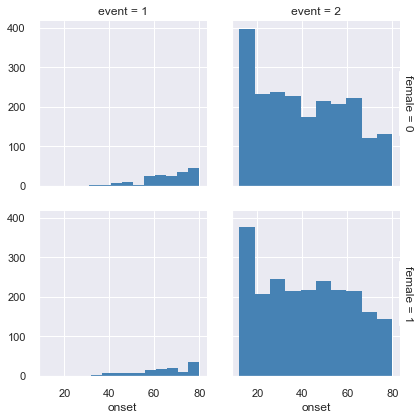

In [861]:
g = sns.FacetGrid(bio2_analysis, row='female', col='event',margin_titles=True)
g.map(plt.hist, 'onset', color='steelblue', lw=0)
plt.show()

heart_dz: 0 == no disease; 1 == heart disease
event: 2 == no disease; 1 == heart disease

In [ ]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

sf = sm.SurvfuncRight(data2["Longevity"], data2["dead"])
sf.summary().head()

In [877]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

sf = sm.SurvfuncRight(bio2_analysis['onset'], bio2_analysis['event'])
sf.summary().head()

,Surv prob,Surv prob SE,num at risk,num events
Time,,,,
12.0,0.956282,0.002979,4712,206.0
13.0,0.907731,0.004190,4609,234.0
14.0,0.858424,0.005012,4492,244.0
15.0,0.810887,0.005589,4370,242.0
16.0,0.763940,0.006014,4249,246.0


groups = data2.groupby("female")
ax = plt.axes()
sexes = ["male","female"]
#Fitting a survival function for each group
for group in groups:
    sf = sm.SurvfuncRight(group[1]["Longevity"], group[1]["dead"])
    sf.plot(ax)
li = ax.get_lines()
plt.figlegend((li[0], li[2]), sexes, "center right")
ax.set_ylabel("Proportion alive")
ax.set_xlabel("Age")
ax.set_autoscaley_on(False)
ax.set_ylim([.85,1])

(0.85, 1)

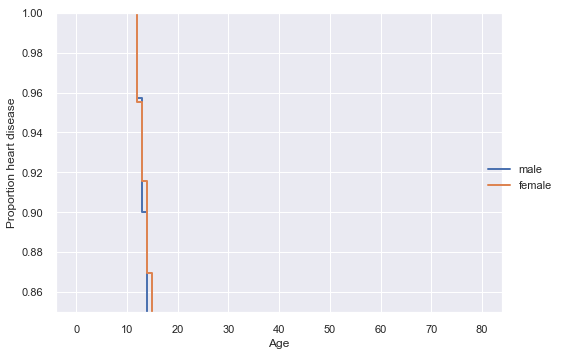

In [876]:
#survival plot (age of onset)for the men and the women
#Code for this plot modified from the statsmodels documentation at http://www.statsmodels.org/dev/duration.html

groups = bio_analysis.groupby('female')
ax = plt.axes()
sexes = ['male','female']
# Fitting a survival function for each group
for group in groups:
    sf = sm.SurvfuncRight(group[1]['onset'], group[1]['event'])
    sf.plot(ax)
li = ax.get_lines()
plt.figlegend((li[0], li[2]), sexes, 'center right')
ax.set_ylabel('Proportion heart disease')
ax.set_xlabel('Age')
ax.set_autoscaley_on(False)
ax.set_ylim([.85,1])

Cox PH model for gender to test if the difference in onset of disease for men and women meaningful

In [878]:
mod = smf.phreg('onset ~  female', # The model
                bio2_analysis, # The data
                status=bio2_analysis['event'].values # Whether values are right-censored
                ) 
rslt = mod.fit()
print(rslt.summary())

                       Results: PHReg
Model:                   PH Reg       Sample size:      3150
Dependent variable:      onset        Num. events:      9115
Ties:                    Breslow                            
------------------------------------------------------------
        log HR log HR SE   HR      t    P>|t|  [0.025 0.975]
------------------------------------------------------------
female -0.3807    0.1161 0.6834 -3.2793 0.0010 0.5443 0.8580
Confidence intervals are for the hazard ratios


In [879]:
bio2_data=bio2_analysis[(bio2_analysis['onset'].notnull()) & (bio2_analysis['female'].notnull()) & (bio2_analysis['event'].notnull())]
bio2_data['predicted'] = rslt.predict(pred_type='surv').predicted_values

print(bio2_data.head())

   RIAGENDR  RIDAGEYR  heart_dz  onset  event  female  predicted
0         1      62.0         0   62.0      2       0   0.926326
1         1      53.0         0   53.0      2       0   0.975347
2         1      78.0         1   78.0      1       0   0.663522
3         2      56.0         0   56.0      2       1   0.980082
5         2      72.0         0   72.0      2       1   0.854469


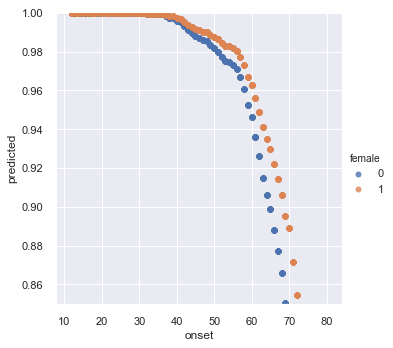

In [880]:
sns.lmplot(x='onset', y='predicted', hue='female', data=bio2_data,fit_reg=False,lowess=True)
plt.ylim(.85, 1)
plt.show()


In [881]:
bio2_data.head()

,RIAGENDR,RIDAGEYR,heart_dz,onset,event,female,predicted
0,1,62.0,0,62.0,2,0,0.926326
1,1,53.0,0,53.0,2,0,0.975347
2,1,78.0,1,78.0,1,0,0.663522
3,2,56.0,0,56.0,2,1,0.980082
5,2,72.0,0,72.0,2,1,0.854469


# conclusions

In [ ]:
X_rbf_g15 = nhanes_model_df[
    ['BPQ050A_9.0', 'BPQ100D_9.0', 'BPQ030_9.0', 
     'BPQ040A_9.0', 'BPQ090D_9.0', 'BPQ070_9.0', 
     'BPQ090D_2.0', 'DS1DS_2.0', 'RIDAGEYR',
     'MCQ365C_2.0', 'BPQ080_2.0', 'DRQSPREP_4.0', 
     'INDFMPIR', 'DRQSPREP_3.0', 'BPQ100D_2.0']]

'BPQ050A_9.0': Now taking prescribed medicine for HBP
'BPQ100D_9.0': Now taking prescribed medicine
'BPQ030_9.0': Told had high blood pressure - 2+ times
'BPQ040A_9.0': Taking prescription for hypertension
'BPQ090D_9.0': Told to take prescriptn for cholesterol
'BPQ070_9.0': When blood cholesterol last checked
'BPQ090D_2.0': Told to take prescriptn for cholesterol
'DS1DS_2.0': Any Dietary Supplements Taken?
'RIDAGEYR' : age   
'MCQ365C_2.0': Doctor told you to reduce salt in diet;  2=rarely
'BPQ080_2.0': Doctor told you - high cholesterol level
'DRQSPREP_4.0': Salt used in preparation?; 4=v often
'INDFMPIR': Ratio of family income to poverty
'DRQSPREP_3.0': Salt used in preparation?; 
'BPQ100D_2.0': Now taking prescribed medicine

In [770]:
y_rbf_g15_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [ ]:
X_poly_r15 = nhanes_model_df[
    ['BPQ100D_9.0', 'BPQ050A_9.0', 'BPQ030_9.0', 
     'RIDAGEYR', 'BPQ040A_9.0', 'BPQ020_2.0', 
     'BPQ090D_2.0', 'INDFMPIR', 'MCQ365C_2.0', 
     'WTDRD1_x', 'DS1DS_2.0', 'log_tot_d_avg', 
     'log_tot_alpha_c_avg', 'log_tot_h20_avg',
     'WTDR2D_x']]

'BPQ100D_9.0', Now taking prescribed medicine
'BPQ050A_9.0', Now taking prescribed medicine for HBP
'BPQ030_9.0', Told had high blood pressure - 2+ times
'RIDAGEYR', age
'BPQ040A_9.0', Taking prescription for hypertension
'BPQ020_2.0', Ever told you had high blood pressure
'BPQ090D_2.0', Told to take prescription for cholesterol
'INDFMPIR', Ratio of family income to poverty
'MCQ365C_2.0', Doctor told you to reduce salt in diet;  2=rarely
'WTDRD1_x', 
'DS1DS_2.0', Any Dietary Supplements Taken?
'log_tot_d_avg', 
'log_tot_alpha_c_avg', 
'log_tot_h20_avg',
'WTDR2D_x'

 Most Biostatistics programs have course lists that look surprisingly like this bootcamp, with emphases on cross-validation, prediction, boosting, and working with Big Data. On the other hand, they also include courses in the scientific method, design of experiments such as clinical trials, and testing hypotheses by building models and interpreting the parameters. 
 
 he first is meta-analysis, a set of methods for combining the results of many studies to get a better estimate of the true effect of a drug or other phenomenon of interest. The second, survival analysis, focuses on predicting when an event will occur. As suggested by the name, the event most often predicted is death, either from disease or old age. 

Statistical significance does not automatically mean clinical significance. Biostatisticians are in the unusual position of wanting to run inferential/interpretive models on what can be rather large datasets. This embarrassment of riches causes trouble because, as you may recall, the signifier of a significant feature in a model is a low p-value, based on the t-value. The t-value is the ratio of the size of the effect to its standard error, and the standard error gets smaller as sample size goes up. Which means that for very large samples, even the tiniest effects can be statistically significant-- even if they are clinically (medically) meaningless. 

imagine a study testing a new drug for lowering blood pressure. The study runs a t-test and finds a statistically significant difference: the new drug lowers BP by an average of 2 points relative to the control. A biostatistician needs to weigh this finding against the clinical guidelines for blood pressure variability to know whether this makes the drug worth pursuing.

implementations of Bayes’ Rule. A lot of the time, biostatisticians want to compute the probability of various complex outcomes (developing a disease when a person has characteristics X, Y, and Z). Computing the unknown distribution of these probabilities is computationally non-trivial, so biostatisticians use a nifty set of algorithms called Markov chain Monte Carlo (MCMC) to short-circuit the problem. Again, many other fields use MCMC, but it has particular relevance to biostatisticians’ concerns.

Modeling time-to-event data is called ‘survival’ analysis, because the methods used were initially developed to create the actuarial tables used by insurers to predict risk of death in potential insurees.

‘event’ never occurs? Or occurs outside of our window of observation? It isn’t plausible to set ‘time-to-event’ to infinity or to zero in those situations. Instead, the value of the time-to-event variable is set to the maximum observable value. 

Right censored data: know the starting point but event has not occurred.

A second, ‘status’ variable is used to indicate whether the event happened at all. This is called right censored data: If the event never happened, all we know is that the time to event is greater than the maximum observable value

Left censosred data: know the end data but not starting

 most common models for time-to-event data is the Cox Proportional Hazards model. This model bears many similarities to logistic regression. It estimates the conditional probability of the event occurring during a given interval, and gives information about how other features in the data (age, gender, etc) affect that probability.